In [2]:
import numpy as np
import pandas as pd
import datetime
import matplotlib.pyplot as plt
import mplfinance as mpf

In [3]:
etf_info = pd.read_csv('./data/etf_info.csv', encoding='EUC-KR', index_col=0)
etf_info.head()

,펀드명,분류,벤치마크명,설정일
코드,,,,
A377990,TIGER Fn신재생에너지,4.국내-전략,FnGuide 신재생에너지 지수,2021-03-04
A376410,TIGER 탄소효율그린뉴딜,03.국내-전략,KRX/S&P 탄소효율그린뉴딜지수,2021-02-04
A364960,TIGER KRX BBIG K-뉴딜,03.국내-전략,KRX BBIG K-뉴딜,2020-10-06
A364980,TIGER KRX2차전지K-뉴딜,03.국내-전략,KRX 2차전지 K-뉴딜 지수,2020-10-06
A364970,TIGER KRX바이오K-뉴딜,03.국내-전략,KRX 바이오 K-뉴딜 지수,2020-10-06


In [4]:
etf_data = pd.read_csv('./data/etf_data.csv', encoding='EUC-KR', parse_dates= ['tdate'])
etf_data.head()

,tdate,etf_code,data_name,value
0,2012-01-02,A091220,거래량,5114
1,2012-01-02,A091220,고가,7240
2,2012-01-02,A091220,시가,7240
3,2012-01-02,A091220,저가,7055
4,2012-01-02,A091220,종가,7110


In [5]:
stock_data = pd.read_csv('./data/stock_data.csv', encoding='EUC-KR', parse_dates= ['tdate'])
stock_data.head()

,tdate,stock_code,data_name,value
0,2006-01-02,A006260,거래량,99233
1,2006-01-02,A009830,거래량,1143367
2,2006-01-02,A010060,거래량,77502
3,2006-01-02,A011930,거래량,727141
4,2006-01-02,A018000,거래량,957108


In [6]:
stock_sector_data = pd.read_csv('./data/stock_sector_data.csv', encoding='EUC-KR', parse_dates=['Unnamed: 0'])
stock_sector_data.head()

,Unnamed: 0,A006260,A009830,A010060,A011930,A018000,A034020,A081000,A086390,A100090,...,A077360,A096640,A033170,A123260,A114810,A141000,A241770,A255440,A123860,A006350
0,2006-01-31,"코스피 전기,전자",코스피 화학,코스피 화학,코스피 기계,코스닥 제조,코스피 기계,코스피 화학,NaN,NaN,...,코스닥 IT H/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,코스피 은행
1,2006-02-28,"코스피 전기,전자",코스피 화학,코스피 화학,코스피 기계,코스닥 제조,코스피 기계,코스피 화학,NaN,NaN,...,코스닥 IT H/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,코스피 은행
2,2006-03-31,"코스피 전기,전자",코스피 화학,코스피 화학,코스피 기계,코스닥 제조,코스피 기계,코스피 화학,NaN,NaN,...,코스닥 IT H/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,코스피 은행
3,2006-04-30,"코스피 전기,전자",코스피 화학,코스피 화학,코스피 기계,코스닥 제조,코스피 기계,코스피 화학,NaN,NaN,...,코스닥 IT H/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,코스피 은행
4,2006-05-31,"코스피 전기,전자",코스피 화학,코스피 화학,코스피 기계,코스닥 제조,코스피 기계,코스피 화학,NaN,NaN,...,코스닥 IT H/W,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,코스피 은행


In [7]:
etf_ohlcv = etf_data.set_index(['tdate', 'etf_code', 'data_name'])['value'].unstack()
etf_ohlcv.head()

data_name               거래량     고가     시가     저가     종가
tdate      etf_code                                    
2012-01-02 A091220     5114   7240   7240   7055   7110
           A091230     8093  14895  14500  14500  14890
           A098560     7951   7855   7855   7710   7735
           A102110   165762  24300  24300  23930  24130
           A105010      195   5130   5130   4955   4955

In [8]:
etf_close = etf_ohlcv['종가'].unstack()
etf_weekly = etf_close.resample('W').last()
etf_weekly

etf_code,A091220,A091230,A098560,A102110,A105010,A114820,A117690,A123310,A123320,A130680,...,A371160,A371450,A371460,A371470,A376410,A377990,A381170,A381180,A387270,A387280
tdate,,,,,,,,,,,,,,,,,,,,,
2012-01-08,7055.0,14970.0,7595.0,24325.0,5110.0,104885.0,10725.0,8560.0,10180.0,11120.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-15,7240.0,15080.0,7430.0,24840.0,5270.0,104935.0,11010.0,8395.0,10595.0,10990.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-22,7980.0,15525.0,7430.0,25930.0,5395.0,104875.0,11310.0,8015.0,11535.0,11015.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-29,8125.0,15655.0,7510.0,26105.0,5400.0,105000.0,11375.0,7970.0,11735.0,10955.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-02-05,8345.0,15675.0,7355.0,26130.0,5460.0,105110.0,11545.0,7950.0,11750.0,10570.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-05-30,8010.0,37665.0,9845.0,42620.0,3510.0,111010.0,17160.0,4205.0,26275.0,3020.0,...,9990.0,10285.0,12740.0,13015.0,10165.0,10160.0,9825.0,9515.0,9955.0,10170.0
2021-06-06,8155.0,38545.0,10015.0,43230.0,3735.0,110820.0,17345.0,4150.0,27040.0,3115.0,...,10130.0,10090.0,13315.0,13160.0,10310.0,10780.0,9675.0,9445.0,9985.0,10280.0
2021-06-13,8010.0,37960.0,10415.0,43260.0,3805.0,110575.0,17130.0,4140.0,27050.0,3170.0,...,9920.0,10585.0,13895.0,13295.0,10300.0,10720.0,9995.0,9545.0,10365.0,10370.0


In [9]:
etf_close.head()

etf_code,A091220,A091230,A098560,A102110,A105010,A114820,A117690,A123310,A123320,A130680,...,A371160,A371450,A371460,A371470,A376410,A377990,A381170,A381180,A387270,A387280
tdate,,,,,,,,,,,,,,,,,,,,,
2012-01-02,7110.0,14890.0,7735.0,24130.0,4955.0,104870.0,10560.0,8645.0,10010.0,10845.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-03,7365.0,15135.0,7750.0,24890.0,4995.0,104820.0,10785.0,8375.0,10635.0,11040.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-04,7220.0,15115.0,7760.0,24745.0,5100.0,104840.0,10690.0,8430.0,10520.0,11185.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-05,7150.0,14980.0,7745.0,24690.0,5130.0,104900.0,10710.0,8440.0,10490.0,11320.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-06,7055.0,14970.0,7595.0,24325.0,5110.0,104885.0,10725.0,8560.0,10180.0,11120.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
etf_info.columns.values

array(['펀드명', '분류', '벤치마크명', '설정일'], dtype=object)

In [11]:
category = list(set(etf_info['분류']))
category.sort()
category

['01.국내-시장대표',
 '02.국내-업종섹터',
 '03.국내-전략',
 '04.국내-규모',
 '05.국내-채권',
 '07.국내-혼합',
 '08.국내-레버리지/인버스',
 '09.국내-액티브',
 '10.해외-시장대표',
 '11.해외-업종섹터',
 '12.해외-전략',
 '13.해외-채권',
 '14.해외-원자재',
 '15.해외-부동산',
 '17.해외-레버리지/인버스',
 '18.해외-통화',
 '4.국내-전략']

In [12]:
etf_info[etf_info['분류']=='01.국내-시장대표']

,펀드명,분류,벤치마크명,설정일
코드,,,,
A310970,TIGER MSCI KOREA TR,01.국내-시장대표,MSCI KOREA Gross TR,2018-11-19
A310960,TIGER 200TR,01.국내-시장대표,KOSPI 200 TR,2018-11-19
A292160,TIGER KRX300,01.국내-시장대표,KRX 300지수,2018-03-23
A277630,TIGER 코스피,01.국내-시장대표,코스피 지수,2017-08-30
A252000,TIGER 200동일가중,01.국내-시장대표,코스피 200 동일가중지수,2016-09-19
A232080,TIGER 코스닥150,01.국내-시장대표,코스닥150,2015-11-11
A228820,TIGER KTOP30,01.국내-시장대표,KTOP30,2015-10-13
A102110,TIGER 200,01.국내-시장대표,KOSPI200,2008-04-02


In [13]:
etf_data.columns

Index(['tdate', 'etf_code', 'data_name', 'value'], dtype='object')

In [14]:
tiger_200 = etf_close.loc[:,['A102110']]
tiger_200

etf_code,A102110
tdate,
2012-01-02,24130.0
2012-01-03,24890.0
2012-01-04,24745.0
2012-01-05,24690.0
2012-01-06,24325.0
...,...
2021-06-17,43400.0
2021-06-18,43495.0
2021-06-21,43085.0


In [15]:
etf_ohlcv

data_name               거래량     고가     시가     저가     종가
tdate      etf_code                                    
2012-01-02 A091220     5114   7240   7240   7055   7110
           A091230     8093  14895  14500  14500  14890
           A098560     7951   7855   7855   7710   7735
           A102110   165762  24300  24300  23930  24130
           A105010      195   5130   5130   4955   4955
...                     ...    ...    ...    ...    ...
2021-06-23 A377990    35732  10790  10785  10680  10680
           A381170   871694  10645  10540  10540  10645
           A381180   713853   9810   9710   9710   9785
           A387270   164694  10760  10675  10670  10760
           A387280   235759  10740  10715  10610  10725

[166187 rows x 5 columns]

In [17]:
etf_data_tiger200 = etf_data[etf_data['etf_code']=='A102110']
tiger200_ohlcv = etf_data_tiger200.set_index(['tdate', 'etf_code', 'data_name'])['value'].unstack()
tiger200_ohlcv.columns = ['Volume', 'High', 'Open', 'Low', 'Close']
tiger200_ohlcv = tiger200_ohlcv.reset_index(['etf_code'])
tiger200_ohlcv = tiger200_ohlcv.iloc[:,1:6]
tiger200_ohlcv

,Volume,High,Open,Low,Close
tdate,,,,,
2012-01-02,165762,24300,24300,23930,24130
2012-01-03,365936,24890,24300,24300,24890
2012-01-04,129764,25000,25000,24740,24745
2012-01-05,1532245,24875,24750,24655,24690
2012-01-06,282066,24720,24500,24040,24325
...,...,...,...,...,...
2021-06-17,713778,43565,43500,43215,43400
2021-06-18,303514,43620,43450,43380,43495
2021-06-21,780890,43240,43045,42900,43085


In [18]:
y_and_w = list()

for i in range(len(tiger200_ohlcv.index)):
    y = tiger200_ohlcv.index[i].year
    m = tiger200_ohlcv.index[i].month
    d = tiger200_ohlcv.index[i].day    
    info = datetime.date(y, m, d).isocalendar()[0:2]
    y_and_w.append(info)

In [20]:
len(y_and_w)

2333

In [22]:
tiger200_ohlcv['ynw'] = y_and_w
tiger200_ohlcv.head()

,Volume,High,Open,Low,Close,ynw
tdate,,,,,,
2012-01-02,165762,24300,24300,23930,24130,"(2012, 1)"
2012-01-03,365936,24890,24300,24300,24890,"(2012, 1)"
2012-01-04,129764,25000,25000,24740,24745,"(2012, 1)"
2012-01-05,1532245,24875,24750,24655,24690,"(2012, 1)"
2012-01-06,282066,24720,24500,24040,24325,"(2012, 1)"


In [29]:
tiger200_ohlcv['ynw'].values

array([(2012, 1), (2012, 1), (2012, 1), ..., (2021, 25), (2021, 25),
       (2021, 25)], dtype=object)

In [50]:
weeks = list(set(tiger200_ohlcv['ynw'].values))
weeks.sort()
weeks

[(2012, 1),
 (2012, 2),
 (2012, 3),
 (2012, 4),
 (2012, 5),
 (2012, 6),
 (2012, 7),
 (2012, 8),
 (2012, 9),
 (2012, 10),
 (2012, 11),
 (2012, 12),
 (2012, 13),
 (2012, 14),
 (2012, 15),
 (2012, 16),
 (2012, 17),
 (2012, 18),
 (2012, 19),
 (2012, 20),
 (2012, 21),
 (2012, 22),
 (2012, 23),
 (2012, 24),
 (2012, 25),
 (2012, 26),
 (2012, 27),
 (2012, 28),
 (2012, 29),
 (2012, 30),
 (2012, 31),
 (2012, 32),
 (2012, 33),
 (2012, 34),
 (2012, 35),
 (2012, 36),
 (2012, 37),
 (2012, 38),
 (2012, 39),
 (2012, 40),
 (2012, 41),
 (2012, 42),
 (2012, 43),
 (2012, 44),
 (2012, 45),
 (2012, 46),
 (2012, 47),
 (2012, 48),
 (2012, 49),
 (2012, 50),
 (2012, 51),
 (2012, 52),
 (2013, 1),
 (2013, 2),
 (2013, 3),
 (2013, 4),
 (2013, 5),
 (2013, 6),
 (2013, 7),
 (2013, 8),
 (2013, 9),
 (2013, 10),
 (2013, 11),
 (2013, 12),
 (2013, 13),
 (2013, 14),
 (2013, 15),
 (2013, 16),
 (2013, 17),
 (2013, 18),
 (2013, 19),
 (2013, 20),
 (2013, 21),
 (2013, 22),
 (2013, 23),
 (2013, 24),
 (2013, 25),
 (2013, 26),
 (20

In [64]:
label = pd.DataFrame(weeks)
label['012'] = [0]*len(label[0])
label

,0,1,012
0,2012,1,0
1,2012,2,0
2,2012,3,0
3,2012,4,0
4,2012,5,0
...,...,...,...
489,2021,21,0
490,2021,22,0
491,2021,23,0
492,2021,24,0


In [68]:
tiger200_c = tiger200_ohlcv.loc[:,['Close', 'ynw']]
tiger200_c

,Close,ynw
tdate,,
2012-01-02,24130,"(2012, 1)"
2012-01-03,24890,"(2012, 1)"
2012-01-04,24745,"(2012, 1)"
2012-01-05,24690,"(2012, 1)"
2012-01-06,24325,"(2012, 1)"
...,...,...
2021-06-17,43400,"(2021, 24)"
2021-06-18,43495,"(2021, 24)"
2021-06-21,43085,"(2021, 25)"


             Volume   High   Open    Low  Close        ynw
tdate                                                     
2012-01-02   165762  24300  24300  23930  24130  (2012, 1)
2012-01-03   365936  24890  24300  24300  24890  (2012, 1)
2012-01-04   129764  25000  25000  24740  24745  (2012, 1)
2012-01-05  1532245  24875  24750  24655  24690  (2012, 1)
2012-01-06   282066  24720  24500  24040  24325  (2012, 1)


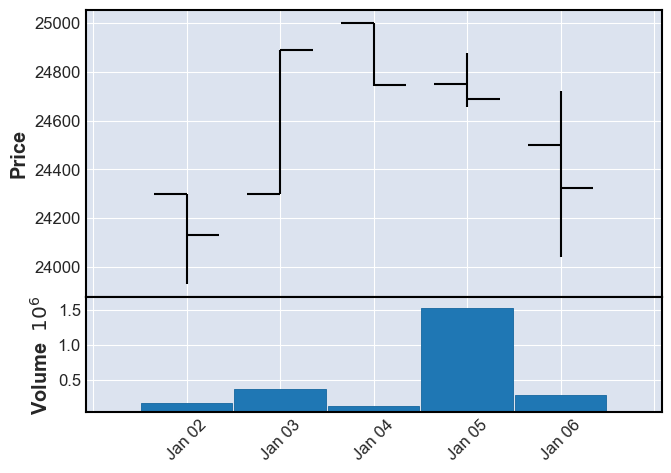

상승?0 횡보?1 하락?21
0 done
            Volume   High   Open    Low  Close        ynw
tdate                                                    
2012-01-09  170488  24325  24325  23840  24010  (2012, 2)
2012-01-10  128614  24590  24190  24190  24460  (2012, 2)
2012-01-11  212035  24500  24500  24315  24390  (2012, 2)
2012-01-12  156859  24610  24420  24270  24600  (2012, 2)
2012-01-13  277956  24920  24550  24550  24840  (2012, 2)


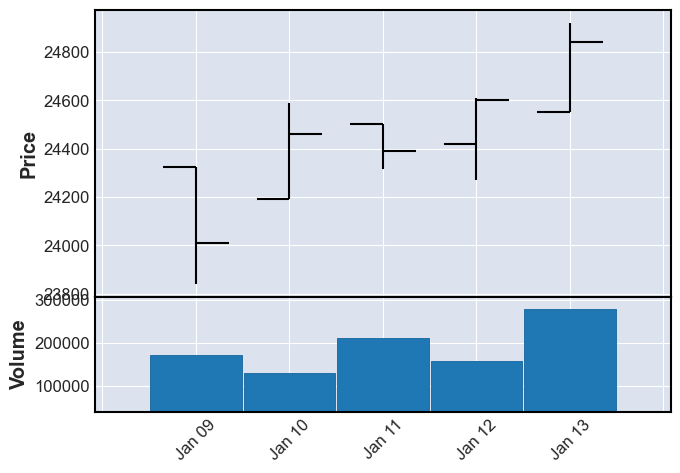

상승?0 횡보?1 하락?20
1 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2012-01-16   173164  24735  24735  24345  24555  (2012, 3)
2012-01-17   733488  25085  24850  24845  25085  (2012, 3)
2012-01-18   139403  25170  25110  24970  25075  (2012, 3)
2012-01-19  1129572  25465  25195  25195  25450  (2012, 3)
2012-01-20   182045  26035  25600  25550  25930  (2012, 3)


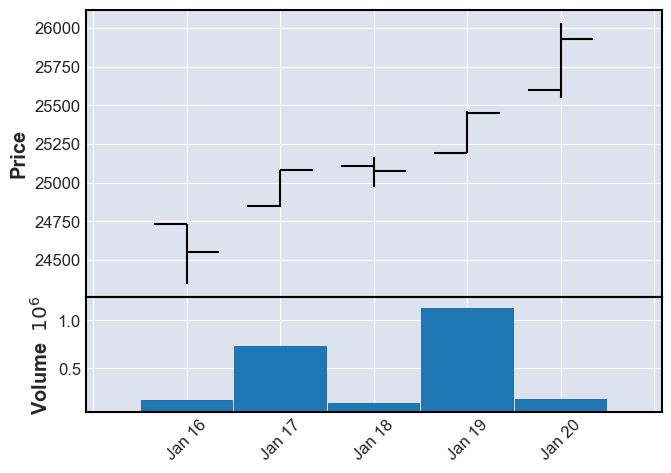

상승?0 횡보?1 하락?20
2 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2012-01-25  2762669  26370  25990  25930  26035  (2012, 4)
2012-01-26   953614  26145  26100  26000  26055  (2012, 4)
2012-01-27   113343  26200  26015  25985  26105  (2012, 4)


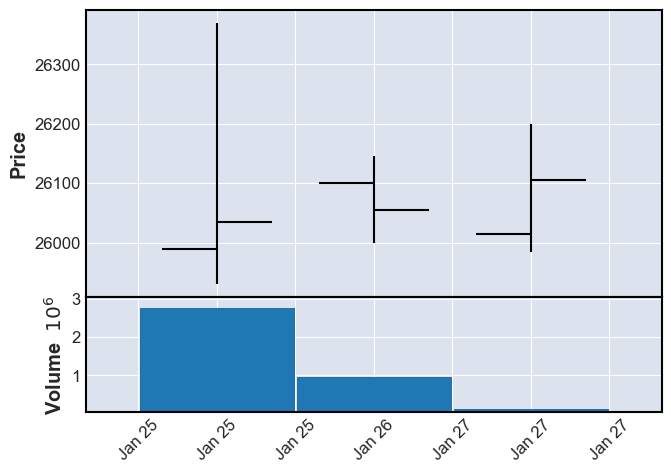

상승?0 횡보?1 하락?20
3 done
            Volume   High   Open    Low  Close        ynw
tdate                                                    
2012-01-30  149087  26110  26110  25785  25835  (2012, 5)
2012-01-31  894140  26100  25825  25755  25955  (2012, 5)
2012-02-01  133835  26170  25955  25800  26015  (2012, 5)
2012-02-02  213021  26500  26300  26280  26300  (2012, 5)
2012-02-03  100483  26260  26260  26090  26130  (2012, 5)


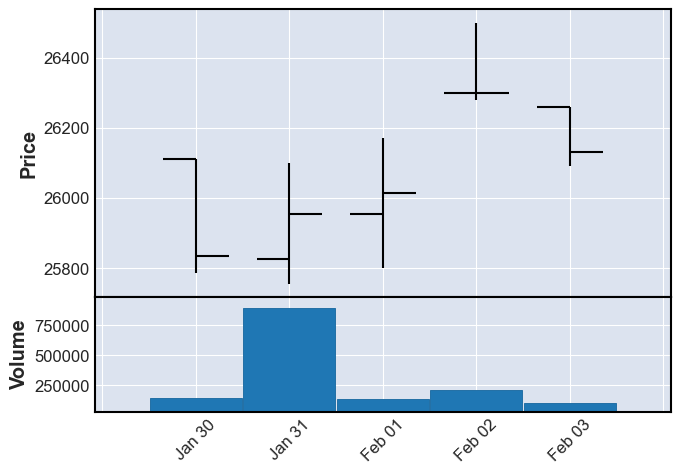

상승?0 횡보?1 하락?20
4 done
            Volume   High   Open    Low  Close        ynw
tdate                                                    
2012-02-06  179363  26480  26450  26125  26220  (2012, 6)
2012-02-07  441064  26420  26260  26175  26240  (2012, 6)
2012-02-08  116295  26555  26260  26260  26550  (2012, 6)
2012-02-09  106470  26650  26550  26185  26650  (2012, 6)
2012-02-10   94645  26700  26700  26300  26385  (2012, 6)


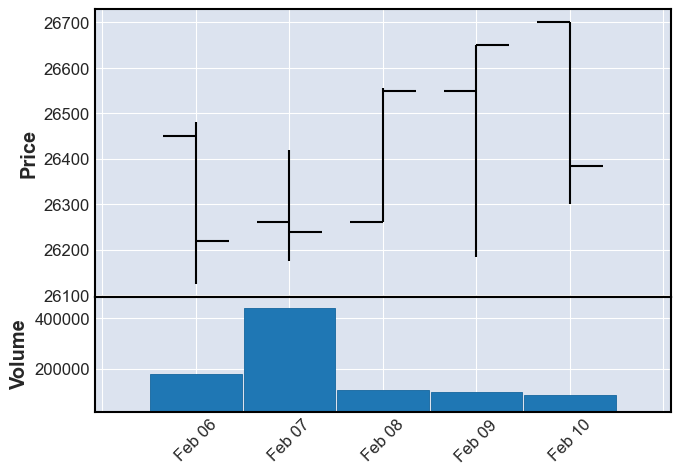

상승?0 횡보?1 하락?20
5 done
            Volume   High   Open    Low  Close        ynw
tdate                                                    
2012-02-13  142741  26630  26335  26335  26500  (2012, 7)
2012-02-14  132268  26515  26510  26355  26465  (2012, 7)
2012-02-15  114369  26855  26470  26470  26800  (2012, 7)
2012-02-16  149184  26670  26670  26440  26490  (2012, 7)
2012-02-17  120416  26935  26790  26770  26850  (2012, 7)


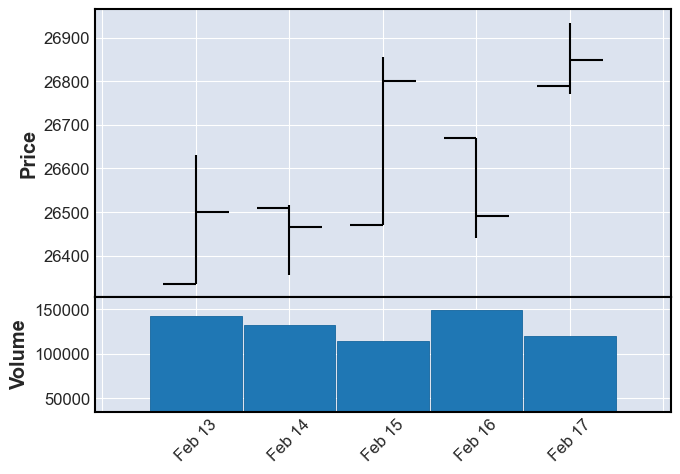

상승?0 횡보?1 하락?20
6 done
            Volume   High   Open    Low  Close        ynw
tdate                                                    
2012-02-20  110500  27250  27120  26890  26935  (2012, 8)
2012-02-21  215894  27000  26990  26665  26940  (2012, 8)
2012-02-22   75287  26950  26900  26725  26895  (2012, 8)
2012-02-23  223687  26800  26800  26560  26675  (2012, 8)
2012-02-24  176868  26840  26680  26525  26820  (2012, 8)


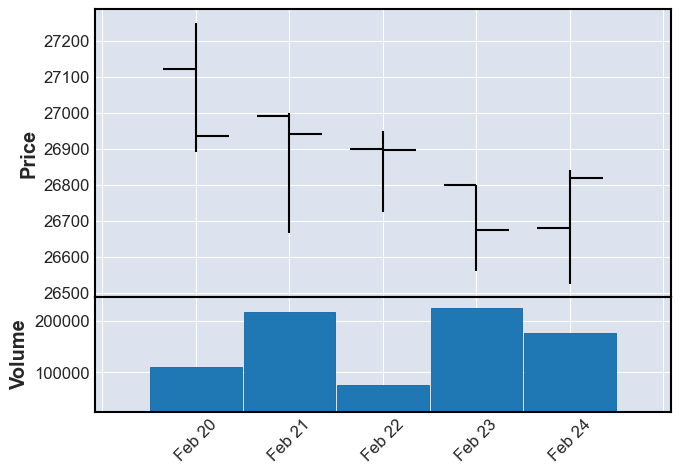

상승?0 횡보?1 하락?22
7 done
            Volume   High   Open    Low  Close        ynw
tdate                                                    
2012-02-27  126973  26780  26780  26360  26405  (2012, 9)
2012-02-28   90443  26635  26500  26445  26625  (2012, 9)
2012-02-29  173839  27025  26730  26730  26950  (2012, 9)
2012-03-02   98268  27150  26955  26955  27000  (2012, 9)


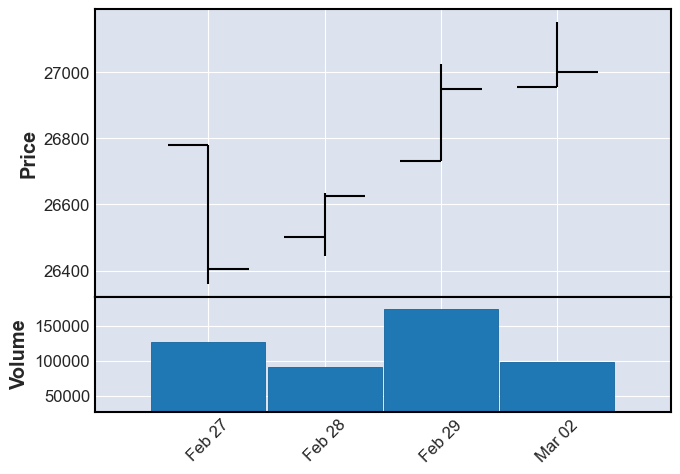

상승?0 횡보?1 하락?20
8 done
              Volume   High   Open    Low  Close         ynw
tdate                                                       
2012-03-05    276940  27000  27000  26675  26780  (2012, 10)
2012-03-06    240300  26865  26760  26415  26550  (2012, 10)
2012-03-07    198583  26350  26300  26170  26280  (2012, 10)
2012-03-08  12445518  26630  26380  26215  26630  (2012, 10)
2012-03-09    144492  26955  26780  26570  26900  (2012, 10)


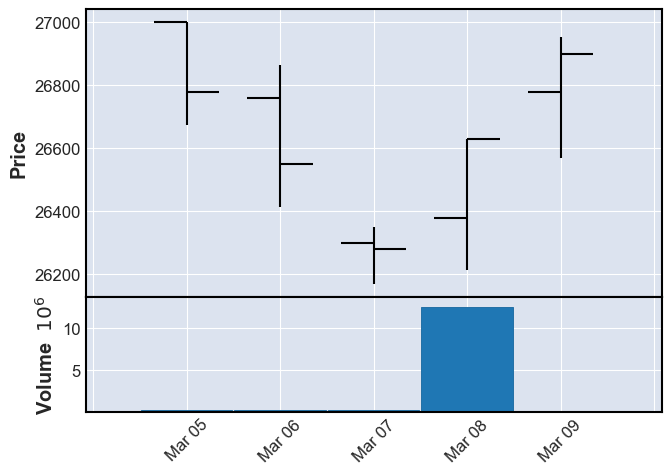

상승?0 횡보?1 하락?21
9 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-03-12   94898  26905  26900  26645  26710  (2012, 11)
2012-03-13  279765  27110  26780  26780  27015  (2012, 11)
2012-03-14   91052  27470  27240  27240  27320  (2012, 11)
2012-03-15  130122  27385  27310  27230  27265  (2012, 11)
2012-03-16  159624  27425  27350  27175  27195  (2012, 11)


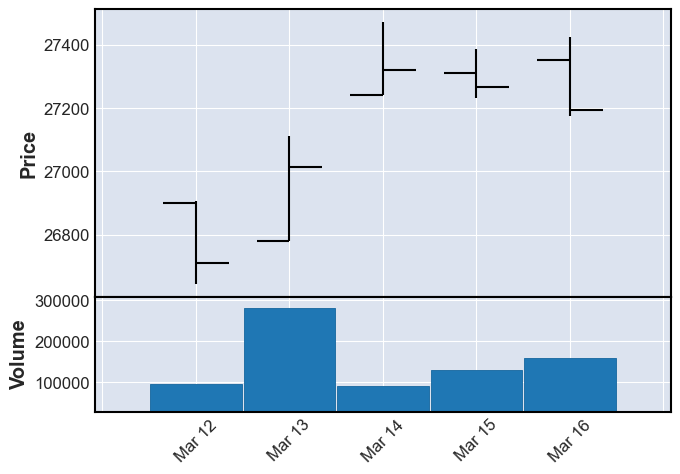

상승?0 횡보?1 하락?20
10 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-03-19  158697  27375  27230  27145  27315  (2012, 12)
2012-03-20  210214  27400  27315  27130  27245  (2012, 12)
2012-03-21  298221  27195  27165  26925  27130  (2012, 12)
2012-03-22  244471  27125  27080  26955  27120  (2012, 12)
2012-03-23  136429  27095  27095  26890  26970  (2012, 12)


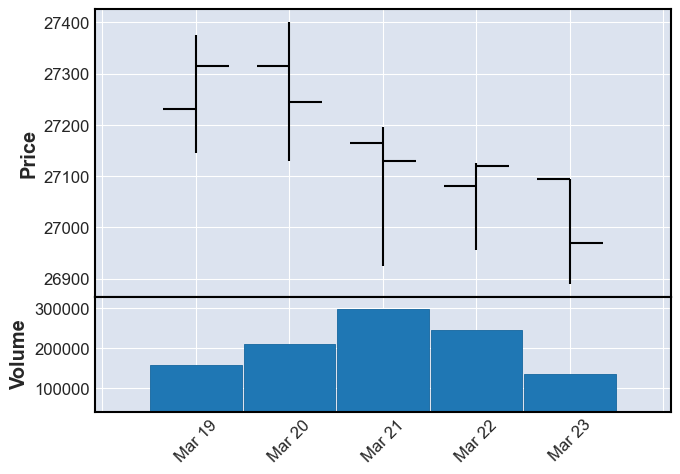

상승?0 횡보?1 하락?22
11 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-03-26  130881  27250  27120  26930  27035  (2012, 13)
2012-03-27  240230  27360  27250  27200  27305  (2012, 13)
2012-03-28  149579  27335  27325  27170  27260  (2012, 13)
2012-03-29  158055  27140  27140  26900  27020  (2012, 13)
2012-03-30  281053  27030  27020  26805  27030  (2012, 13)


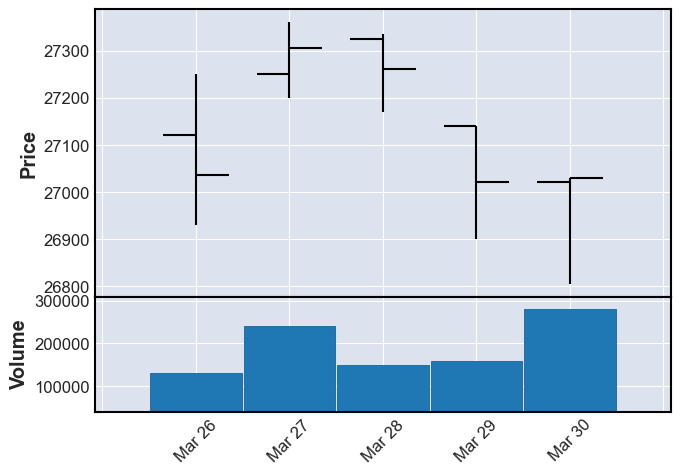

상승?0 횡보?1 하락?21
12 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-04-02   410553  27135  27100  26940  27085  (2012, 14)
2012-04-03  1122793  27545  27270  27235  27530  (2012, 14)
2012-04-04   270930  27480  27465  27190  27240  (2012, 14)
2012-04-05    91782  27330  27100  26900  27330  (2012, 14)
2012-04-06    99120  27430  27430  27180  27290  (2012, 14)


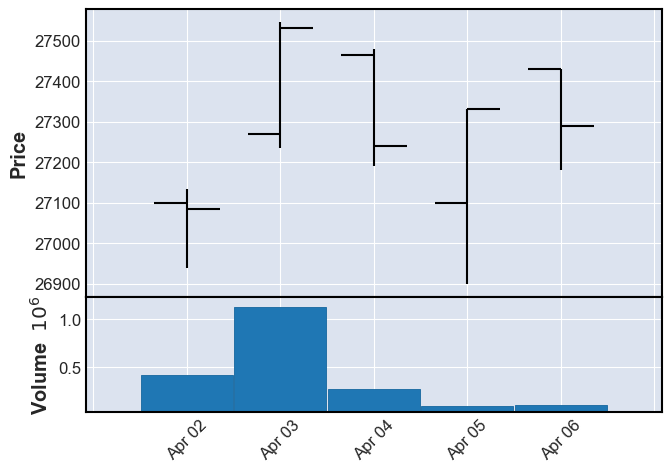

상승?0 횡보?1 하락?20
13 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-04-09  147358  27250  27250  26840  26855  (2012, 15)
2012-04-10   58697  27075  26875  26810  26890  (2012, 15)
2012-04-12  637838  26890  26890  26500  26755  (2012, 15)
2012-04-13  355558  27080  27025  26870  26940  (2012, 15)


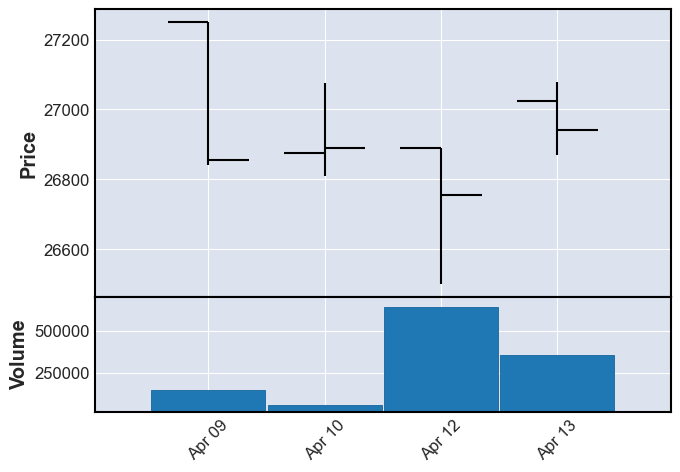

상승?0 횡보?1 하락?21
14 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-04-16  192010  26900  26900  26585  26740  (2012, 16)
2012-04-17  157838  26805  26755  26595  26655  (2012, 16)
2012-04-18  303018  27065  27000  26885  26910  (2012, 16)
2012-04-19  164368  26980  26980  26795  26870  (2012, 16)
2012-04-20  541782  26855  26855  26465  26500  (2012, 16)


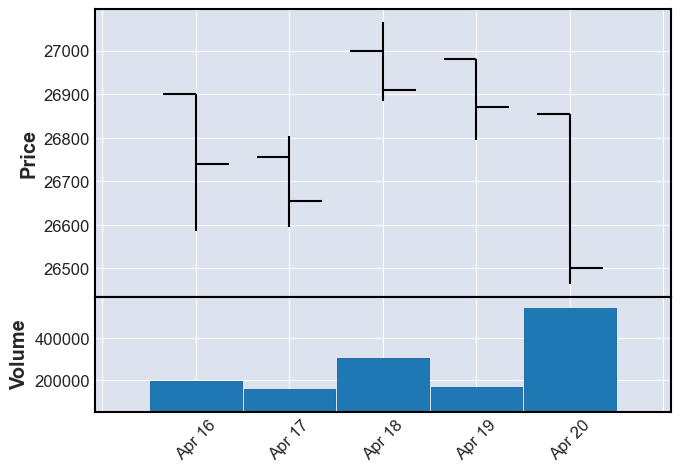

상승?0 횡보?1 하락?22
15 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-04-23  578130  26565  26510  26365  26465  (2012, 17)
2012-04-24  678609  26465  26350  26225  26315  (2012, 17)
2012-04-25  271451  26590  26530  26365  26405  (2012, 17)
2012-04-26  958986  26600  26575  26350  26470  (2012, 17)
2012-04-27  760153  26440  26440  26230  26365  (2012, 17)


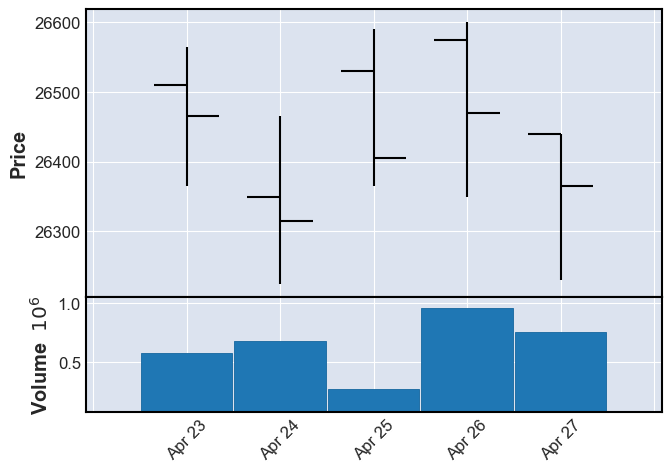

상승?0 횡보?1 하락?21
16 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-04-30  150193  26515  26500  26395  26455  (2012, 18)
2012-05-02  207100  26655  26600  26540  26645  (2012, 18)
2012-05-03  187754  26645  26645  26570  26585  (2012, 18)
2012-05-04  142349  26530  26530  26385  26425  (2012, 18)


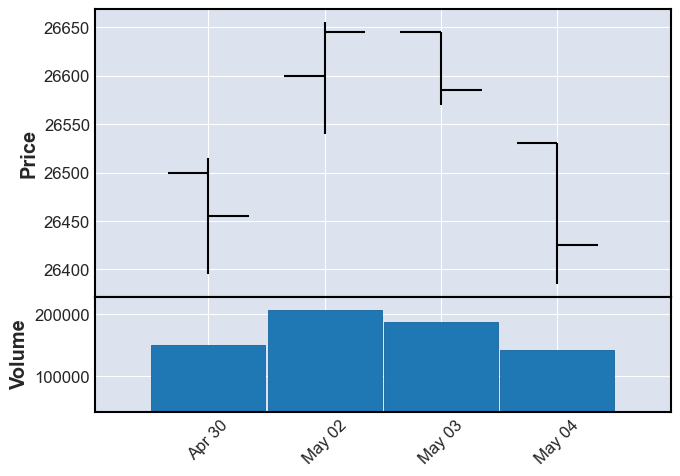

상승?0 횡보?1 하락?21
17 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-05-07  604323  26295  26295  25920  25980  (2012, 19)
2012-05-08  269014  26260  26260  26070  26155  (2012, 19)
2012-05-09  296683  26075  25970  25865  25950  (2012, 19)
2012-05-10  192940  25945  25945  25710  25820  (2012, 19)
2012-05-11  828610  25810  25810  25420  25425  (2012, 19)


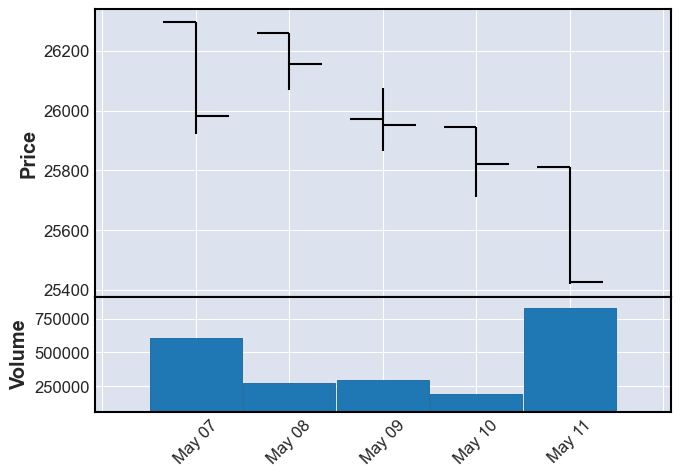

상승?0 횡보?1 하락?22
18 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-05-14  446806  25575  25575  25260  25435  (2012, 20)
2012-05-15  574833  25335  25300  25080  25280  (2012, 20)
2012-05-16  842413  25240  25240  24450  24450  (2012, 20)
2012-05-17  538035  24610  24505  24325  24400  (2012, 20)
2012-05-18  446960  24160  24160  23555  23675  (2012, 20)


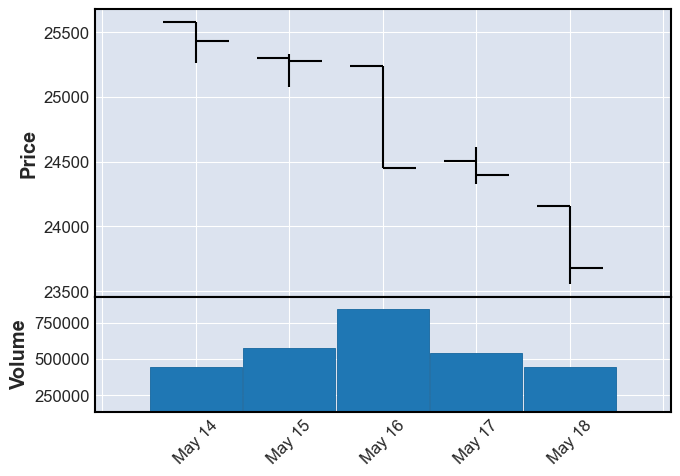

상승?0 횡보?1 하락?22
19 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-05-21  368875  23945  23850  23750  23895  (2012, 21)
2012-05-22  177151  24305  24265  24065  24295  (2012, 21)
2012-05-23  237602  24260  24260  23820  24000  (2012, 21)
2012-05-24  389380  24130  24000  23885  24130  (2012, 21)
2012-05-25   97576  24300  24140  24070  24165  (2012, 21)


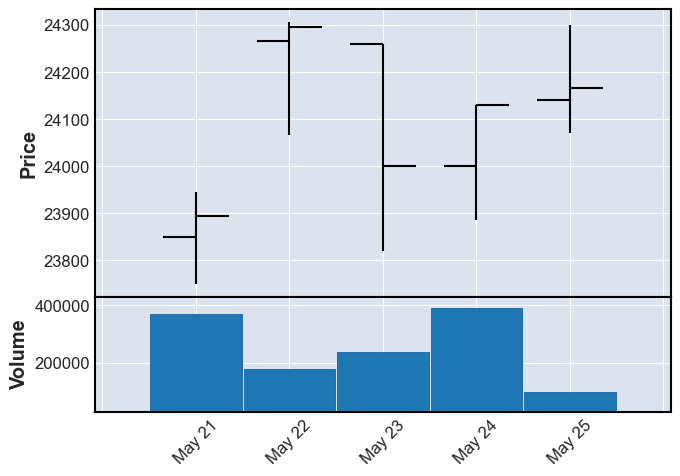

상승?0 횡보?1 하락?20
20 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-05-29  319717  24590  24165  24090  24540  (2012, 22)
2012-05-30  204835  24600  24600  24225  24450  (2012, 22)
2012-05-31  145901  24445  24445  23995  24395  (2012, 22)
2012-06-01  234385  24395  24395  24075  24335  (2012, 22)


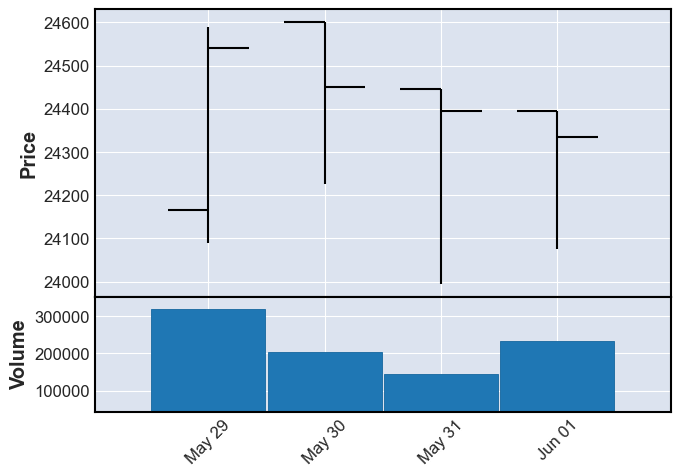

상승?0 횡보?1 하락?22
21 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-06-04   97661  23785  23400  23400  23685  (2012, 23)
2012-06-05  149115  24000  23800  23800  24000  (2012, 23)
2012-06-07  209403  24665  24465  24445  24580  (2012, 23)
2012-06-08  240863  24700  24700  24405  24460  (2012, 23)


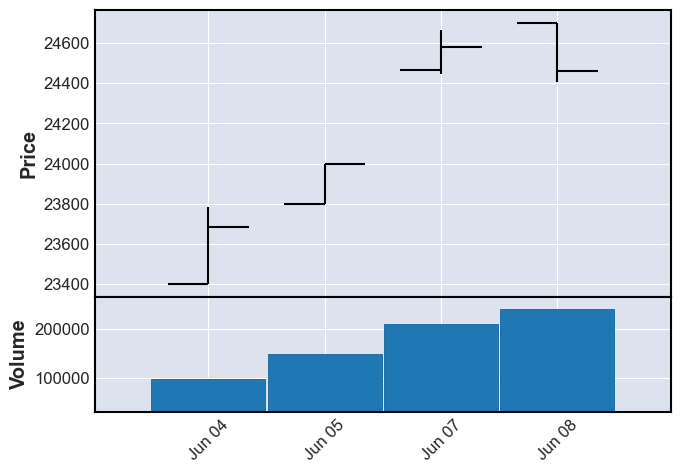

상승?0 횡보?1 하락?20
22 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-06-11  117438  24895  24720  24720  24855  (2012, 24)
2012-06-12  562048  24745  24600  24515  24695  (2012, 24)
2012-06-13  131117  24850  24850  24625  24800  (2012, 24)
2012-06-14   82572  24810  24635  24635  24810  (2012, 24)
2012-06-15  177728  24815  24815  24570  24715  (2012, 24)


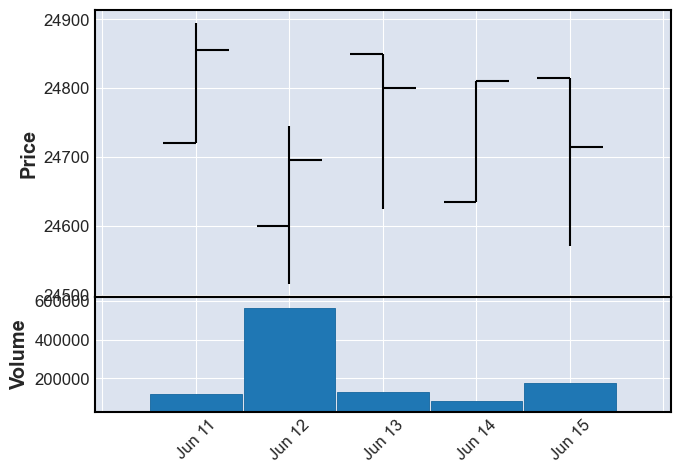

상승?0 횡보?1 하락?22
23 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-06-18  216238  25500  24900  24900  25230  (2012, 25)
2012-06-19  181947  25200  25115  25045  25180  (2012, 25)
2012-06-20  153644  25365  25200  25200  25330  (2012, 25)
2012-06-21  163045  25400  25400  25020  25120  (2012, 25)
2012-06-22  387620  24900  24900  24385  24510  (2012, 25)


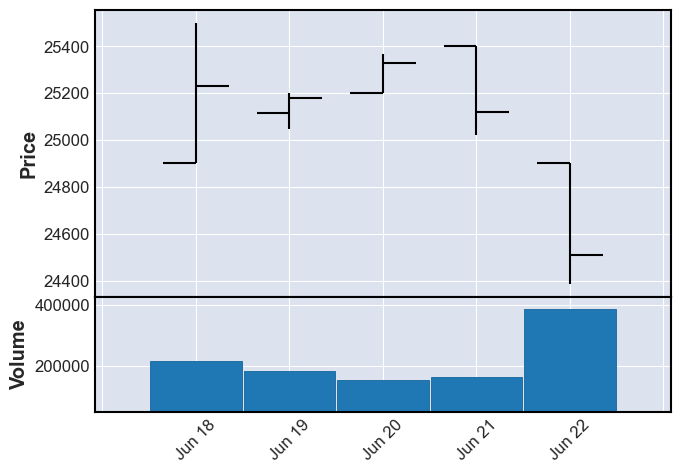

상승?0 횡보?1 하락?22
24 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-06-25   646603  24600  24600  23945  24080  (2012, 26)
2012-06-26   355282  24100  24045  23920  23985  (2012, 26)
2012-06-27   590446  24080  24080  23680  24020  (2012, 26)
2012-06-28  1384834  24245  24245  23850  24015  (2012, 26)
2012-06-29   309637  24535  23865  23790  24535  (2012, 26)


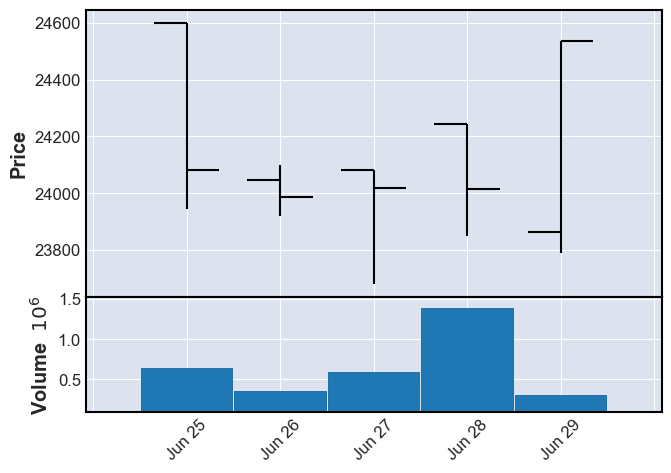

상승?0 횡보?1 하락?20
25 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-07-02  158630  24655  24645  24455  24455  (2012, 27)
2012-07-03   50581  24740  24455  24355  24700  (2012, 27)
2012-07-04  180470  24950  24950  24720  24860  (2012, 27)
2012-07-05  791048  24790  24760  24685  24780  (2012, 27)
2012-07-06  418715  24795  24745  24435  24555  (2012, 27)


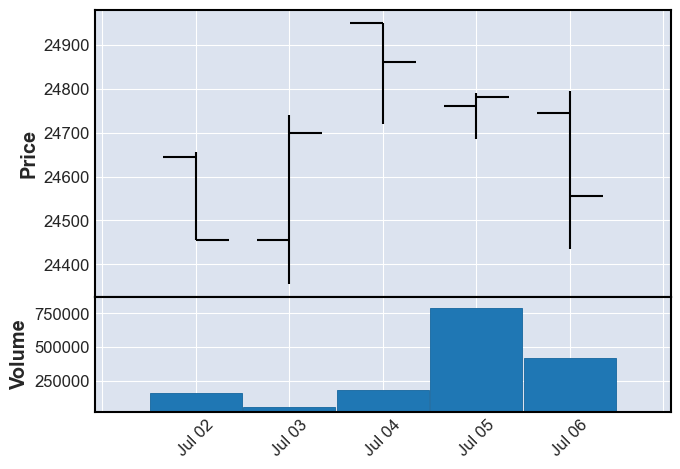

상승?0 횡보?1 하락?21
26 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-07-09   506161  24420  24420  24155  24230  (2012, 28)
2012-07-10   218308  24395  24395  24035  24145  (2012, 28)
2012-07-11   195261  24145  24145  23950  24100  (2012, 28)
2012-07-12   408902  24250  24250  23630  23630  (2012, 28)
2012-07-13  3619871  24015  23675  23450  23970  (2012, 28)


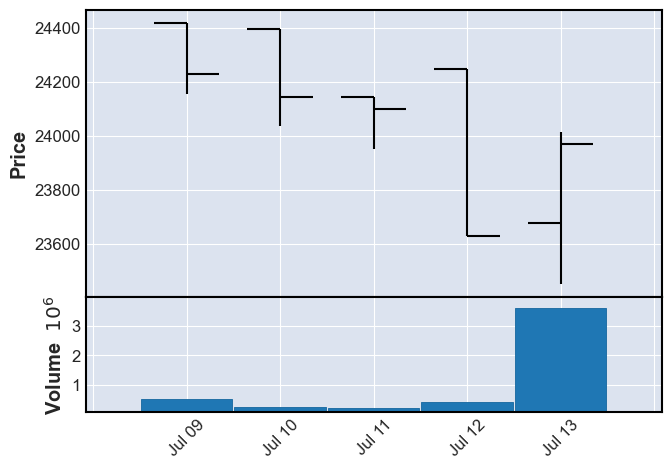

상승?0 횡보?1 하락?22
27 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-07-16   90234  24025  23990  23820  24000  (2012, 29)
2012-07-17  211997  24265  23840  23765  24065  (2012, 29)
2012-07-18  153031  24250  24250  23610  23710  (2012, 29)
2012-07-19  251906  24190  23880  23880  24045  (2012, 29)
2012-07-20  124126  24170  24170  24030  24085  (2012, 29)


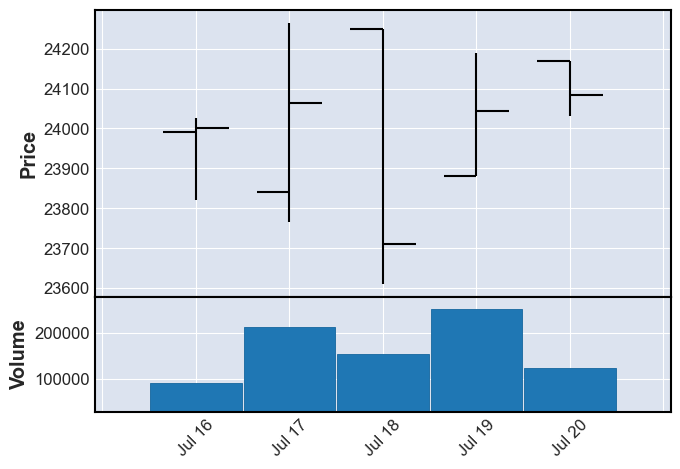

상승?0 횡보?1 하락?21
28 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-07-23  422980  23950  23950  23470  23675  (2012, 30)
2012-07-24  221234  23730  23660  23550  23715  (2012, 30)
2012-07-25  383305  23565  23365  23235  23385  (2012, 30)
2012-07-26  220424  23640  23450  23340  23595  (2012, 30)
2012-07-27  517238  24260  23870  23870  24260  (2012, 30)


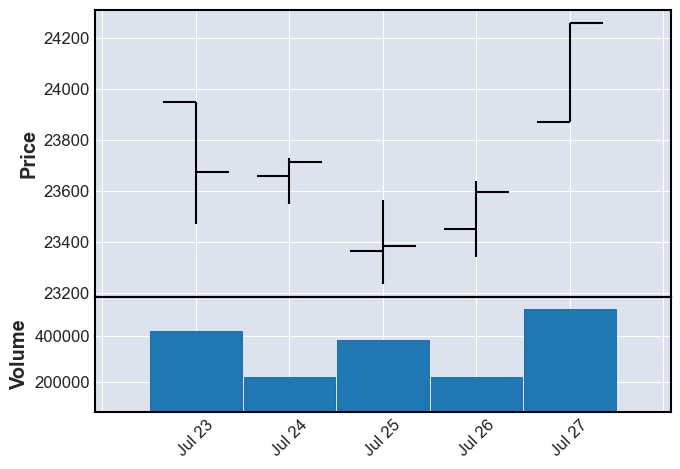

상승?0 횡보?1 하락?20
29 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-07-30  448625  24540  24510  24435  24500  (2012, 31)
2012-07-31  238047  25300  24505  24450  25045  (2012, 31)
2012-08-01  502724  25105  25010  24820  25015  (2012, 31)
2012-08-02  398214  25100  25100  24770  24830  (2012, 31)
2012-08-03  289275  24825  24450  24450  24510  (2012, 31)


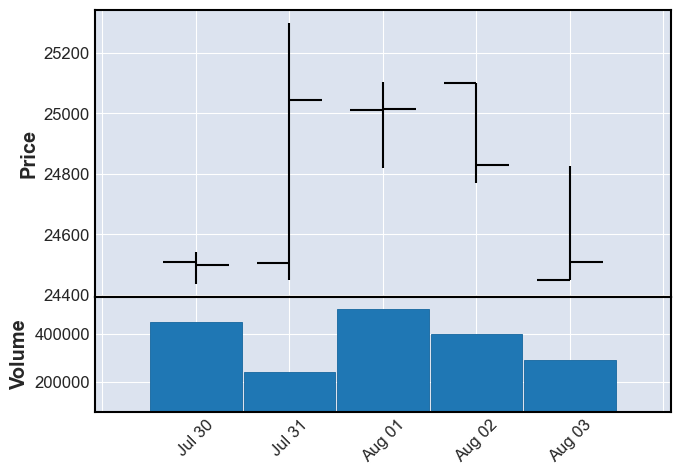

상승?0 횡보?1 하락?21
30 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-08-06  393411  25170  25000  25000  25045  (2012, 32)
2012-08-07  290053  25160  25100  25000  25060  (2012, 32)
2012-08-08  256884  25560  25060  25060  25280  (2012, 32)
2012-08-09  373139  25965  25315  25315  25835  (2012, 32)
2012-08-10  204669  25960  25830  25770  25905  (2012, 32)


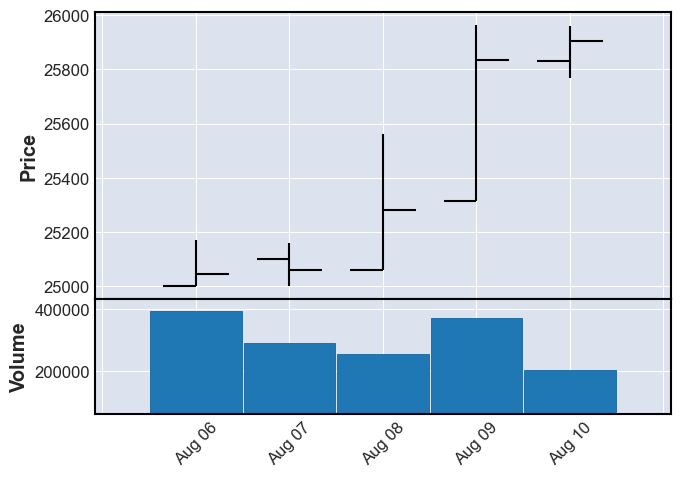

상승?0 횡보?1 하락?20
31 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-08-13  361613  25915  25905  24610  25765  (2012, 33)
2012-08-14  631947  26075  25745  25745  26025  (2012, 33)
2012-08-16  615957  26105  25970  25940  26085  (2012, 33)
2012-08-17  311799  26155  26155  25825  25890  (2012, 33)


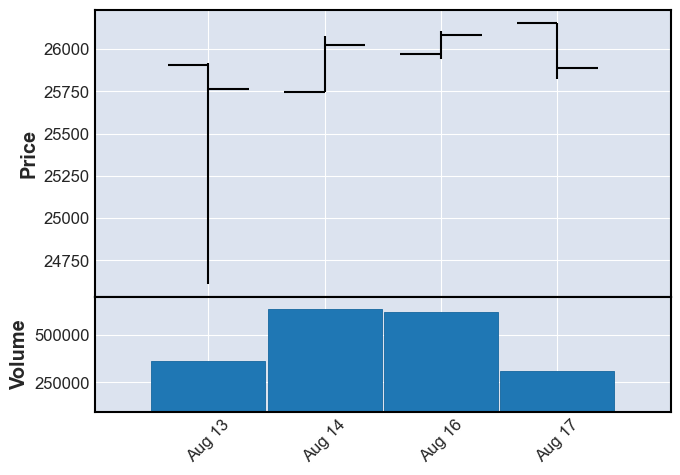

상승?0 횡보?1 하락?21
32 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-08-20  266174  25990  25990  25750  25840  (2012, 34)
2012-08-21  330251  26100  26030  25765  25845  (2012, 34)
2012-08-22  424065  25835  25780  25430  25640  (2012, 34)
2012-08-23  261519  25770  25625  25520  25750  (2012, 34)
2012-08-24  348222  25520  25505  25355  25435  (2012, 34)


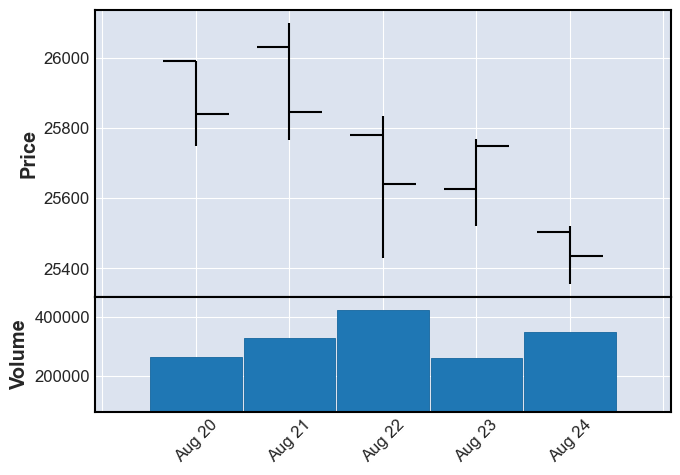

상승?0 횡보?1 하락?22
33 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-08-27  460225  25440  25280  25180  25365  (2012, 35)
2012-08-28  268651  25425  25350  25195  25310  (2012, 35)
2012-08-29  329330  25430  25330  25275  25430  (2012, 35)
2012-08-30  636568  25400  25400  24940  25085  (2012, 35)
2012-08-31  342804  25155  25000  24980  25070  (2012, 35)


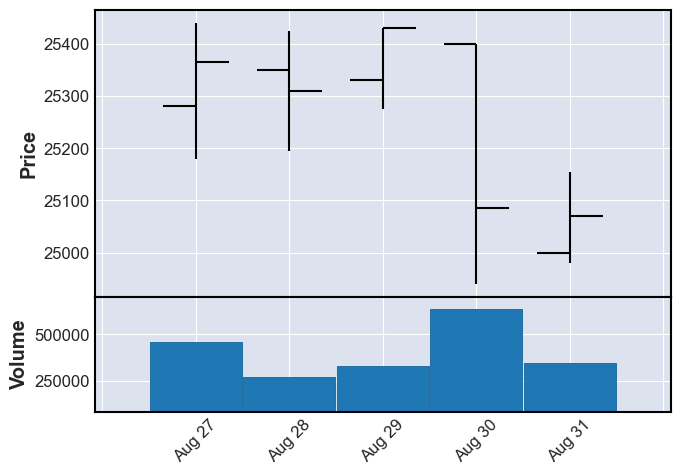

상승?0 횡보?1 하락?22
34 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-09-03   251538  25275  25170  24725  25115  (2012, 36)
2012-09-04   203250  25150  25150  25020  25045  (2012, 36)
2012-09-05   335725  25000  25000  24585  24585  (2012, 36)
2012-09-06   514260  24790  24650  24580  24725  (2012, 36)
2012-09-07  1315477  25460  25105  25105  25460  (2012, 36)


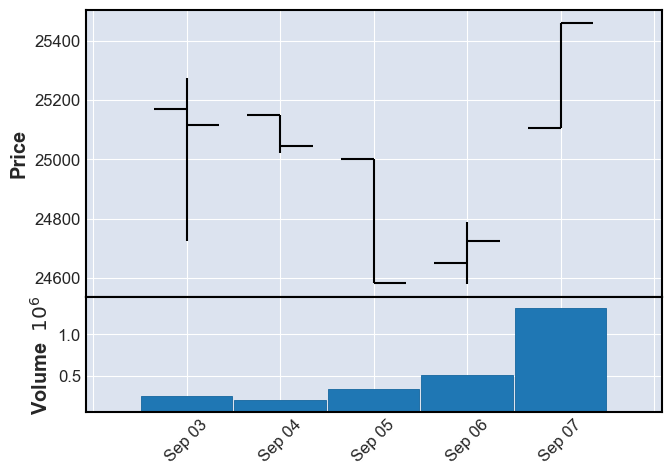

상승?0 횡보?1 하락?21
35 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-09-10  133038  25735  25735  25370  25375  (2012, 37)
2012-09-11  254546  25375  25375  25140  25295  (2012, 37)
2012-09-12  176069  25735  25430  25400  25725  (2012, 37)
2012-09-13  284139  25725  25725  25480  25680  (2012, 37)
2012-09-14  290383  26620  26620  26335  26540  (2012, 37)


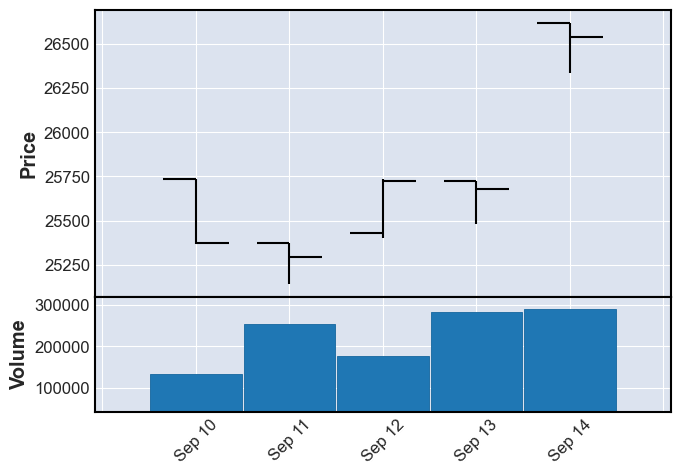

상승?0 횡보?1 하락?20
36 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-09-17  196388  26550  26550  26370  26385  (2012, 38)
2012-09-18  258128  26455  26340  26300  26400  (2012, 38)
2012-09-19  542788  26575  26350  26305  26460  (2012, 38)
2012-09-20  272889  26450  26450  26215  26245  (2012, 38)
2012-09-21  163996  26440  26270  26270  26320  (2012, 38)


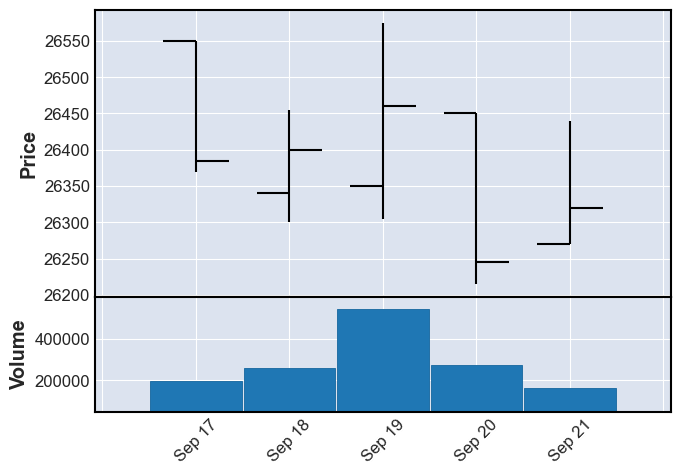

상승?0 횡보?1 하락?21
37 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-09-24   115706  26375  26300  26015  26325  (2012, 39)
2012-09-25  2221221  26365  26200  26200  26230  (2012, 39)
2012-09-26   135844  26175  26175  25915  26020  (2012, 39)
2012-09-27  1821120  26250  26010  25940  26205  (2012, 39)
2012-09-28   491429  26285  26255  26160  26280  (2012, 39)


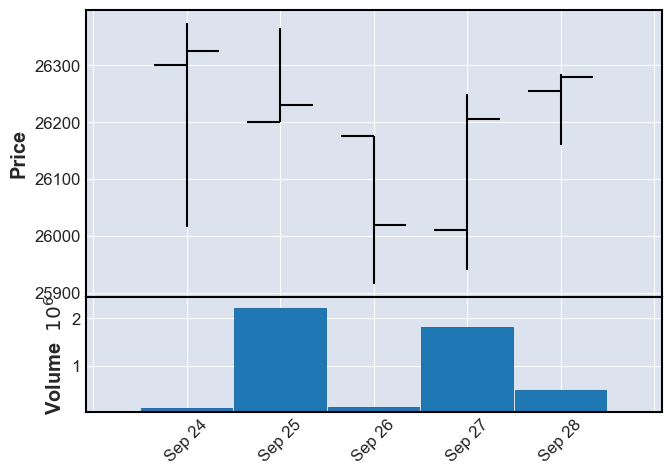

상승?0 횡보?1 하락?21
38 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-10-02  191378  26340  26230  26205  26265  (2012, 40)
2012-10-04  143747  26285  26280  26035  26240  (2012, 40)
2012-10-05  188295  26450  26450  26200  26250  (2012, 40)


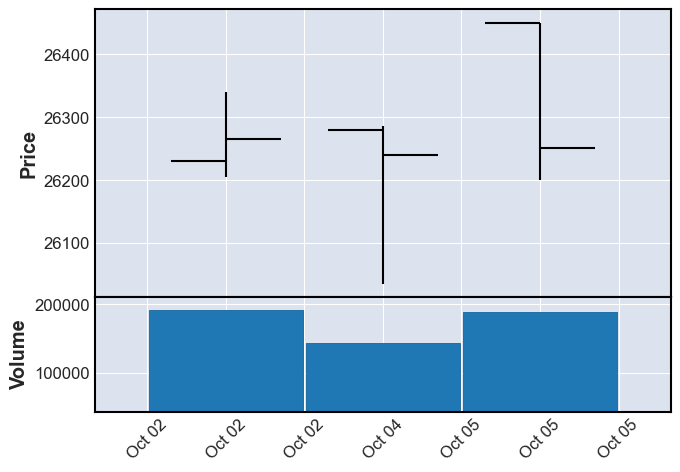

상승?0 횡보?1 하락?21
39 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-10-08  235285  26200  26150  25970  26010  (2012, 41)
2012-10-09  182028  26200  26040  26015  26020  (2012, 41)
2012-10-10  305741  25975  25975  25520  25520  (2012, 41)
2012-10-11  312686  25535  25470  25135  25370  (2012, 41)
2012-10-12  334810  25430  25420  25210  25310  (2012, 41)


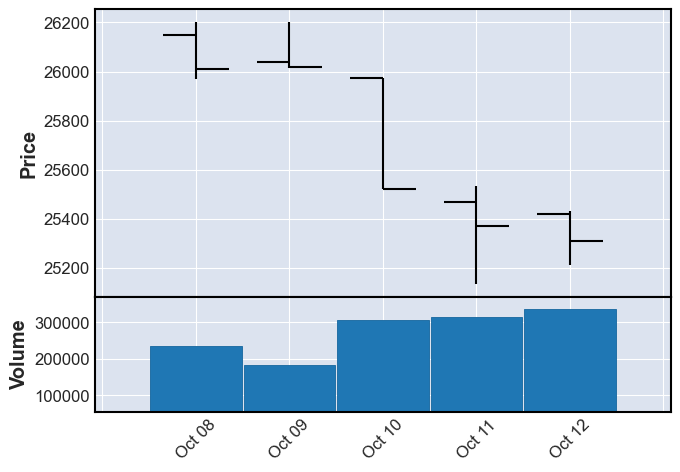

상승?0 횡보?1 하락?22
40 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-10-15  264606  25365  25310  25135  25230  (2012, 42)
2012-10-16  155928  25470  25425  25315  25470  (2012, 42)
2012-10-17  175226  25795  25700  25570  25630  (2012, 42)
2012-10-18  594678  25800  25640  25640  25800  (2012, 42)
2012-10-19  998318  25760  25760  25420  25540  (2012, 42)


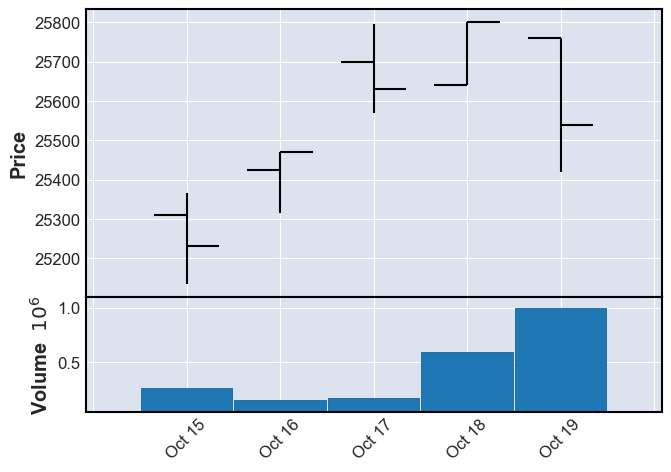

상승?0 횡보?1 하락?20
41 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-10-22  412996  25480  25190  25085  25425  (2012, 43)
2012-10-23  331539  25440  25440  25260  25260  (2012, 43)
2012-10-24  737675  25195  25060  24920  25060  (2012, 43)
2012-10-25  352410  25260  25010  24910  25260  (2012, 43)
2012-10-26  641230  25240  25240  24790  24800  (2012, 43)


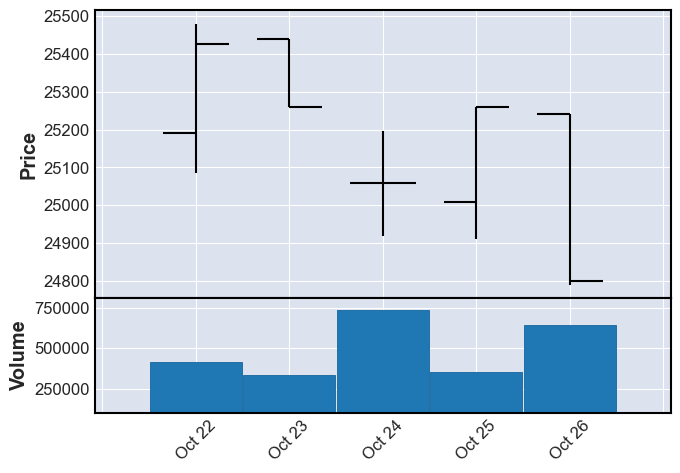

상승?0 횡보?1 하락?22
42 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-10-29   549797  24980  24980  24790  24850  (2012, 44)
2012-10-30  3274181  25115  24850  24840  24925  (2012, 44)
2012-10-31  1449150  25145  24945  24945  25080  (2012, 44)
2012-11-01  1086277  24925  24915  24690  24800  (2012, 44)
2012-11-02   145937  25160  25085  25065  25110  (2012, 44)


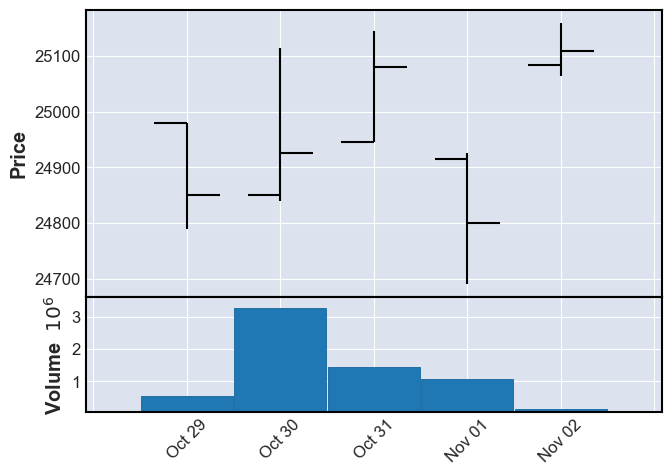

상승?0 횡보?1 하락?20
43 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-11-05  108233  25110  25045  24970  24970  (2012, 45)
2012-11-06  594662  25285  25050  24975  25280  (2012, 45)
2012-11-07  288812  25425  25420  25100  25425  (2012, 45)
2012-11-08  336758  25190  25190  24950  25040  (2012, 45)
2012-11-09  583932  24940  24910  24535  24875  (2012, 45)


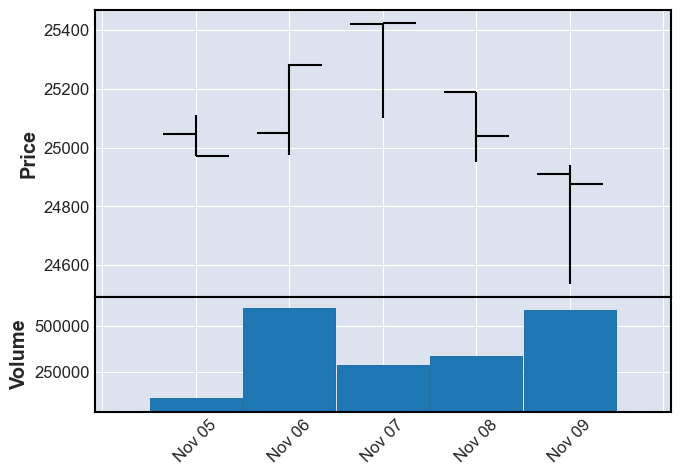

상승?0 횡보?1 하락?21
44 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-11-12   819315  24890  24875  24720  24835  (2012, 46)
2012-11-13   387271  24900  24850  24630  24715  (2012, 46)
2012-11-14   649502  24860  24760  24650  24860  (2012, 46)
2012-11-15  1081434  24700  24700  24405  24520  (2012, 46)
2012-11-16   646094  24515  24515  24360  24380  (2012, 46)


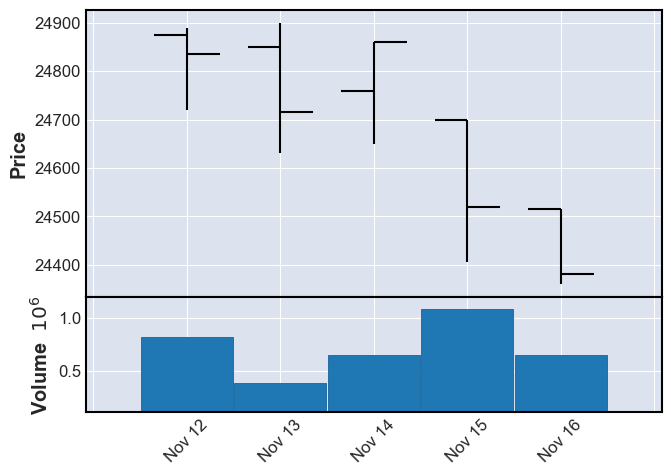

상승?0 횡보?1 하락?22
45 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-11-19   193714  24730  24450  24450  24650  (2012, 47)
2012-11-20   102746  24890  24820  24770  24840  (2012, 47)
2012-11-21   588104  24935  24840  24660  24730  (2012, 47)
2012-11-22  1001357  25055  24920  24895  24975  (2012, 47)
2012-11-23   307232  25170  24975  24955  25170  (2012, 47)


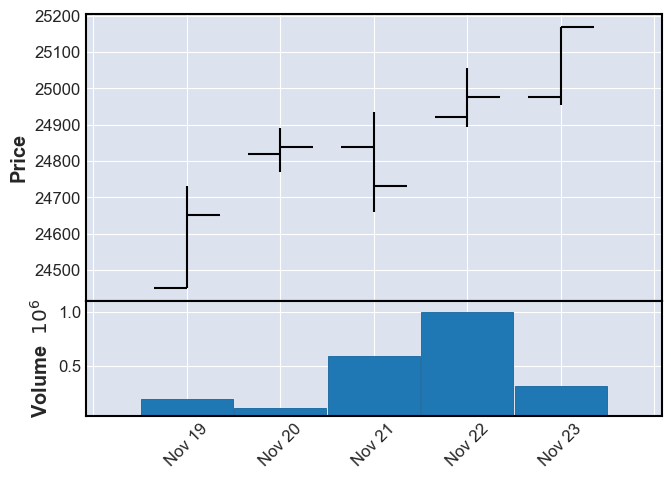

상승?0 횡보?1 하락?20
46 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2012-11-26  467628  25385  25295  25085  25125  (2012, 48)
2012-11-27  359283  25430  25200  25125  25405  (2012, 48)
2012-11-28  452668  25295  25295  25150  25230  (2012, 48)
2012-11-29  645722  25520  25370  25340  25505  (2012, 48)
2012-11-30  514708  25635  25530  25420  25530  (2012, 48)


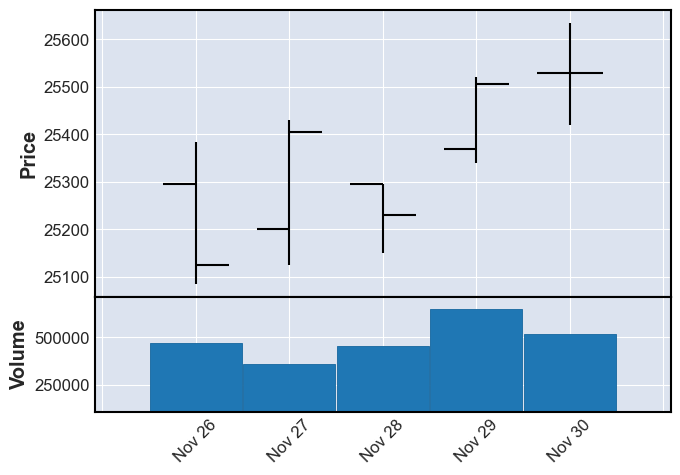

상승?0 횡보?1 하락?20
47 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-12-03  1152182  25655  25455  25455  25555  (2012, 49)
2012-12-04   152058  25520  25480  25390  25505  (2012, 49)
2012-12-05   643907  25705  25440  25440  25670  (2012, 49)
2012-12-06  1470762  25795  25730  25655  25710  (2012, 49)
2012-12-07   565676  25935  25750  25750  25870  (2012, 49)


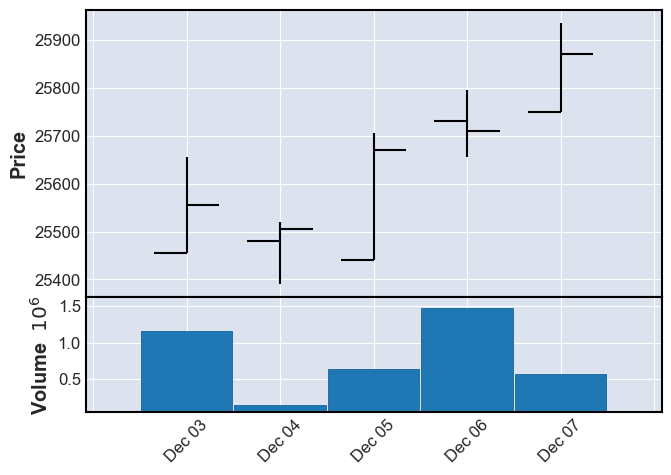

상승?0 횡보?1 하락?20
48 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-12-10   845482  26040  26000  21990  25895  (2012, 50)
2012-12-11   897984  26000  25995  25900  26000  (2012, 50)
2012-12-12  2649466  26170  26095  26055  26170  (2012, 50)
2012-12-13  2797412  26525  26170  26170  26525  (2012, 50)
2012-12-14  2206569  26595  26305  26300  26585  (2012, 50)


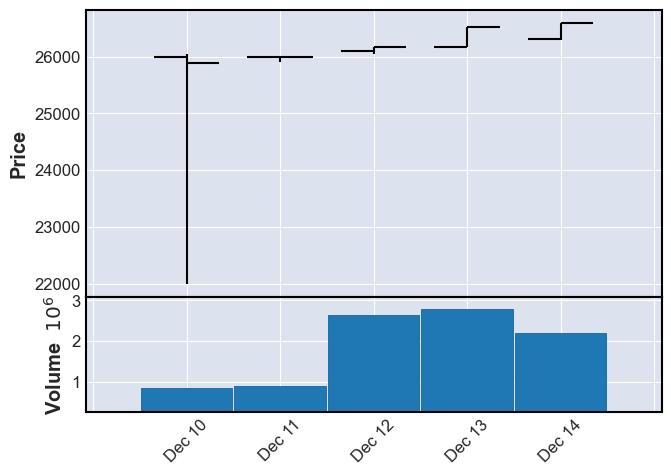

상승?0 횡보?1 하락?20
49 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-12-17  2017304  26530  26490  26315  26315  (2012, 51)
2012-12-18   825400  26465  26400  26250  26445  (2012, 51)
2012-12-20  1940409  26580  26490  26410  26410  (2012, 51)
2012-12-21  1284200  26550  26460  26215  26240  (2012, 51)


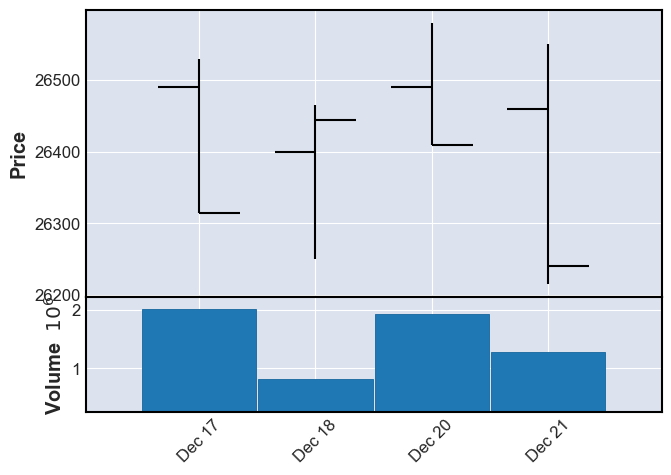

상승?0 횡보?1 하락?21
50 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2012-12-24   624006  26345  26340  26235  26320  (2012, 52)
2012-12-26   989276  26575  26355  26285  26305  (2012, 52)
2012-12-27  2552681  26520  26380  26270  26475  (2012, 52)
2012-12-28   602935  26695  26550  26505  26625  (2012, 52)


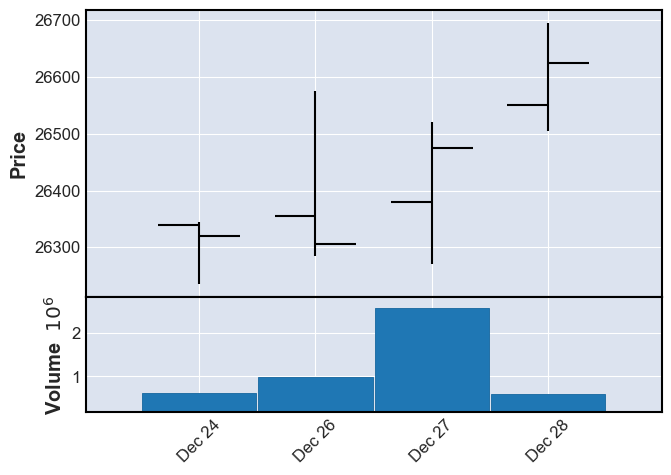

상승?0 횡보?1 하락?20
51 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-01-02  1310370  27155  26890  26670  27130  (2013, 1)
2013-01-03  1106981  27360  27205  27015  27015  (2013, 1)
2013-01-04  1447398  27090  27015  26820  26875  (2013, 1)


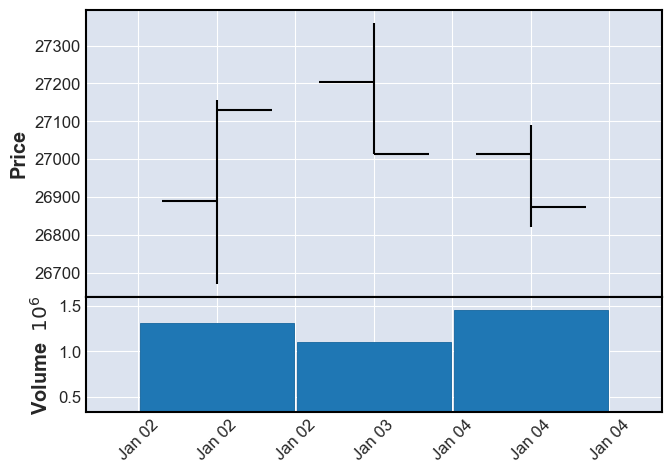

상승?0 횡보?1 하락?22
52 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-01-07   750783  27000  27000  26705  26920  (2013, 2)
2013-01-08  1067576  26870  26760  26640  26640  (2013, 2)
2013-01-09   257343  26790  26700  26515  26525  (2013, 2)
2013-01-10   325030  26835  26645  26455  26770  (2013, 2)
2013-01-11  1252481  26930  26855  26420  26640  (2013, 2)


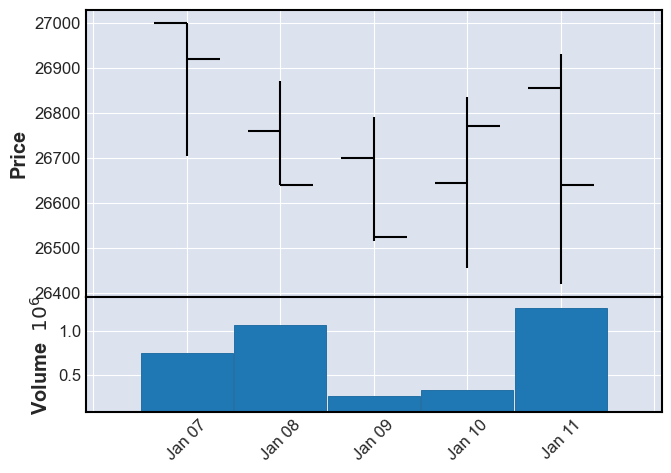

상승?0 횡보?1 하락?22
53 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-01-14   247695  26770  26690  26500  26760  (2013, 3)
2013-01-15  1137820  26935  26775  26470  26470  (2013, 3)
2013-01-16   169788  26625  26550  26220  26320  (2013, 3)
2013-01-17   808694  26430  26355  26170  26340  (2013, 3)
2013-01-18   358623  26535  26500  26285  26450  (2013, 3)


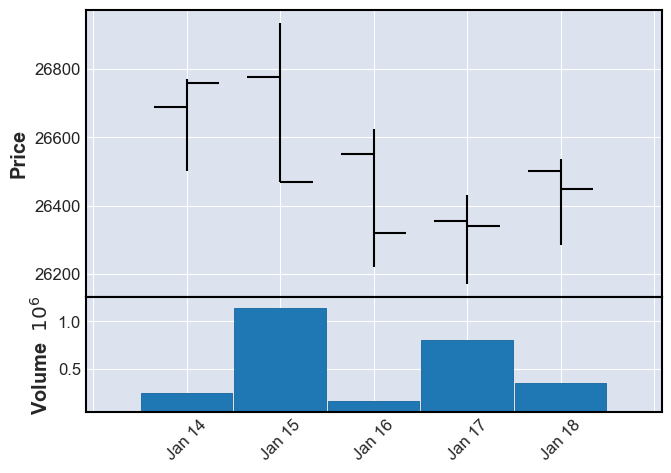

상승?0 횡보?1 하락?22
54 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-01-21   623157  26545  26500  26210  26450  (2013, 4)
2013-01-22   524235  26615  26450  26375  26605  (2013, 4)
2013-01-23   651837  26725  26610  26360  26360  (2013, 4)
2013-01-24  2425177  26440  26440  26105  26140  (2013, 4)
2013-01-25  1654839  26290  26290  25790  25885  (2013, 4)


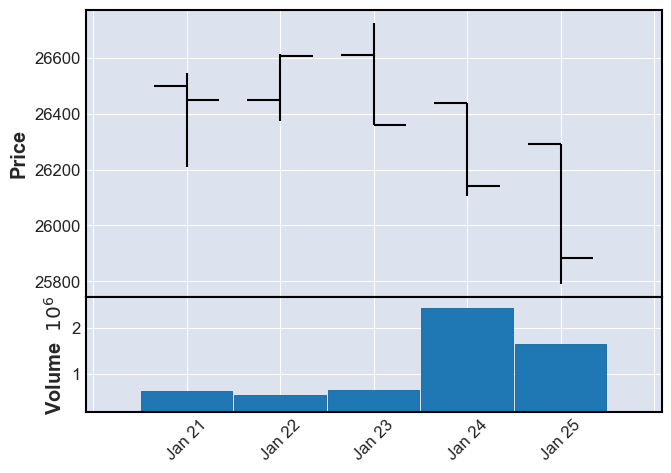

상승?0 횡보?1 하락?22
55 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-01-28  1058620  25900  25900  25685  25825  (2013, 5)
2013-01-29   600636  26065  25900  25825  26045  (2013, 5)
2013-01-30   669406  26195  26095  25935  26125  (2013, 5)
2013-01-31   828172  26110  26110  25970  26075  (2013, 5)
2013-02-01   706134  26205  26075  25830  26005  (2013, 5)


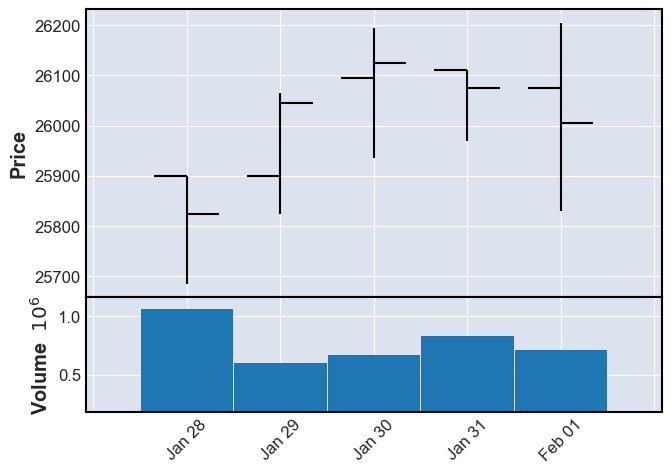

상승?0 횡보?1 하락?20
56 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-02-04  1154141  26185  26185  25965  25980  (2013, 6)
2013-02-05  2045453  25850  25850  25635  25765  (2013, 6)
2013-02-06   762856  25820  25810  25715  25735  (2013, 6)
2013-02-07   899256  25890  25815  25650  25710  (2013, 6)
2013-02-08  1136706  26080  25730  25625  26000  (2013, 6)


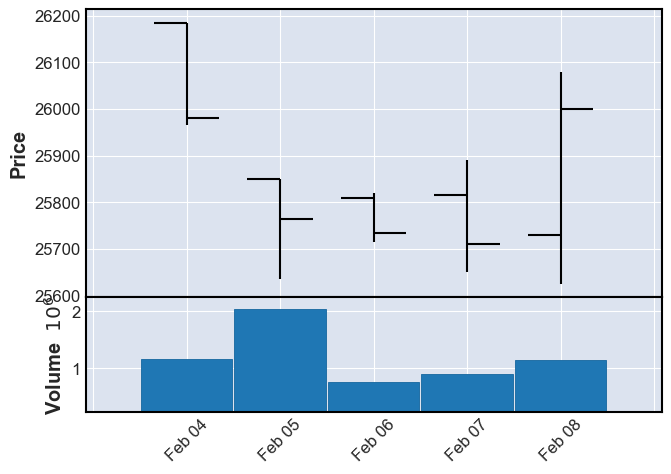

상승?0 횡보?1 하락?21
57 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-02-12  1129805  26090  26060  25895  25895  (2013, 7)
2013-02-13   627027  26445  26030  26030  26440  (2013, 7)
2013-02-14  1318093  26620  26440  26370  26485  (2013, 7)
2013-02-15   736862  26560  26560  26425  26480  (2013, 7)


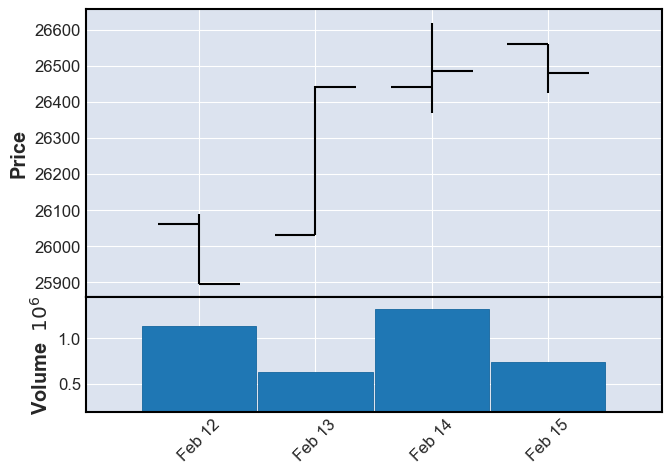

상승?0 횡보?1 하락?20
58 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-02-18   776200  26560  26445  26325  26490  (2013, 8)
2013-02-19   980071  26630  26455  26430  26565  (2013, 8)
2013-02-20  2784622  27115  26640  26640  27100  (2013, 8)
2013-02-21  1109213  27080  27000  26950  26965  (2013, 8)
2013-02-22  2503363  27205  26870  26870  27020  (2013, 8)


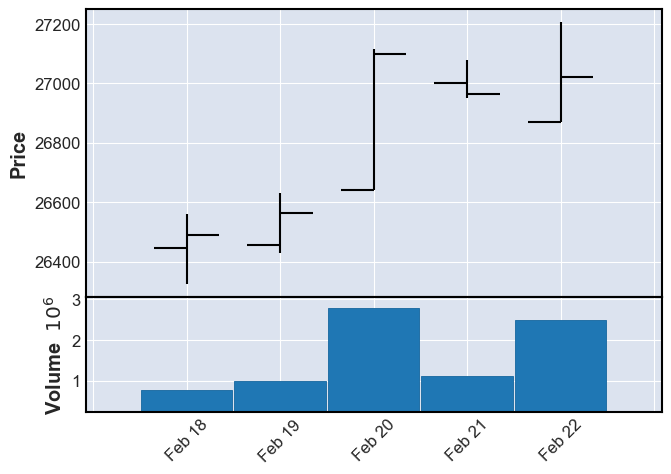

상승?0 횡보?1 하락?20
59 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-02-25   931186  27120  27010  26920  26940  (2013, 9)
2013-02-26   918345  26880  26635  26635  26825  (2013, 9)
2013-02-27   588216  26930  26910  26760  26870  (2013, 9)
2013-02-28  1589685  27225  27010  27010  27145  (2013, 9)


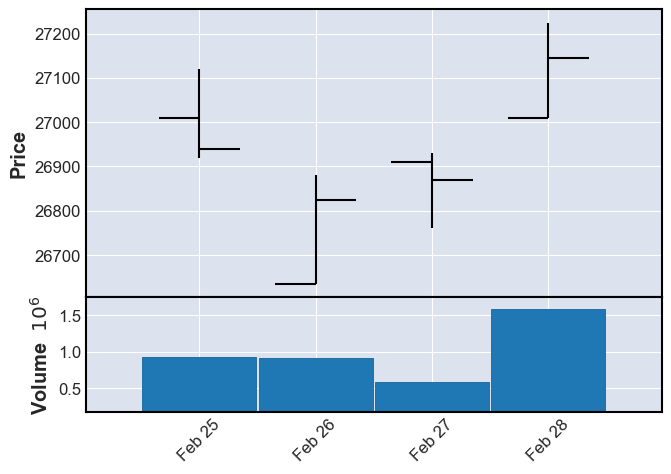

상승?0 횡보?1 하락?21
60 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-03-04  1397526  27160  27150  26845  26875  (2013, 10)
2013-03-05   821532  27220  27100  26955  26955  (2013, 10)
2013-03-06   690202  27250  27150  26920  26975  (2013, 10)
2013-03-07   991562  26985  26960  26710  26755  (2013, 10)
2013-03-08  1334946  26825  26710  26630  26720  (2013, 10)


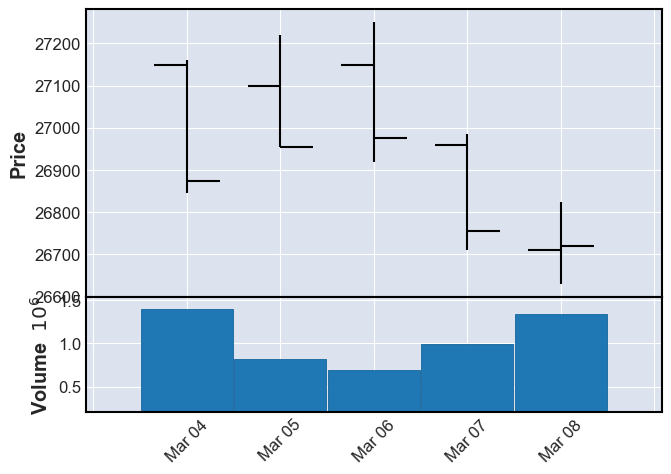

상승?0 횡보?1 하락?22
61 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-03-11  1144418  26795  26725  26450  26710  (2013, 11)
2013-03-12  3119784  26820  26680  26475  26500  (2013, 11)
2013-03-13  1365907  26635  26475  26435  26600  (2013, 11)
2013-03-14  4081234  26675  26600  26280  26675  (2013, 11)
2013-03-15  1108607  26715  26700  26360  26380  (2013, 11)


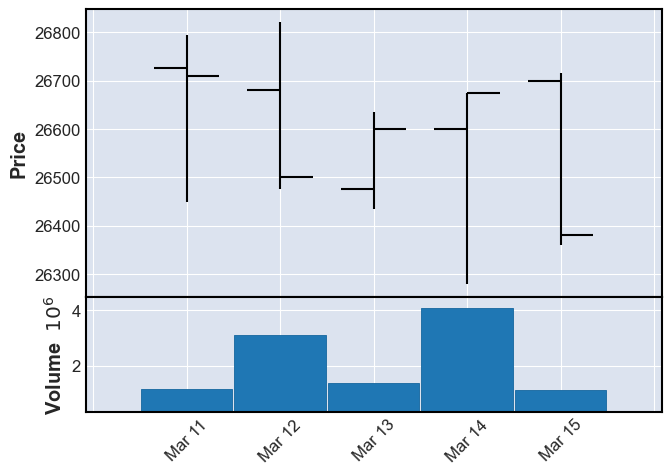

상승?0 횡보?1 하락?22
62 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-03-18  1829637  26345  26345  26070  26190  (2013, 12)
2013-03-19   784537  26435  26250  26210  26265  (2013, 12)
2013-03-20  2679238  26245  26130  26000  26040  (2013, 12)
2013-03-21  1699572  26185  26080  25850  25880  (2013, 12)
2013-03-22  2431401  25915  25900  25780  25835  (2013, 12)


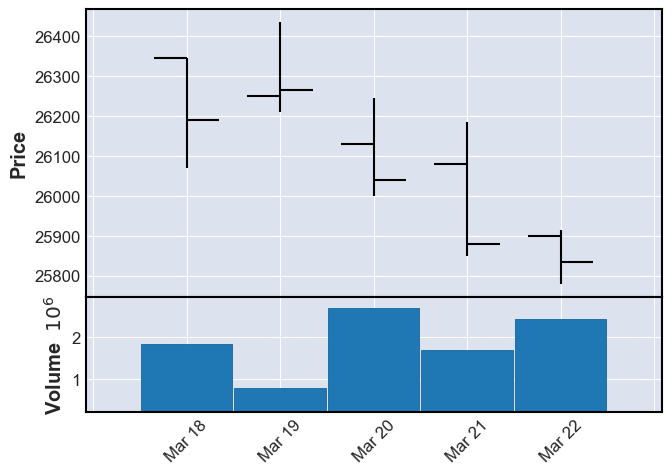

상승?0 횡보?1 하락?22
63 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-03-25  1230884  26355  26030  26010  26255  (2013, 13)
2013-03-26  1390667  26435  26280  26220  26335  (2013, 13)
2013-03-27  1323235  26600  26380  26195  26540  (2013, 13)
2013-03-28   432144  26585  26585  26435  26565  (2013, 13)
2013-03-29  1442405  26835  26710  26635  26695  (2013, 13)


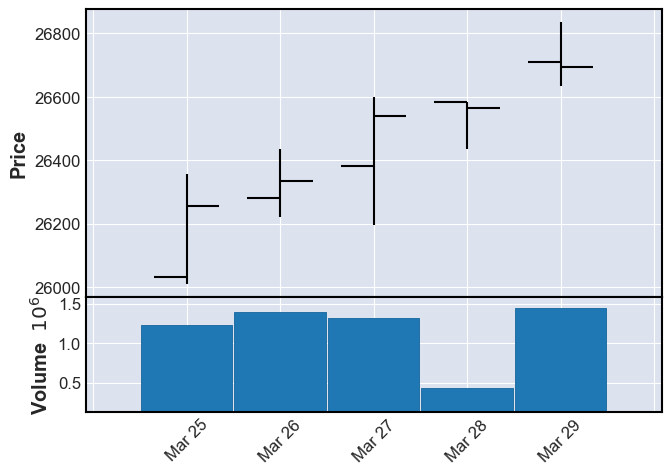

상승?0 횡보?1 하락?20
64 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-04-01  1294996  26735  26700  26555  26605  (2013, 14)
2013-04-02  1085893  26720  26720  26170  26380  (2013, 14)
2013-04-03   850741  26480  26445  26160  26340  (2013, 14)
2013-04-04  4172739  26235  26235  25815  26000  (2013, 14)
2013-04-05  3697245  25890  25870  25505  25615  (2013, 14)


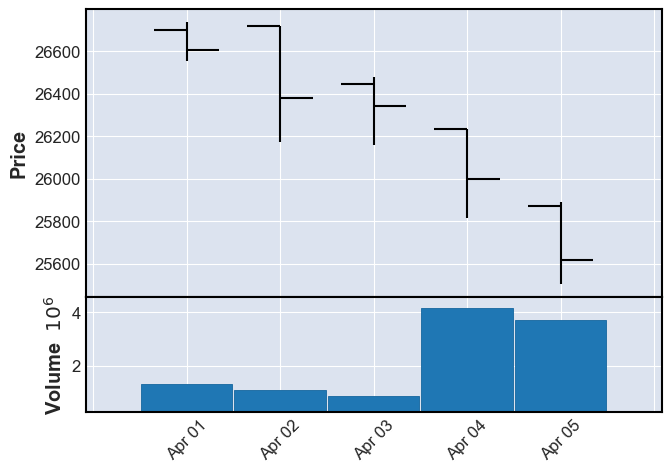

상승?0 횡보?1 하락?22
65 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-04-08  1382713  25740  25640  25535  25620  (2013, 15)
2013-04-09   920224  25825  25640  25380  25585  (2013, 15)
2013-04-10   470062  25855  25795  25570  25735  (2013, 15)
2013-04-11  1126984  26050  25875  25630  25945  (2013, 15)
2013-04-12  1586557  26000  26000  25415  25510  (2013, 15)


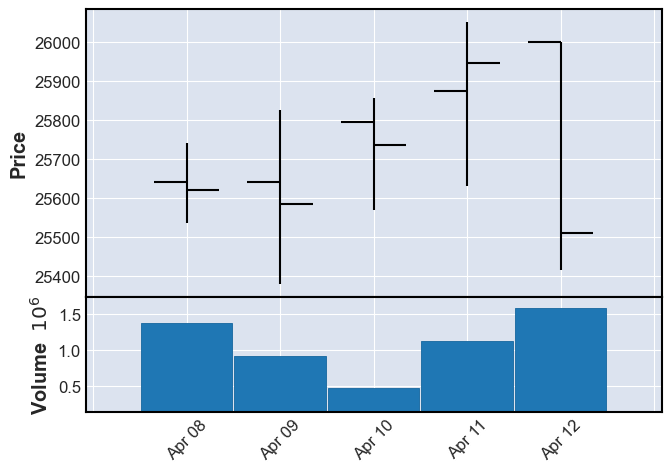

상승?0 횡보?1 하락?21
66 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-04-15  1493722  25620  25335  25275  25530  (2013, 16)
2013-04-16  1621931  25590  25300  25125  25460  (2013, 16)
2013-04-17  1178874  25600  25560  25225  25425  (2013, 16)
2013-04-18  1134846  25410  25350  25125  25125  (2013, 16)
2013-04-19   946014  25280  25150  24970  25185  (2013, 16)


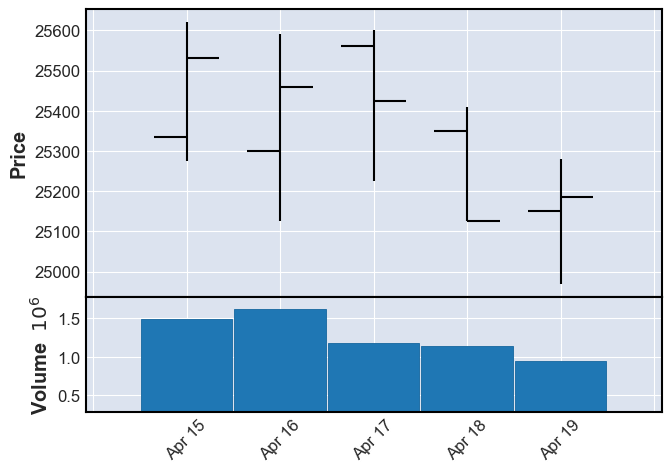

상승?0 횡보?1 하락?22
67 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-04-22   586707  25445  25185  25080  25435  (2013, 17)
2013-04-23  1319939  25485  25485  25140  25350  (2013, 17)
2013-04-24   693479  25605  25480  25315  25545  (2013, 17)
2013-04-25  1361571  25720  25545  25545  25720  (2013, 17)
2013-04-26   741218  25735  25720  25610  25670  (2013, 17)


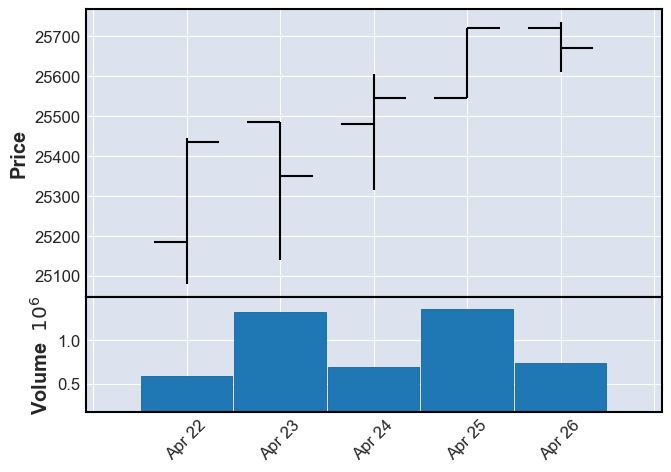

상승?0 횡보?1 하락?20
68 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-04-29   819336  25390  25370  25175  25280  (2013, 18)
2013-04-30  1620201  25670  25330  25330  25620  (2013, 18)
2013-05-02  1136752  25590  25540  25425  25485  (2013, 18)
2013-05-03   992244  25615  25600  25410  25590  (2013, 18)


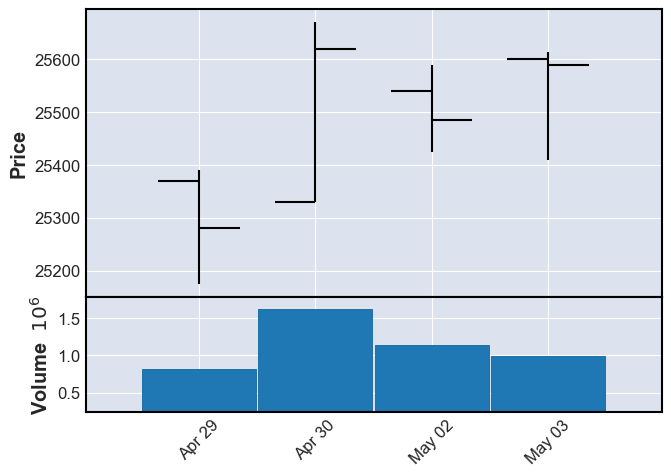

상승?0 횡보?1 하락?20
69 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-05-06   874897  25880  25720  25500  25500  (2013, 19)
2013-05-07   739497  25550  25550  25350  25440  (2013, 19)
2013-05-08   234782  25570  25500  25345  25395  (2013, 19)
2013-05-09  1529278  25825  25420  25420  25780  (2013, 19)
2013-05-10   687496  25740  25735  25225  25290  (2013, 19)


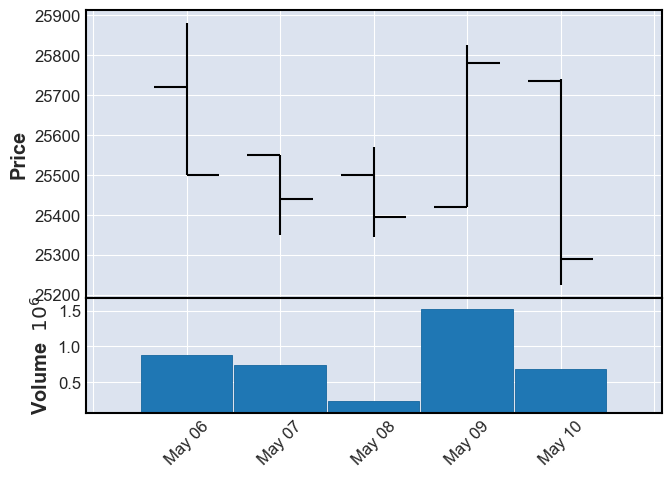

상승?0 횡보?1 하락?21
70 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-05-13   837236  25360  25285  25070  25360  (2013, 20)
2013-05-14  2146815  25700  25360  25360  25655  (2013, 20)
2013-05-15  1668617  25695  25655  25510  25655  (2013, 20)
2013-05-16  1148923  26005  25680  25680  25895  (2013, 20)


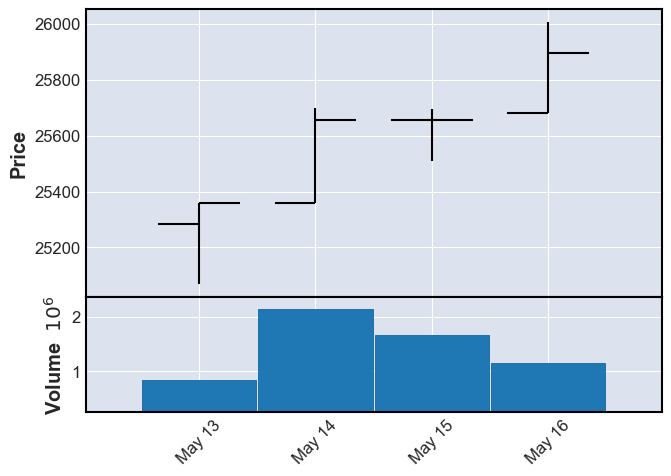

상승?0 횡보?1 하락?20
71 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2013-05-20  598214  25950  25895  25825  25825  (2013, 21)
2013-05-21  498216  26080  25870  25800  25850  (2013, 21)
2013-05-22  492661  26110  26000  25925  26010  (2013, 21)
2013-05-23  475797  25995  25995  25665  25665  (2013, 21)
2013-05-24  541137  25810  25710  25530  25740  (2013, 21)


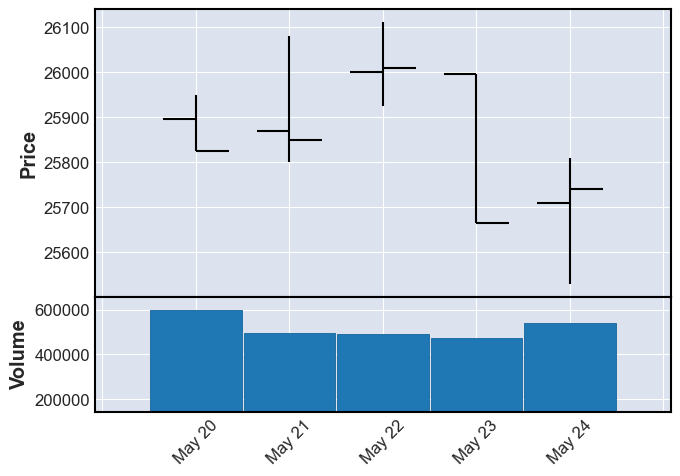

상승?0 횡보?1 하락?21
72 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-05-27  1762616  25915  25740  25640  25820  (2013, 22)
2013-05-28   430469  25985  25825  25765  25925  (2013, 22)
2013-05-29  1617466  26220  25960  25950  26110  (2013, 22)
2013-05-30  1172873  26230  26055  26055  26100  (2013, 22)
2013-05-31  1458327  26325  26135  26135  26175  (2013, 22)


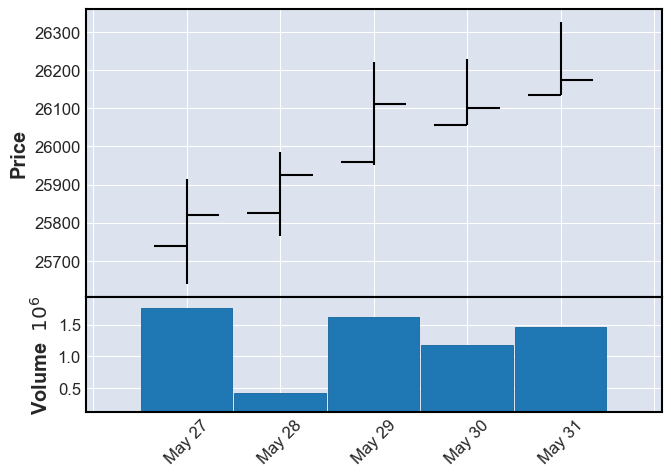

상승?0 횡보?1 하락?20
73 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-06-03  1740549  26150  26100  26015  26070  (2013, 23)
2013-06-04  1023546  26190  26150  25865  26030  (2013, 23)
2013-06-05  1974847  26030  26030  25705  25705  (2013, 23)
2013-06-07  3688180  25670  25645  25115  25135  (2013, 23)


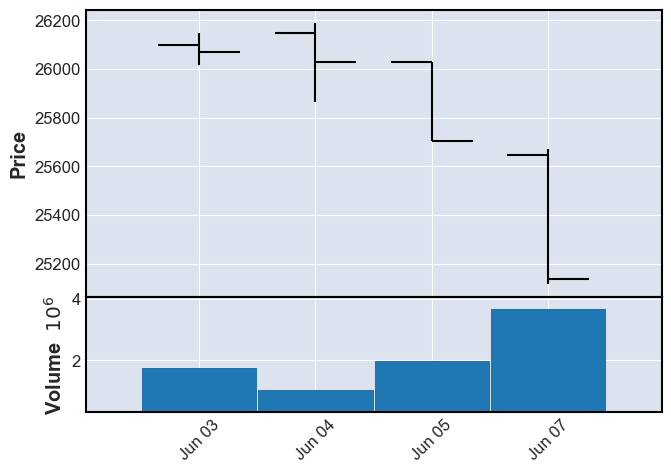

상승?0 횡보?1 하락?22
74 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-06-10  2082079  25265  25185  25075  25255  (2013, 24)
2013-06-11   856638  25255  25255  24885  25080  (2013, 24)
2013-06-12   806930  25060  25000  24815  24840  (2013, 24)
2013-06-13  1560829  24855  24840  24495  24560  (2013, 24)
2013-06-14   770258  24785  24785  24415  24520  (2013, 24)


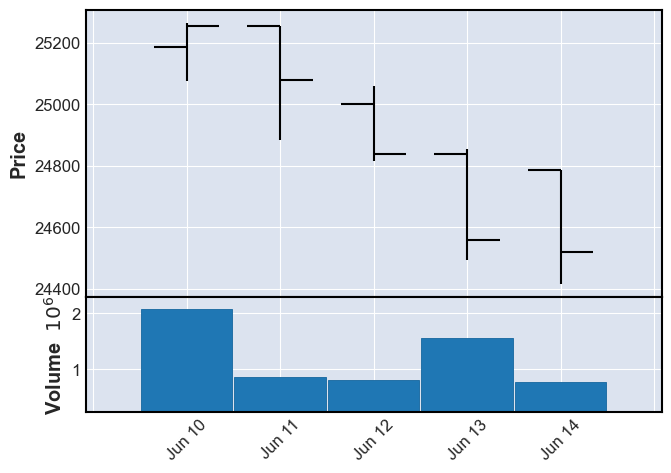

상승?0 횡보?1 하락?22
75 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-06-17  1699539  24680  24520  24435  24465  (2013, 25)
2013-06-18   990089  24670  24485  24390  24670  (2013, 25)
2013-06-19   707689  24670  24670  24465  24610  (2013, 25)
2013-06-20  1167826  24410  24410  23925  24020  (2013, 25)
2013-06-21  1448465  23645  23615  23400  23620  (2013, 25)


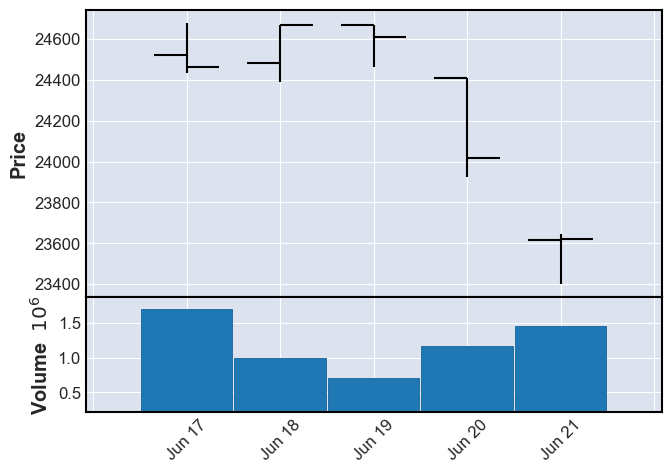

상승?0 횡보?1 하락?22
76 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-06-24  2620790  23660  23625  23380  23385  (2013, 26)
2013-06-25  2251492  23540  23295  23065  23240  (2013, 26)
2013-06-26   949299  23525  23525  23075  23185  (2013, 26)
2013-06-27   778921  23900  23420  23420  23855  (2013, 26)
2013-06-28   759644  24330  23910  23860  24190  (2013, 26)


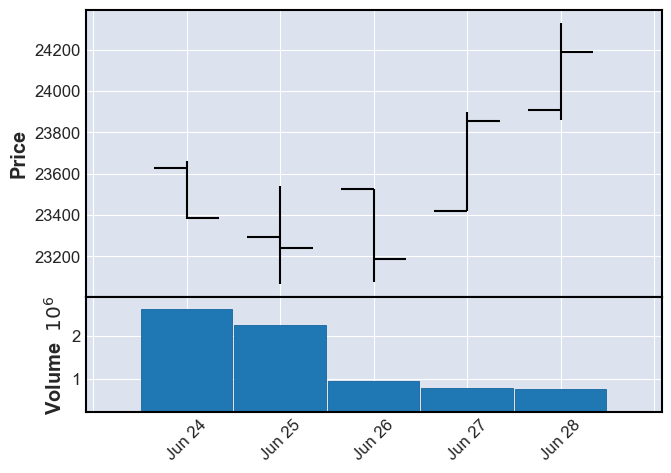

상승?0 횡보?1 하락?20
77 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2013-07-01  738277  24225  23960  23960  24165  (2013, 27)
2013-07-02  533380  24280  24170  24030  24155  (2013, 27)
2013-07-03  452347  24140  24080  23635  23725  (2013, 27)
2013-07-04  519768  23920  23730  23715  23850  (2013, 27)
2013-07-05  620194  24130  24040  23690  23760  (2013, 27)


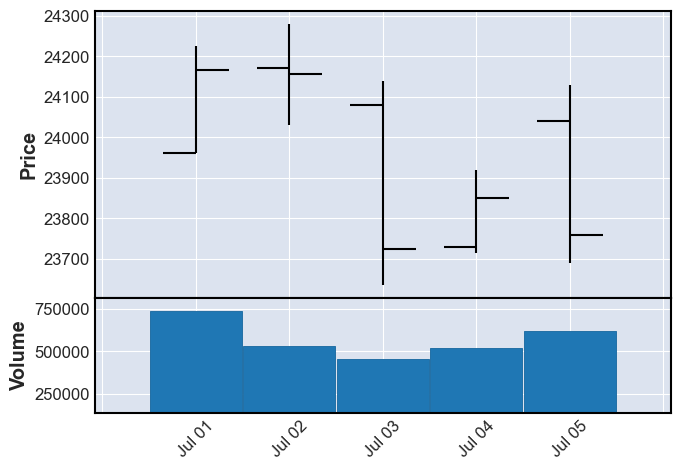

상승?0 횡보?1 하락?22
78 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2013-07-08  428157  23885  23745  23420  23540  (2013, 28)
2013-07-09  271449  23770  23630  23480  23770  (2013, 28)
2013-07-10  555329  23770  23770  23505  23590  (2013, 28)
2013-07-11  532305  24410  23815  23815  24370  (2013, 28)
2013-07-12  897850  24380  24380  24195  24220  (2013, 28)


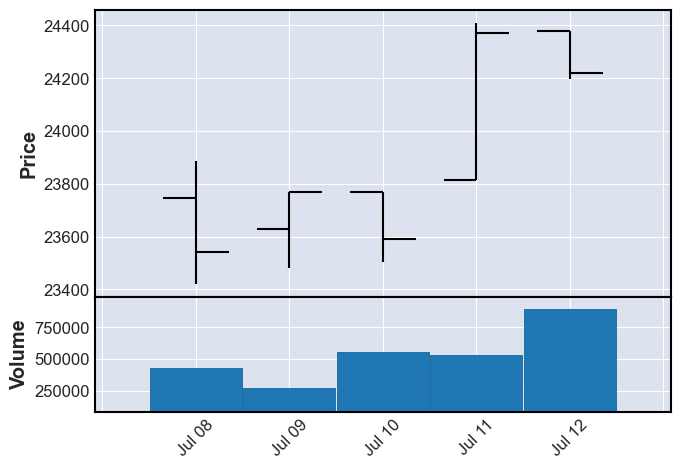

상승?0 횡보?1 하락?20
79 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-07-15   317119  24425  24220  23910  24325  (2013, 29)
2013-07-16   732274  24340  24340  24120  24205  (2013, 29)
2013-07-17  1102655  24610  24235  24050  24455  (2013, 29)
2013-07-18   926897  24450  24450  24200  24250  (2013, 29)
2013-07-19   519837  24360  24300  24040  24255  (2013, 29)


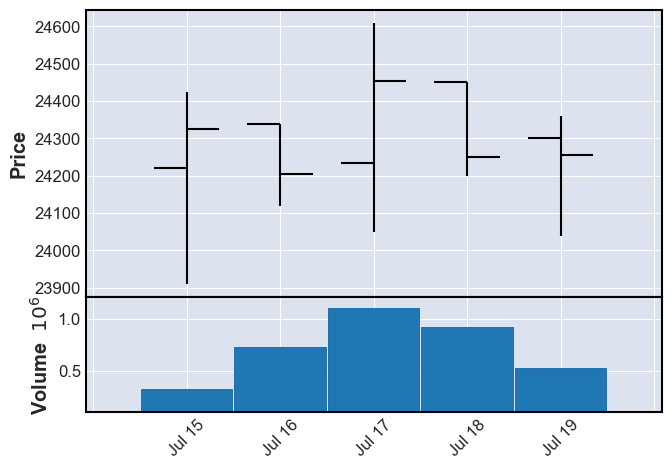

상승?0 횡보?1 하락?21
80 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-07-22   594253  24575  24315  24255  24295  (2013, 30)
2013-07-23  1029766  24710  24360  24350  24670  (2013, 30)
2013-07-24   620307  24775  24625  24595  24750  (2013, 30)
2013-07-25   541631  24840  24580  24580  24760  (2013, 30)
2013-07-26   595500  24870  24800  24660  24775  (2013, 30)


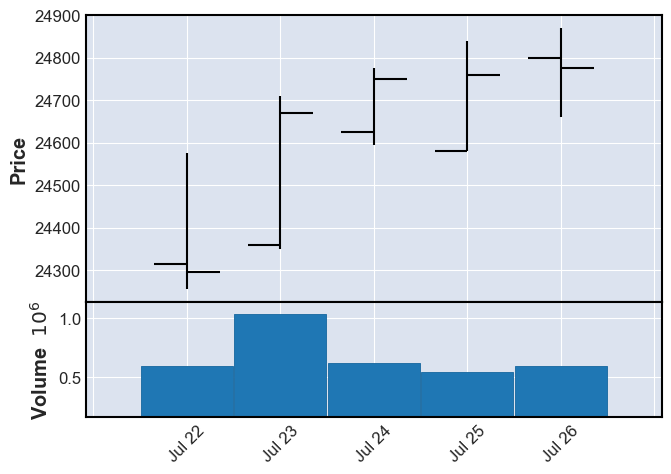

상승?0 횡보?1 하락?20
81 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-07-29   542773  24820  24770  24620  24670  (2013, 31)
2013-07-30  1125599  24915  24670  24670  24900  (2013, 31)
2013-07-31   717093  24915  24900  24780  24840  (2013, 31)
2013-08-01  1877494  24995  24840  24645  24835  (2013, 31)
2013-08-02   597899  25100  24945  24880  24980  (2013, 31)


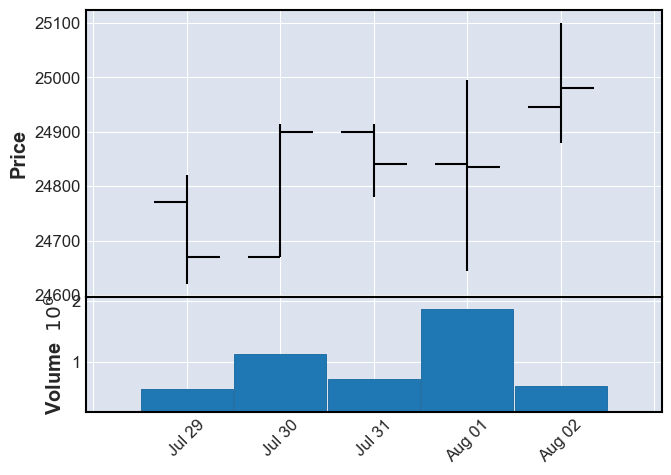

상승?0 횡보?1 하락?20
82 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-08-05   245874  25005  24965  24840  24850  (2013, 32)
2013-08-06   382871  24900  24850  24495  24620  (2013, 32)
2013-08-07   470692  24520  24520  24235  24235  (2013, 32)
2013-08-08   668548  24485  24235  24230  24305  (2013, 32)
2013-08-09  1010059  24390  24305  24185  24315  (2013, 32)


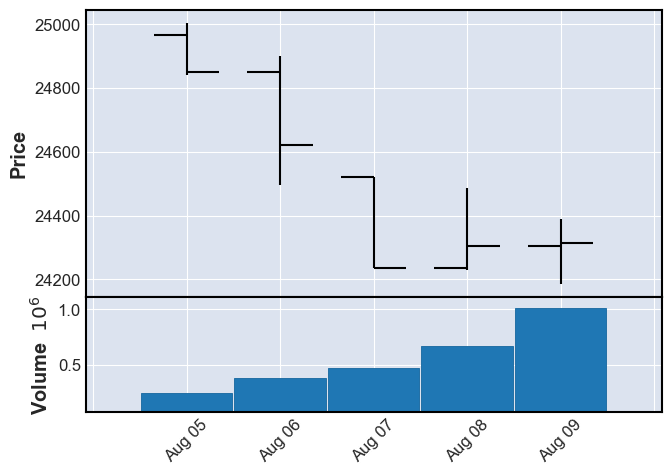

상승?0 횡보?1 하락?22
83 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-08-12   381019  24465  24310  24210  24375  (2013, 33)
2013-08-13   268179  24755  24400  24400  24740  (2013, 33)
2013-08-14   569482  24935  24745  24730  24925  (2013, 33)
2013-08-16  1020570  25030  24600  24595  24850  (2013, 33)


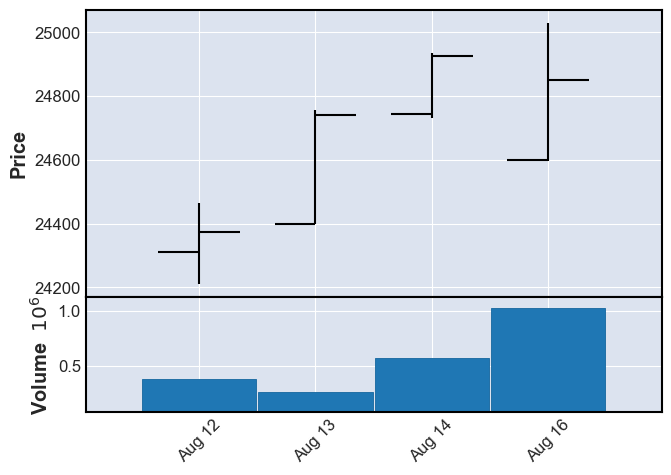

상승?0 횡보?1 하락?20
84 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-08-19   865532  24880  24850  24730  24880  (2013, 34)
2013-08-20  1490033  24995  24790  24495  24510  (2013, 34)
2013-08-21  2707051  24630  24530  24165  24200  (2013, 34)
2013-08-22  1828635  24120  23980  23855  23980  (2013, 34)
2013-08-23  1216097  24375  24100  24070  24300  (2013, 34)


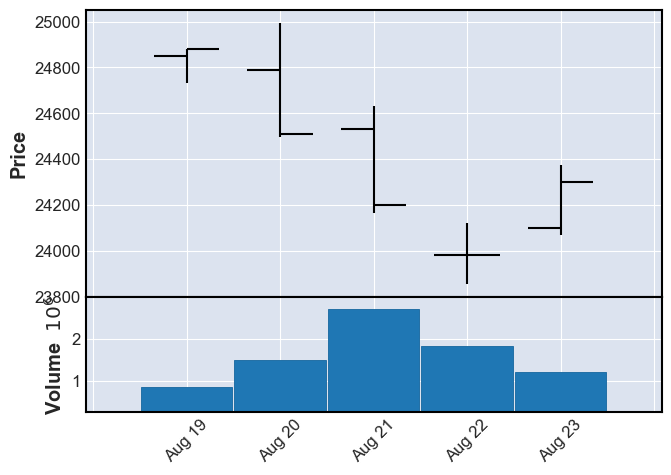

상승?0 횡보?1 하락?22
85 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-08-26   424882  24640  24305  24305  24545  (2013, 35)
2013-08-27   566698  24675  24530  24475  24525  (2013, 35)
2013-08-28   580479  24600  24350  24250  24600  (2013, 35)
2013-08-29  1056762  25020  24600  24600  24925  (2013, 35)
2013-08-30  1542986  25230  25055  24985  25170  (2013, 35)


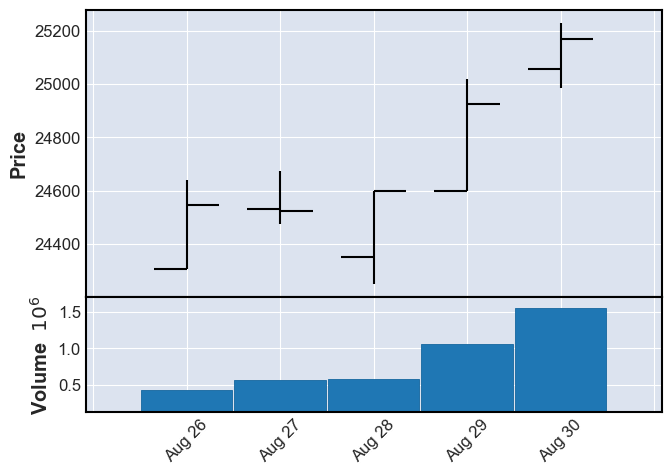

상승?0 횡보?1 하락?20
86 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-09-02  1033206  25325  25070  25070  25170  (2013, 36)
2013-09-03  1713597  25400  25205  25205  25280  (2013, 36)
2013-09-04  1374935  25340  25270  25100  25295  (2013, 36)
2013-09-05  2914276  25605  25360  25310  25540  (2013, 36)
2013-09-06  1853983  25720  25540  25490  25605  (2013, 36)


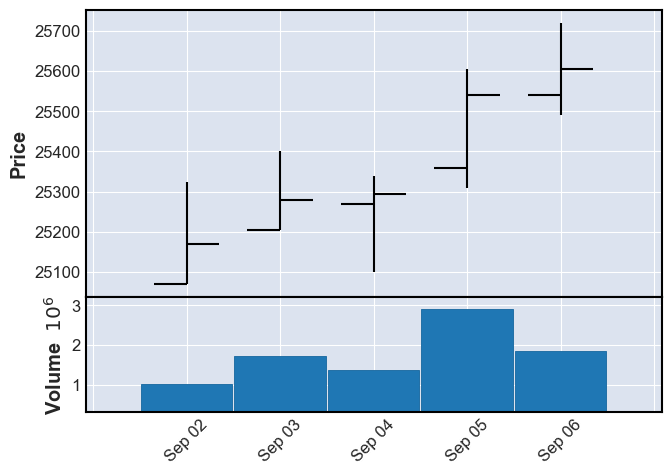

상승?0 횡보?1 하락?20
87 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-09-09  2464983  25915  25665  25665  25835  (2013, 37)
2013-09-10  2708175  26130  25860  25850  26130  (2013, 37)
2013-09-11  2820221  26275  26130  26080  26230  (2013, 37)
2013-09-12  4050407  26535  26235  26235  26235  (2013, 37)
2013-09-13  2399211  26345  26115  26095  26105  (2013, 37)


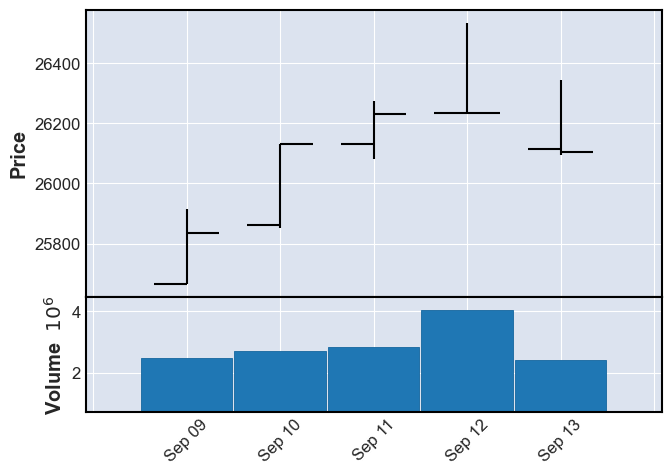

상승?0 횡보?1 하락?20
88 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-09-16  2322059  26550  26425  26365  26435  (2013, 38)
2013-09-17  1163938  26435  26435  26180  26240  (2013, 38)


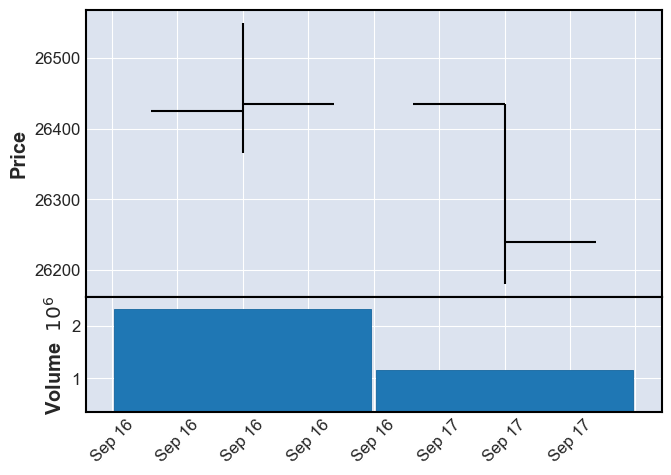

상승?0 횡보?1 하락?22
89 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-09-23  1494717  26495  26240  26105  26315  (2013, 39)
2013-09-24  1239102  26375  26260  26125  26300  (2013, 39)
2013-09-25  1379333  26340  26290  26100  26155  (2013, 39)
2013-09-26   705887  26400  26155  26065  26400  (2013, 39)
2013-09-27   465097  26470  26400  26310  26415  (2013, 39)


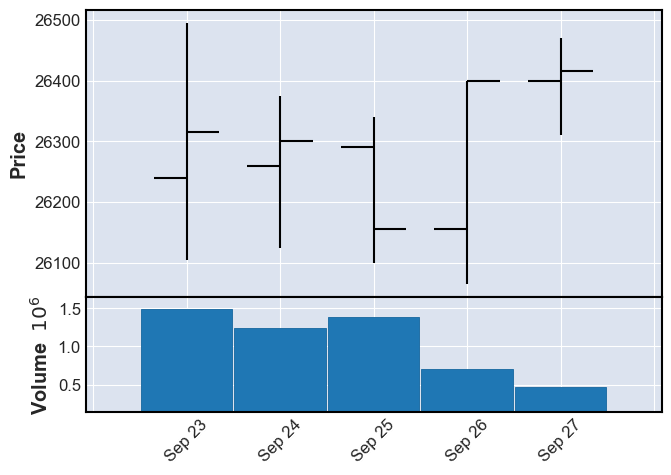

상승?0 횡보?1 하락?21
90 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-09-30   909387  26340  26175  26095  26185  (2013, 40)
2013-10-01   559834  26425  26185  26110  26235  (2013, 40)
2013-10-02   986336  26505  26505  26240  26255  (2013, 40)
2013-10-04  1174249  26310  26200  26045  26200  (2013, 40)


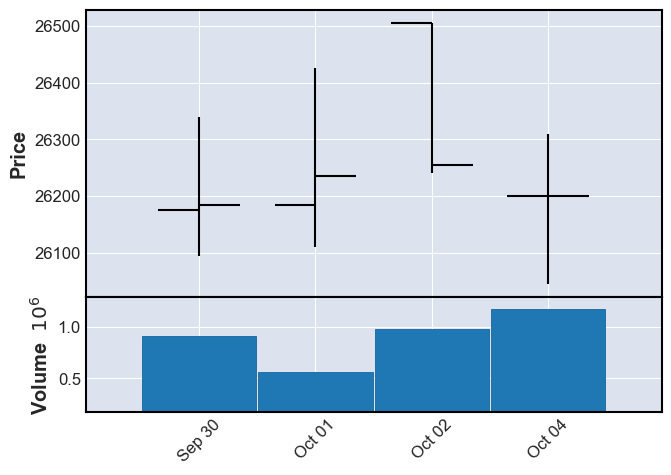

상승?0 횡보?1 하락?21
91 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-10-07   567409  26305  26200  26150  26215  (2013, 41)
2013-10-08   507922  26335  26100  26035  26330  (2013, 41)
2013-10-10  1518793  26435  26270  26220  26280  (2013, 41)
2013-10-11  1563171  26765  26450  26445  26715  (2013, 41)


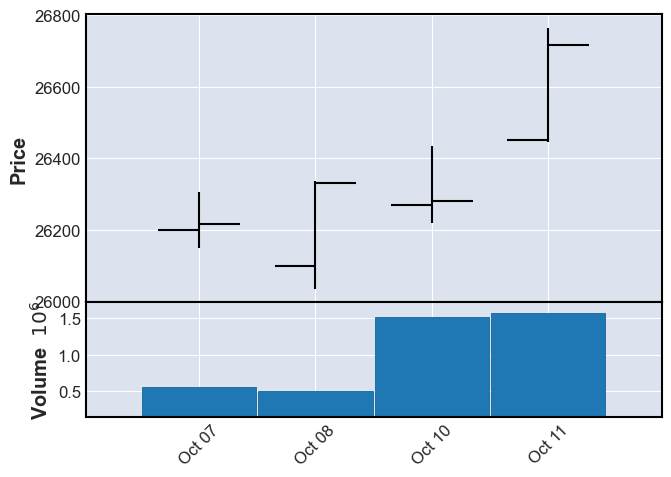

상승?0 횡보?1 하락?20
92 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-10-14  1096663  26780  26660  26660  26685  (2013, 42)
2013-10-15  2250287  27055  26825  26825  26915  (2013, 42)
2013-10-16  1727152  27125  26945  26925  26935  (2013, 42)
2013-10-17  1071191  27190  27055  27000  27065  (2013, 42)
2013-10-18  2016470  27200  27095  27090  27165  (2013, 42)


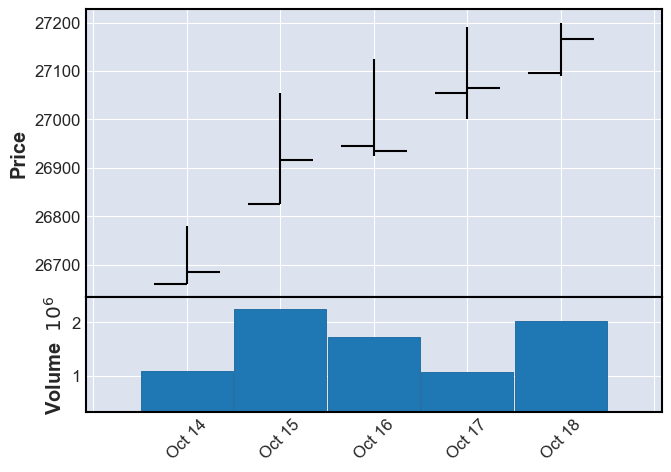

상승?0 횡보?1 하락?20
93 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-10-21  1669365  27280  27165  27165  27190  (2013, 43)
2013-10-22  1410731  27210  27190  27090  27195  (2013, 43)
2013-10-23  2494271  27290  27235  26860  26860  (2013, 43)
2013-10-24  1022143  26965  26840  26785  26965  (2013, 43)
2013-10-25  1277336  26990  26965  26660  26770  (2013, 43)


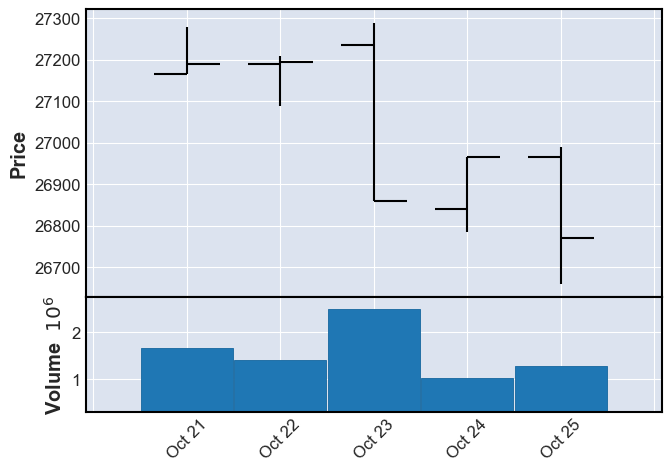

상승?0 횡보?1 하락?22
94 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-10-28   607001  27030  26825  26815  27000  (2013, 44)
2013-10-29  1112322  27170  26940  26890  27110  (2013, 44)
2013-10-30   767636  27125  27080  26900  27105  (2013, 44)
2013-10-31   661351  27025  26990  26720  26765  (2013, 44)
2013-11-01   754604  26820  26760  26720  26810  (2013, 44)


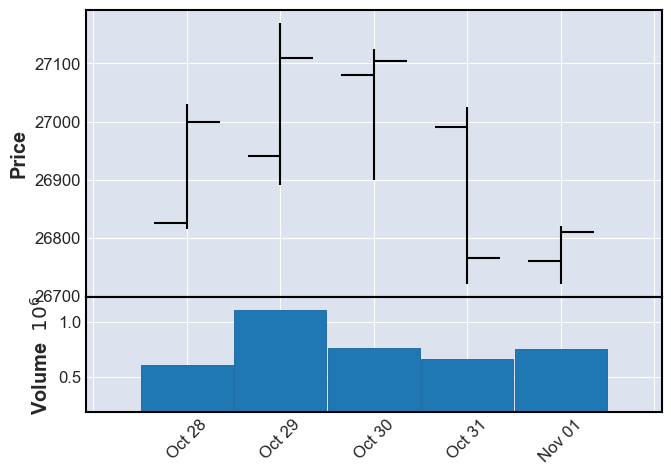

상승?0 횡보?1 하락?22
95 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-11-04  1474852  26790  26790  26560  26620  (2013, 45)
2013-11-05  1863749  26645  26620  26375  26445  (2013, 45)
2013-11-06  1068323  26550  26440  26375  26445  (2013, 45)
2013-11-07  2447307  26445  26410  26210  26250  (2013, 45)
2013-11-08  3930840  26185  26100  26010  26030  (2013, 45)


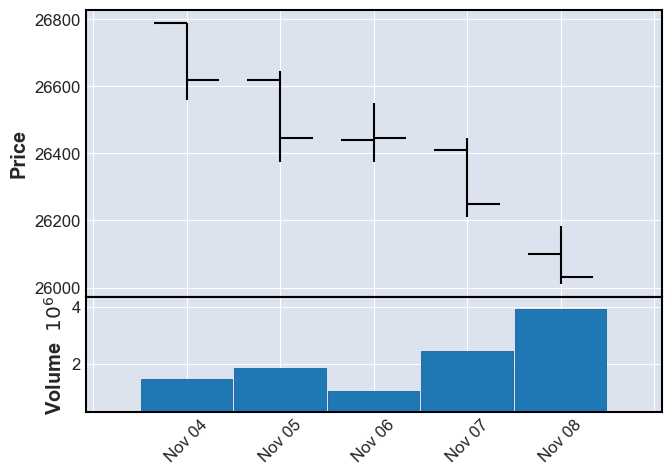

상승?0 횡보?1 하락?22
96 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-11-11  1317506  26140  26080  25980  26035  (2013, 46)
2013-11-12   859047  26305  26035  26035  26250  (2013, 46)
2013-11-13  3927305  26190  26190  25760  25760  (2013, 46)
2013-11-14  1219681  26000  25875  25770  25870  (2013, 46)
2013-11-15   962521  26425  25990  25990  26395  (2013, 46)


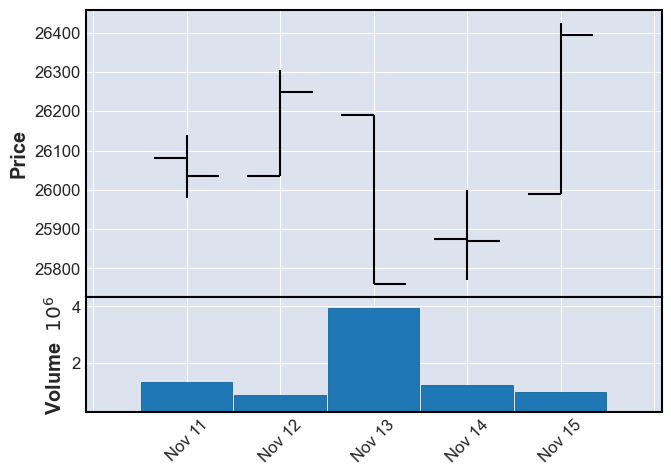

상승?0 횡보?1 하락?21
97 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-11-18  1243520  26540  26450  26410  26445  (2013, 47)
2013-11-19  1423994  26860  26445  26400  26760  (2013, 47)
2013-11-20  1254588  26750  26675  26510  26550  (2013, 47)
2013-11-21  3001366  26500  26470  26060  26130  (2013, 47)
2013-11-22   664837  26470  26240  26175  26370  (2013, 47)


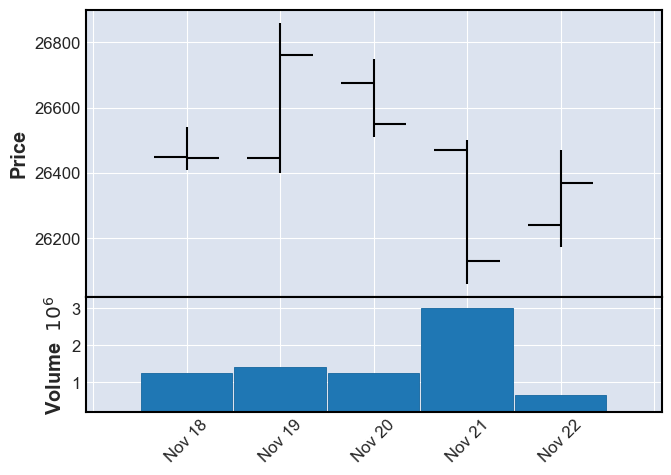

상승?0 횡보?1 하락?21
98 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-11-25  1301092  26775  26470  26465  26540  (2013, 48)
2013-11-26  1702447  26660  26395  26225  26640  (2013, 48)
2013-11-27  2542702  26730  26470  26390  26730  (2013, 48)
2013-11-28  3426958  27025  26845  26845  26940  (2013, 48)
2013-11-29  1982914  27070  26880  26880  26980  (2013, 48)


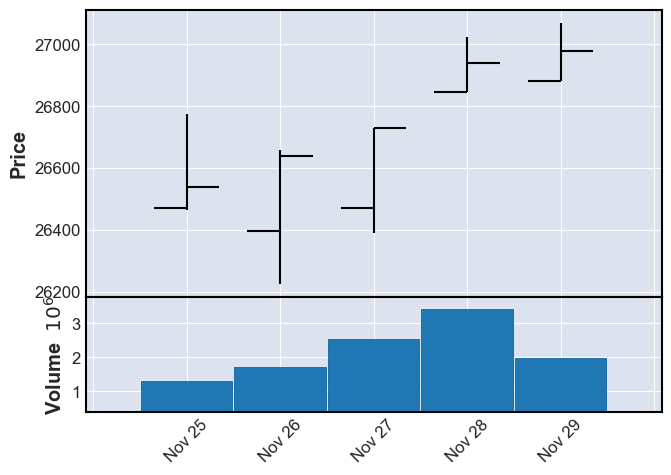

상승?0 횡보?1 하락?20
99 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-12-02   502539  27090  26925  26720  26770  (2013, 49)
2013-12-03  1980107  26665  26570  26430  26435  (2013, 49)
2013-12-04  2819265  26385  26320  26135  26150  (2013, 49)
2013-12-05  4248025  26200  26150  25870  26085  (2013, 49)
2013-12-06  1475777  26170  26085  26020  26105  (2013, 49)


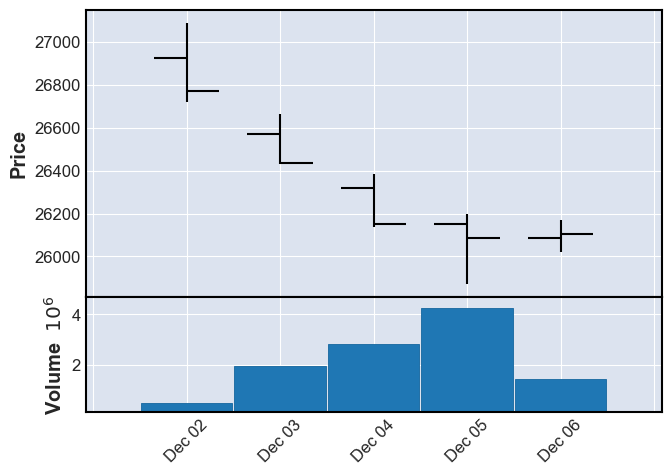

상승?0 횡보?1 하락?22
100 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-12-09   515593  26415  26370  26270  26330  (2013, 50)
2013-12-10   480476  26335  26330  26220  26245  (2013, 50)
2013-12-11  3628572  26380  26140  25950  25985  (2013, 50)
2013-12-12  5497172  25940  25870  25720  25930  (2013, 50)
2013-12-13  2919186  25915  25915  25595  25815  (2013, 50)


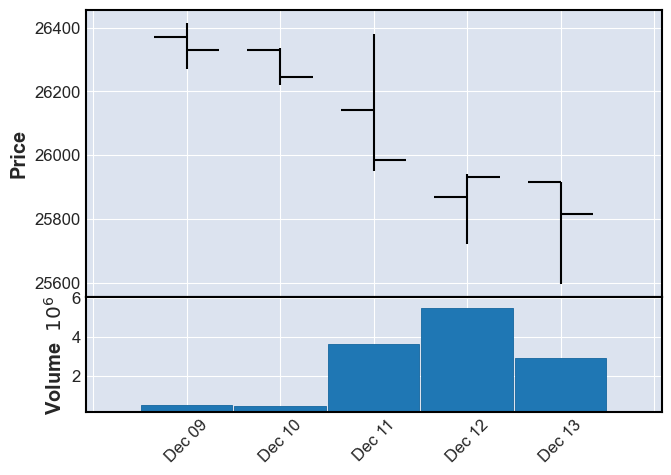

상승?0 횡보?1 하락?22
101 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-12-16  1393498  25885  25740  25650  25790  (2013, 51)
2013-12-17  1329501  26070  25950  25850  25890  (2013, 51)
2013-12-18  1860790  26130  25895  25890  26050  (2013, 51)
2013-12-19  2504417  26400  26355  25905  26060  (2013, 51)
2013-12-20   770960  26175  26060  25995  26115  (2013, 51)


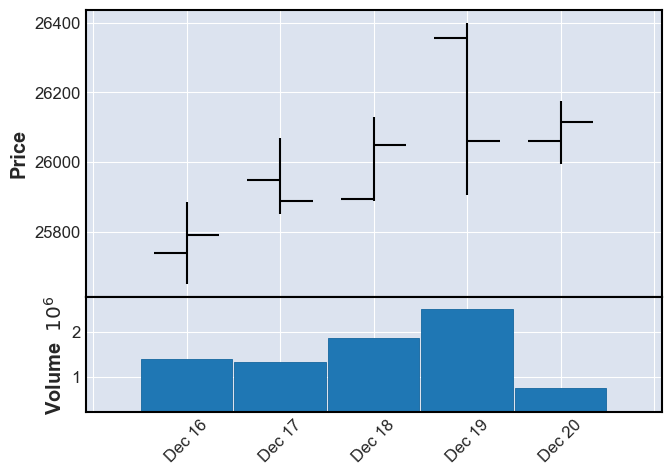

상승?0 횡보?1 하락?20
102 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2013-12-23  2490762  26415  26215  26215  26335  (2013, 52)
2013-12-24  2140952  26510  26385  26330  26400  (2013, 52)
2013-12-26  2372456  26525  26410  26370  26405  (2013, 52)
2013-12-27  1234793  26655  26390  26355  26605  (2013, 52)


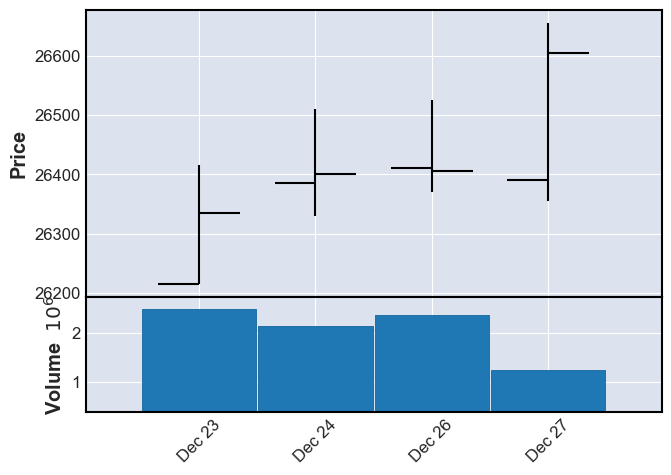

상승?0 횡보?1 하락?20
103 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2013-12-30  2677659  26780  26780  26575  26670  (2014, 1)
2014-01-02  2999220  26750  26735  25975  25975  (2014, 1)
2014-01-03  4503430  25945  25930  25550  25705  (2014, 1)


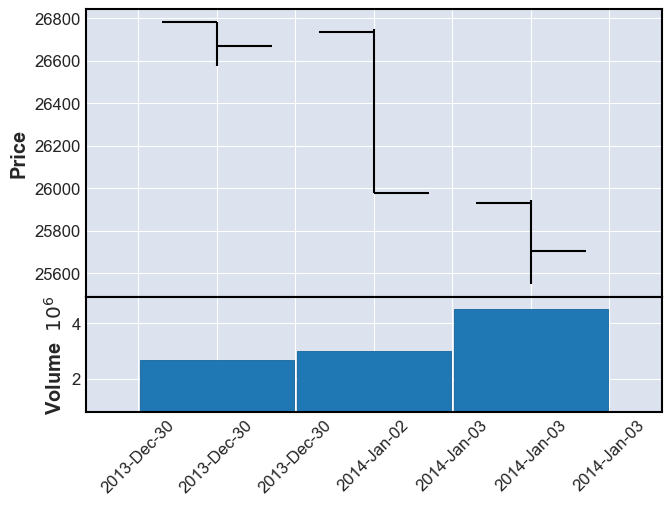

상승?0 횡보?1 하락?22
104 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-01-06  1099918  25930  25665  25640  25760  (2014, 2)
2014-01-07   872194  25950  25585  25585  25855  (2014, 2)
2014-01-08  1998484  25975  25870  25690  25845  (2014, 2)
2014-01-09  5467078  25880  25845  25705  25730  (2014, 2)
2014-01-10  2773031  25785  25665  25400  25515  (2014, 2)


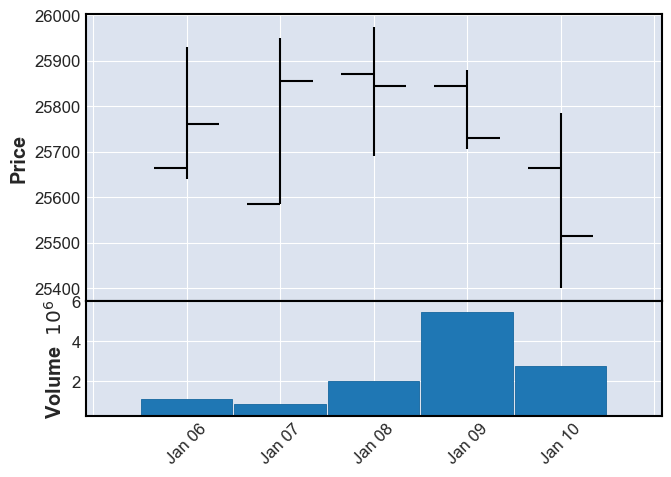

상승?0 횡보?1 하락?22
105 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-01-13   318813  25730  25530  25530  25680  (2014, 3)
2014-01-14  1132338  25875  25680  25500  25650  (2014, 3)
2014-01-15   450200  25800  25730  25630  25700  (2014, 3)
2014-01-16   388840  25905  25700  25700  25820  (2014, 3)
2014-01-17   934365  25840  25815  25560  25600  (2014, 3)


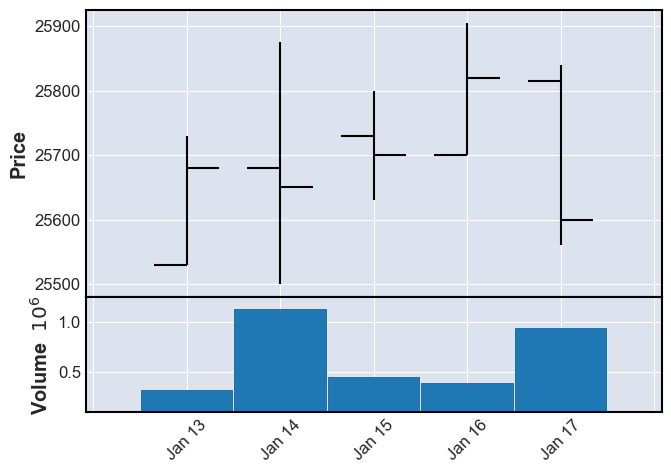

상승?0 횡보?1 하락?21
106 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-01-20   694237  25800  25540  25430  25755  (2014, 4)
2014-01-21   452705  25950  25755  25690  25945  (2014, 4)
2014-01-22   366198  25940  25920  25840  25905  (2014, 4)
2014-01-23   983403  25965  25920  25615  25615  (2014, 4)
2014-01-24  3270790  25600  25500  25360  25555  (2014, 4)


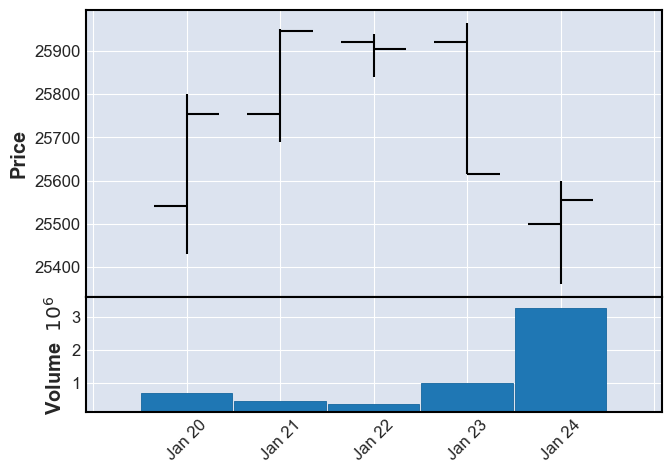

상승?0 횡보?1 하락?22
107 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-01-27  2882183  25325  25190  25030  25260  (2014, 5)
2014-01-28   544481  25340  25210  25125  25300  (2014, 5)
2014-01-29   791553  25625  25400  25390  25610  (2014, 5)


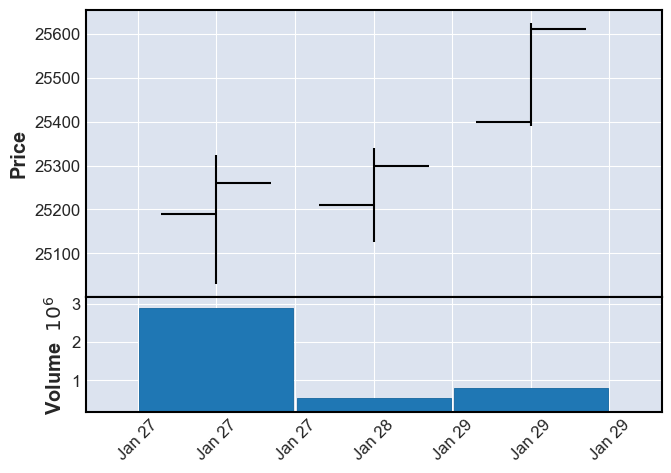

상승?0 횡보?1 하락?20
108 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-02-03  1090577  25500  25400  25205  25275  (2014, 6)
2014-02-04  2376314  25020  25020  24740  24815  (2014, 6)
2014-02-05   619188  24970  24890  24785  24925  (2014, 6)
2014-02-06   598186  25180  24930  24930  25110  (2014, 6)
2014-02-07   684536  25330  25280  25135  25300  (2014, 6)


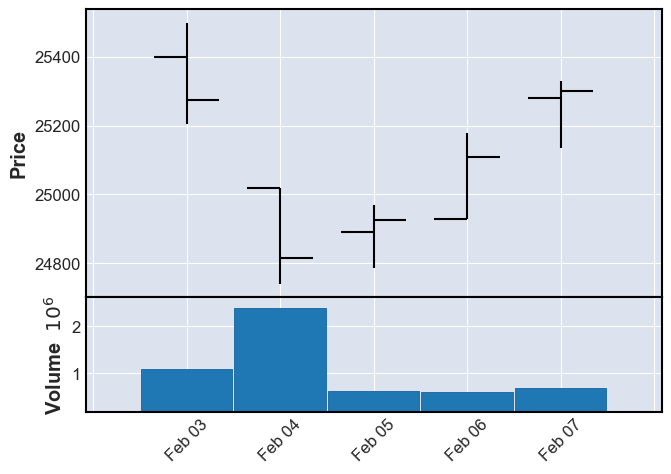

상승?0 횡보?1 하락?21
109 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-02-10   537428  25380  25300  25200  25290  (2014, 7)
2014-02-11   704527  25490  25275  25225  25430  (2014, 7)
2014-02-12  1101335  25615  25520  25430  25485  (2014, 7)
2014-02-13   645447  25595  25485  25265  25270  (2014, 7)
2014-02-14   956120  25680  25310  25310  25600  (2014, 7)


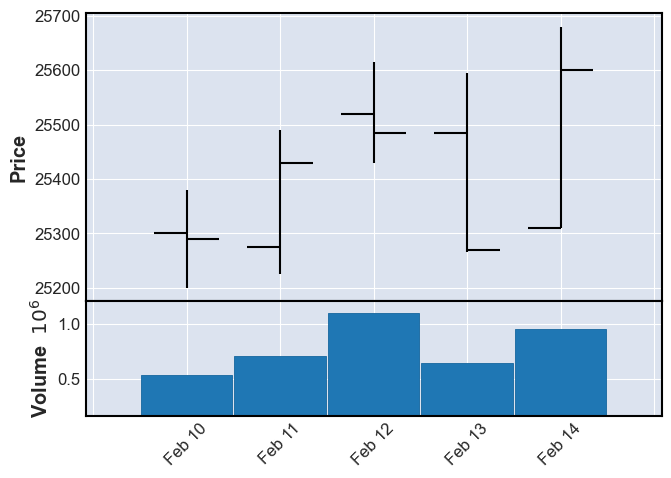

상승?0 횡보?1 하락?20
110 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-02-17  1413121  25800  25745  25605  25630  (2014, 8)
2014-02-18   966628  25700  25630  25440  25650  (2014, 8)
2014-02-19   792849  25600  25600  25370  25500  (2014, 8)
2014-02-20  1355909  25535  25420  25290  25380  (2014, 8)
2014-02-21  1024299  25755  25530  25530  25750  (2014, 8)


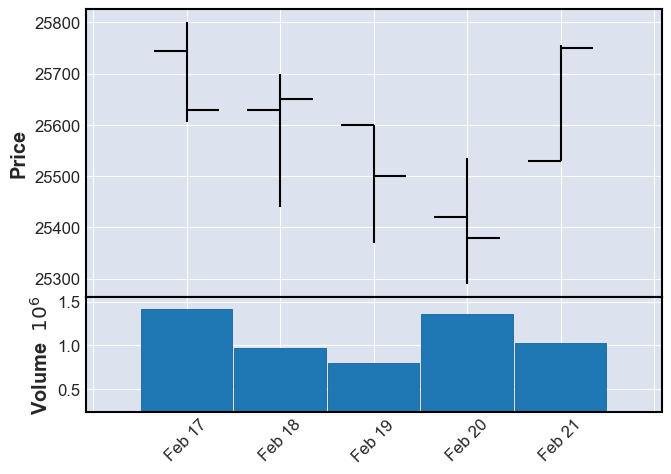

상승?0 횡보?1 하락?21
111 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-02-24   740961  25795  25750  25595  25645  (2014, 9)
2014-02-25  1057295  25935  25750  25745  25865  (2014, 9)
2014-02-26  1250489  26015  25865  25800  25995  (2014, 9)
2014-02-27  1144464  26040  25995  25880  26010  (2014, 9)
2014-02-28  1470736  26140  26010  25965  26010  (2014, 9)


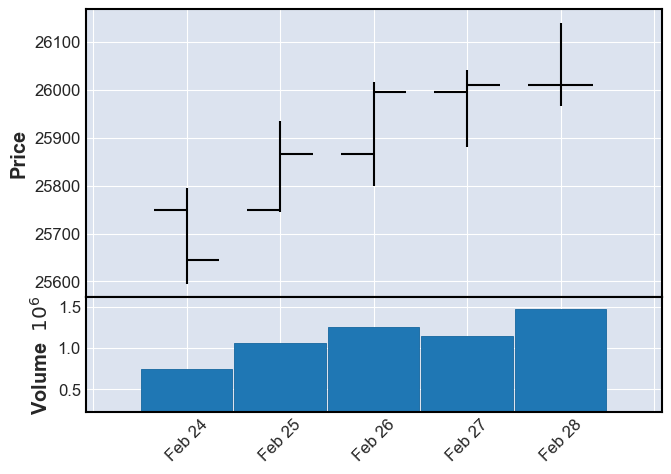

상승?0 횡보?1 하락?20
112 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-03-03  2316454  25895  25895  25700  25840  (2014, 10)
2014-03-04  1082433  25840  25785  25720  25775  (2014, 10)
2014-03-05   500947  26090  25985  25985  26010  (2014, 10)
2014-03-06   430491  26030  26010  25960  26020  (2014, 10)
2014-03-07   381459  26125  26065  25870  25970  (2014, 10)


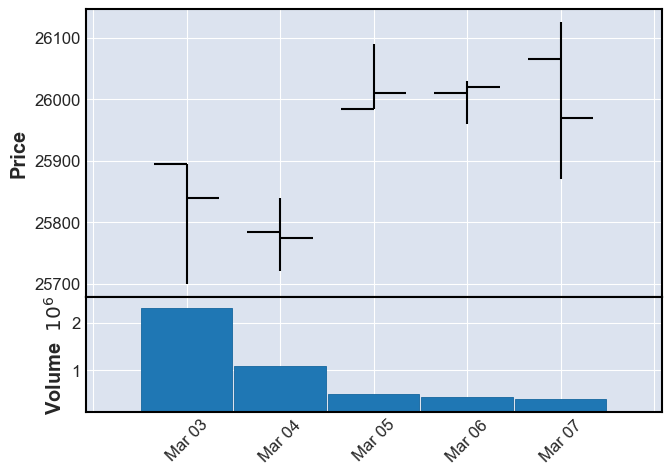

상승?0 횡보?1 하락?21
113 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-03-10  3029837  25835  25835  25640  25655  (2014, 11)
2014-03-11   732353  25755  25660  25640  25740  (2014, 11)
2014-03-12  2212853  25700  25700  25345  25375  (2014, 11)
2014-03-13  2322639  25520  25520  25320  25455  (2014, 11)
2014-03-14  1414379  25230  25230  25055  25175  (2014, 11)


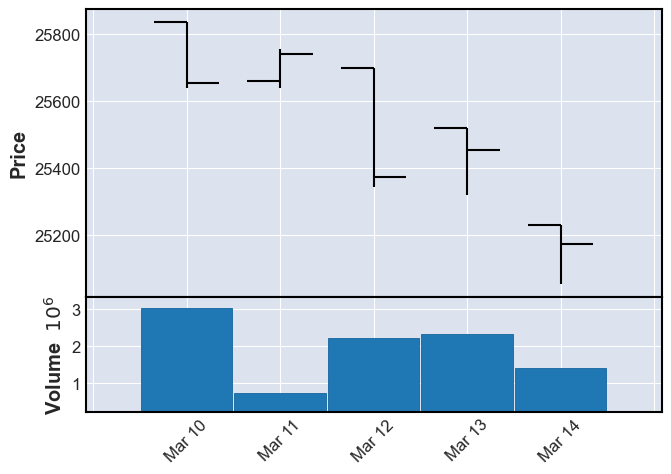

상승?0 횡보?1 하락?22
114 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-03-17   494469  25285  25175  25095  25280  (2014, 12)
2014-03-18   777620  25530  25430  25290  25430  (2014, 12)
2014-03-19   344283  25565  25495  25385  25445  (2014, 12)
2014-03-20  1193547  25365  25260  25110  25150  (2014, 12)
2014-03-21   728187  25335  25255  25190  25335  (2014, 12)


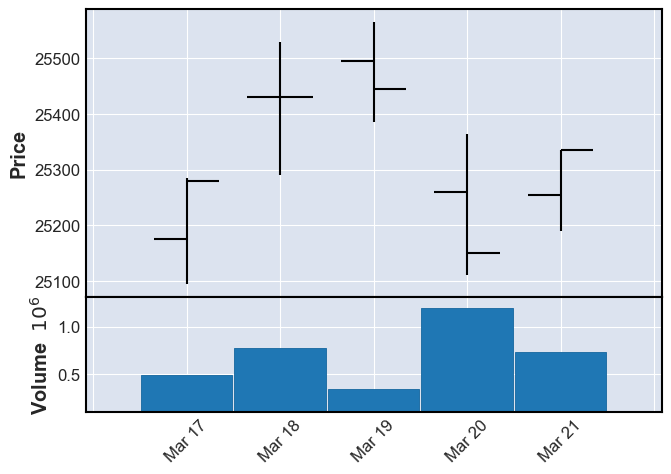

상승?0 횡보?1 하락?21
115 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-03-24   722516  25550  25335  25335  25475  (2014, 13)
2014-03-25   699196  25515  25465  25360  25425  (2014, 13)
2014-03-26   996352  25820  25570  25570  25800  (2014, 13)
2014-03-27   969665  25965  25800  25770  25920  (2014, 13)
2014-03-28  1108365  26060  25920  25895  25930  (2014, 13)


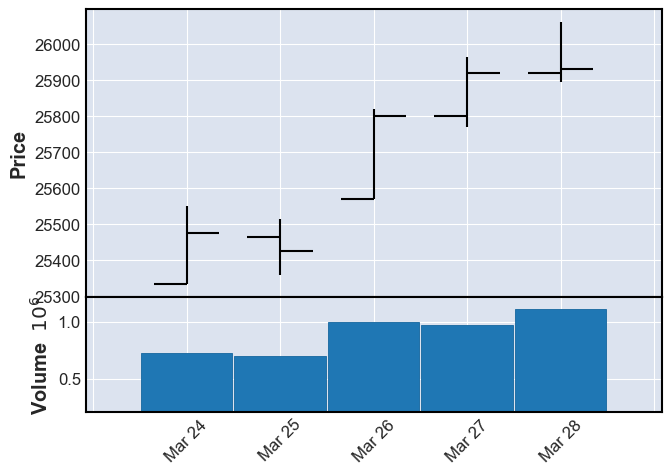

상승?0 횡보?1 하락?20
116 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-03-31  1166703  26085  25985  25910  26005  (2014, 14)
2014-04-01   990634  26170  25965  25900  26100  (2014, 14)
2014-04-02  1674071  26230  26160  26135  26165  (2014, 14)
2014-04-03  1523684  26360  26170  26145  26145  (2014, 14)
2014-04-04   592860  26305  26145  26145  26220  (2014, 14)


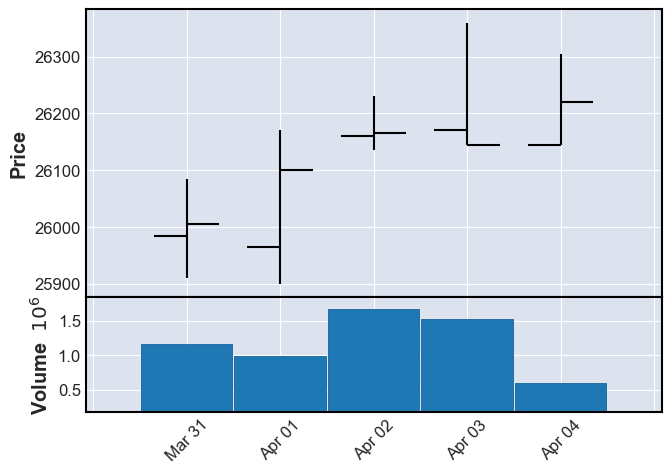

상승?0 횡보?1 하락?20
117 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-04-07   631766  26245  26150  26070  26205  (2014, 15)
2014-04-08   511693  26360  26170  26080  26325  (2014, 15)
2014-04-09   600290  26435  26335  26330  26345  (2014, 15)
2014-04-10  1502605  26515  26445  26360  26420  (2014, 15)
2014-04-11   929992  26260  26170  26130  26220  (2014, 15)


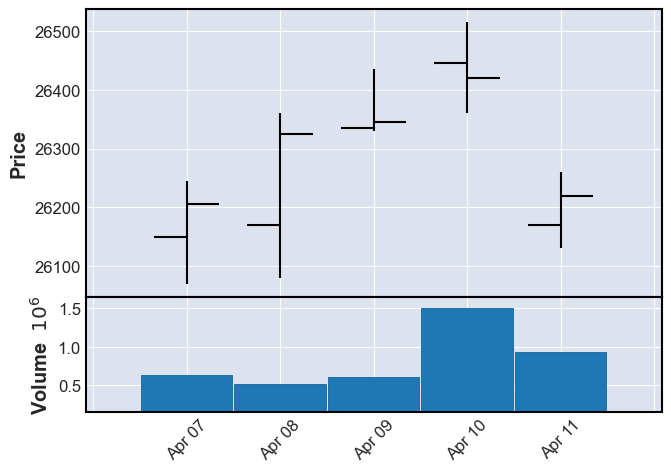

상승?0 횡보?1 하락?21
118 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-04-14   775940  26350  26215  26165  26290  (2014, 16)
2014-04-15  1199532  26410  26350  26135  26150  (2014, 16)
2014-04-16   385798  26290  26150  26060  26255  (2014, 16)
2014-04-17   509142  26350  26300  26150  26215  (2014, 16)
2014-04-18  1074656  26440  26325  26325  26430  (2014, 16)


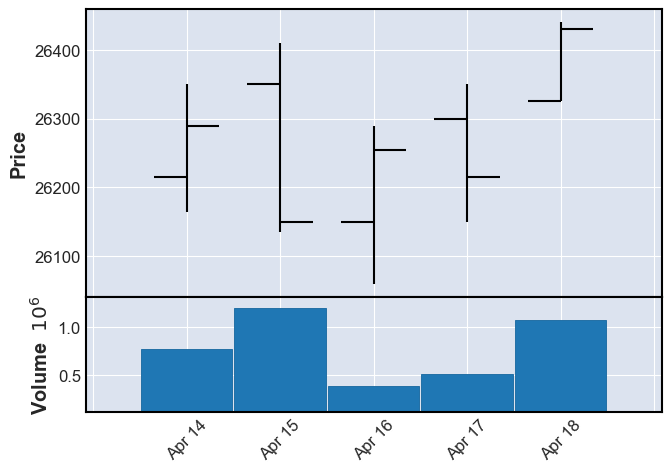

상승?0 횡보?1 하락?21
119 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-04-21   388923  26410  26410  26270  26365  (2014, 17)
2014-04-22   781008  26420  26365  26210  26360  (2014, 17)
2014-04-23   628700  26500  26500  26300  26335  (2014, 17)
2014-04-24  2296316  26435  26350  26260  26330  (2014, 17)
2014-04-25   800233  26325  26325  25940  25945  (2014, 17)


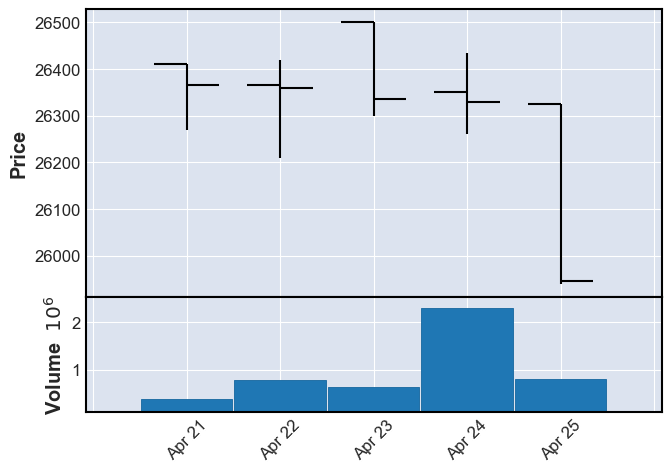

상승?0 횡보?1 하락?22
120 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-04-28   865503  26020  25900  25865  25955  (2014, 18)
2014-04-29  1436330  25735  25710  25535  25540  (2014, 18)
2014-04-30   599046  25650  25615  25425  25470  (2014, 18)
2014-05-02   987683  25555  25500  25400  25465  (2014, 18)


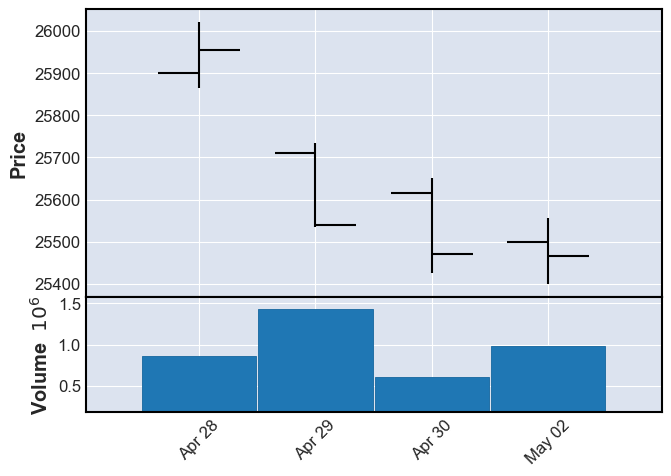

상승?0 횡보?1 하락?22
121 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-05-07  1713302  25500  25480  25155  25215  (2014, 19)
2014-05-08  2266995  25325  25280  25100  25325  (2014, 19)
2014-05-09  1039076  25435  25320  25275  25335  (2014, 19)


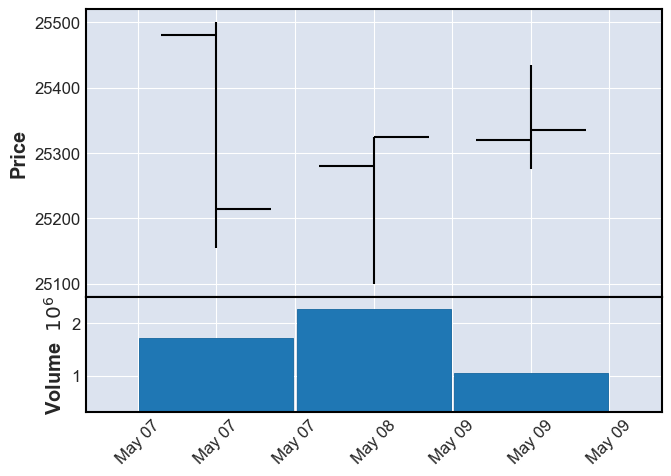

상승?0 횡보?1 하락?20
122 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-05-12   759924  25520  25335  25265  25485  (2014, 20)
2014-05-13   735919  25930  25575  25570  25835  (2014, 20)
2014-05-14  1094446  26205  25835  25835  26175  (2014, 20)
2014-05-15  1224746  26325  26175  26165  26180  (2014, 20)
2014-05-16  1182396  26210  26105  26070  26170  (2014, 20)


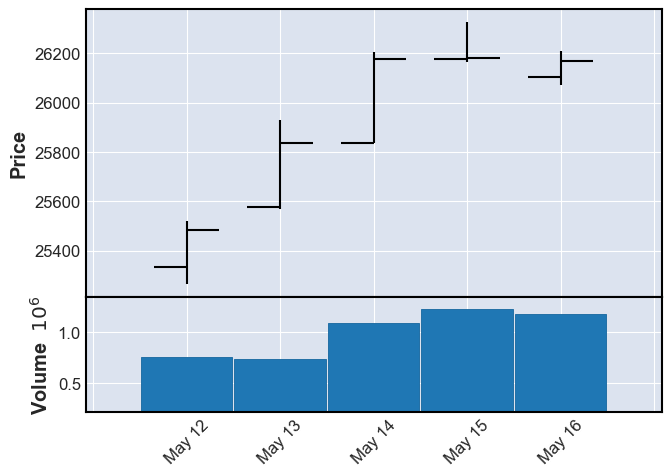

상승?0 횡보?1 하락?20
123 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-05-19  1254778  26250  26185  26070  26240  (2014, 21)
2014-05-20  1186178  26285  26165  26165  26195  (2014, 21)
2014-05-21   785020  26360  26105  26095  26225  (2014, 21)
2014-05-22  1130526  26435  26260  26250  26350  (2014, 21)
2014-05-23   775742  26370  26350  26280  26285  (2014, 21)


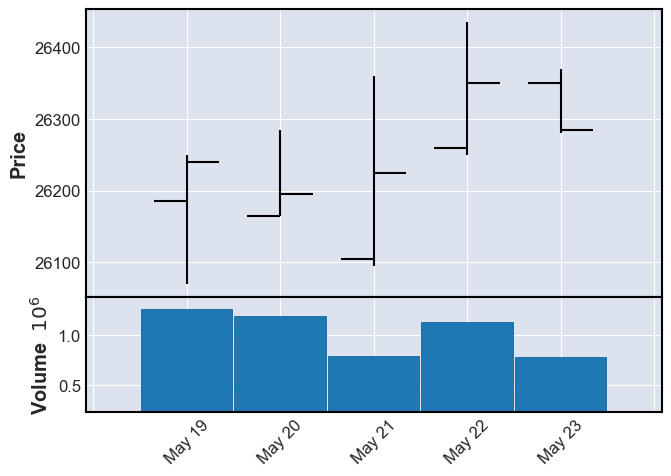

상승?0 횡보?1 하락?21
124 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-05-26   437739  26360  26285  26220  26235  (2014, 22)
2014-05-27  1054323  26300  26240  25880  25970  (2014, 22)
2014-05-28   514110  26280  26035  25970  26280  (2014, 22)
2014-05-29   633969  26335  26280  26180  26220  (2014, 22)
2014-05-30   965414  26300  26220  26045  26045  (2014, 22)


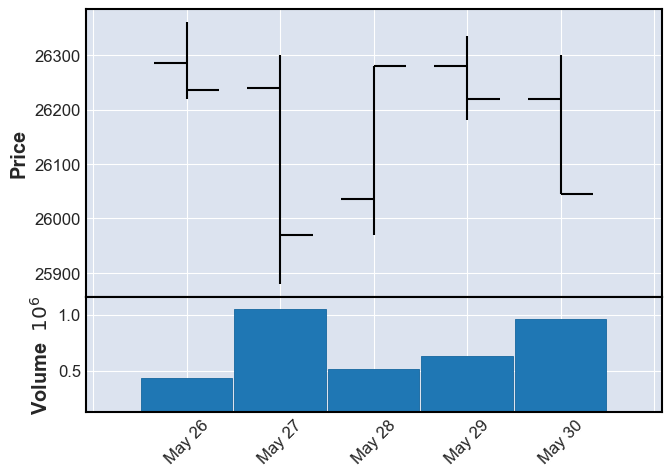

상승?0 횡보?1 하락?22
125 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2014-06-02  738114  26175  26045  26015  26090  (2014, 23)
2014-06-03  885355  26135  26095  25920  26135  (2014, 23)
2014-06-05  975067  26135  26135  25900  25965  (2014, 23)


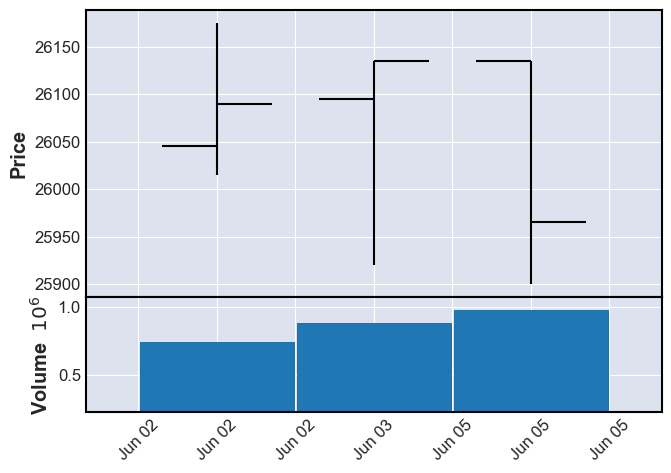

상승?0 횡보?1 하락?21
126 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-06-09   705097  26220  26055  25940  25945  (2014, 24)
2014-06-10   519661  26220  26080  26055  26210  (2014, 24)
2014-06-11   473671  26300  26210  26145  26210  (2014, 24)
2014-06-12   802976  26225  26135  26065  26095  (2014, 24)
2014-06-13  1512989  26120  26090  25725  25780  (2014, 24)


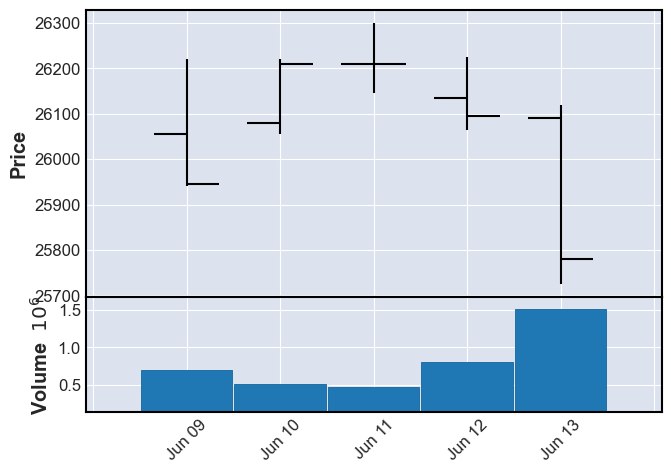

상승?0 횡보?1 하락?21
127 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-06-16   739979  25940  25780  25735  25920  (2014, 25)
2014-06-17   450370  26020  25920  25865  25975  (2014, 25)
2014-06-18   520242  25975  25975  25810  25820  (2014, 25)
2014-06-19   633734  26035  25915  25805  25885  (2014, 25)
2014-06-20  1186309  25885  25885  25485  25530  (2014, 25)


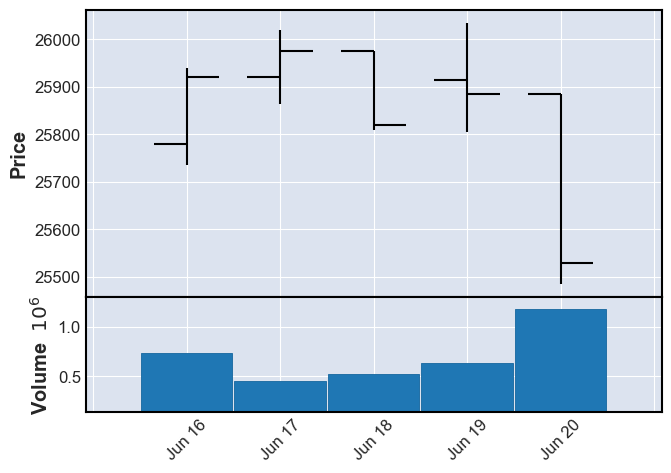

상승?0 횡보?1 하락?22
128 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-06-23   497551  25730  25585  25535  25660  (2014, 26)
2014-06-24  1188847  26025  25655  25610  25925  (2014, 26)
2014-06-25  1756338  25955  25885  25760  25775  (2014, 26)
2014-06-26  1768313  26030  25785  25785  25950  (2014, 26)
2014-06-27   320864  26025  25950  25780  25895  (2014, 26)


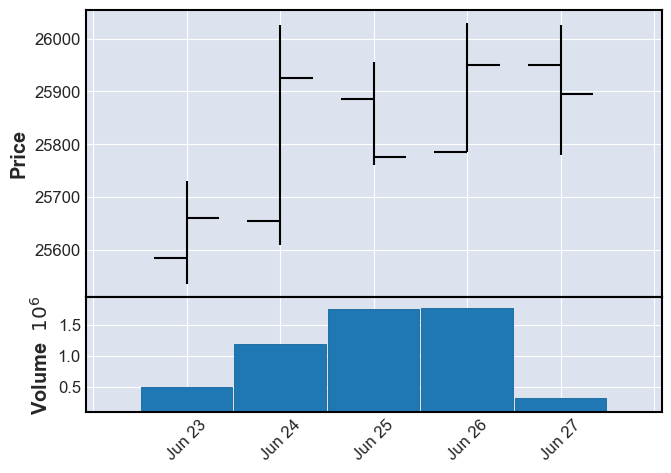

상승?0 횡보?1 하락?20
129 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-06-30   627746  26065  25895  25895  25935  (2014, 27)
2014-07-01   368104  26000  25935  25780  25965  (2014, 27)
2014-07-02  1009798  26230  26050  26040  26155  (2014, 27)
2014-07-03   597391  26185  26110  26080  26095  (2014, 27)
2014-07-04   360286  26200  26180  26030  26070  (2014, 27)


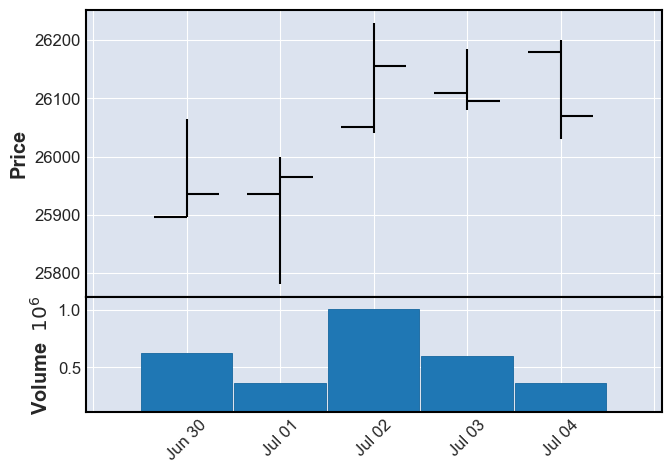

상승?0 횡보?1 하락?21
130 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-07-07   517396  26060  26060  25840  25915  (2014, 28)
2014-07-08   786806  25995  25910  25820  25930  (2014, 28)
2014-07-09  1132937  25850  25850  25725  25790  (2014, 28)
2014-07-10   567029  25925  25840  25810  25845  (2014, 28)
2014-07-11  1139000  25755  25755  25595  25670  (2014, 28)


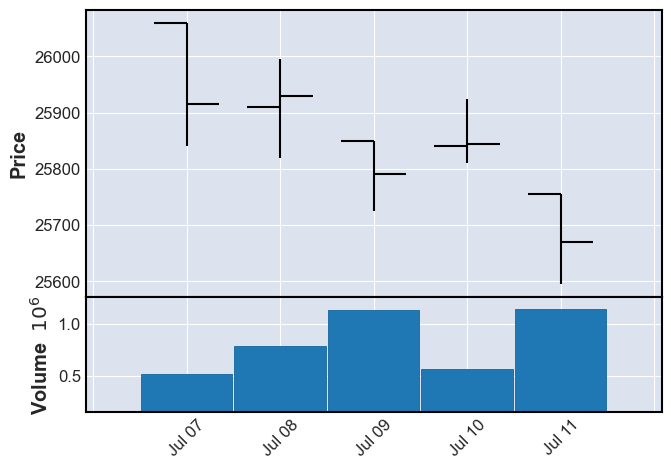

상승?0 횡보?1 하락?22
131 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-07-14   312483  25845  25735  25690  25730  (2014, 29)
2014-07-15   387088  26080  25800  25800  26000  (2014, 29)
2014-07-16  1655973  26105  26000  25990  26030  (2014, 29)
2014-07-17  1829795  26225  26045  26045  26120  (2014, 29)
2014-07-18   760146  26085  25950  25920  26080  (2014, 29)


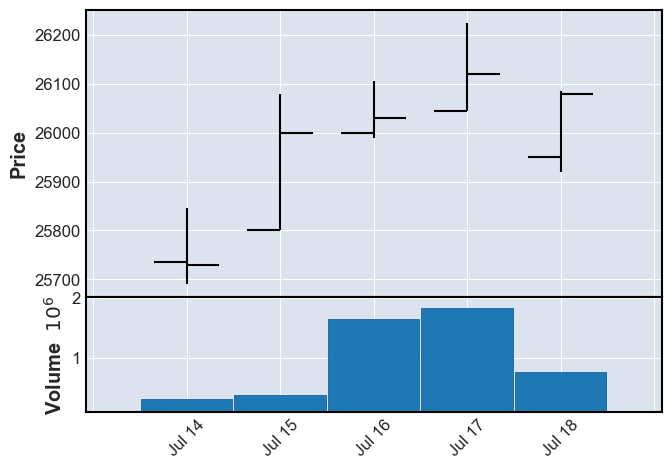

상승?0 횡보?1 하락?20
132 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-07-21  2245994  26295  26155  26095  26095  (2014, 30)
2014-07-22  1110642  26270  26095  26095  26250  (2014, 30)
2014-07-23  2409277  26330  26280  26225  26240  (2014, 30)
2014-07-24  2968245  26375  26215  26210  26275  (2014, 30)
2014-07-25  1968398  26360  26275  26275  26340  (2014, 30)


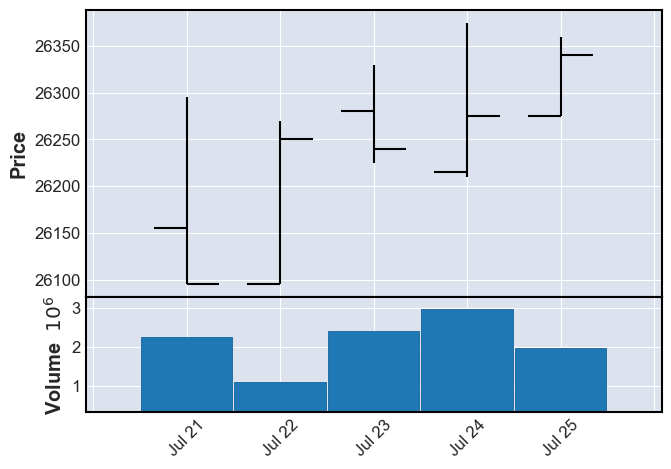

상승?0 횡보?1 하락?20
133 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-07-28  1089126  26615  26340  26340  26560  (2014, 31)
2014-07-29  2084863  26835  26615  26615  26800  (2014, 31)
2014-07-30  6020281  27290  26845  26845  27110  (2014, 31)
2014-07-31  6286061  27220  27070  26940  26970  (2014, 31)
2014-08-01  2421284  26995  26725  26725  26855  (2014, 31)


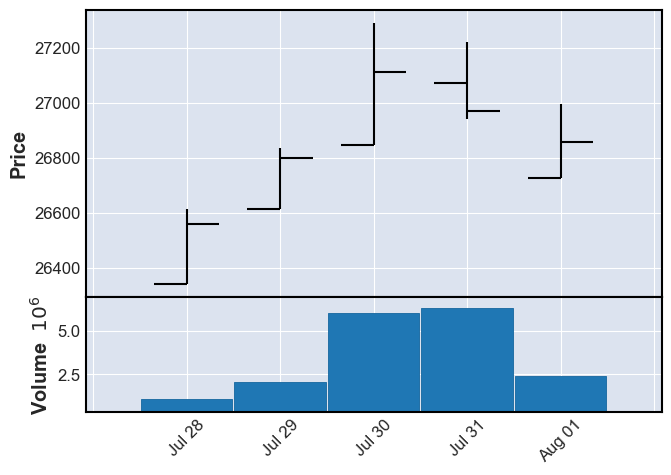

상승?0 횡보?1 하락?20
134 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-08-04  1440020  26965  26915  26780  26860  (2014, 32)
2014-08-05   879506  26840  26840  26645  26695  (2014, 32)
2014-08-06   880091  26730  26620  26545  26610  (2014, 32)
2014-08-07  1745958  26610  26610  26420  26500  (2014, 32)
2014-08-08  3340501  26475  26475  26120  26195  (2014, 32)


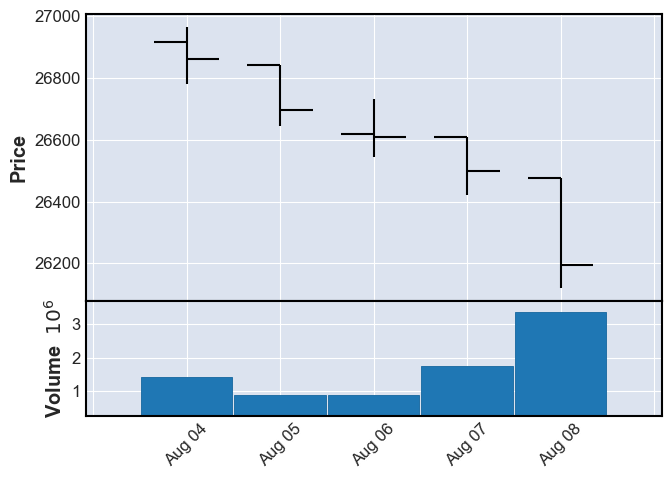

상승?0 횡보?1 하락?22
135 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-08-11  2233014  26390  26350  26255  26335  (2014, 33)
2014-08-12   928299  26500  26335  26330  26345  (2014, 33)
2014-08-13  1137345  26460  26355  26315  26460  (2014, 33)
2014-08-14  1086580  26690  26500  26450  26580  (2014, 33)


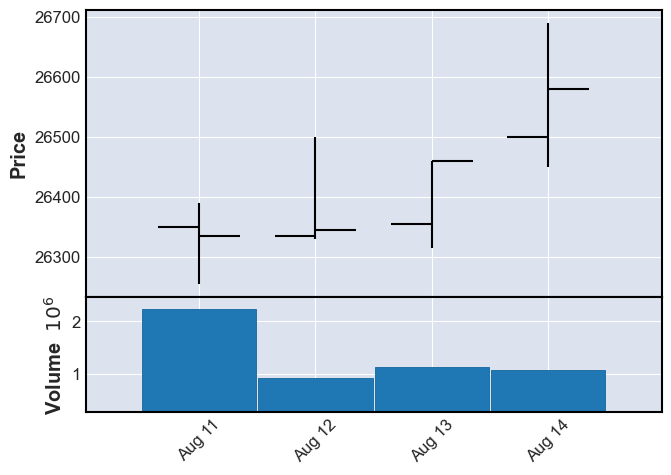

상승?0 횡보?1 하락?20
136 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-08-18   591051  26665  26620  26380  26395  (2014, 34)
2014-08-19   975465  26690  26400  26400  26610  (2014, 34)
2014-08-20   793561  26720  26690  26560  26580  (2014, 34)
2014-08-21  4340164  26580  26580  26135  26185  (2014, 34)
2014-08-22   394399  26395  26190  26185  26345  (2014, 34)


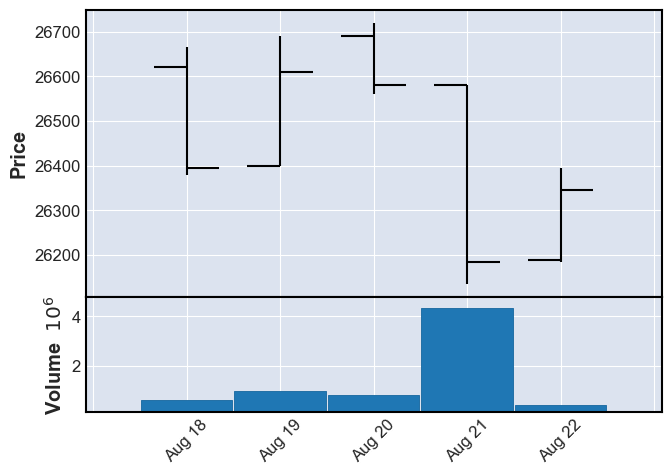

상승?0 횡보?1 하락?21
137 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-08-25   301245  26455  26265  26195  26420  (2014, 35)
2014-08-26   751922  26600  26460  26430  26505  (2014, 35)
2014-08-27  1503448  26690  26555  26515  26550  (2014, 35)
2014-08-28  1160167  26780  26560  26550  26550  (2014, 35)
2014-08-29  1075577  26530  26510  26330  26465  (2014, 35)


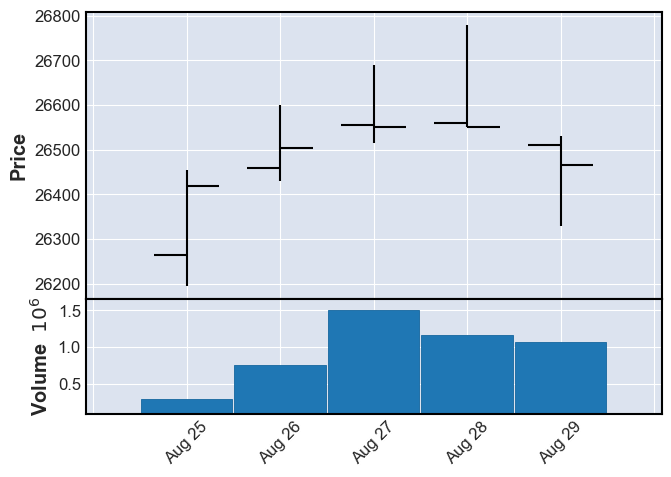

상승?0 횡보?1 하락?21
138 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-09-01  1030865  26495  26465  26365  26445  (2014, 36)
2014-09-02  2555009  26445  26445  26155  26205  (2014, 36)
2014-09-03  1880033  26205  26155  26010  26145  (2014, 36)
2014-09-04  1474394  26340  26280  26205  26230  (2014, 36)
2014-09-05  1233537  26270  26215  26050  26155  (2014, 36)


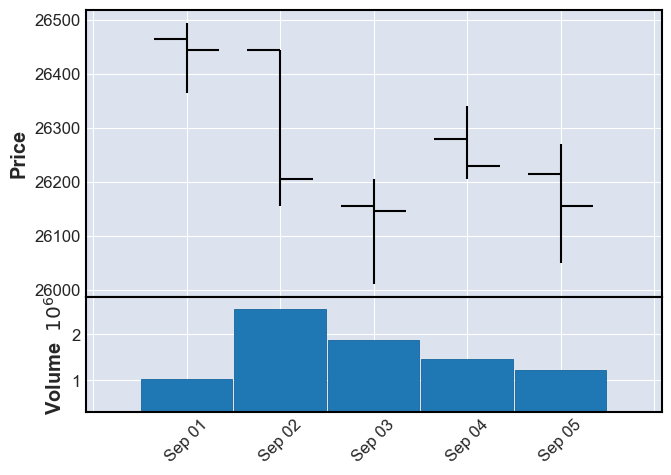

상승?0 횡보?1 하락?22
139 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-09-11  2659216  26155  26155  26030  26040  (2014, 37)
2014-09-12  1174306  26140  26050  25990  26115  (2014, 37)


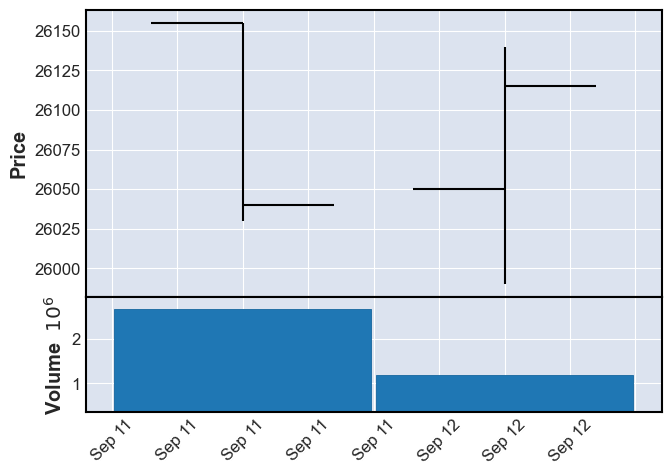

상승?0 횡보?1 하락?20
140 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2014-09-15  826413  26090  26090  25885  25995  (2014, 38)
2014-09-16  522232  26135  26050  26025  26100  (2014, 38)
2014-09-17  724353  26345  26180  26180  26320  (2014, 38)
2014-09-18  876447  26340  26320  26140  26195  (2014, 38)
2014-09-19  664176  26350  26260  26235  26250  (2014, 38)


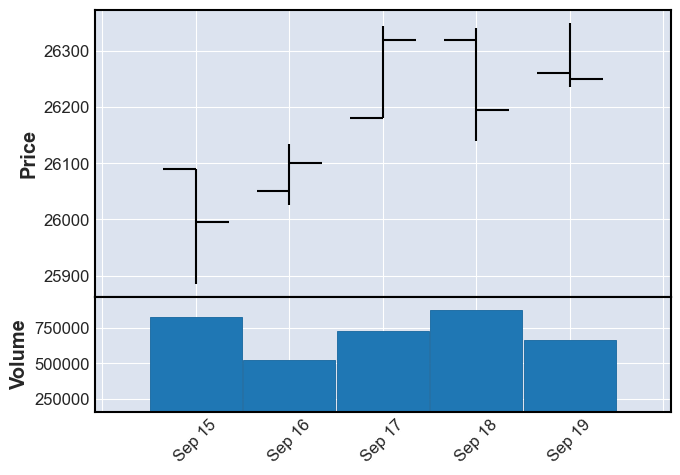

상승?0 횡보?1 하락?20
141 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-09-22  1734292  26190  26190  25855  25980  (2014, 39)
2014-09-23   955339  25965  25860  25810  25875  (2014, 39)
2014-09-24  1020648  25880  25770  25690  25865  (2014, 39)
2014-09-25   951004  25980  25900  25795  25860  (2014, 39)
2014-09-26   463691  25770  25695  25635  25770  (2014, 39)


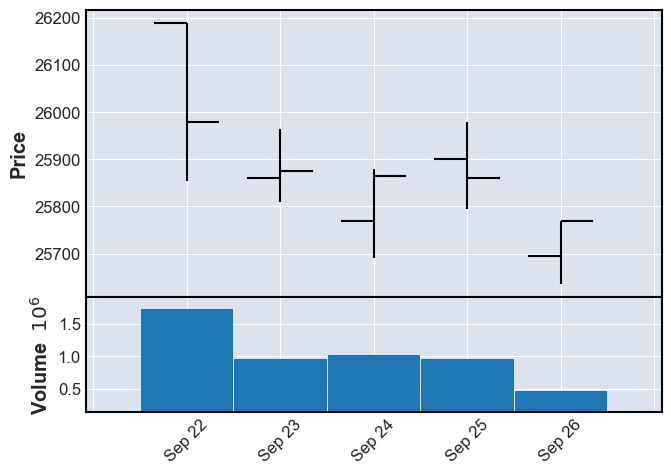

상승?0 횡보?1 하락?22
142 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-09-29   807969  25850  25780  25650  25720  (2014, 40)
2014-09-30  1263519  25730  25680  25505  25695  (2014, 40)
2014-10-01  1307615  25545  25545  25255  25290  (2014, 40)
2014-10-02  1653786  25155  25150  24840  24960  (2014, 40)


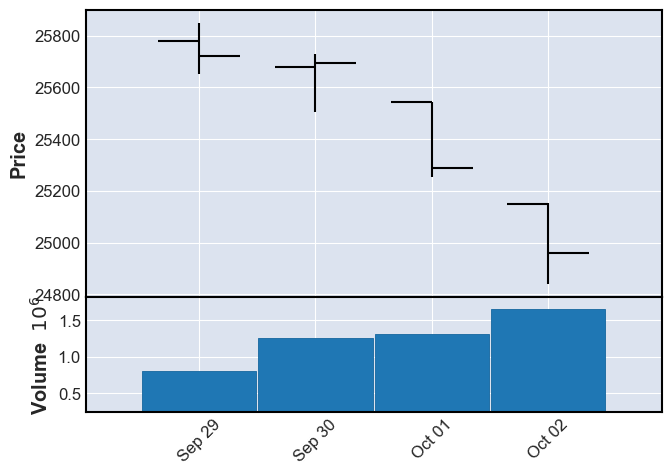

상승?0 횡보?1 하락?22
143 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-10-06   993974  25095  25055  24880  24910  (2014, 41)
2014-10-07  1652735  25075  24990  24870  24970  (2014, 41)
2014-10-08   934183  24930  24875  24750  24885  (2014, 41)
2014-10-10  1276522  24760  24760  24380  24500  (2014, 41)


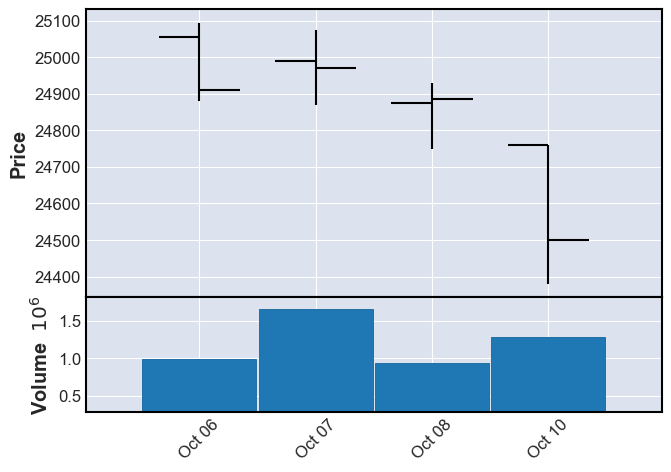

상승?0 횡보?1 하락?22
144 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-10-13   997674  24450  24280  24225  24420  (2014, 42)
2014-10-14  1019055  24600  24510  24420  24445  (2014, 42)
2014-10-15   625542  24520  24410  24280  24370  (2014, 42)
2014-10-16  1240060  24315  24270  24100  24290  (2014, 42)
2014-10-17  1073728  24350  24350  23955  24005  (2014, 42)


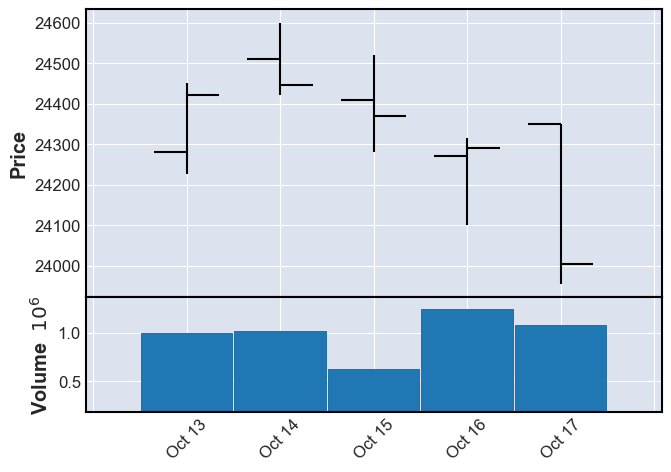

상승?0 횡보?1 하락?22
145 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-10-20   811507  24400  24225  24200  24285  (2014, 43)
2014-10-21  2596113  24265  24265  24015  24170  (2014, 43)
2014-10-22   566076  24435  24360  24245  24325  (2014, 43)
2014-10-23  1295079  24475  24315  24240  24350  (2014, 43)
2014-10-24  1246668  24460  24410  24120  24255  (2014, 43)


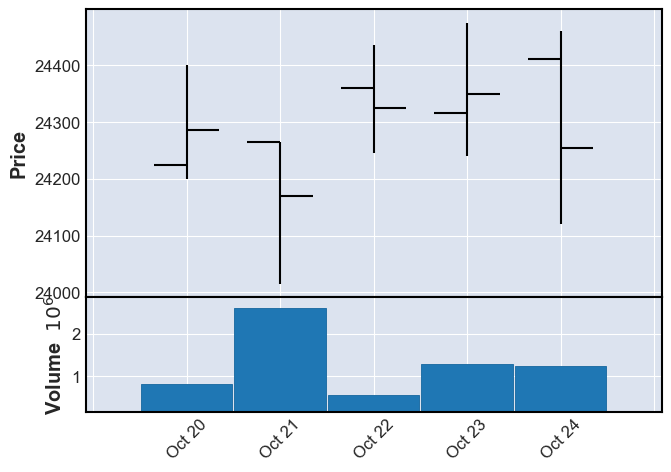

상승?0 횡보?1 하락?21
146 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-10-27   642112  24485  24355  24335  24385  (2014, 44)
2014-10-28  1545651  24420  24385  24290  24355  (2014, 44)
2014-10-29   869566  24870  24440  24420  24815  (2014, 44)
2014-10-30   596305  24800  24750  24650  24780  (2014, 44)
2014-10-31  1680413  24990  24860  24710  24990  (2014, 44)


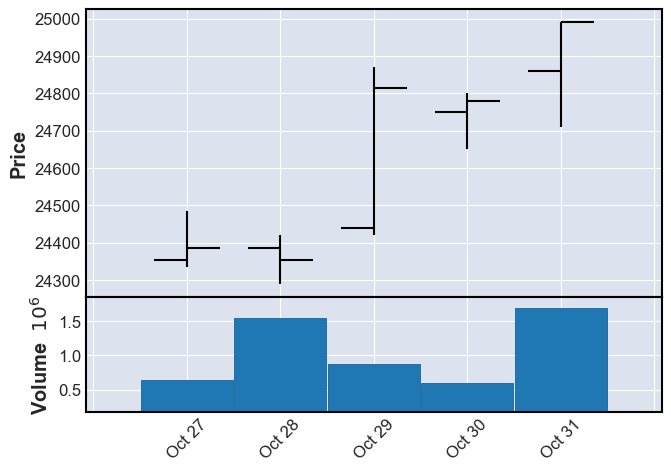

상승?0 횡보?1 하락?20
147 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-11-03   401850  24980  24980  24780  24855  (2014, 45)
2014-11-04  1147810  24900  24840  24565  24640  (2014, 45)
2014-11-05   677564  24740  24670  24550  24565  (2014, 45)
2014-11-06  1182994  24750  24575  24490  24710  (2014, 45)
2014-11-07   249349  24780  24710  24645  24755  (2014, 45)


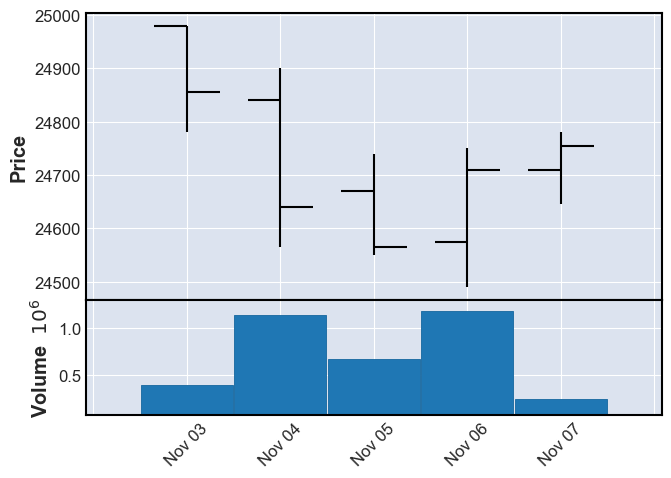

상승?0 횡보?1 하락?21
148 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2014-11-10  477078  25085  24825  24825  24975  (2014, 46)
2014-11-11  775273  25050  24980  24960  24965  (2014, 46)
2014-11-12  671573  25170  25000  24935  25050  (2014, 46)
2014-11-13  347156  25140  25050  24925  25005  (2014, 46)
2014-11-14  478256  24965  24965  24660  24790  (2014, 46)


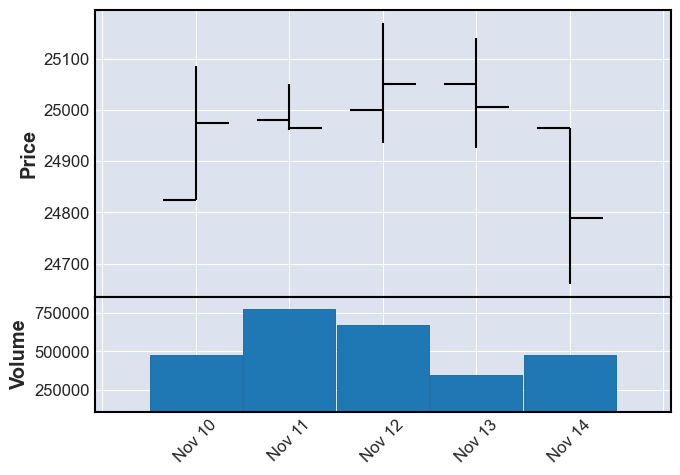

상승?0 횡보?1 하락?21
149 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-11-17   344063  24880  24725  24650  24850  (2014, 47)
2014-11-18   957155  25090  24850  24850  25030  (2014, 47)
2014-11-19  1020453  25110  25080  24935  25005  (2014, 47)
2014-11-20   902551  24990  24950  24805  24925  (2014, 47)
2014-11-21   314273  25060  24940  24915  24995  (2014, 47)


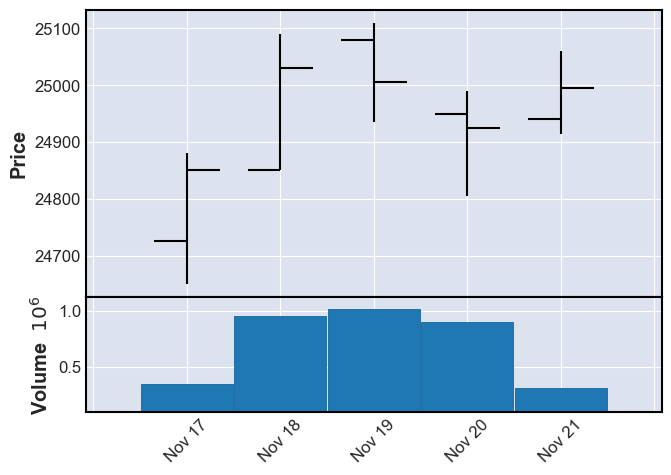

상승?0 횡보?1 하락?21
150 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-11-24  1030038  25315  25220  25210  25240  (2014, 48)
2014-11-25   625494  25270  25250  25160  25195  (2014, 48)
2014-11-26   759061  25250  25215  25065  25185  (2014, 48)
2014-11-27  1341799  25400  25340  25275  25325  (2014, 48)
2014-11-28   471927  25360  25325  25255  25320  (2014, 48)


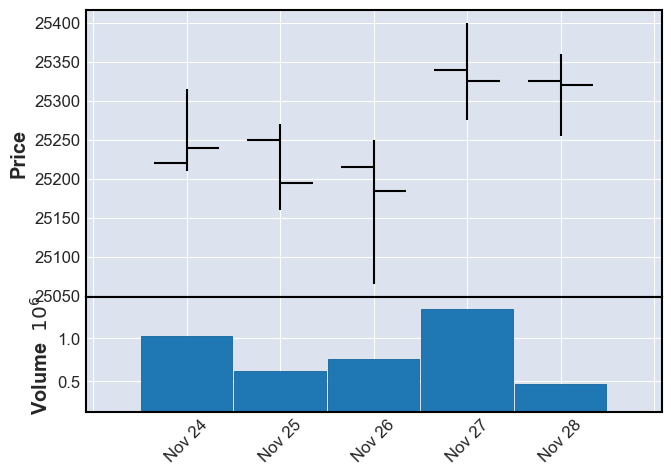

상승?0 횡보?1 하락?21
151 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-12-01  2310151  25235  25235  25015  25105  (2014, 49)
2014-12-02  1474174  25090  25090  24965  25065  (2014, 49)
2014-12-03   671018  25185  25130  25055  25140  (2014, 49)
2014-12-04  2801405  25435  25200  25180  25400  (2014, 49)
2014-12-05   679940  25460  25345  25345  25410  (2014, 49)


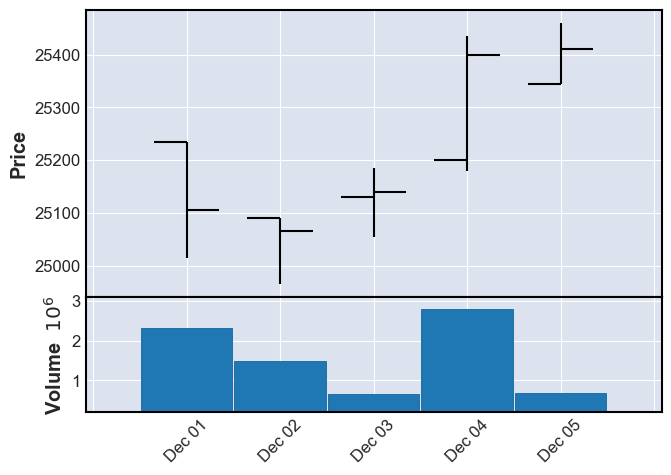

상승?0 횡보?1 하락?20
152 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-12-08   864640  25480  25390  25345  25375  (2014, 50)
2014-12-09  1369902  25345  25300  25225  25300  (2014, 50)
2014-12-10  2626601  25245  25200  24925  24935  (2014, 50)
2014-12-11  3032229  24810  24770  24560  24625  (2014, 50)
2014-12-12  1598431  24690  24640  24555  24670  (2014, 50)


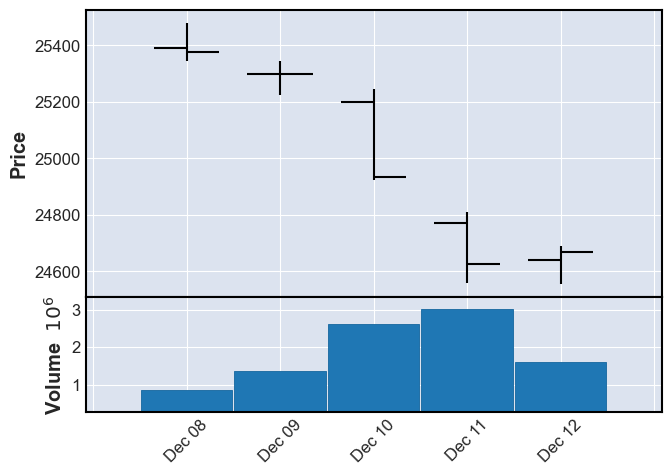

상승?0 횡보?1 하락?22
153 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-12-15  4532073  24660  24445  24320  24660  (2014, 51)
2014-12-16  2243276  24660  24585  24405  24470  (2014, 51)
2014-12-17  2751270  24575  24550  24425  24425  (2014, 51)
2014-12-18  2040580  24700  24580  24225  24380  (2014, 51)
2014-12-19  1194010  24830  24695  24610  24795  (2014, 51)


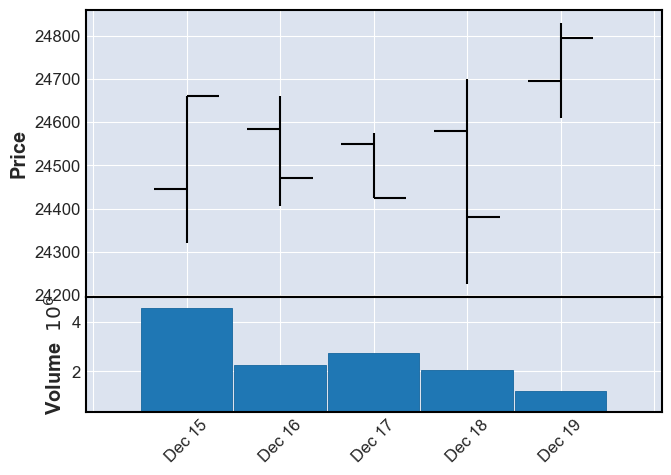

상승?0 횡보?1 하락?21
154 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2014-12-22  4078400  24980  24825  24780  24975  (2014, 52)
2014-12-23  1567590  24990  24990  24900  24955  (2014, 52)
2014-12-24  2727767  25055  24850  24850  25000  (2014, 52)
2014-12-26   900534  25140  25000  25000  25015  (2014, 52)


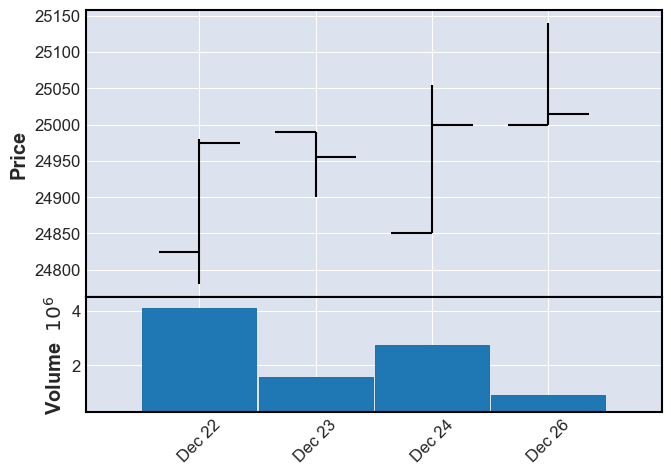

상승?0 횡보?1 하락?20
155 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2014-12-29  3164783  25165  25015  24930  24970  (2015, 1)
2014-12-30  2089160  25020  24980  24635  24635  (2015, 1)
2015-01-02  2511241  24770  24635  24560  24755  (2015, 1)


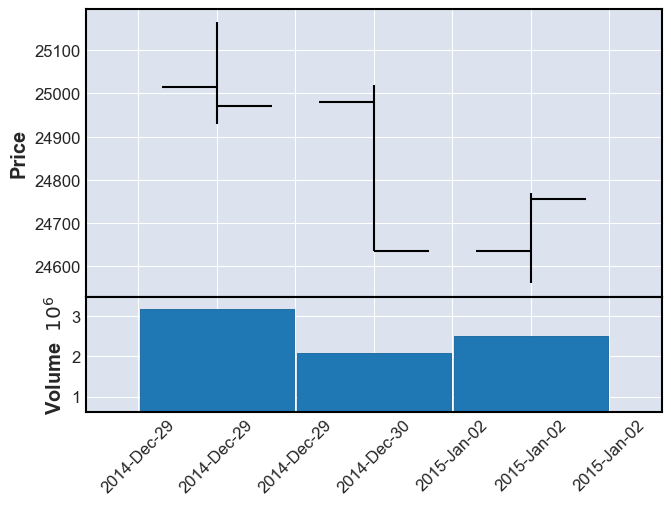

상승?0 횡보?1 하락?22
156 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-01-05  2269890  24765  24700  24485  24710  (2015, 2)
2015-01-06  4899532  24480  24465  24200  24255  (2015, 2)
2015-01-07  2323022  24340  24245  24200  24325  (2015, 2)
2015-01-08  1487347  24705  24465  24420  24635  (2015, 2)
2015-01-09  1469688  25010  24850  24805  24920  (2015, 2)


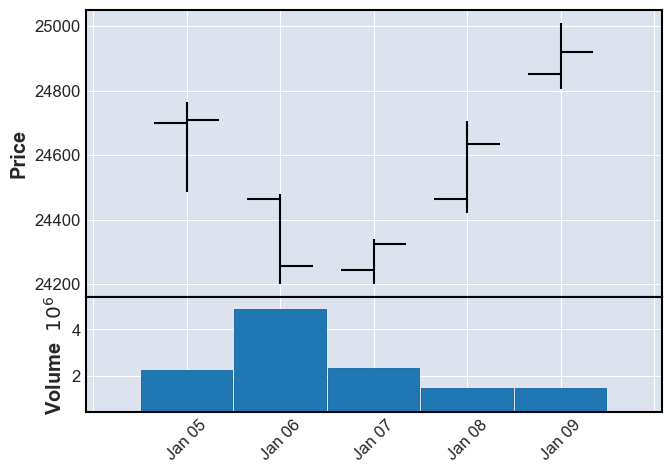

상승?0 횡보?1 하락?20
157 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-01-12  1218836  24935  24855  24765  24835  (2015, 3)
2015-01-13   906506  24960  24815  24735  24945  (2015, 3)
2015-01-14   662475  25030  24945  24845  24870  (2015, 3)
2015-01-15   648460  24960  24875  24775  24920  (2015, 3)
2015-01-16  2610557  24810  24810  24500  24560  (2015, 3)


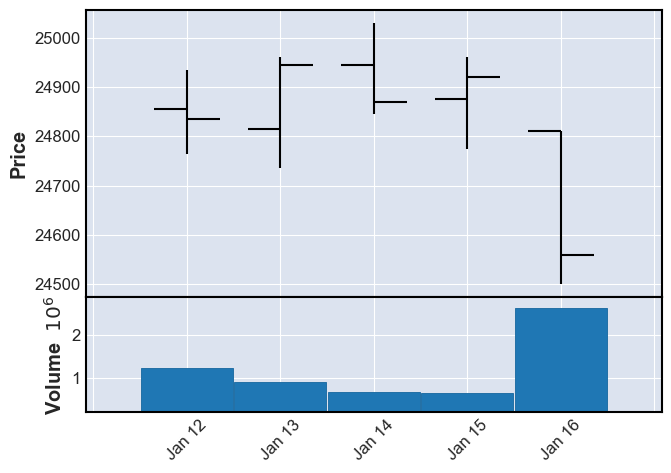

상승?0 횡보?1 하락?22
158 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-01-19  1575060  24905  24740  24675  24820  (2015, 4)
2015-01-20  1454005  25055  24925  24885  25025  (2015, 4)
2015-01-21  2370093  25115  25005  24940  25115  (2015, 4)
2015-01-22  5897181  25315  25200  25145  25155  (2015, 4)
2015-01-23  2572458  25500  25485  25270  25320  (2015, 4)


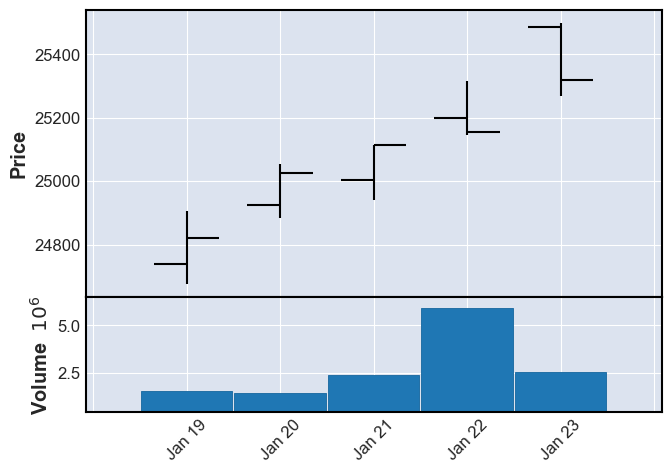

상승?0 횡보?1 하락?20
159 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-01-26   712639  25335  25275  25120  25320  (2015, 5)
2015-01-27  1178950  25495  25390  25365  25480  (2015, 5)
2015-01-28  1167188  25525  25405  25350  25510  (2015, 5)
2015-01-29  1632101  25505  25400  25255  25385  (2015, 5)
2015-01-30   909316  25525  25500  25340  25370  (2015, 5)


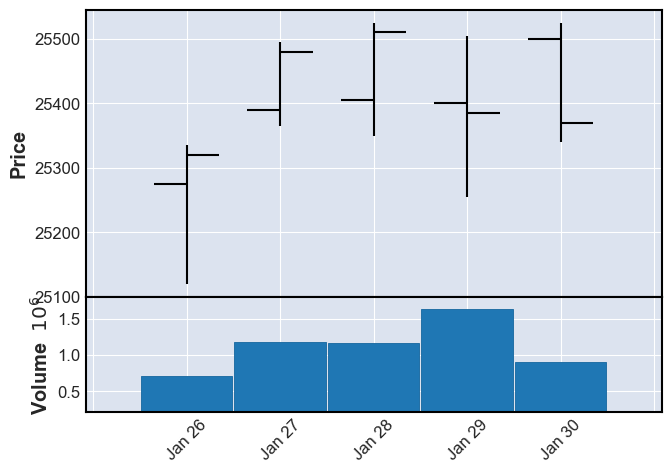

상승?0 횡보?1 하락?21
160 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-02-02  1068818  25410  25290  25220  25305  (2015, 6)
2015-02-03   927619  25420  25365  25190  25290  (2015, 6)
2015-02-04  1158613  25570  25450  25410  25450  (2015, 6)
2015-02-05  1143282  25450  25445  25195  25240  (2015, 6)
2015-02-06  1010904  25285  25260  25155  25265  (2015, 6)


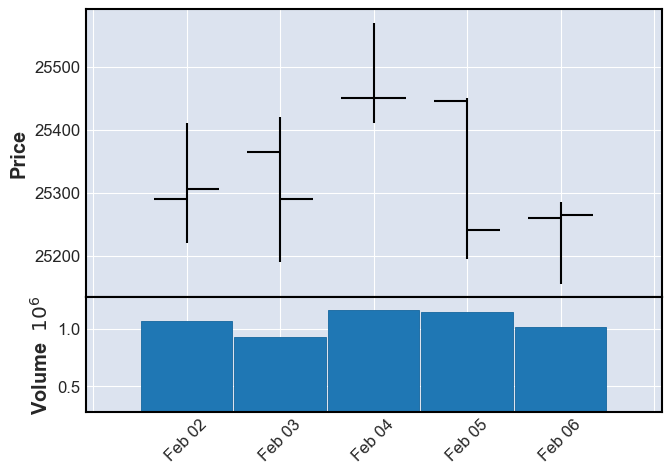

상승?0 횡보?1 하락?21
161 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-02-09   585973  25280  25215  25120  25245  (2015, 7)
2015-02-10  1129575  25340  25245  25095  25105  (2015, 7)
2015-02-11   790502  25180  25110  25080  25140  (2015, 7)
2015-02-12  1602107  25170  25170  24915  25045  (2015, 7)
2015-02-13  1085584  25270  25160  25150  25245  (2015, 7)


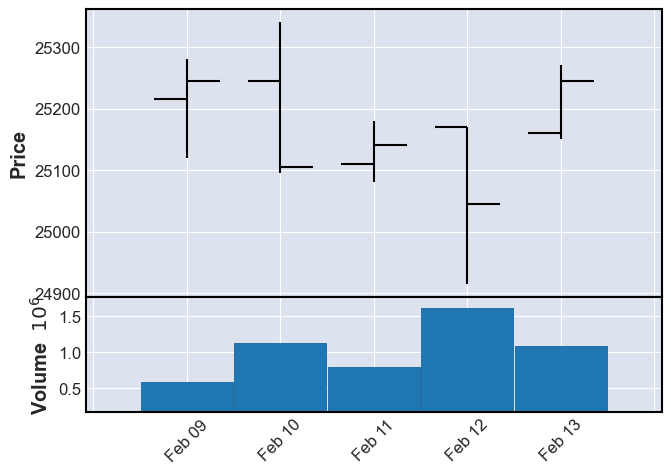

상승?0 횡보?1 하락?21
162 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-02-16   843168  25320  25250  25250  25280  (2015, 8)
2015-02-17  1124227  25380  25255  25180  25325  (2015, 8)


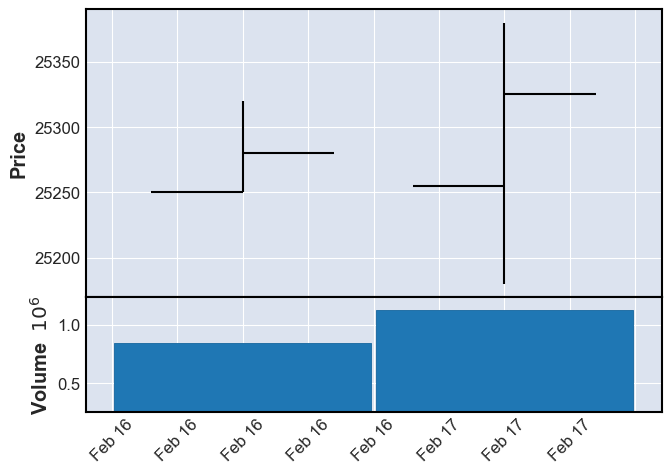

상승?0 횡보?1 하락?20
163 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2015-02-23   621145  25560  25485  25390  25430  (2015, 9)
2015-02-24  1003017  25495  25430  25405  25440  (2015, 9)
2015-02-25  4922254  25590  25530  25500  25545  (2015, 9)
2015-02-26  1728891  25555  25545  25480  25520  (2015, 9)
2015-02-27  2405775  25530  25505  25385  25430  (2015, 9)


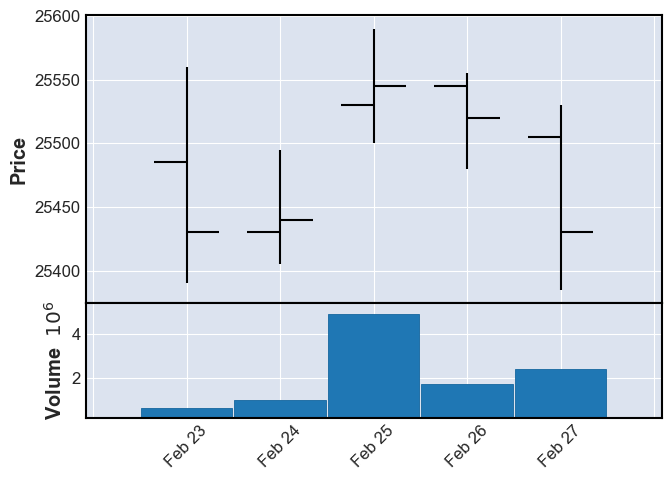

상승?0 횡보?1 하락?21
164 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-03-02  1706430  25615  25485  25485  25605  (2015, 10)
2015-03-03  1929121  25735  25675  25650  25690  (2015, 10)
2015-03-04  1397120  25710  25680  25650  25700  (2015, 10)
2015-03-05  1030155  25735  25665  25620  25690  (2015, 10)
2015-03-06   846723  25855  25700  25700  25835  (2015, 10)


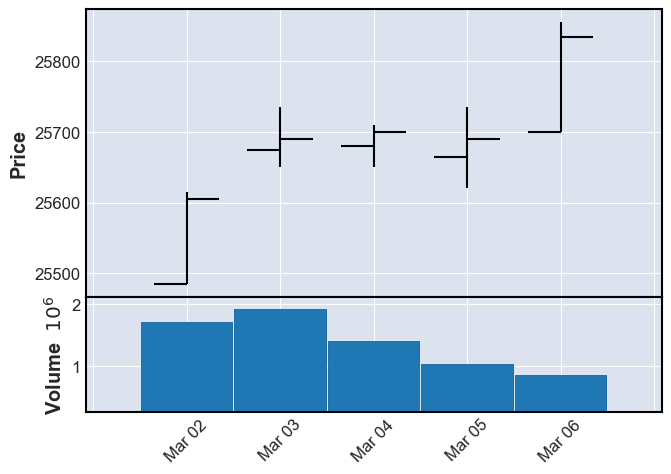

상승?0 횡보?1 하락?20
165 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-03-09   839423  25790  25775  25555  25575  (2015, 11)
2015-03-10  1189922  25650  25650  25475  25480  (2015, 11)
2015-03-11  2373394  25520  25295  25270  25495  (2015, 11)
2015-03-12  2200237  25560  25305  25305  25440  (2015, 11)
2015-03-13  1442091  25605  25475  25475  25515  (2015, 11)


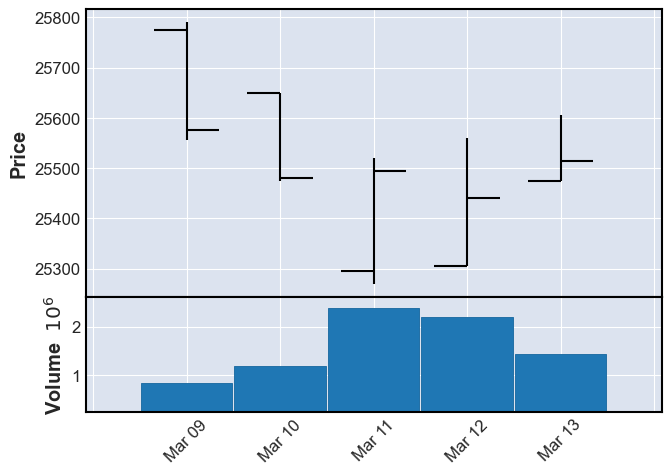

상승?0 횡보?1 하락?21
166 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-03-16   888999  25595  25505  25455  25535  (2015, 12)
2015-03-17  2266600  26145  25645  25640  26105  (2015, 12)
2015-03-18  2308229  26240  26140  26110  26140  (2015, 12)
2015-03-19  1563859  26350  26320  26170  26210  (2015, 12)
2015-03-20  1707508  26245  26205  26100  26140  (2015, 12)


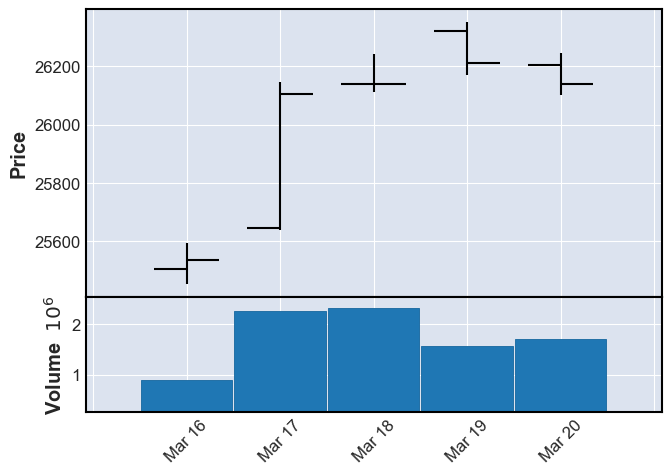

상승?0 횡보?1 하락?20
167 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-03-23  1324963  26300  26200  26120  26155  (2015, 13)
2015-03-24  1546227  26195  26155  26035  26180  (2015, 13)
2015-03-25  1503672  26285  26175  26155  26185  (2015, 13)
2015-03-26  1306323  26150  26050  25915  25960  (2015, 13)
2015-03-27  1386092  25995  25940  25845  25875  (2015, 13)


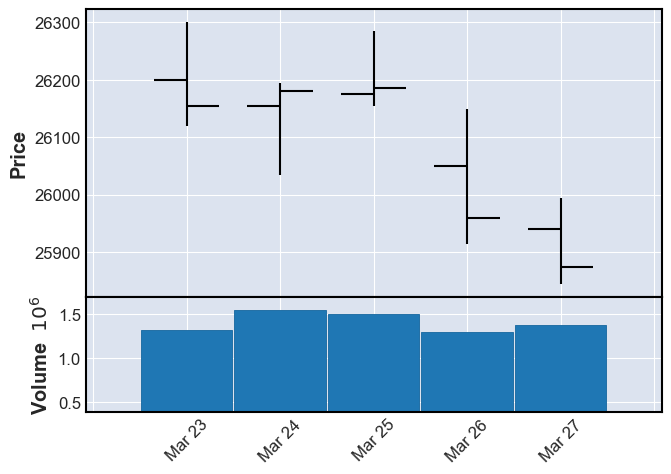

상승?0 횡보?1 하락?22
168 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-03-30  1480821  25955  25875  25805  25955  (2015, 14)
2015-03-31  1338677  26110  26110  25905  25980  (2015, 14)
2015-04-01  1013122  25955  25930  25750  25765  (2015, 14)
2015-04-02   962578  25895  25780  25755  25785  (2015, 14)
2015-04-03  1087300  25995  25820  25810  25990  (2015, 14)


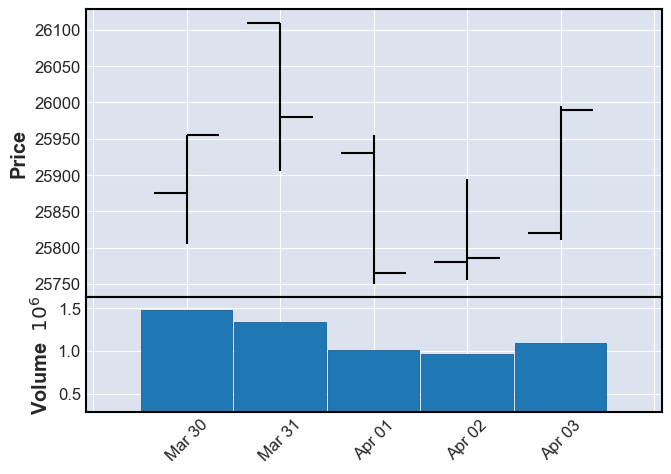

상승?0 횡보?1 하락?21
169 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-04-06  1553792  26100  25950  25930  25990  (2015, 15)
2015-04-07  1106844  26090  26070  25925  25935  (2015, 15)
2015-04-08  1480478  26140  25935  25935  26120  (2015, 15)
2015-04-09  1075455  26180  26075  26030  26085  (2015, 15)
2015-04-10  1792126  26495  26090  26090  26440  (2015, 15)


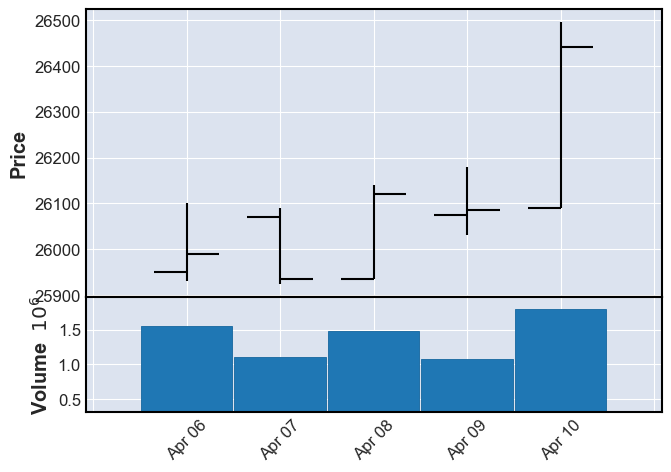

상승?0 횡보?1 하락?20
170 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-04-13  2257329  26635  26450  26445  26600  (2015, 16)
2015-04-14  1973993  26805  26585  26585  26745  (2015, 16)
2015-04-15  1765456  26915  26745  26745  26840  (2015, 16)
2015-04-16  2280937  27090  26960  26945  27060  (2015, 16)
2015-04-17  1902447  27150  27060  27035  27085  (2015, 16)


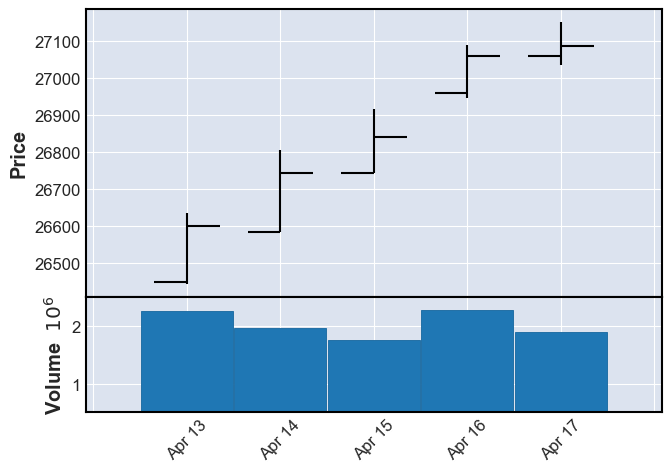

상승?0 횡보?1 하락?20
171 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-04-20  1760522  27110  26980  26930  27050  (2015, 17)
2015-04-21  1230442  27135  27080  27025  27050  (2015, 17)
2015-04-22  4531786  27375  27050  27050  27155  (2015, 17)
2015-04-23  1995269  27545  27250  27165  27520  (2015, 17)
2015-04-24  3063376  27780  27555  27370  27370  (2015, 17)


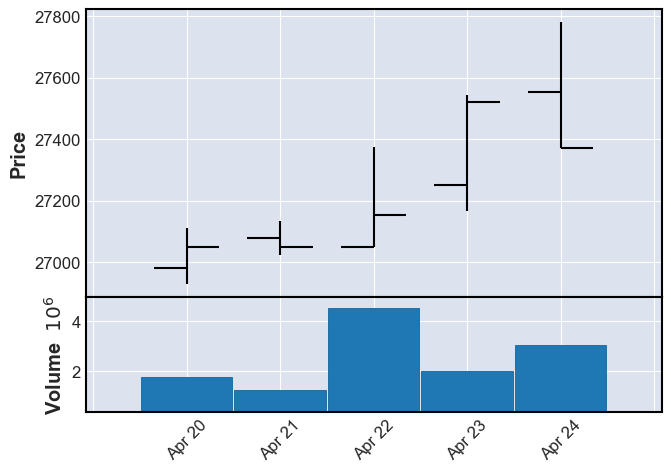

상승?0 횡보?1 하락?20
172 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-04-27   814146  27500  27480  27265  27270  (2015, 18)
2015-04-28  1403099  27385  27345  27130  27175  (2015, 18)
2015-04-29  2098703  26990  26980  26615  26790  (2015, 18)
2015-04-30  1067454  26740  26705  26575  26635  (2015, 18)


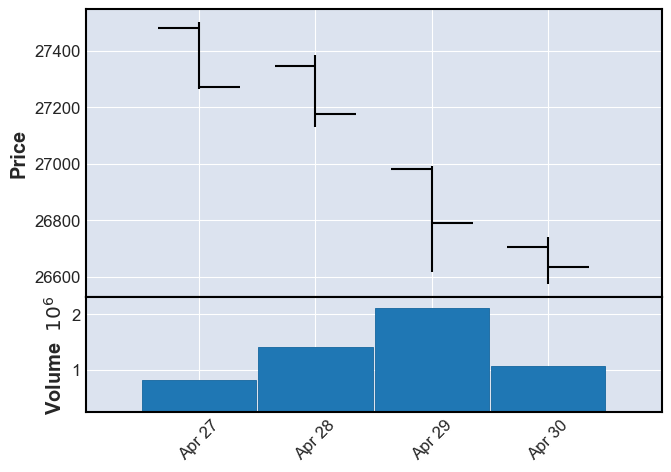

상승?0 횡보?1 하락?22
173 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-05-04  1116291  26815  26720  26660  26725  (2015, 19)
2015-05-06  1696323  26640  26640  26300  26315  (2015, 19)
2015-05-07  2656659  26305  26305  26010  26185  (2015, 19)
2015-05-08   667975  26230  26230  26075  26075  (2015, 19)


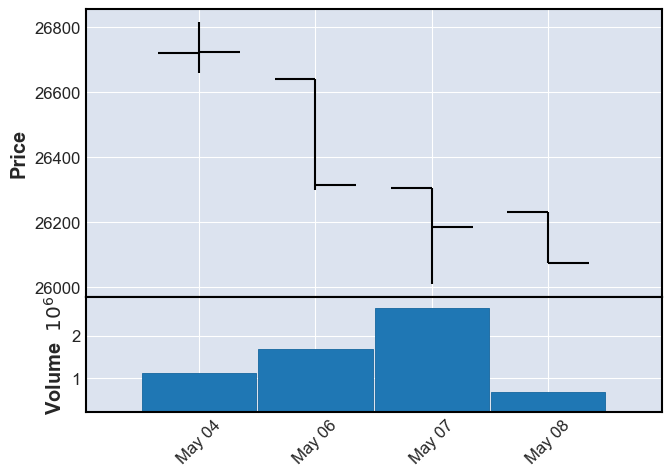

상승?0 횡보?1 하락?22
174 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-05-11  1534463  26330  26290  26125  26130  (2015, 20)
2015-05-12   802049  26165  26125  26030  26090  (2015, 20)
2015-05-13  1036981  26325  26105  26105  26255  (2015, 20)
2015-05-14  1194293  26325  26255  26185  26295  (2015, 20)
2015-05-15  2705347  26475  26410  26040  26040  (2015, 20)


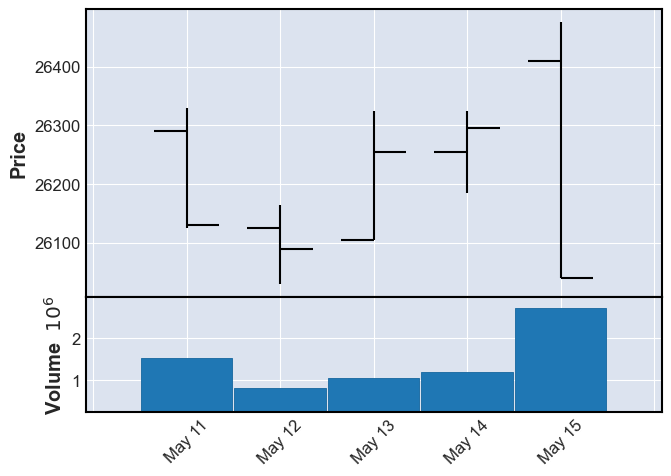

상승?0 횡보?1 하락?21
175 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-05-18  1098183  26110  26095  25970  26105  (2015, 21)
2015-05-19  1391343  26295  26105  26035  26200  (2015, 21)
2015-05-20  1698892  26475  26270  26245  26455  (2015, 21)
2015-05-21  3071669  26455  26445  26165  26175  (2015, 21)
2015-05-22  1027262  26530  26275  26245  26525  (2015, 21)


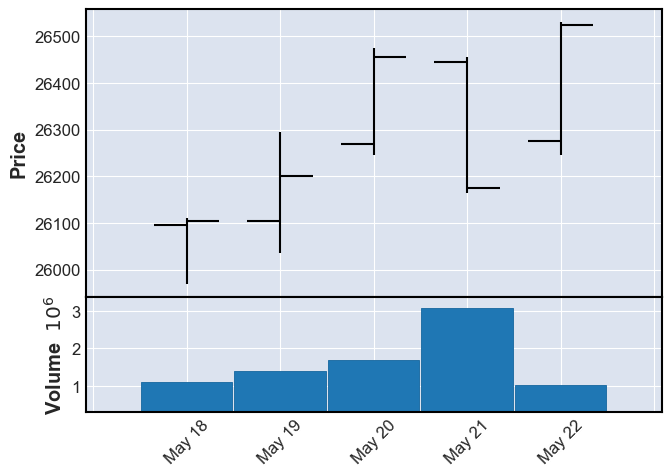

상승?0 횡보?1 하락?20
176 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-05-26  2191351  26565  26565  26370  26470  (2015, 22)
2015-05-27  4998777  26330  26330  25875  25945  (2015, 22)
2015-05-28  2572349  26100  26030  25925  25925  (2015, 22)
2015-05-29  1587384  26150  25875  25825  26020  (2015, 22)


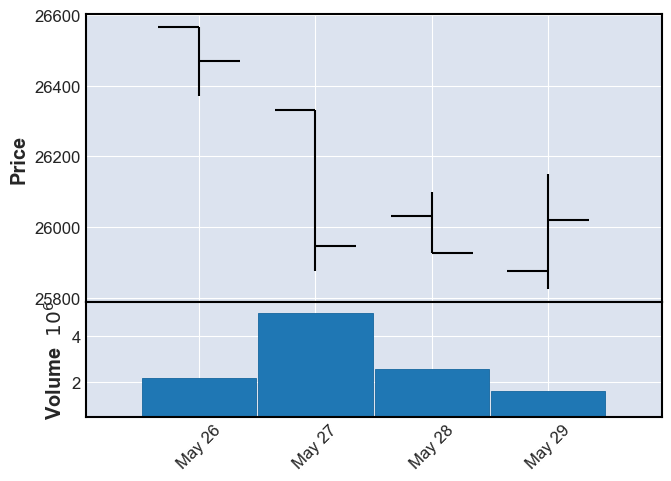

상승?0 횡보?1 하락?22
177 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-06-01  1447166  25970  25970  25650  25825  (2015, 23)
2015-06-02  1814440  25900  25760  25515  25590  (2015, 23)
2015-06-03  1816675  25675  25615  25335  25375  (2015, 23)
2015-06-04  1930657  25620  25420  25350  25460  (2015, 23)
2015-06-05  1883368  25525  25370  25310  25400  (2015, 23)


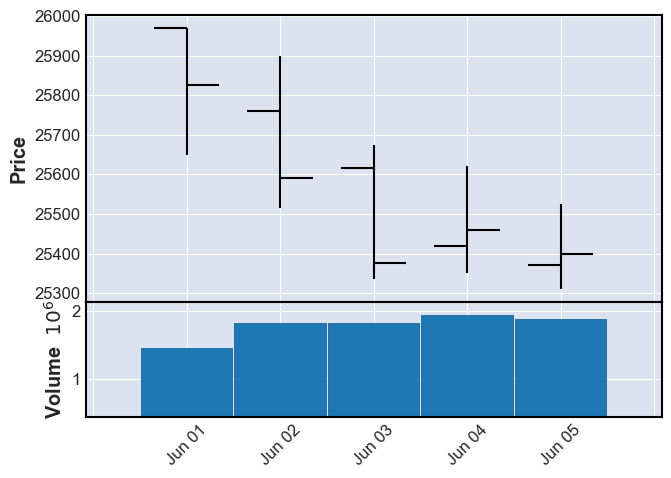

상승?0 횡보?1 하락?22
178 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-06-08  1624383  25410  25395  25250  25340  (2015, 24)
2015-06-09  2069945  25460  25330  25225  25315  (2015, 24)
2015-06-10  1902589  25450  25410  25155  25175  (2015, 24)
2015-06-11  3418005  25320  25275  25155  25255  (2015, 24)
2015-06-12  2562905  25440  25280  25030  25060  (2015, 24)


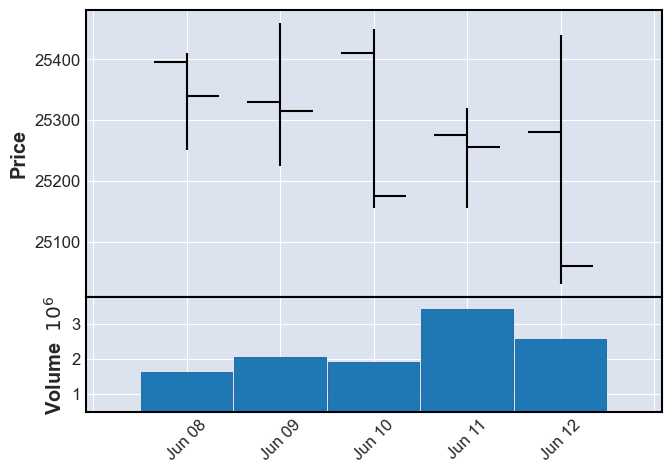

상승?0 횡보?1 하락?22
179 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-06-15  1030663  25085  24900  24870  24975  (2015, 25)
2015-06-16  3454513  25005  24955  24590  24780  (2015, 25)
2015-06-17  1792489  24830  24780  24665  24810  (2015, 25)
2015-06-18  3163854  25040  24915  24795  24870  (2015, 25)
2015-06-19  4915421  25075  25020  24905  24990  (2015, 25)


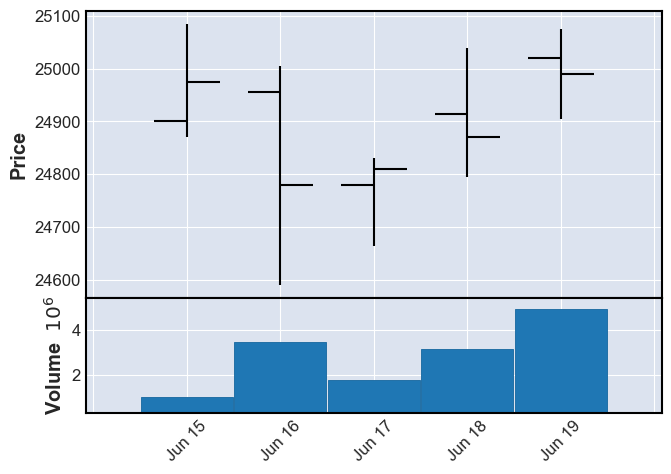

상승?0 횡보?1 하락?21
180 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-06-22   941937  25190  25050  24995  25050  (2015, 26)
2015-06-23  1708916  25430  25205  25150  25405  (2015, 26)
2015-06-24  3431444  25470  25435  25360  25410  (2015, 26)
2015-06-25   816709  25435  25360  25290  25380  (2015, 26)
2015-06-26  2728602  25475  25280  25200  25390  (2015, 26)


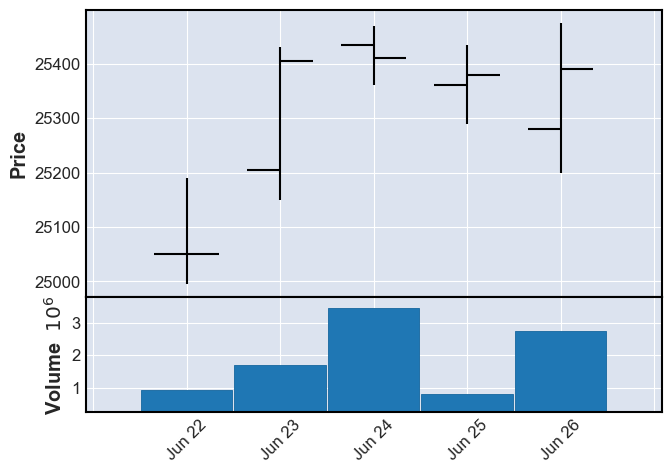

상승?0 횡보?1 하락?20
181 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-06-29  4632870  25125  25060  24955  25045  (2015, 27)
2015-06-30  1730965  25200  25015  25000  25200  (2015, 27)
2015-07-01  1824170  25480  25120  25100  25450  (2015, 27)
2015-07-02  1455183  25555  25480  25465  25490  (2015, 27)
2015-07-03   688023  25515  25490  25310  25425  (2015, 27)


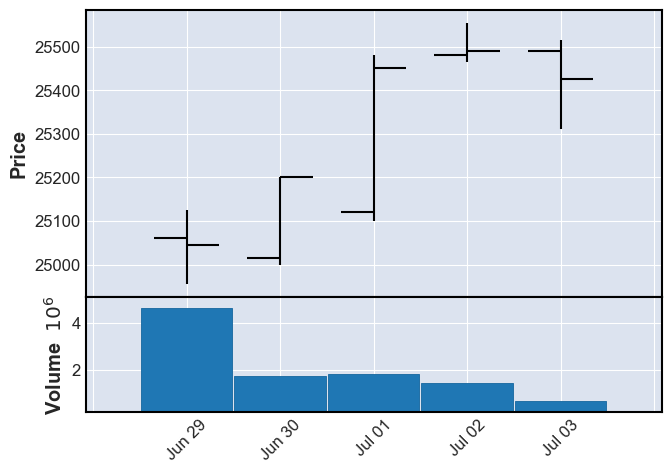

상승?0 횡보?1 하락?20
182 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-07-06  2825978  25260  25095  24780  24815  (2015, 28)
2015-07-07  2465700  24925  24885  24685  24850  (2015, 28)
2015-07-08  2712992  24855  24845  24510  24510  (2015, 28)
2015-07-09  2847279  24670  24375  24190  24670  (2015, 28)
2015-07-10  1607301  24720  24700  24575  24670  (2015, 28)


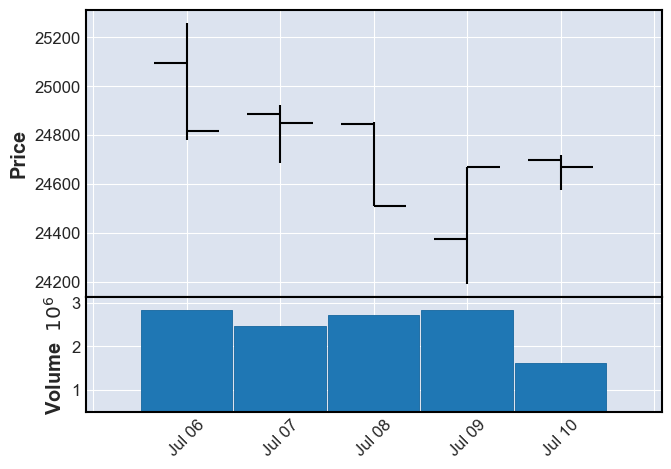

상승?0 횡보?1 하락?21
183 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-07-13  1018071  25010  24650  24620  24935  (2015, 29)
2015-07-14  1823182  24985  24965  24760  24825  (2015, 29)
2015-07-15  1109428  25110  24925  24805  24920  (2015, 29)
2015-07-16  1224895  25090  24875  24855  25090  (2015, 29)
2015-07-17  1209409  25220  25195  24875  24950  (2015, 29)


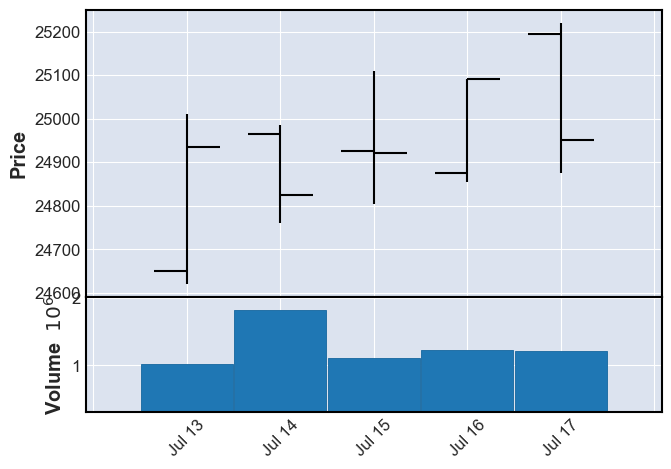

상승?0 횡보?1 하락?21
184 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-07-20  1298861  25045  24945  24815  24890  (2015, 30)
2015-07-21  1595850  25080  24920  24800  24940  (2015, 30)
2015-07-22  3920625  24865  24805  24620  24695  (2015, 30)
2015-07-23  1778393  24770  24740  24585  24695  (2015, 30)
2015-07-24  2990397  24600  24590  24370  24415  (2015, 30)


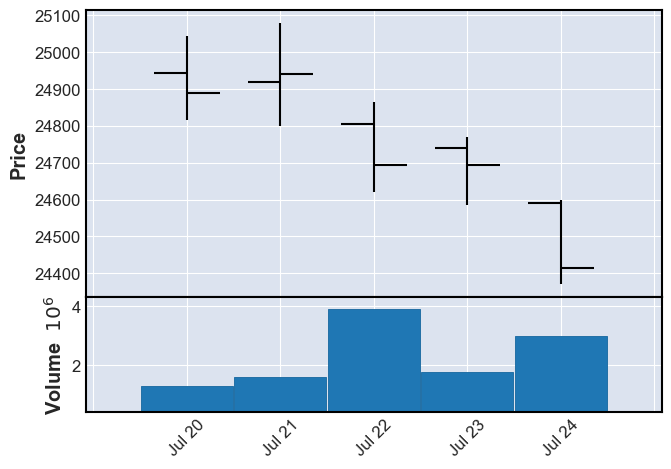

상승?0 횡보?1 하락?22
185 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-07-27  4753756  24520  24330  24280  24470  (2015, 31)
2015-07-28  1668054  24550  24400  24300  24510  (2015, 31)
2015-07-29  1155752  24640  24565  24510  24600  (2015, 31)
2015-07-30  1119542  24645  24610  24380  24390  (2015, 31)
2015-07-31  2042593  24415  24410  24185  24305  (2015, 31)


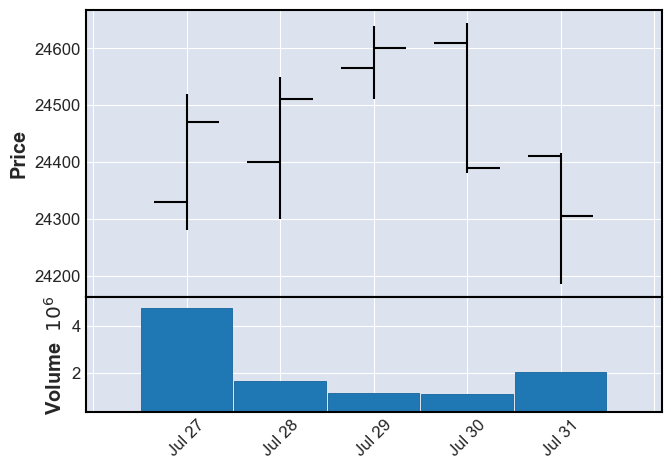

상승?0 횡보?1 하락?21
186 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-08-03  1491757  24305  24305  24105  24195  (2015, 32)
2015-08-04   904386  24285  24195  24165  24275  (2015, 32)
2015-08-05  1576766  24385  24250  24205  24315  (2015, 32)
2015-08-06  1964430  24355  24345  24020  24020  (2015, 32)
2015-08-07  1586863  24010  23955  23870  23955  (2015, 32)


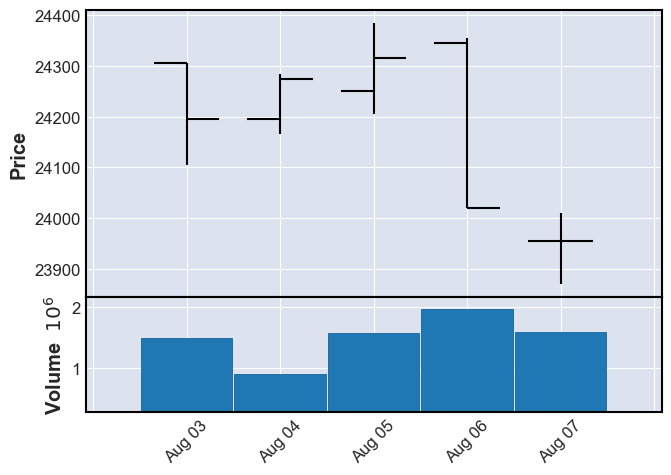

상승?0 횡보?1 하락?22
187 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-08-10  1111331  23955  23955  23820  23910  (2015, 33)
2015-08-11  2028526  24190  24050  23820  23820  (2015, 33)
2015-08-12  1478224  23865  23730  23510  23670  (2015, 33)
2015-08-13  2685419  23800  23645  23590  23765  (2015, 33)


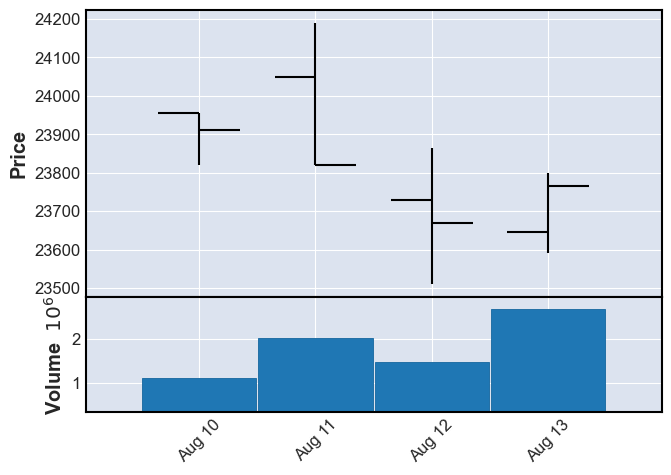

상승?0 횡보?1 하락?21
188 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-08-17  1768876  23845  23840  23565  23580  (2015, 34)
2015-08-18  1884613  23685  23640  23535  23570  (2015, 34)
2015-08-19  3113277  23550  23530  23295  23370  (2015, 34)
2015-08-20  1862902  23350  23350  23110  23110  (2015, 34)
2015-08-21  4479178  22840  22660  22580  22770  (2015, 34)


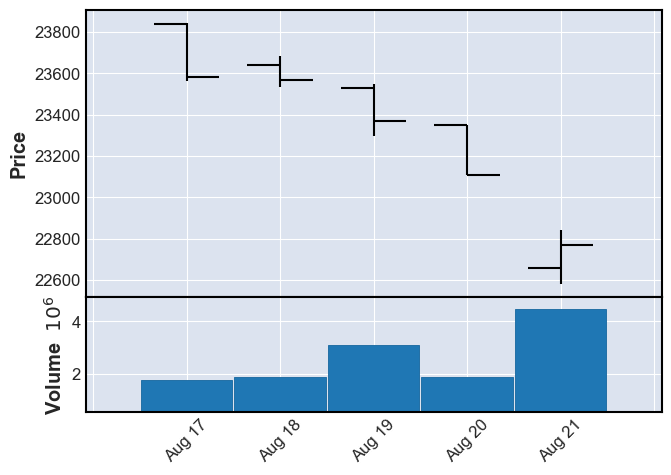

상승?0 횡보?1 하락?22
189 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-08-24  7672058  22635  22545  21705  22195  (2015, 35)
2015-08-25  6927631  22535  22210  21835  22315  (2015, 35)
2015-08-26  3628570  22775  22175  22090  22740  (2015, 35)
2015-08-27  5418159  22995  22830  22745  22830  (2015, 35)
2015-08-28  2103471  23175  23055  23035  23145  (2015, 35)


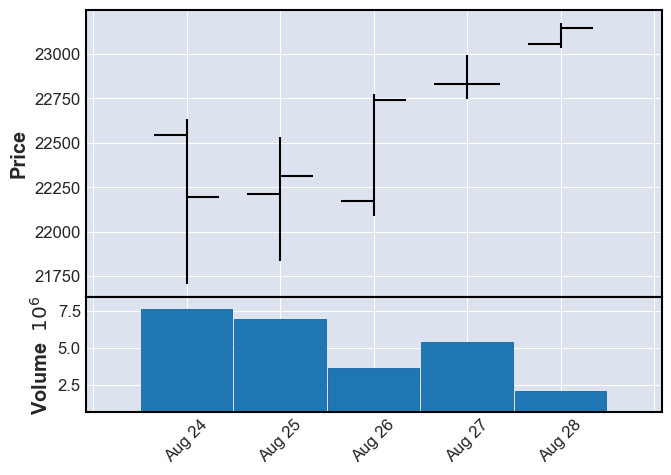

상승?0 횡보?1 하락?20
190 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-08-31  1431926  23185  23085  22990  23130  (2015, 36)
2015-09-01  2330358  23190  23125  22925  22970  (2015, 36)
2015-09-02  1855644  23090  22700  22695  22945  (2015, 36)
2015-09-03  1008291  23140  23100  22980  23030  (2015, 36)
2015-09-04  1698362  23065  23035  22735  22845  (2015, 36)


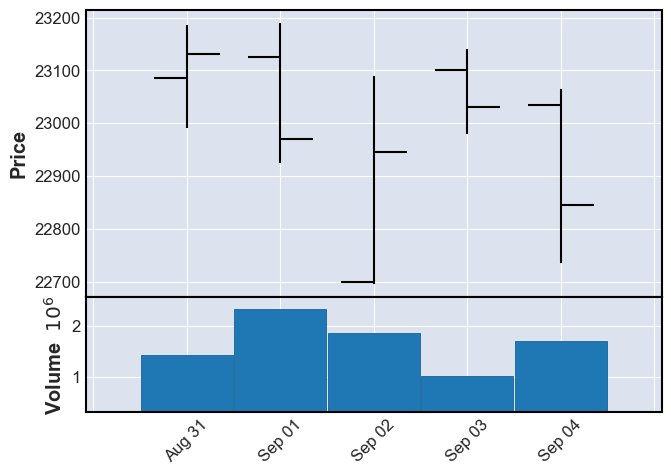

상승?0 횡보?1 하락?22
191 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-09-07  1577978  22925  22800  22670  22785  (2015, 37)
2015-09-08   639484  22860  22805  22675  22800  (2015, 37)
2015-09-09  1421165  23500  23030  23030  23500  (2015, 37)
2015-09-10  1334742  23620  23330  23270  23580  (2015, 37)
2015-09-11   882798  23570  23450  23375  23375  (2015, 37)


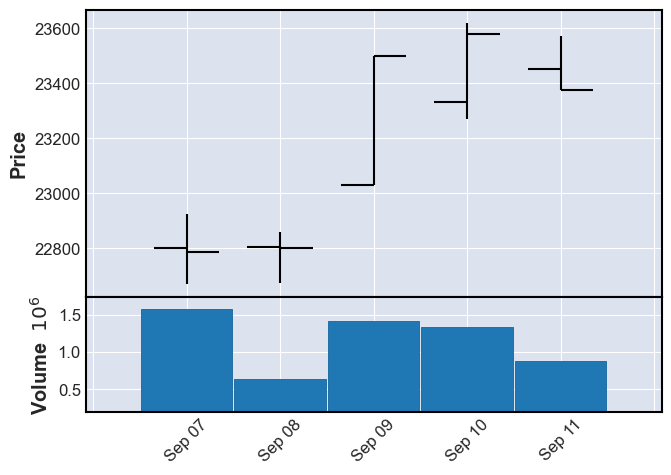

상승?0 횡보?1 하락?20
192 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-09-14  1254609  23505  23505  23135  23260  (2015, 38)
2015-09-15  1091718  23370  23290  23220  23350  (2015, 38)
2015-09-16  3352642  23970  23440  23440  23805  (2015, 38)
2015-09-17  3749783  24085  24070  23910  23945  (2015, 38)
2015-09-18  1817132  24165  23885  23665  24075  (2015, 38)


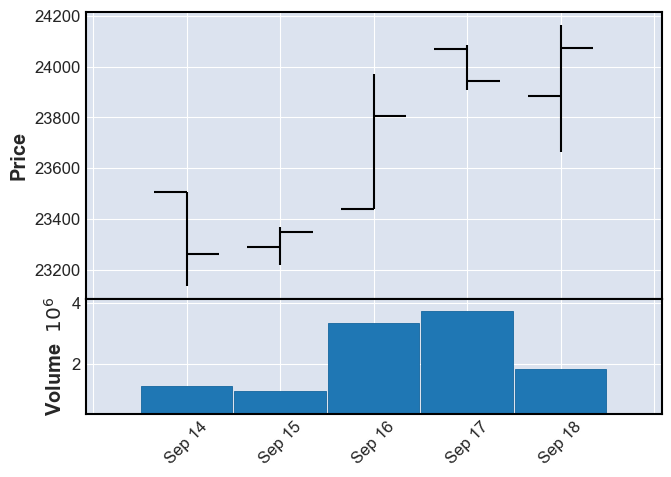

상승?0 횡보?1 하락?20
193 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-09-21  1295342  23885  23815  23605  23705  (2015, 39)
2015-09-22  1210057  23870  23755  23660  23810  (2015, 39)
2015-09-23  1180224  23725  23560  23460  23510  (2015, 39)
2015-09-24   956345  23605  23575  23415  23495  (2015, 39)
2015-09-25   775177  23545  23475  23295  23460  (2015, 39)


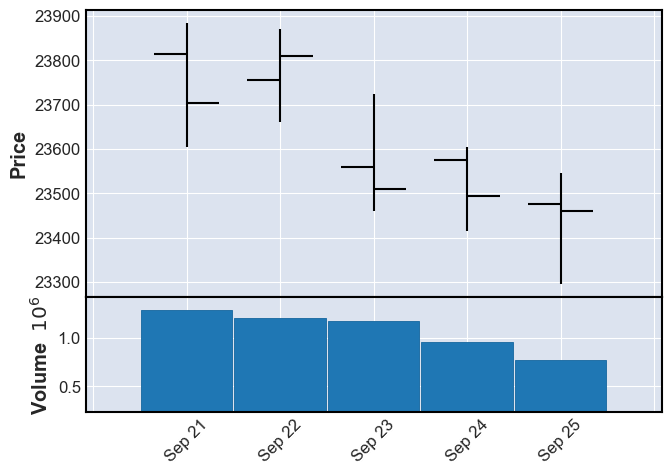

상승?0 횡보?1 하락?22
194 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-09-30  1303186  23660  23085  23085  23645  (2015, 40)
2015-10-01  3777463  24020  23600  23565  23875  (2015, 40)
2015-10-02  1548013  23905  23850  23715  23720  (2015, 40)


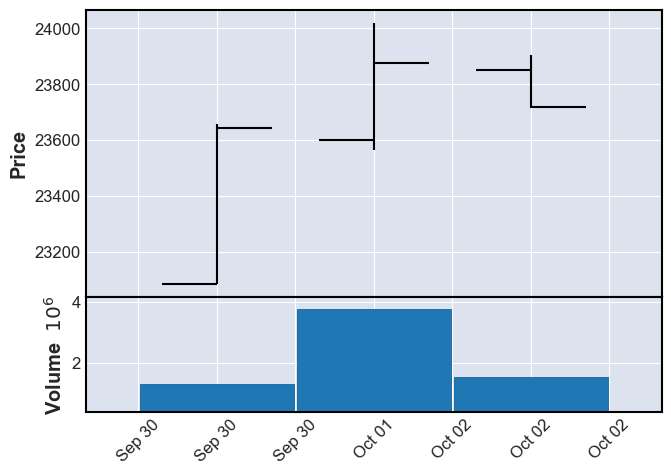

상승?0 횡보?1 하락?21
195 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-10-05  1528155  24060  23815  23740  23765  (2015, 41)
2015-10-06  1004192  24100  24040  23950  24005  (2015, 41)
2015-10-07  2774334  24365  24050  24050  24350  (2015, 41)
2015-10-08  2515482  24555  24465  24350  24500  (2015, 41)


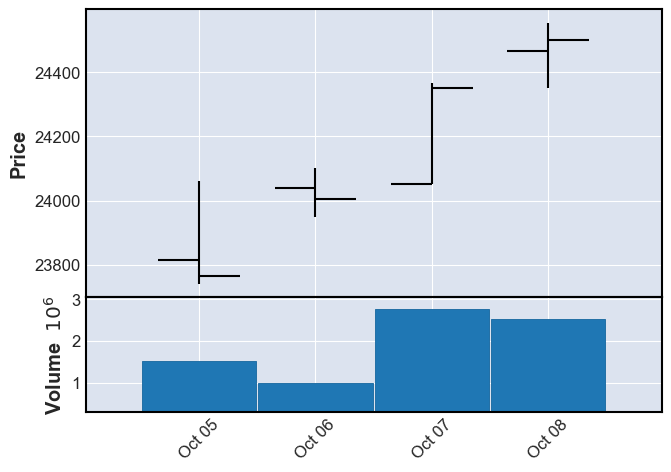

상승?0 횡보?1 하락?20
196 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-10-12  2100513  24805  24640  24565  24655  (2015, 42)
2015-10-13  1554245  24745  24625  24550  24635  (2015, 42)
2015-10-14  1601598  24590  24540  24405  24535  (2015, 42)
2015-10-15  2490362  24910  24515  24515  24820  (2015, 42)
2015-10-16  1390868  24860  24850  24715  24770  (2015, 42)


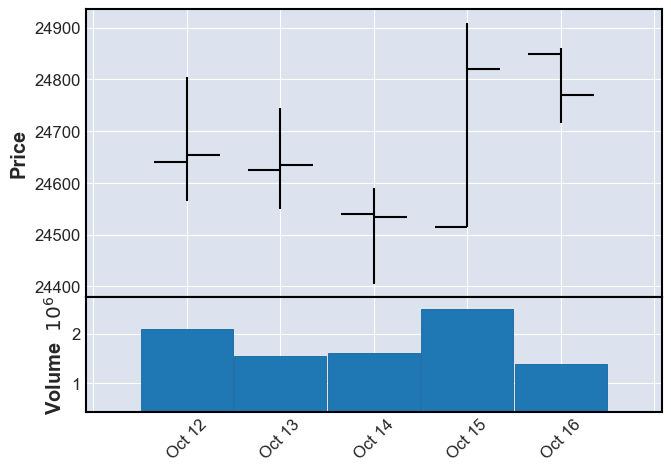

상승?0 횡보?1 하락?21
197 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-10-19  1699338  24860  24810  24660  24770  (2015, 43)
2015-10-20  1459325  24875  24750  24715  24850  (2015, 43)
2015-10-21  1738642  25105  24850  24830  24920  (2015, 43)
2015-10-22  2248662  24935  24875  24730  24765  (2015, 43)
2015-10-23  1308291  25170  25035  24935  24955  (2015, 43)


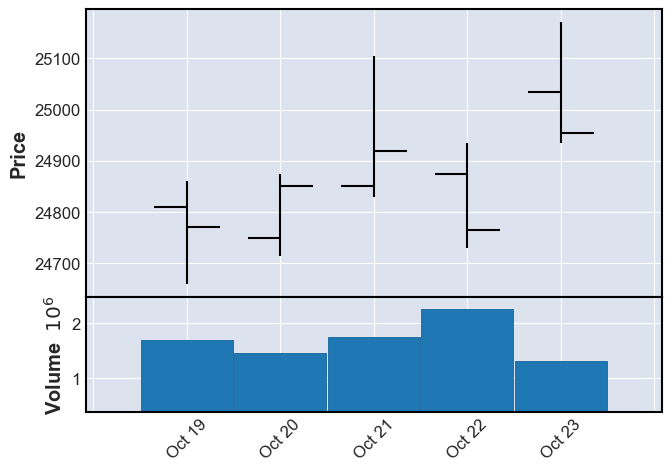

상승?0 횡보?1 하락?20
198 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-10-26  1111857  25115  25115  25005  25040  (2015, 44)
2015-10-27   930215  25065  25035  24895  25040  (2015, 44)
2015-10-28  1050410  25065  25065  24840  25015  (2015, 44)
2015-10-29  1513909  25310  25040  24875  24950  (2015, 44)
2015-10-30  1458176  25095  24905  24885  25000  (2015, 44)


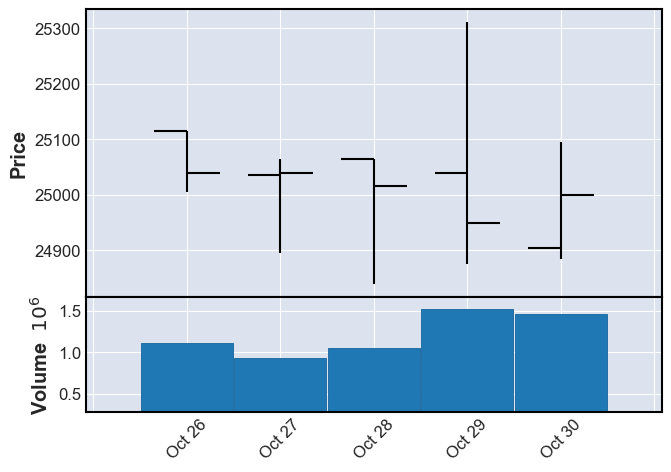

상승?0 횡보?1 하락?21
199 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-11-02   933729  25080  24990  24920  25045  (2015, 45)
2015-11-03  1328978  25330  25190  25180  25250  (2015, 45)
2015-11-04  1455245  25370  25345  25155  25250  (2015, 45)
2015-11-05  1005726  25245  25175  25080  25235  (2015, 45)
2015-11-06   692411  25220  25185  24990  25050  (2015, 45)


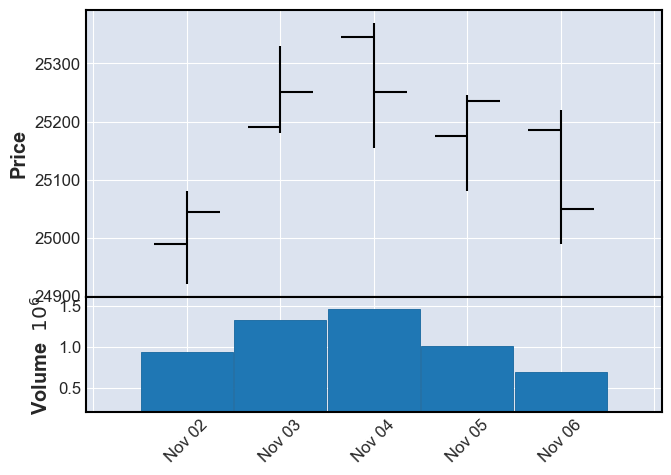

상승?0 횡보?1 하락?21
200 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-11-09  1095094  25030  24985  24855  24945  (2015, 46)
2015-11-10  1202957  24805  24800  24570  24580  (2015, 46)
2015-11-11  1347255  24645  24520  24415  24550  (2015, 46)
2015-11-12   849862  24610  24565  24490  24565  (2015, 46)
2015-11-13  1375030  24405  24330  24245  24245  (2015, 46)


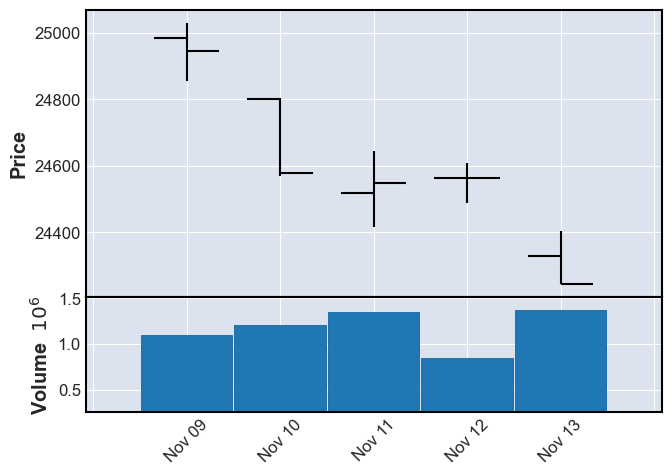

상승?0 횡보?1 하락?22
201 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-11-16  1807895  24125  23980  23955  23985  (2015, 47)
2015-11-17   900712  24255  24175  24100  24185  (2015, 47)
2015-11-18   937735  24240  24135  24100  24120  (2015, 47)
2015-11-19   935598  24460  24340  24240  24460  (2015, 47)
2015-11-20   923137  24525  24485  24445  24475  (2015, 47)


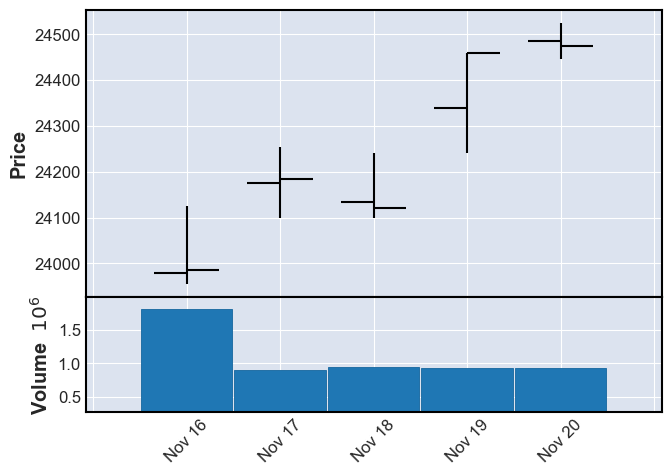

상승?0 횡보?1 하락?20
202 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-11-23   964850  24690  24550  24525  24655  (2015, 48)
2015-11-24  1104883  24770  24645  24635  24755  (2015, 48)
2015-11-25   935136  24755  24745  24635  24715  (2015, 48)
2015-11-26  1275791  25045  24735  24735  25020  (2015, 48)
2015-11-27  1116211  25070  25025  24955  24980  (2015, 48)


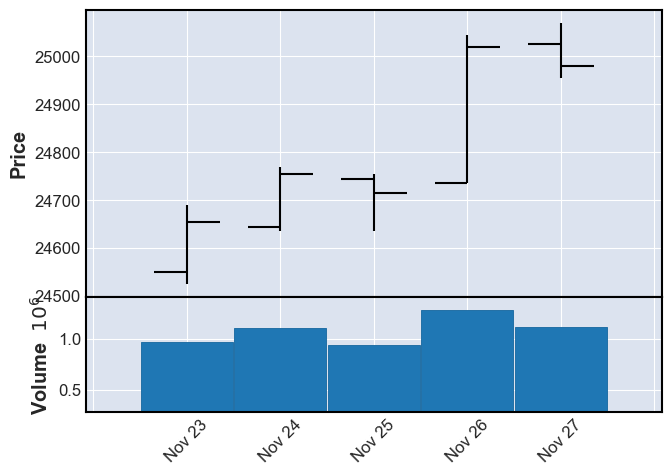

상승?0 횡보?1 하락?20
203 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-11-30  1222038  24865  24860  24380  24495  (2015, 49)
2015-12-01   753080  24885  24550  24550  24835  (2015, 49)
2015-12-02   905375  24860  24845  24695  24710  (2015, 49)
2015-12-03  1012531  24545  24545  24300  24480  (2015, 49)
2015-12-04   986029  24335  24165  24165  24200  (2015, 49)


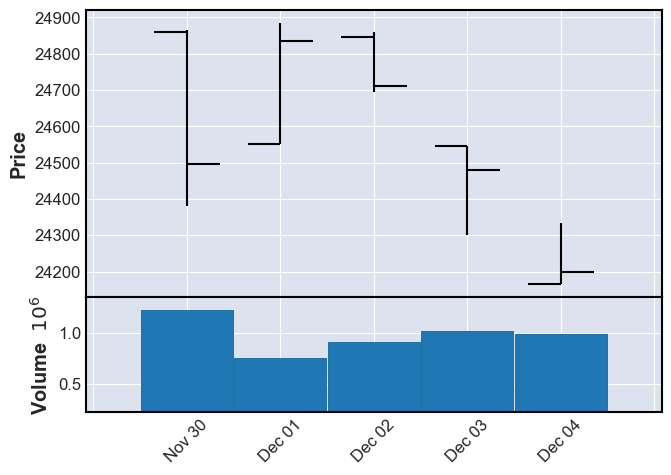

상승?0 횡보?1 하락?22
204 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-12-07   996214  24385  24375  24105  24105  (2015, 50)
2015-12-08  1925925  24215  24120  23960  24005  (2015, 50)
2015-12-09  1752626  24070  24025  23955  24010  (2015, 50)
2015-12-10  2232406  24225  23960  23905  24165  (2015, 50)
2015-12-11  2154290  24245  24100  24035  24090  (2015, 50)


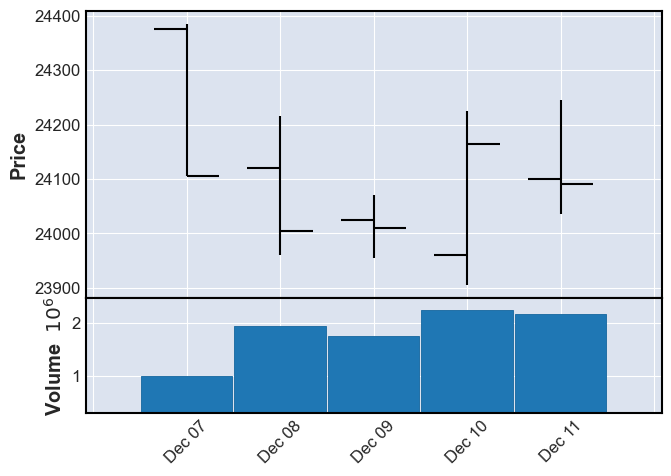

상승?0 횡보?1 하락?21
205 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-12-14  2415685  23925  23890  23735  23915  (2015, 51)
2015-12-15  1120796  24015  24000  23890  23970  (2015, 51)
2015-12-16  1581919  24495  24175  24135  24430  (2015, 51)
2015-12-17  1321658  24610  24555  24325  24380  (2015, 51)
2015-12-18   874185  24475  24195  24180  24395  (2015, 51)


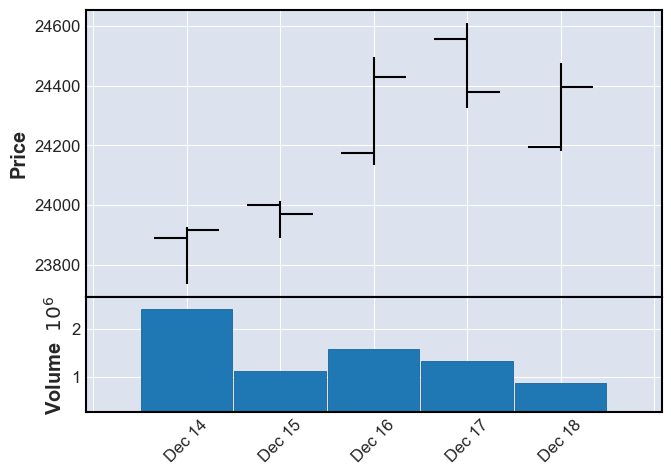

상승?0 횡보?1 하락?20
206 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-12-21  1221069  24545  24405  24220  24445  (2015, 52)
2015-12-22  1093392  24535  24420  24285  24500  (2015, 52)
2015-12-23   787985  24805  24560  24540  24740  (2015, 52)
2015-12-24  1808253  24885  24865  24595  24595  (2015, 52)


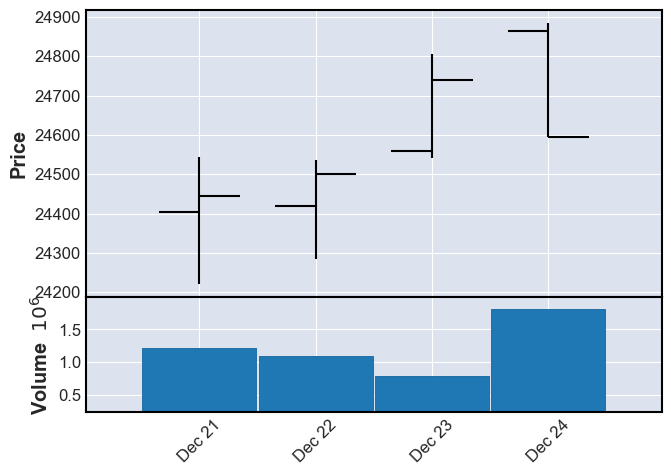

상승?0 횡보?1 하락?20
207 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2015-12-28  1208396  24620  24610  24260  24260  (2015, 53)
2015-12-29  1035525  24490  24300  24230  24465  (2015, 53)
2015-12-30  1144518  24600  24550  24365  24430  (2015, 53)


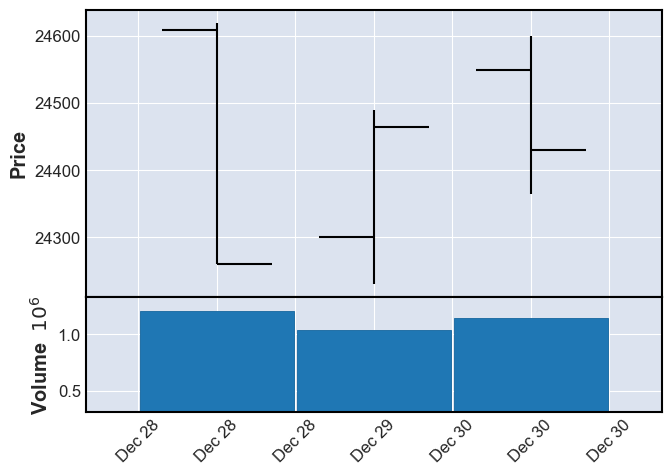

상승?0 횡보?1 하락?20
208 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-01-04  1937147  24330  24330  23865  23865  (2016, 1)
2016-01-05  2088328  24090  23855  23850  24015  (2016, 1)
2016-01-06  1310720  24025  24015  23715  23865  (2016, 1)
2016-01-07  2693867  23875  23800  23560  23595  (2016, 1)
2016-01-08  1633391  23795  23470  23415  23770  (2016, 1)


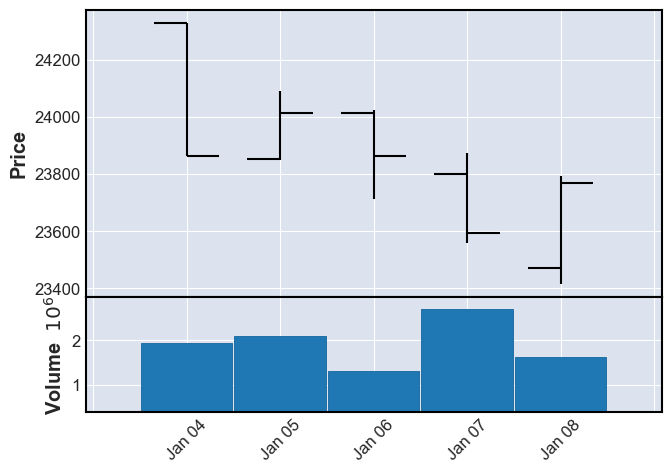

상승?0 횡보?1 하락?21
209 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-01-11  1495398  23595  23460  23415  23510  (2016, 2)
2016-01-12   477733  23655  23640  23400  23445  (2016, 2)
2016-01-13   874970  23830  23580  23555  23805  (2016, 2)
2016-01-14  2365492  23570  23480  23320  23570  (2016, 2)
2016-01-15  1529076  23790  23750  23190  23325  (2016, 2)


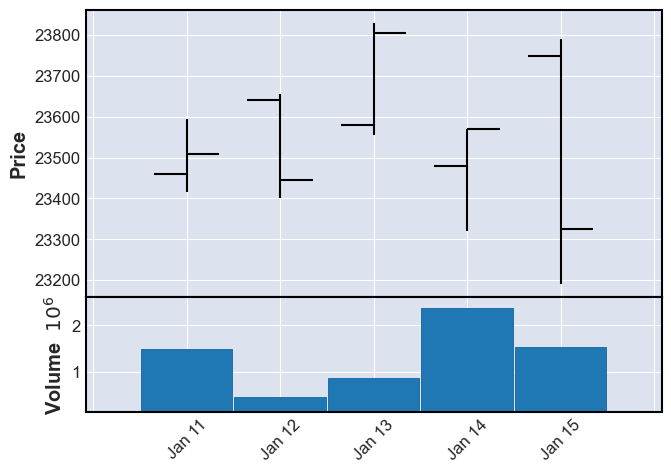

상승?0 횡보?1 하락?22
210 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-01-18  1056047  23330  22990  22985  23280  (2016, 3)
2016-01-19  1297115  23405  23280  23090  23405  (2016, 3)
2016-01-20  4246122  23310  23310  22700  22850  (2016, 3)
2016-01-21  1833951  23050  22895  22800  22815  (2016, 3)
2016-01-22  1242270  23305  23060  23060  23305  (2016, 3)


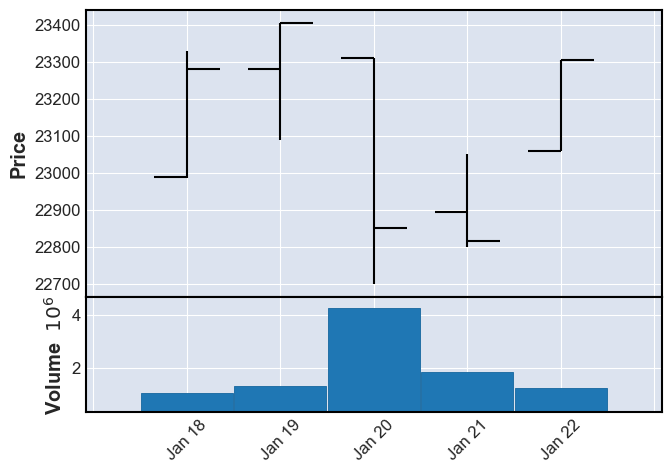

상승?0 횡보?1 하락?21
211 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-01-25  1714069  23565  23395  23310  23435  (2016, 4)
2016-01-26  1638296  23325  23325  23005  23170  (2016, 4)
2016-01-27   753031  23515  23345  23300  23470  (2016, 4)
2016-01-28  1014328  23440  23210  23115  23410  (2016, 4)
2016-01-29  1234917  23465  23335  23190  23465  (2016, 4)


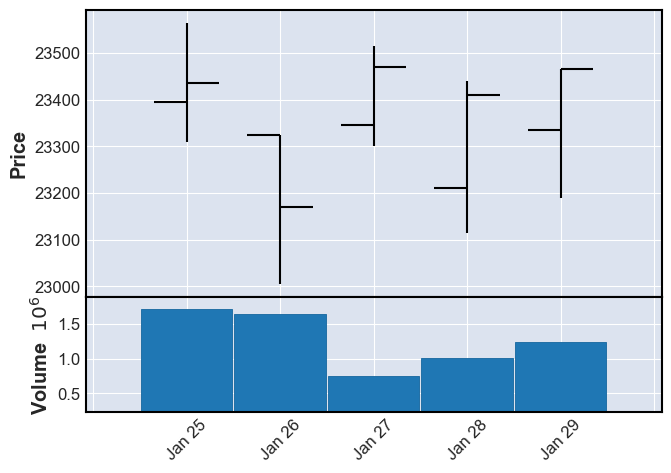

상승?0 횡보?1 하락?21
212 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-02-01  1164257  23725  23565  23525  23615  (2016, 5)
2016-02-02   982622  23610  23530  23435  23475  (2016, 5)
2016-02-03  1080345  23225  23205  23070  23220  (2016, 5)
2016-02-04  1425410  23635  23365  23330  23635  (2016, 5)
2016-02-05  1051050  23730  23555  23555  23670  (2016, 5)


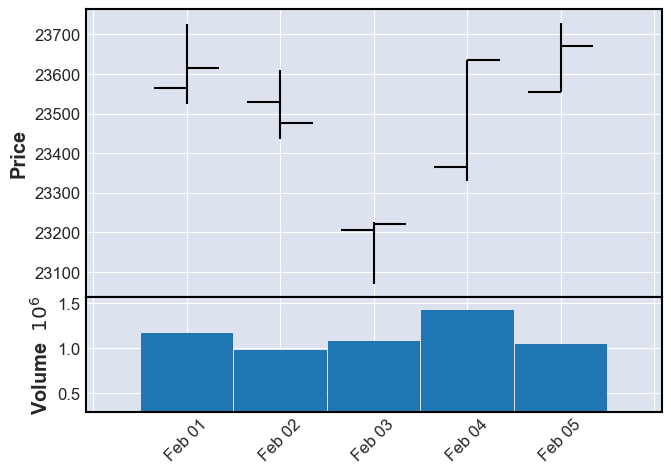

상승?0 횡보?1 하락?21
213 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-02-11  2809687  23185  23135  22975  23025  (2016, 6)
2016-02-12  1301815  23010  22925  22710  22845  (2016, 6)


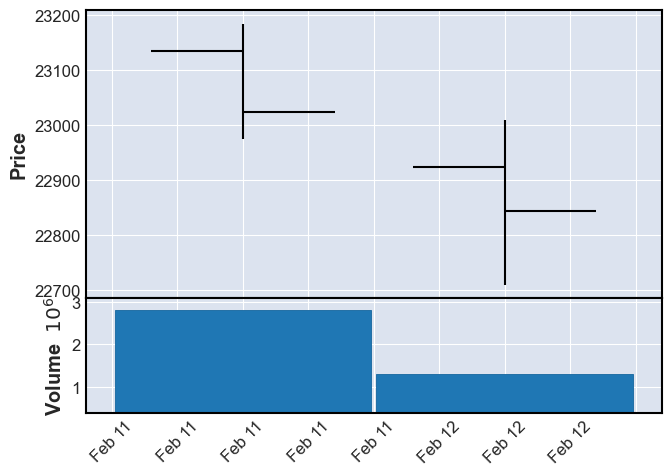

상승?0 횡보?1 하락?22
214 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-02-15  1461434  23235  23130  23065  23175  (2016, 7)
2016-02-16  1704852  23560  23230  23195  23525  (2016, 7)
2016-02-17  1339970  23655  23435  23430  23555  (2016, 7)
2016-02-18  1634817  23850  23840  23720  23780  (2016, 7)
2016-02-19  1395952  23820  23725  23705  23790  (2016, 7)


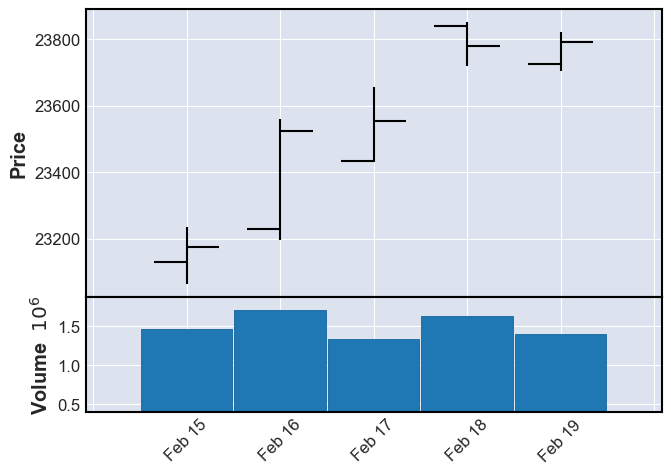

상승?0 횡보?1 하락?20
215 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-02-22  1576922  23915  23735  23705  23825  (2016, 8)
2016-02-23  1207467  23965  23925  23780  23835  (2016, 8)
2016-02-24   931118  23905  23805  23715  23795  (2016, 8)
2016-02-25  1542621  24030  23855  23760  23875  (2016, 8)
2016-02-26  1647415  24005  23955  23850  23875  (2016, 8)


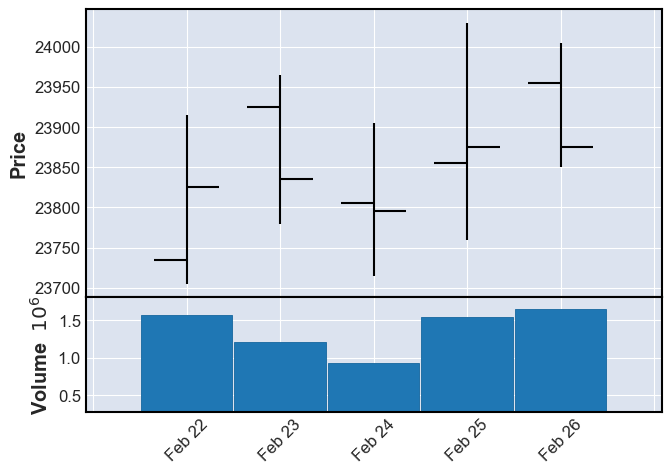

상승?0 횡보?1 하락?21
216 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2016-02-29  1311694  23975  23820  23790  23840  (2016, 9)
2016-03-02  3126892  24250  24150  24140  24190  (2016, 9)
2016-03-03  2518516  24305  24290  24235  24300  (2016, 9)
2016-03-04  2789595  24365  24300  24260  24295  (2016, 9)


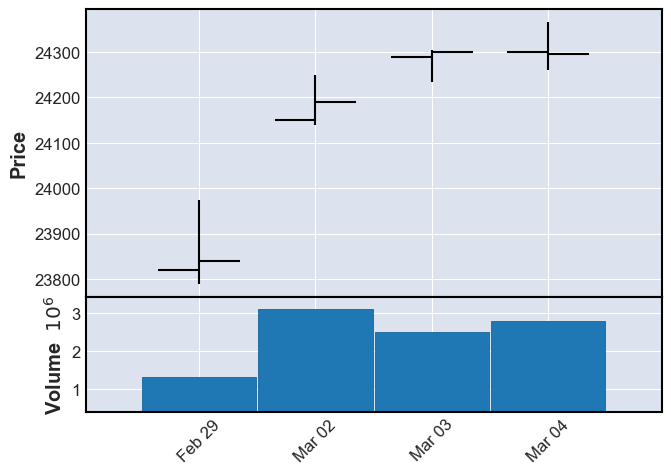

상승?0 횡보?1 하락?20
217 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-03-07  1550941  24400  24360  24330  24350  (2016, 10)
2016-03-08  2179476  24400  24385  24100  24160  (2016, 10)
2016-03-09  2524576  24265  24140  24095  24265  (2016, 10)
2016-03-10  2450441  24620  24345  24305  24465  (2016, 10)
2016-03-11  1384612  24615  24510  24490  24555  (2016, 10)


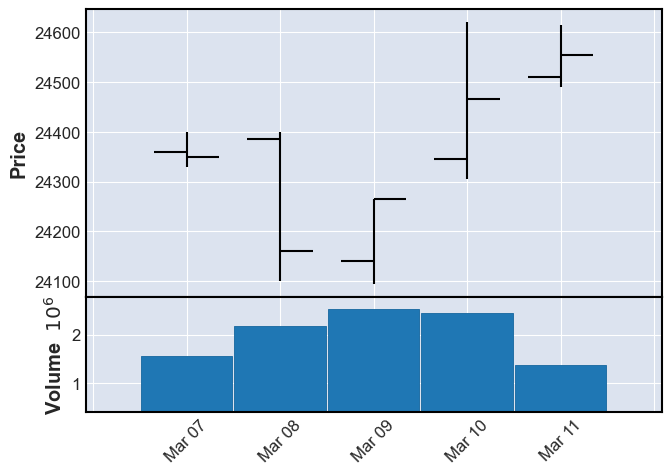

상승?0 횡보?1 하락?20
218 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-03-14  2702915  24695  24620  24540  24570  (2016, 11)
2016-03-15  2435384  24625  24560  24450  24540  (2016, 11)
2016-03-16  2209993  24705  24600  24530  24600  (2016, 11)
2016-03-17  3520243  24935  24690  24690  24705  (2016, 11)
2016-03-18  1531289  24830  24815  24690  24725  (2016, 11)


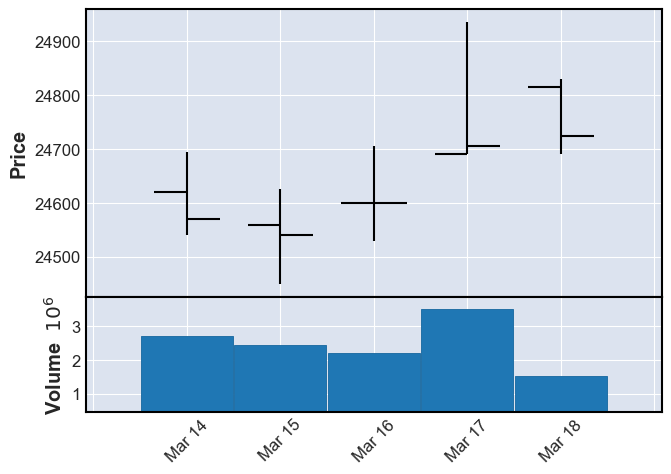

상승?0 횡보?1 하락?20
219 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-03-21  1548129  24895  24790  24635  24715  (2016, 12)
2016-03-22  1286172  24820  24750  24725  24815  (2016, 12)
2016-03-23  1859166  24930  24845  24780  24820  (2016, 12)
2016-03-24  2106057  24820  24735  24645  24735  (2016, 12)
2016-03-25   941624  24800  24765  24690  24730  (2016, 12)


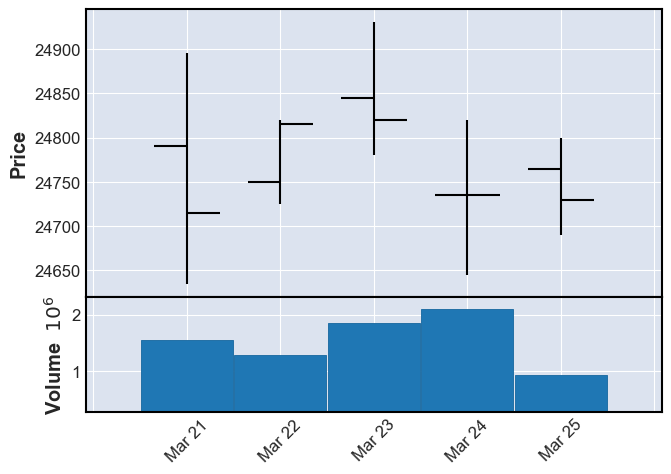

상승?0 횡보?1 하락?21
220 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-03-28  1167508  24815  24725  24695  24750  (2016, 13)
2016-03-29  1412010  24905  24755  24745  24855  (2016, 13)
2016-03-30  1693922  25050  24975  24945  24980  (2016, 13)
2016-03-31   836120  25025  25000  24795  24870  (2016, 13)
2016-04-01  1139102  24865  24835  24530  24530  (2016, 13)


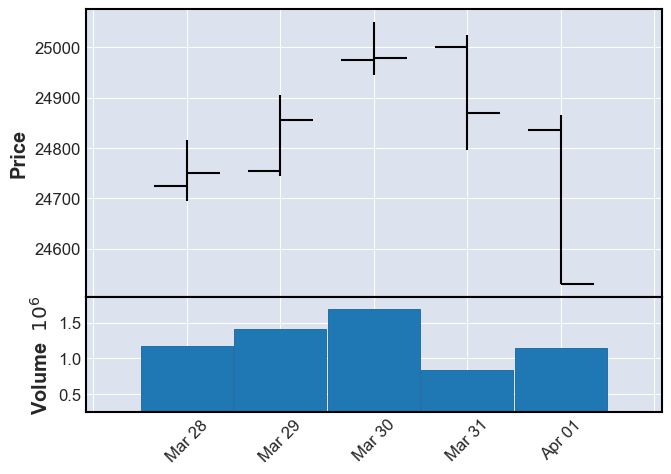

상승?0 횡보?1 하락?22
221 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-04-04  1017531  24605  24535  24495  24565  (2016, 14)
2016-04-05  1389537  24510  24500  24340  24360  (2016, 14)
2016-04-06   977634  24540  24375  24365  24515  (2016, 14)
2016-04-07   809788  24625  24585  24415  24525  (2016, 14)
2016-04-08  1239981  24485  24365  24260  24475  (2016, 14)


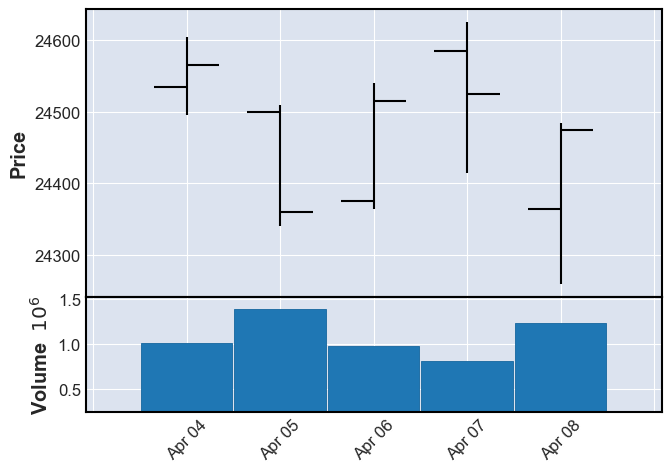

상승?0 횡보?1 하락?21
222 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-04-11   720581  24515  24470  24370  24490  (2016, 15)
2016-04-12   670476  24680  24505  24470  24655  (2016, 15)
2016-04-14  2313902  25190  25125  24970  25170  (2016, 15)
2016-04-15  1151107  25235  25185  25135  25170  (2016, 15)


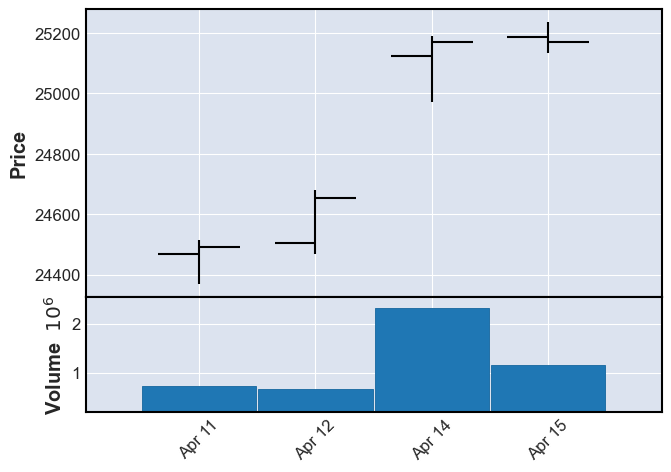

상승?0 횡보?1 하락?20
223 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-04-18   687135  25095  24980  24930  25065  (2016, 16)
2016-04-19   754800  25225  25140  25095  25105  (2016, 16)
2016-04-20  1190691  25280  25190  25015  25015  (2016, 16)
2016-04-21  1209395  25270  25155  25120  25235  (2016, 16)
2016-04-22   501699  25195  25160  25090  25140  (2016, 16)


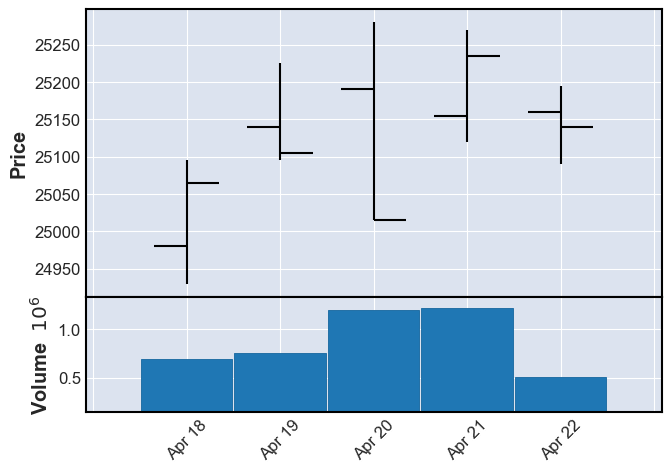

상승?0 횡보?1 하락?21
224 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-04-25  1077790  25155  25150  25020  25070  (2016, 17)
2016-04-26  1399918  25260  25095  25080  25200  (2016, 17)
2016-04-27  1445763  25255  25170  25160  25185  (2016, 17)
2016-04-28  3731265  24945  24945  24570  24570  (2016, 17)
2016-04-29  1927072  24580  24575  24370  24480  (2016, 17)


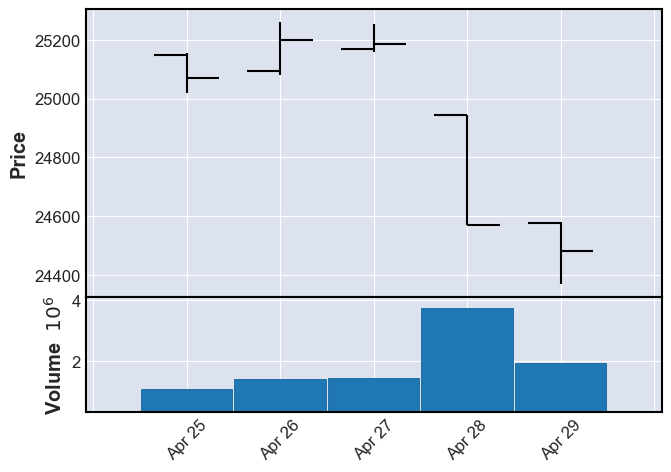

상승?0 횡보?1 하락?22
225 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-05-02  1210611  24425  24415  24280  24285  (2016, 18)
2016-05-03  1147427  24405  24375  24300  24360  (2016, 18)
2016-05-04  1288429  24305  24255  24175  24240  (2016, 18)


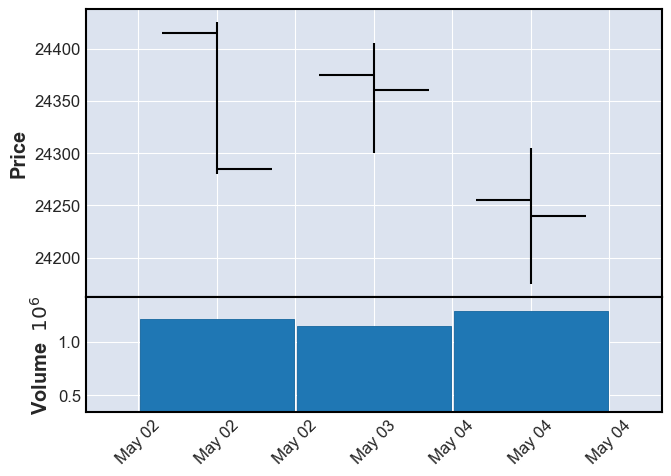

상승?0 횡보?1 하락?21
226 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-05-09   918529  24270  24250  24140  24205  (2016, 19)
2016-05-10  1468314  24295  24150  24145  24290  (2016, 19)
2016-05-11  1817511  24375  24370  24145  24265  (2016, 19)
2016-05-12  1284122  24270  24180  24105  24230  (2016, 19)
2016-05-13  1481433  24215  24215  23980  24040  (2016, 19)


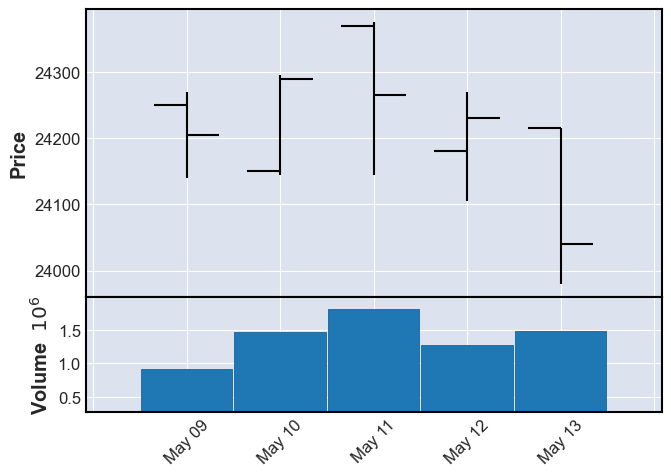

상승?0 횡보?1 하락?21
227 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-05-16   429621  24115  23950  23930  24040  (2016, 20)
2016-05-17   652413  24105  24105  23980  24055  (2016, 20)
2016-05-18  2374668  24010  24010  23805  23940  (2016, 20)
2016-05-19   810765  23910  23890  23830  23880  (2016, 20)
2016-05-20   707403  23925  23860  23810  23855  (2016, 20)


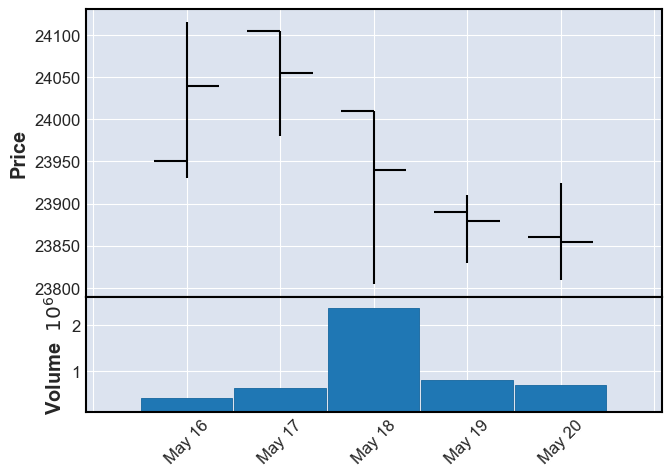

상승?0 횡보?1 하락?22
228 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2016-05-23  693243  23970  23905  23750  23920  (2016, 21)
2016-05-24  638042  23895  23865  23750  23750  (2016, 21)
2016-05-25  877622  24120  23925  23895  24070  (2016, 21)
2016-05-26  490070  24155  24100  24030  24065  (2016, 21)
2016-05-27  892705  24190  24075  24060  24165  (2016, 21)


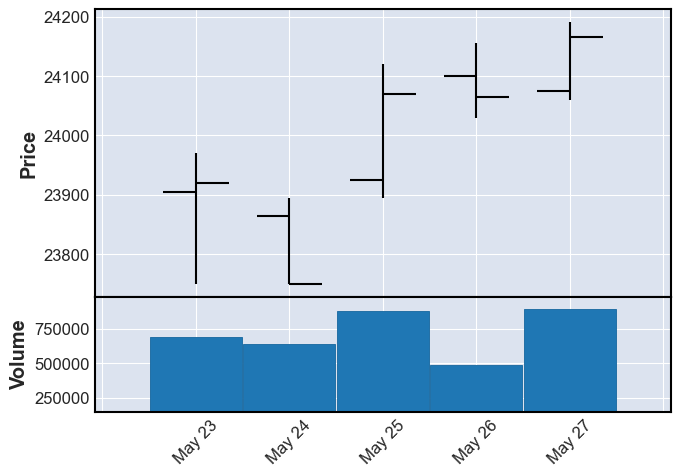

상승?0 횡보?1 하락?20
229 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-05-30   815840  24185  24170  24010  24140  (2016, 22)
2016-05-31  1349388  24320  24125  23990  24315  (2016, 22)
2016-06-01  1264891  24370  24220  24205  24315  (2016, 22)
2016-06-02  1276694  24395  24315  24295  24355  (2016, 22)
2016-06-03  1068011  24450  24405  24350  24410  (2016, 22)


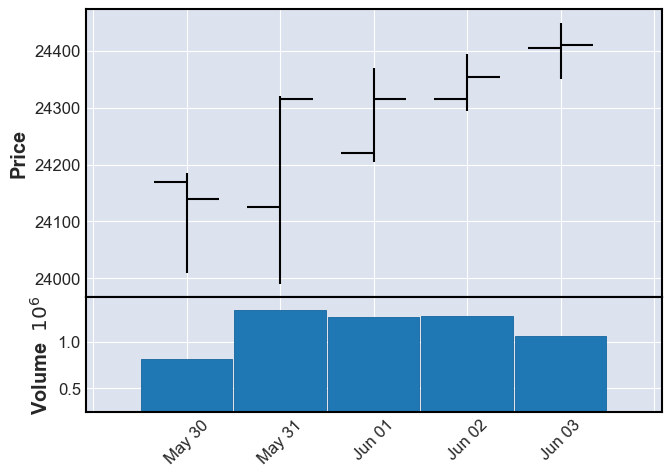

상승?0 횡보?1 하락?20
230 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-06-07  1910334  24760  24490  24490  24740  (2016, 23)
2016-06-08  3149267  24990  24745  24745  24985  (2016, 23)
2016-06-09  7796559  25145  24980  24865  24960  (2016, 23)
2016-06-10  8286747  24985  24930  24885  24905  (2016, 23)


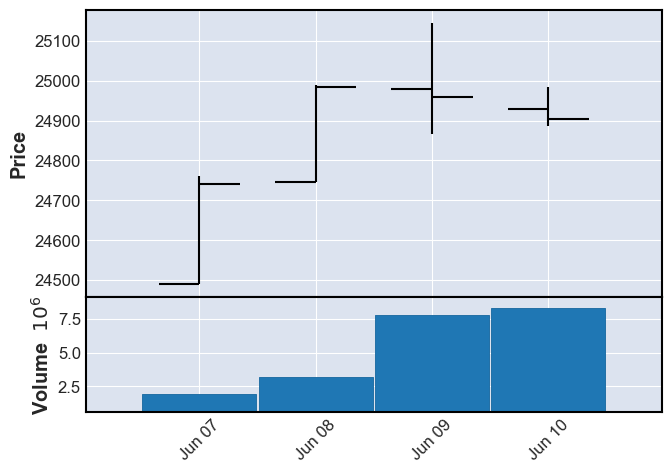

상승?0 횡보?1 하락?21
231 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-06-13  2330345  24730  24720  24360  24360  (2016, 24)
2016-06-14  1366302  24415  24380  24220  24295  (2016, 24)
2016-06-15  1471565  24375  24265  24185  24275  (2016, 24)
2016-06-16  4927622  24340  24325  24020  24095  (2016, 24)
2016-06-17   795224  24360  24265  24125  24150  (2016, 24)


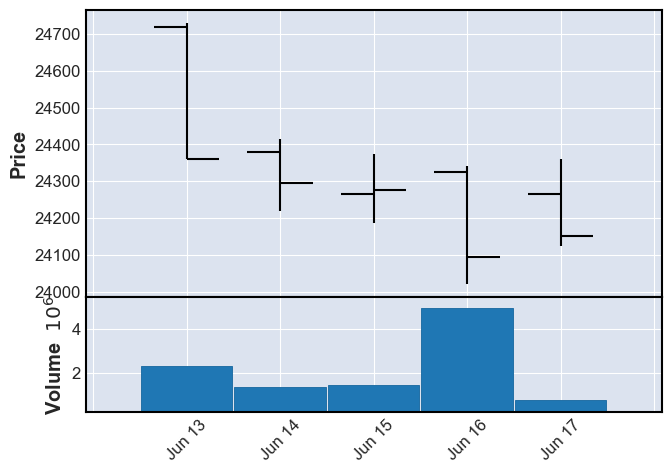

상승?0 횡보?1 하락?22
232 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-06-20  1344379  24520  24450  24350  24470  (2016, 25)
2016-06-21  1664136  24490  24455  24365  24480  (2016, 25)
2016-06-22  1257484  24680  24480  24440  24605  (2016, 25)
2016-06-23  2790668  24655  24635  24570  24630  (2016, 25)
2016-06-24  4879956  24785  24760  23520  23830  (2016, 25)


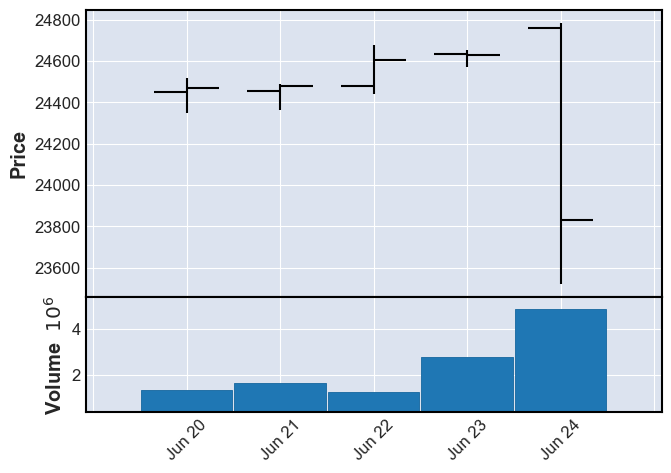

상승?0 횡보?1 하락?22
233 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-06-27  2417315  23905  23735  23700  23905  (2016, 26)
2016-06-28  3099236  24035  23705  23660  23975  (2016, 26)
2016-06-29  1567285  24385  24100  24030  24255  (2016, 26)
2016-06-30  1922098  24405  24385  24235  24395  (2016, 26)
2016-07-01  2266020  24715  24445  24445  24625  (2016, 26)


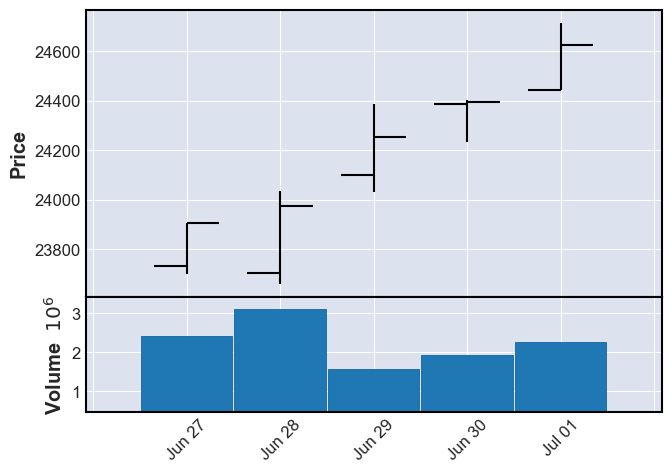

상승?0 횡보?1 하락?20
234 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-07-04  1856694  24755  24660  24595  24705  (2016, 27)
2016-07-05  2066347  24730  24705  24625  24690  (2016, 27)
2016-07-06  2854676  24595  24595  24090  24210  (2016, 27)
2016-07-07  1170470  24510  24355  24240  24460  (2016, 27)
2016-07-08   946110  24515  24400  24280  24325  (2016, 27)


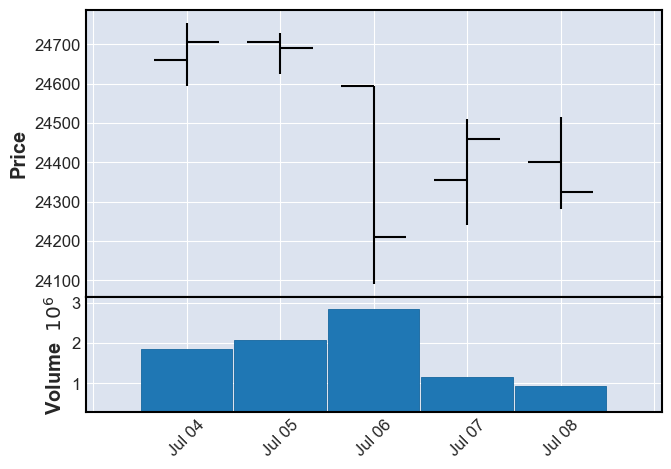

상승?0 횡보?1 하락?24


In [77]:
for i in range(len(weeks)):
    temp_data = tiger200_ohlcv[tiger200_ohlcv['ynw'].isin([weeks[i]])]
    print(temp_data)
    temp_graph = temp_data.iloc[:, 0:5]
    mpf.plot(temp_graph, volume=True)
    temp_val = int(input('상승?0 횡보?1 하락?2'))
    if temp_val == 4:
        break
    else:
        label.iloc[i, 2] = temp_val
        print(i, 'done')


In [80]:
label.iloc[200:234]

,0,1,012
200,2015,45,1
201,2015,46,2
202,2015,47,0
203,2015,48,0
204,2015,49,2
205,2015,50,1
206,2015,51,0
207,2015,52,0
208,2015,53,0
209,2016,1,1


             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-06-27  2417315  23905  23735  23700  23905  (2016, 26)
2016-06-28  3099236  24035  23705  23660  23975  (2016, 26)
2016-06-29  1567285  24385  24100  24030  24255  (2016, 26)
2016-06-30  1922098  24405  24385  24235  24395  (2016, 26)
2016-07-01  2266020  24715  24445  24445  24625  (2016, 26)


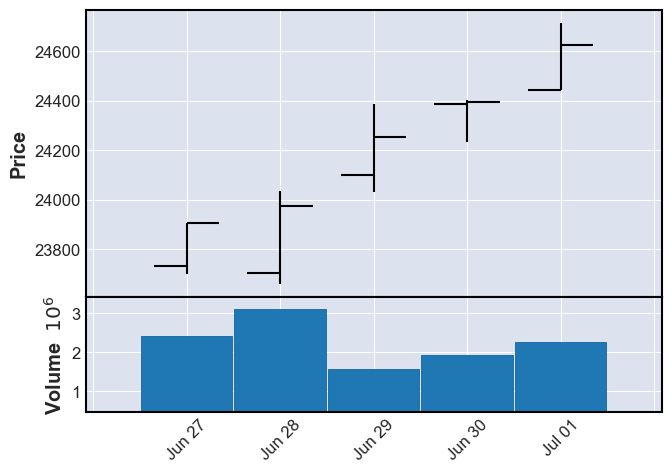

상승?0 횡보?1 하락?20
234 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-07-04  1856694  24755  24660  24595  24705  (2016, 27)
2016-07-05  2066347  24730  24705  24625  24690  (2016, 27)
2016-07-06  2854676  24595  24595  24090  24210  (2016, 27)
2016-07-07  1170470  24510  24355  24240  24460  (2016, 27)
2016-07-08   946110  24515  24400  24280  24325  (2016, 27)


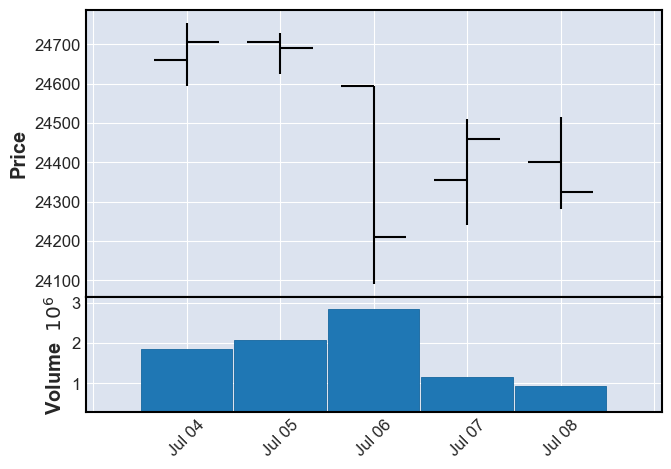

상승?0 횡보?1 하락?22
235 done
              Volume   High   Open    Low  Close         ynw
tdate                                                       
2016-07-11   2460098  24750  24575  24555  24695  (2016, 28)
2016-07-12   2148258  24840  24755  24640  24700  (2016, 28)
2016-07-13  14578882  24995  24890  24765  24860  (2016, 28)
2016-07-14   1397723  24960  24835  24825  24895  (2016, 28)
2016-07-15   3499960  25140  25005  24970  25025  (2016, 28)


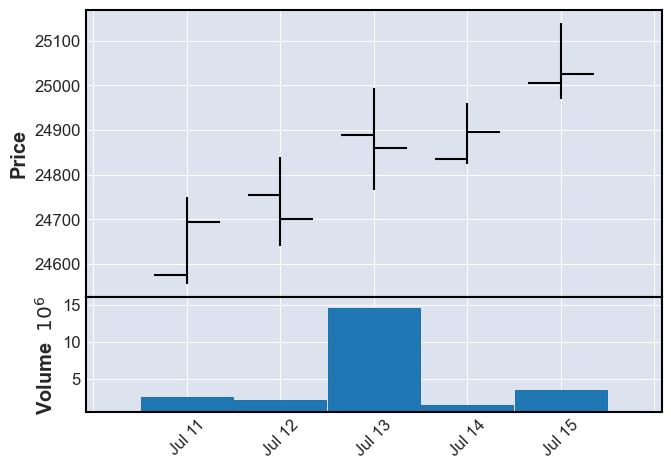

상승?0 횡보?1 하락?20
236 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-07-18  1136968  25140  25040  25040  25090  (2016, 29)
2016-07-19  1687701  25125  25105  24980  25025  (2016, 29)
2016-07-20  3011758  25040  25040  24885  25015  (2016, 29)
2016-07-21   902177  25120  25090  24985  25035  (2016, 29)
2016-07-22   717125  25050  24915  24870  24990  (2016, 29)


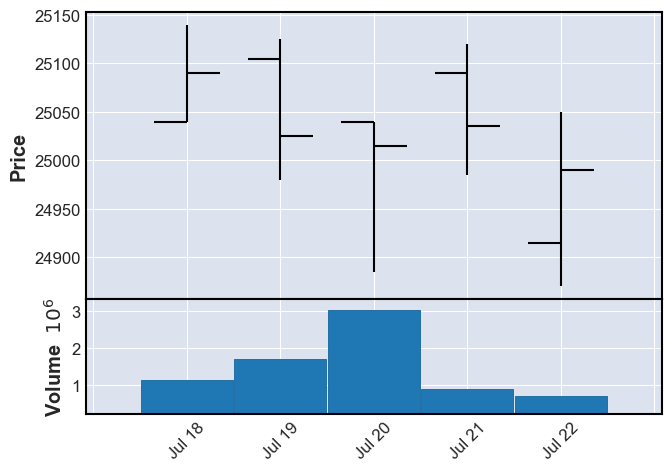

상승?0 횡보?1 하락?21
237 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-07-25  1212682  25135  25060  24980  25040  (2016, 30)
2016-07-26  1978719  25260  25005  24980  25245  (2016, 30)
2016-07-27  1670148  25310  25245  25230  25250  (2016, 30)
2016-07-28  1904163  25265  25215  25080  25120  (2016, 30)
2016-07-29  3016920  25295  25120  25105  25140  (2016, 30)


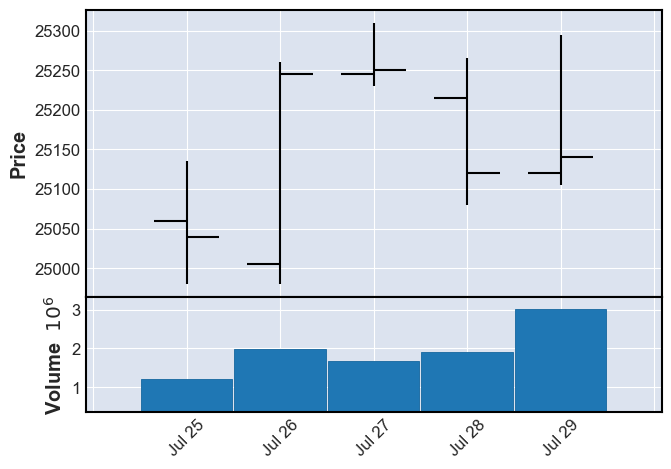

상승?0 횡보?1 하락?21
238 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-08-01  3700332  25345  25240  25240  25325  (2016, 31)
2016-08-02  1158523  25275  25275  25120  25130  (2016, 31)
2016-08-03  2592694  24990  24950  24810  24850  (2016, 31)
2016-08-04  1774551  24965  24910  24810  24875  (2016, 31)
2016-08-05  1696137  25160  24940  24935  25140  (2016, 31)


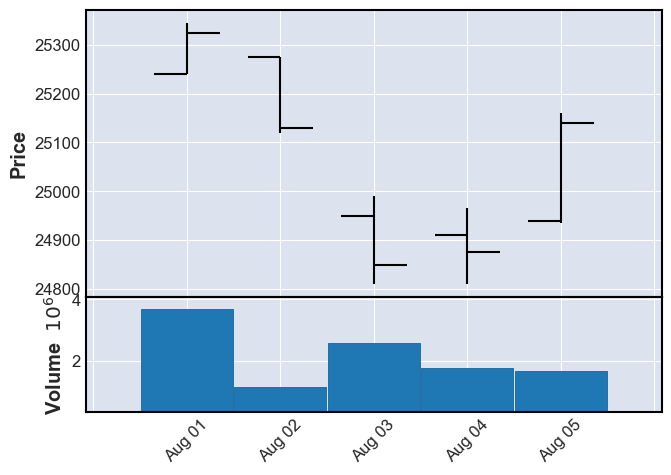

상승?0 횡보?1 하락?21
239 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-08-08  1088560  25385  25300  25220  25325  (2016, 32)
2016-08-09  1455275  25575  25345  25345  25560  (2016, 32)
2016-08-10  1525803  25580  25520  25455  25470  (2016, 32)
2016-08-11  1088111  25495  25455  25380  25470  (2016, 32)
2016-08-12  1387143  25730  25565  25535  25570  (2016, 32)


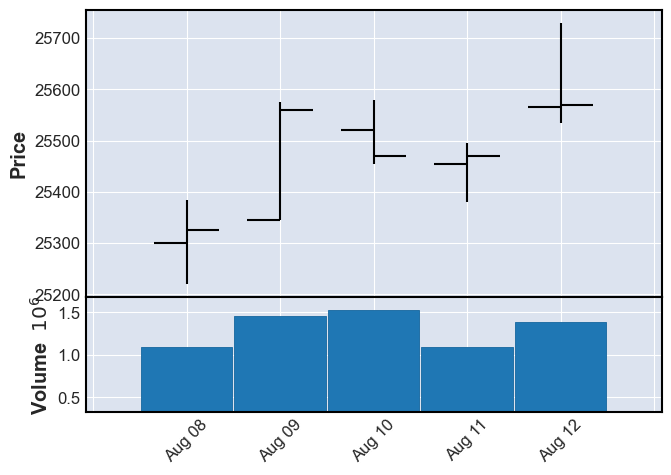

상승?0 횡보?1 하락?20
240 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-08-16  2272199  25730  25645  25550  25550  (2016, 33)
2016-08-17   813210  25580  25530  25440  25530  (2016, 33)
2016-08-18  2923923  25740  25530  25530  25730  (2016, 33)
2016-08-19  2215663  25805  25750  25705  25795  (2016, 33)


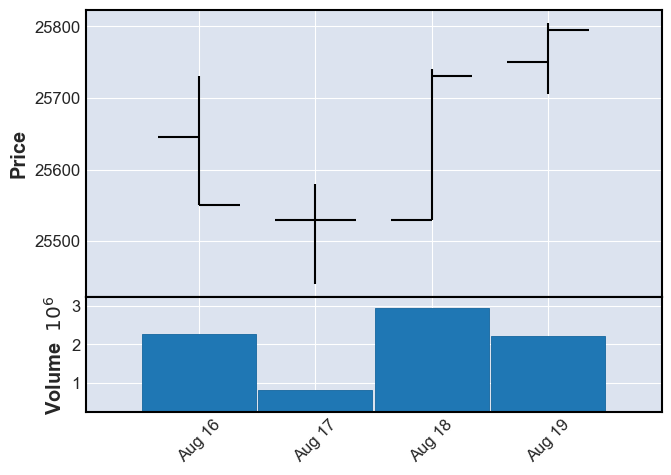

상승?0 횡보?1 하락?20
241 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-08-22  1661120  25780  25775  25635  25645  (2016, 34)
2016-08-23   919397  25785  25670  25670  25780  (2016, 34)
2016-08-24  1217716  25795  25765  25615  25660  (2016, 34)
2016-08-25   926392  25735  25650  25575  25670  (2016, 34)
2016-08-26   627365  25620  25610  25475  25610  (2016, 34)


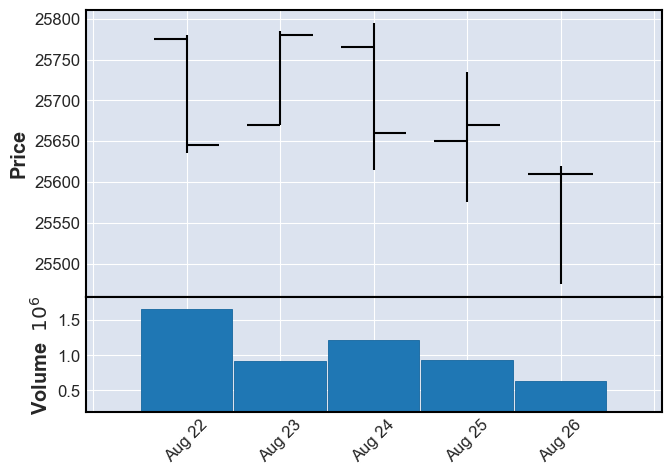

상승?0 횡보?1 하락?21
242 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-08-29   649221  25635  25455  25385  25580  (2016, 35)
2016-08-30   782600  25840  25700  25670  25715  (2016, 35)
2016-08-31  1402723  25715  25715  25565  25620  (2016, 35)
2016-09-01  1220787  25550  25480  25360  25535  (2016, 35)
2016-09-02  1580998  25615  25585  25510  25595  (2016, 35)


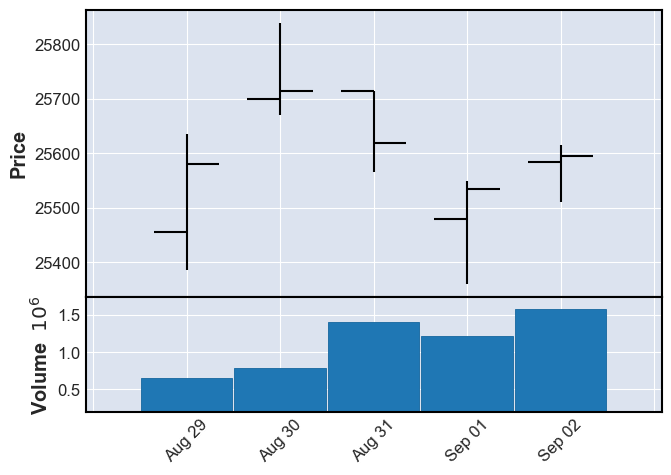

상승?0 횡보?1 하락?21
243 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-09-05  1606178  25935  25725  25725  25920  (2016, 36)
2016-09-06   984441  26040  25935  25905  26025  (2016, 36)
2016-09-07  2157186  26170  26065  25965  25965  (2016, 36)
2016-09-08  5444329  26100  26000  25915  25935  (2016, 36)
2016-09-09  2673397  25830  25815  25595  25655  (2016, 36)


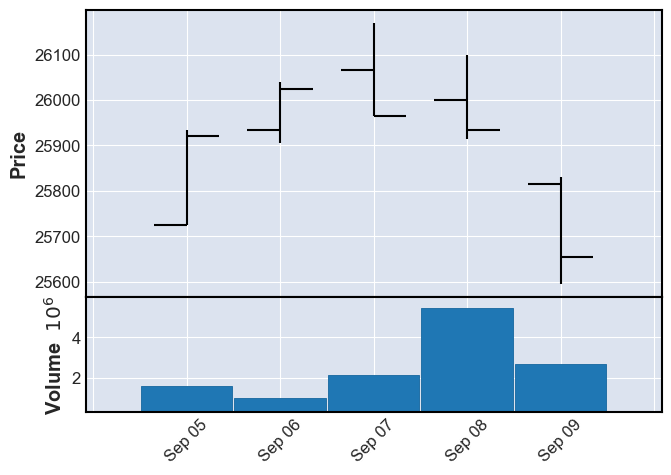

상승?0 횡보?1 하락?22
244 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-09-12  5079512  25330  25250  25035  25035  (2016, 37)
2016-09-13  3276253  25325  25325  25115  25120  (2016, 37)


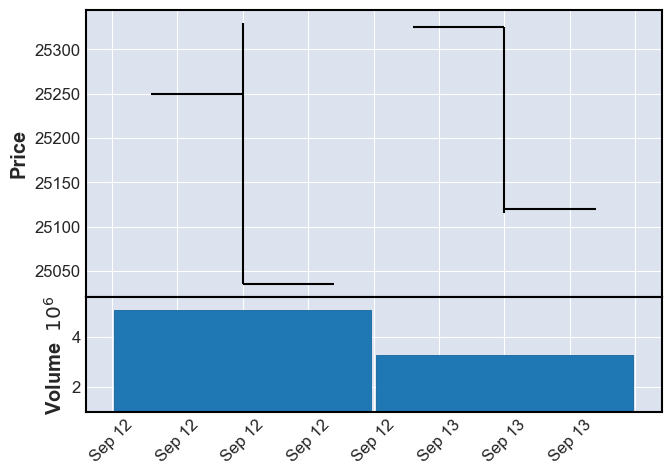

상승?0 횡보?1 하락?20
245 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-09-19  1664711  25380  25100  25090  25360  (2016, 38)
2016-09-20  2498958  25435  25310  25270  25415  (2016, 38)
2016-09-21  2383016  25590  25405  24700  25590  (2016, 38)
2016-09-22  1673905  25920  25760  25760  25795  (2016, 38)
2016-09-23   831105  25880  25870  25755  25770  (2016, 38)


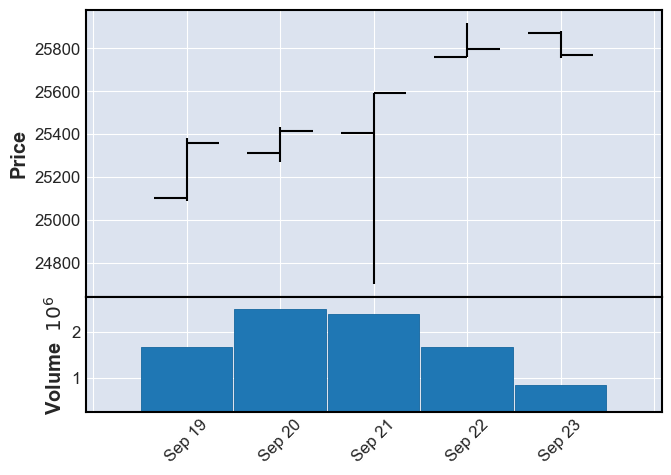

상승?0 횡보?1 하락?20
246 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-09-26  1552636  25890  25790  25660  25695  (2016, 39)
2016-09-27  1309892  25920  25630  25485  25880  (2016, 39)
2016-09-28   741205  25875  25875  25775  25800  (2016, 39)
2016-09-29  1841709  26045  25925  25915  25980  (2016, 39)
2016-09-30  1154117  25850  25800  25675  25700  (2016, 39)


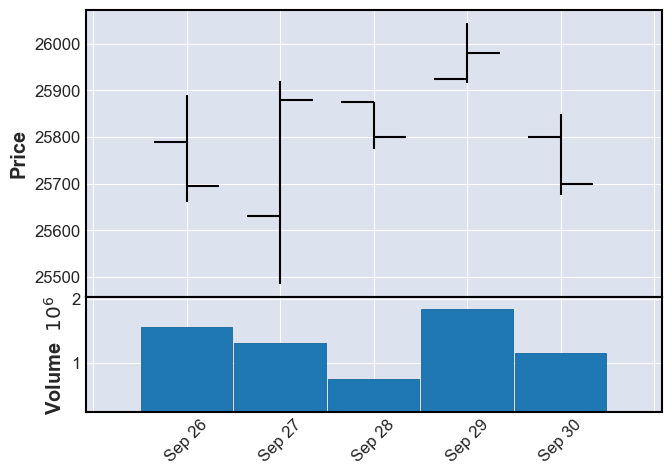

상승?0 횡보?1 하락?21
247 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-10-04   716395  25930  25845  25800  25855  (2016, 40)
2016-10-05  1005761  25900  25660  25615  25840  (2016, 40)
2016-10-06  1698707  26095  26020  25920  26035  (2016, 40)
2016-10-07  1773171  26070  26015  25940  25960  (2016, 40)


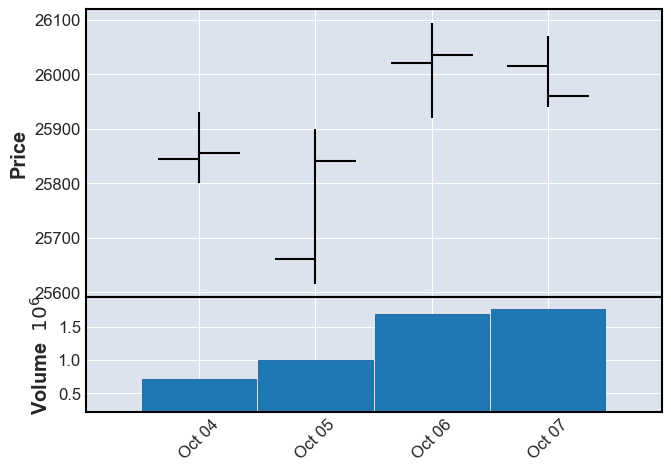

상승?0 횡보?1 하락?21
248 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-10-10  1341870  26010  25865  25755  25985  (2016, 41)
2016-10-11  3007183  26005  25945  25595  25595  (2016, 41)
2016-10-12  3060669  25645  25455  25450  25610  (2016, 41)
2016-10-13  2074798  25590  25550  25330  25370  (2016, 41)
2016-10-14  1353833  25560  25445  25425  25520  (2016, 41)


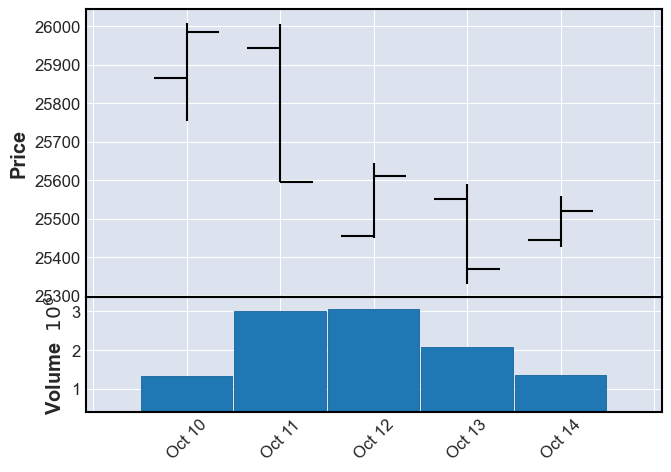

상승?0 횡보?1 하락?22
249 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-10-17  1401431  25630  25525  25325  25560  (2016, 42)
2016-10-18  1130582  25740  25565  25560  25715  (2016, 42)
2016-10-19  1788231  25895  25665  25665  25745  (2016, 42)
2016-10-20  1921103  25890  25800  25760  25765  (2016, 42)
2016-10-21  1289961  25810  25755  25640  25660  (2016, 42)


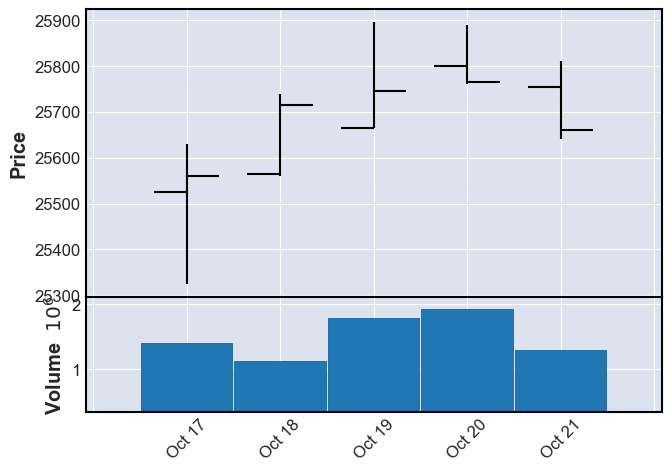

상승?0 횡보?1 하락?21
250 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-10-24  1602740  25890  25775  25765  25855  (2016, 43)
2016-10-25   623289  25855  25830  25760  25800  (2016, 43)
2016-10-26  3109639  25710  25710  25405  25520  (2016, 43)
2016-10-27  1451358  25650  25570  25545  25605  (2016, 43)
2016-10-28   686356  25690  25575  25575  25645  (2016, 43)


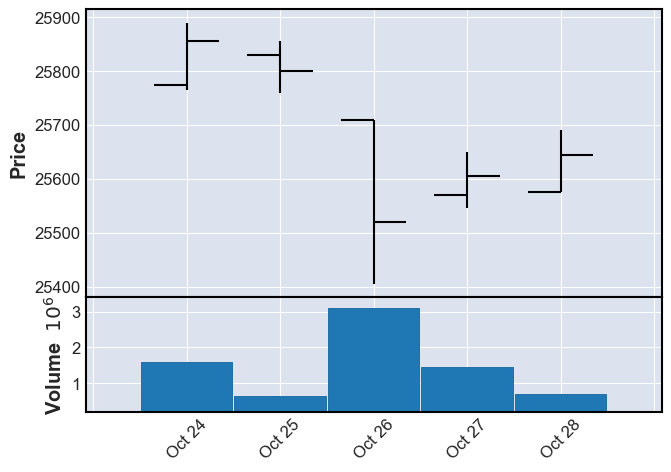

상승?0 횡보?1 하락?22
251 done
              Volume   High   Open    Low  Close         ynw
tdate                                                       
2016-10-31   1139628  25640  25535  25475  25545  (2016, 44)
2016-11-01   1672770  25585  25545  25320  25580  (2016, 44)
2016-11-02   3721892  25430  25390  25235  25250  (2016, 44)
2016-11-03  11290162  25340  25225  25160  25325  (2016, 44)
2016-11-04   1904213  25300  25265  25180  25245  (2016, 44)


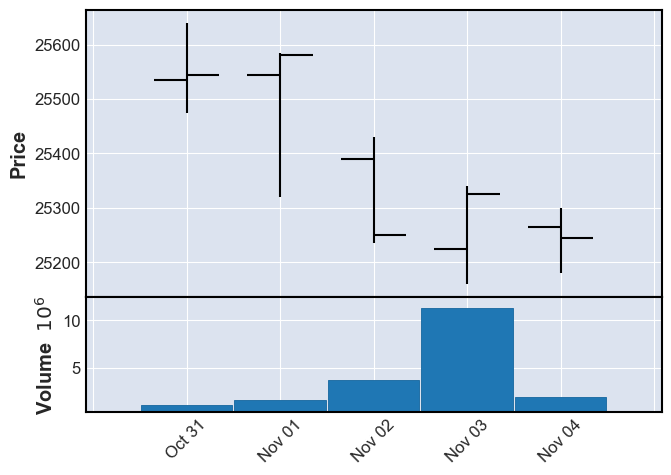

상승?0 횡보?1 하락?22
252 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-11-07  2000313  25525  25500  25390  25475  (2016, 45)
2016-11-08  1387577  25585  25585  25395  25525  (2016, 45)
2016-11-09  6551080  25690  25590  24665  24980  (2016, 45)
2016-11-10  2342707  25505  25330  25270  25475  (2016, 45)
2016-11-11   797748  25345  25295  25175  25220  (2016, 45)


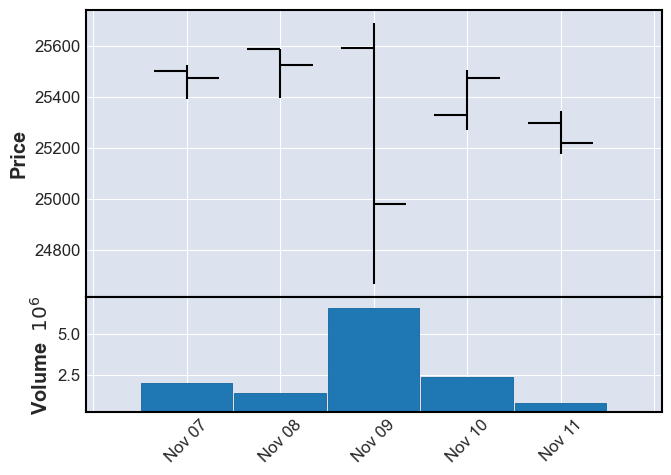

상승?0 횡보?1 하락?22
253 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-11-14  1231779  25230  25185  24995  25035  (2016, 46)
2016-11-15  2202646  25075  24975  24920  24940  (2016, 46)
2016-11-16   753266  25115  25070  25000  25025  (2016, 46)
2016-11-17  1443548  25040  24955  24845  25010  (2016, 46)
2016-11-18   997215  25050  25050  24895  25010  (2016, 46)


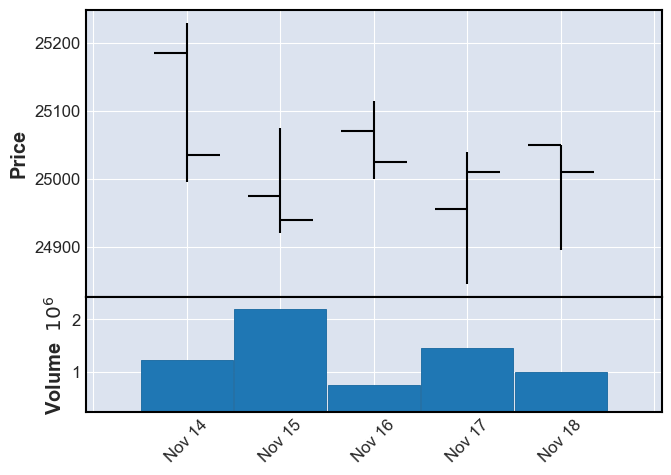

상승?0 횡보?1 하락?21
254 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-11-21  1636409  25035  24945  24890  24940  (2016, 47)
2016-11-22   906916  25270  25035  25035  25235  (2016, 47)
2016-11-23   941891  25420  25250  25205  25330  (2016, 47)
2016-11-24  3441020  25335  25300  25130  25195  (2016, 47)
2016-11-25  1617228  25265  25225  25165  25220  (2016, 47)


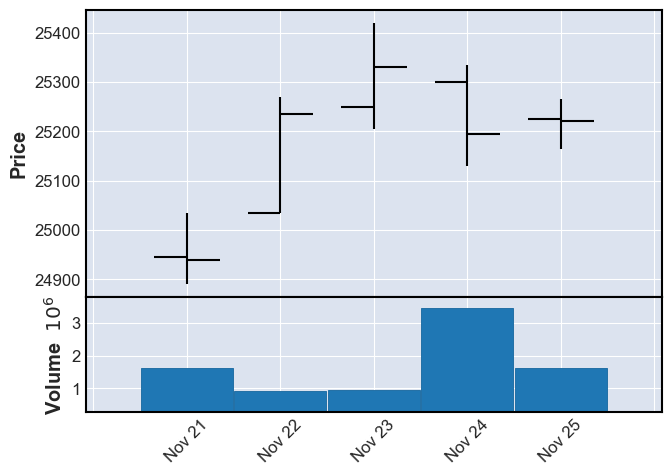

상승?0 횡보?1 하락?20
255 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-11-28  3102397  25320  25220  25075  25315  (2016, 48)
2016-11-29  2012454  25330  25305  25230  25290  (2016, 48)
2016-11-30   645977  25470  25295  25285  25425  (2016, 48)
2016-12-01  1588210  25480  25440  25375  25445  (2016, 48)
2016-12-02  1579246  25365  25320  25210  25270  (2016, 48)


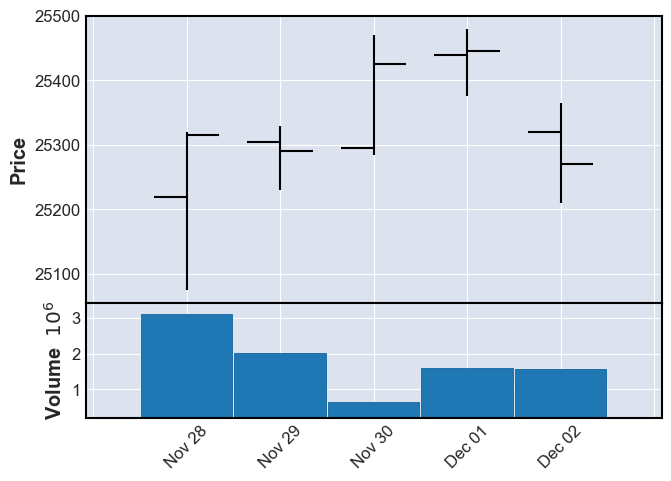

상승?0 횡보?1 하락?21
256 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-12-05  2604250  25270  25205  25140  25240  (2016, 49)
2016-12-06  5143393  25580  25405  25405  25520  (2016, 49)
2016-12-07  3212742  25640  25600  25545  25590  (2016, 49)
2016-12-08  4329693  26030  25835  25815  26000  (2016, 49)
2016-12-09  1185777  26090  26000  25985  26085  (2016, 49)


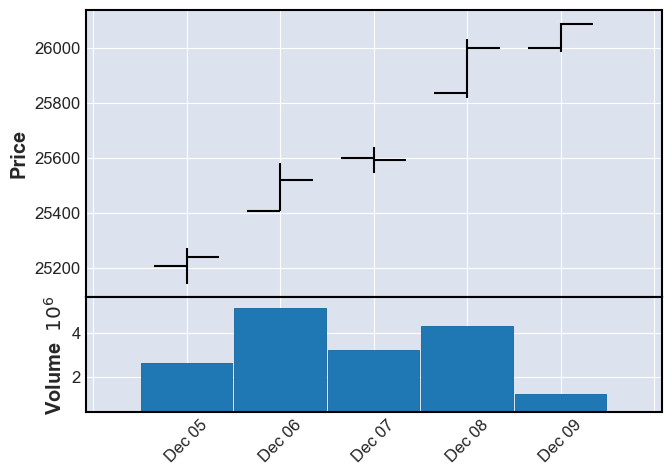

상승?0 횡보?1 하락?20
257 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-12-12  1849384  26150  26115  25965  26040  (2016, 50)
2016-12-13  3356506  26115  26040  26005  26090  (2016, 50)
2016-12-14  1473303  26270  26200  26095  26145  (2016, 50)
2016-12-15   647524  26165  25970  25930  26100  (2016, 50)
2016-12-16   551889  26195  26070  26055  26160  (2016, 50)


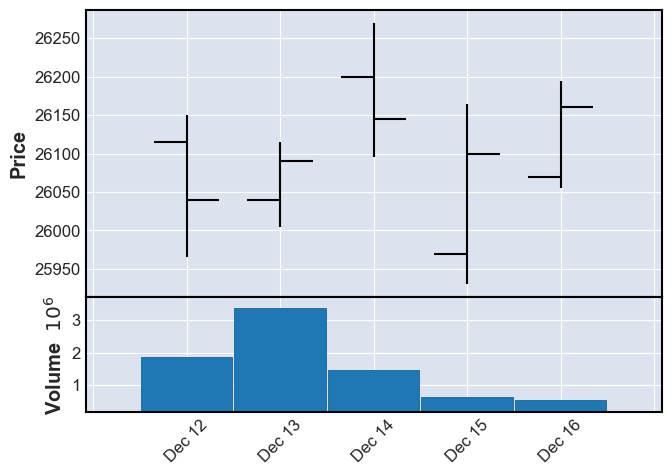

상승?0 횡보?1 하락?20
258 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-12-19   700140  26220  26090  26090  26160  (2016, 51)
2016-12-20  1636181  26275  26180  26180  26220  (2016, 51)
2016-12-21  1210913  26370  26280  26200  26210  (2016, 51)
2016-12-22   533808  26250  26235  26175  26210  (2016, 51)
2016-12-23  2750663  26205  26190  26145  26180  (2016, 51)


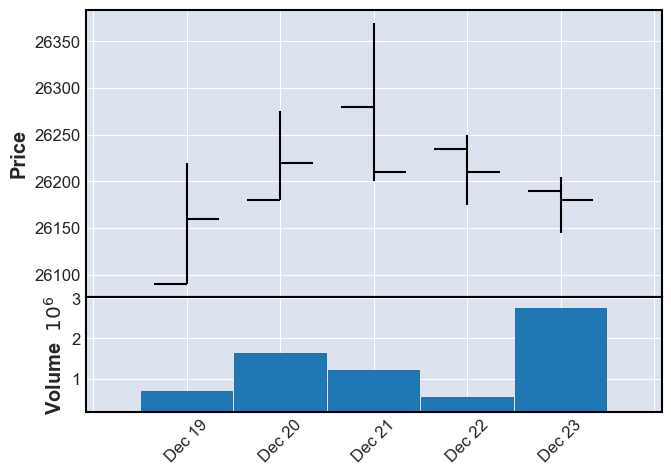

상승?0 횡보?1 하락?21
259 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2016-12-26   393291  26205  26195  26155  26200  (2016, 52)
2016-12-27   918731  26245  26215  26200  26230  (2016, 52)
2016-12-28  1068290  26395  26335  26315  26345  (2016, 52)
2016-12-29  1200647  26355  26340  26265  26340  (2016, 52)


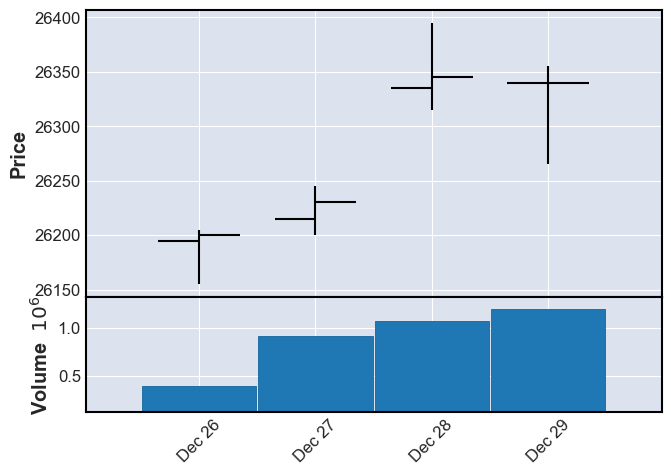

상승?0 횡보?1 하락?20
260 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-01-02   640217  26510  26340  26250  26450  (2017, 1)
2017-01-03  1852474  26660  26530  26470  26660  (2017, 1)
2017-01-04   972928  26685  26660  26615  26665  (2017, 1)
2017-01-05  1541622  26670  26660  26550  26550  (2017, 1)
2017-01-06  3040161  26735  26615  26615  26685  (2017, 1)


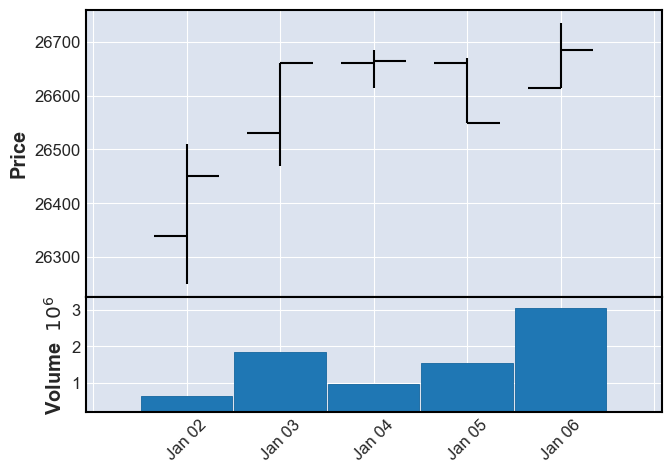

상승?0 횡보?1 하락?20
261 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-01-09   758865  26795  26705  26695  26755  (2017, 2)
2017-01-10   826520  26760  26680  26665  26700  (2017, 2)
2017-01-11  1820340  27270  26740  26740  27185  (2017, 2)
2017-01-12  4259019  27320  27235  27185  27260  (2017, 2)
2017-01-13  1911576  27265  27225  27185  27190  (2017, 2)


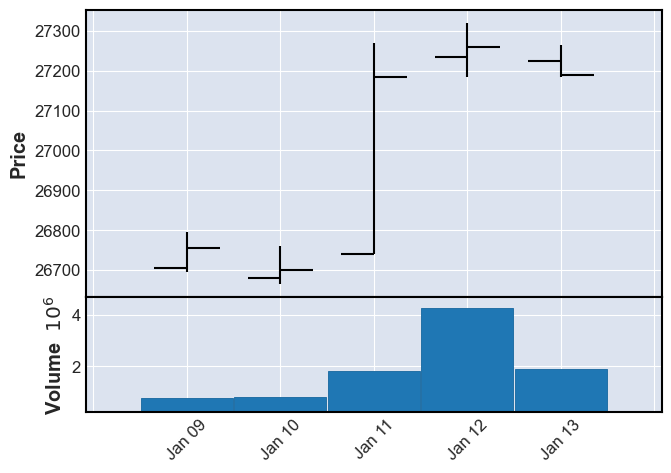

상승?0 횡보?1 하락?20
262 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-01-16  1725230  27230  27190  26970  27025  (2017, 3)
2017-01-17  1594392  27260  27070  27070  27130  (2017, 3)
2017-01-18  1012973  27210  27150  26950  27125  (2017, 3)
2017-01-19  1319789  27410  27250  27035  27165  (2017, 3)
2017-01-20   570740  27135  27065  27045  27090  (2017, 3)


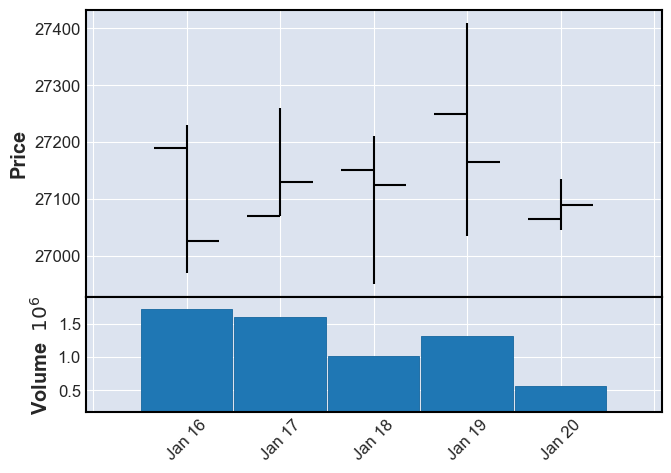

상승?0 횡보?1 하락?21
263 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-01-23   808942  27175  27075  26935  27080  (2017, 4)
2017-01-24  1773978  27215  27165  27045  27095  (2017, 4)
2017-01-25  2423907  27280  27280  27100  27205  (2017, 4)
2017-01-26  1319579  27460  27270  27205  27395  (2017, 4)


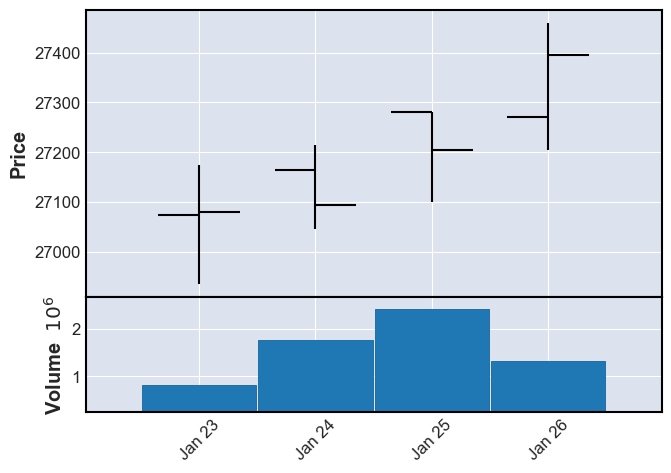

상승?0 횡보?1 하락?20
264 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-01-31  1634294  27360  27300  27225  27225  (2017, 5)
2017-02-01  1480835  27350  27320  27285  27340  (2017, 5)
2017-02-02  1408382  27480  27325  27180  27220  (2017, 5)
2017-02-03  1470656  27315  27290  27125  27255  (2017, 5)


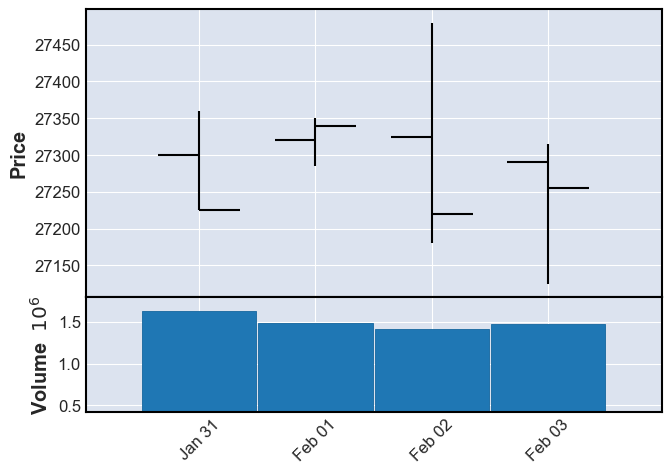

상승?0 횡보?1 하락?21
265 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-02-06   991630  27505  27470  27255  27310  (2017, 6)
2017-02-07  1173578  27355  27355  27225  27255  (2017, 6)
2017-02-08  5122452  27215  27215  26965  27150  (2017, 6)
2017-02-09  1819164  27265  27165  27100  27180  (2017, 6)
2017-02-10  1465797  27360  27310  27230  27230  (2017, 6)


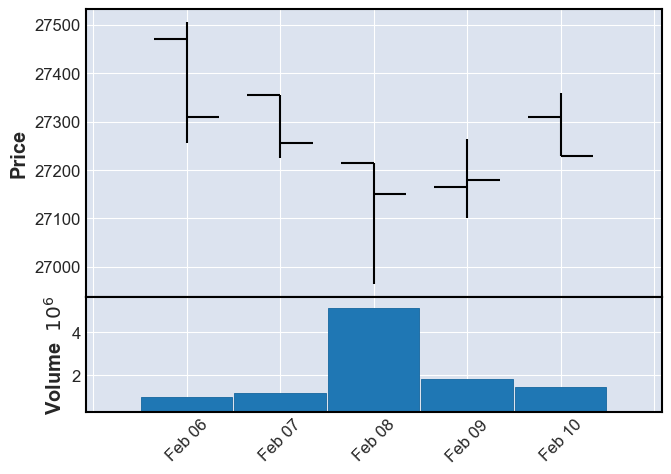

상승?0 횡보?1 하락?21
266 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-02-13  1544247  27265  27200  27195  27235  (2017, 7)
2017-02-14  1694111  27325  27325  27110  27190  (2017, 7)
2017-02-15  1220558  27310  27175  27115  27270  (2017, 7)
2017-02-16   408073  27395  27305  27215  27260  (2017, 7)
2017-02-17   919904  27275  27170  27165  27240  (2017, 7)


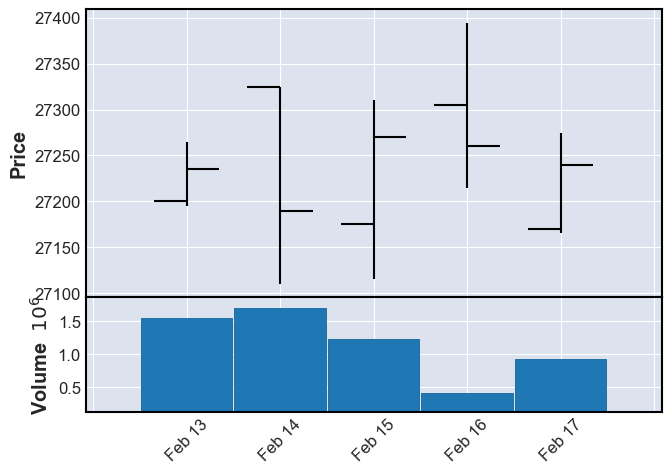

상승?0 횡보?1 하락?21
267 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-02-20   380082  27340  27295  27235  27330  (2017, 8)
2017-02-21  1761654  27720  27360  27350  27595  (2017, 8)
2017-02-22  1929608  27680  27595  27595  27650  (2017, 8)
2017-02-23  1118717  27665  27635  27595  27640  (2017, 8)
2017-02-24  3104407  27655  27625  27385  27435  (2017, 8)


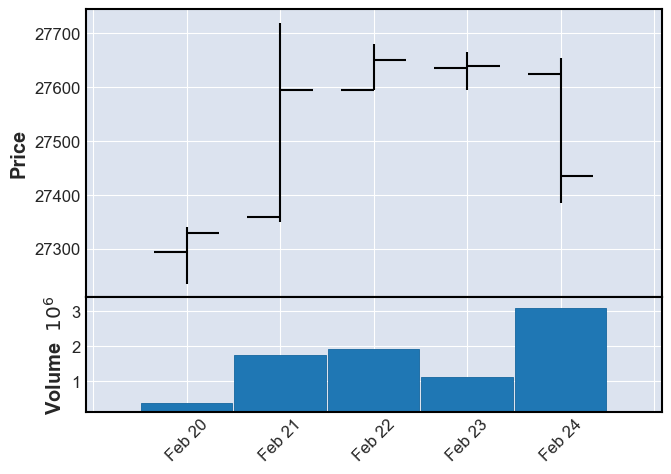

상승?0 횡보?1 하락?21
268 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2017-02-27  1070119  27465  27450  27265  27320  (2017, 9)
2017-02-28  1267594  27420  27345  27310  27370  (2017, 9)
2017-03-02  2209977  27705  27575  27510  27635  (2017, 9)
2017-03-03  3216466  27525  27495  27280  27365  (2017, 9)


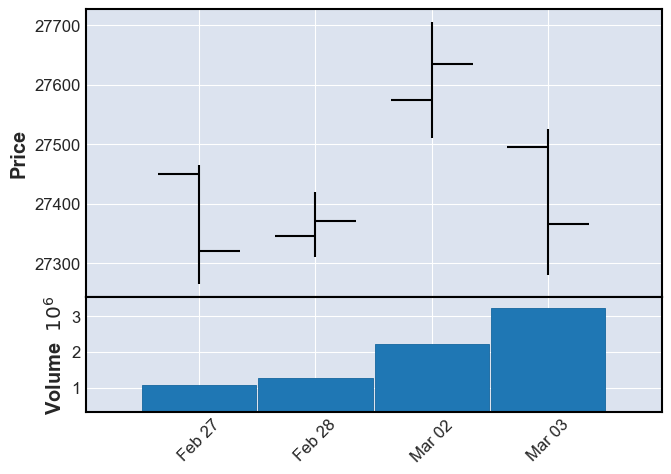

상승?0 횡보?1 하락?21
269 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-03-06  1720080  27420  27255  27220  27390  (2017, 10)
2017-03-07  2247984  27600  27430  27395  27555  (2017, 10)
2017-03-08  2721947  27680  27515  27485  27595  (2017, 10)
2017-03-09  1495438  27655  27610  27530  27530  (2017, 10)
2017-03-10  2397148  27660  27540  27405  27575  (2017, 10)


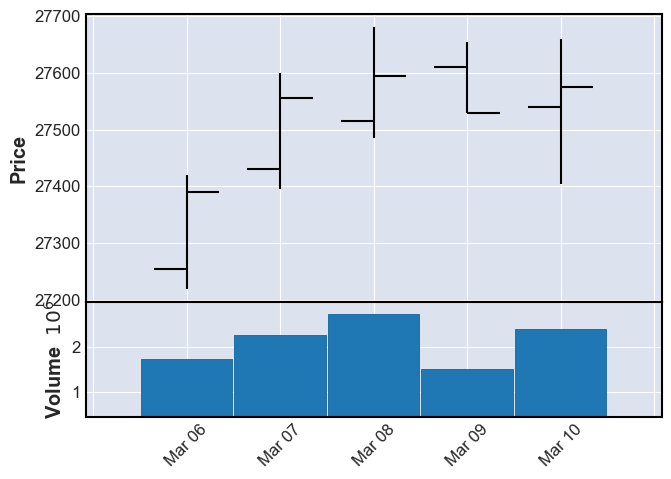

상승?0 횡보?1 하락?20
270 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-03-13  2091589  27975  27650  27630  27885  (2017, 11)
2017-03-14  4055317  28165  27990  27985  28145  (2017, 11)
2017-03-15  1289755  28200  28125  28095  28175  (2017, 11)
2017-03-16  2625256  28545  28480  28325  28375  (2017, 11)
2017-03-17  1745095  28540  28390  28360  28505  (2017, 11)


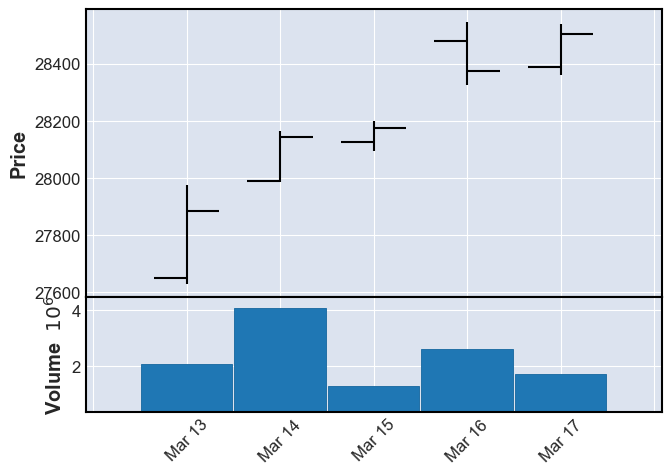

상승?0 횡보?1 하락?20
271 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-03-20   995643  28505  28505  28375  28460  (2017, 12)
2017-03-21  2706065  28815  28555  28515  28740  (2017, 12)
2017-03-22  3295741  28630  28565  28485  28630  (2017, 12)
2017-03-23  1932907  28795  28710  28635  28665  (2017, 12)
2017-03-24  1844892  28780  28690  28550  28620  (2017, 12)


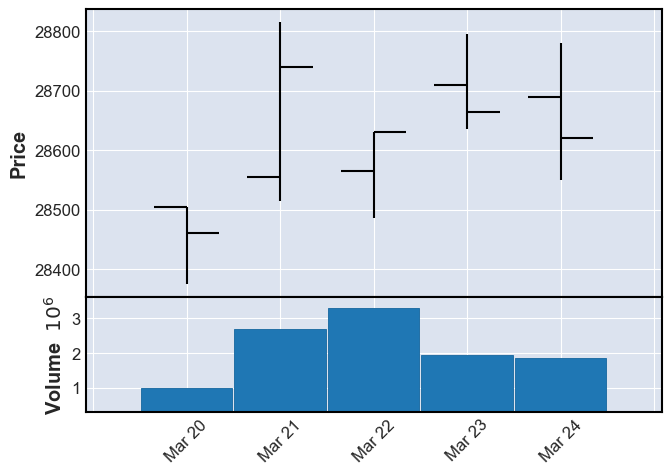

상승?0 횡보?1 하락?20
272 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-03-27  1744169  28565  28500  28395  28435  (2017, 13)
2017-03-28  2354217  28595  28565  28460  28510  (2017, 13)
2017-03-29  2309853  28625  28620  28515  28590  (2017, 13)
2017-03-30  1906247  28720  28620  28520  28575  (2017, 13)
2017-03-31  1826527  28620  28620  28505  28525  (2017, 13)


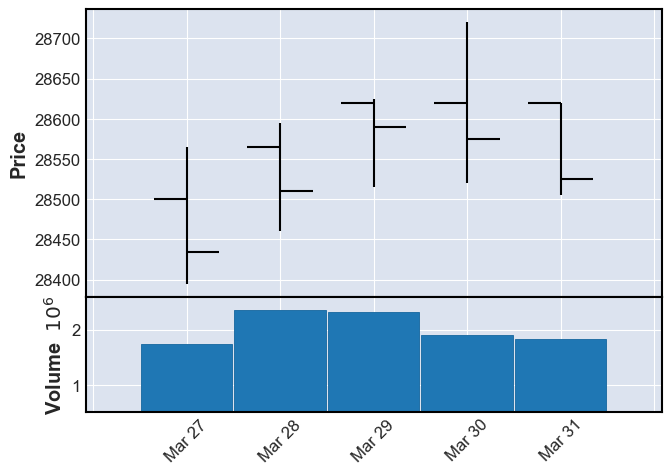

상승?0 횡보?1 하락?21
273 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-04-03  1613637  28675  28585  28530  28575  (2017, 14)
2017-04-04  1702011  28595  28555  28455  28505  (2017, 14)
2017-04-05  2499500  28540  28535  28285  28465  (2017, 14)
2017-04-06  3509033  28385  28385  28235  28355  (2017, 14)
2017-04-07  4703096  28420  28420  28200  28315  (2017, 14)


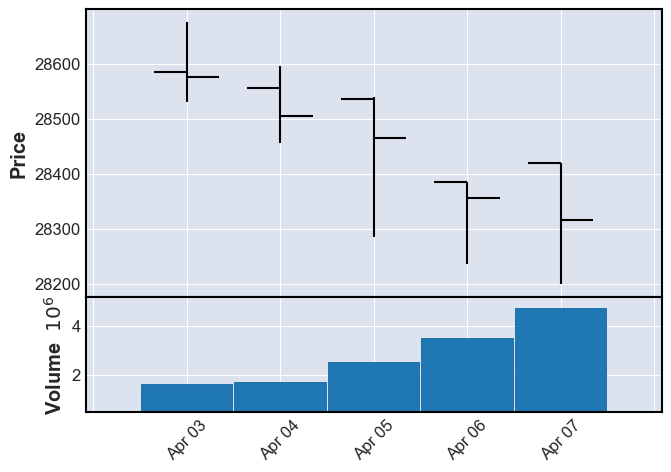

상승?0 횡보?1 하락?22
274 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-04-10  3124006  28325  28325  28095  28145  (2017, 15)
2017-04-11  1401304  28160  28100  27940  28035  (2017, 15)
2017-04-12   971196  28070  28060  27980  28045  (2017, 15)
2017-04-13   939652  28310  28085  28030  28310  (2017, 15)
2017-04-14  1469100  28245  28240  28020  28190  (2017, 15)


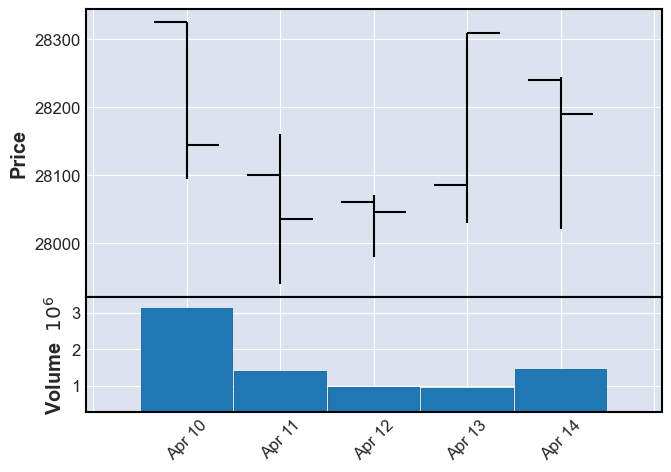

상승?0 횡보?1 하락?21
275 done
              Volume   High   Open    Low  Close         ynw
tdate                                                       
2017-04-17   1332787  28345  28195  28190  28255  (2017, 16)
2017-04-18    846884  28380  28375  28155  28240  (2017, 16)
2017-04-19  12837960  28250  28190  28025  28115  (2017, 16)
2017-04-20   6394001  28240  28040  28000  28225  (2017, 16)
2017-04-21   3525885  28520  28345  28310  28470  (2017, 16)


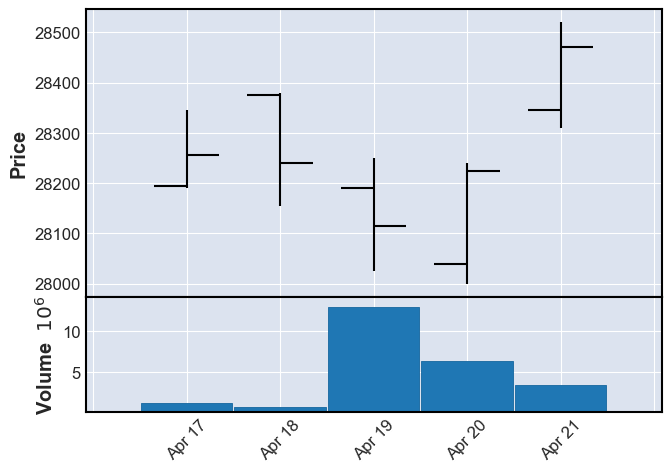

상승?0 횡보?1 하락?20
276 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-04-24  1246030  28655  28605  28535  28600  (2017, 17)
2017-04-25  2509419  28930  28640  28625  28905  (2017, 17)
2017-04-26  4102172  29135  29020  28985  29065  (2017, 17)
2017-04-27  3331065  29420  28630  28565  28690  (2017, 17)
2017-04-28  1836172  28855  28690  28690  28725  (2017, 17)


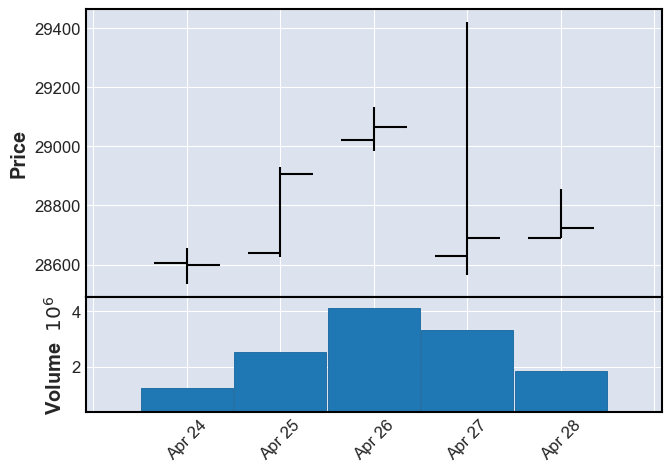

상승?0 횡보?1 하락?21
277 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-05-02  3906668  29130  28860  28825  28960  (2017, 18)
2017-05-04  3234653  29255  29070  29065  29255  (2017, 18)


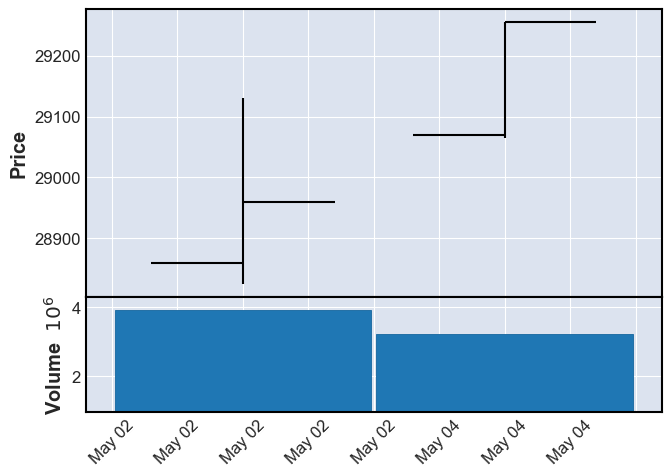

상승?0 횡보?1 하락?20
278 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-05-08  3355984  30010  29330  29290  30010  (2017, 19)
2017-05-10  3142396  30535  30080  29610  29685  (2017, 19)
2017-05-11  1853268  30095  29860  29730  30010  (2017, 19)
2017-05-12  2913263  30070  30070  29860  29885  (2017, 19)


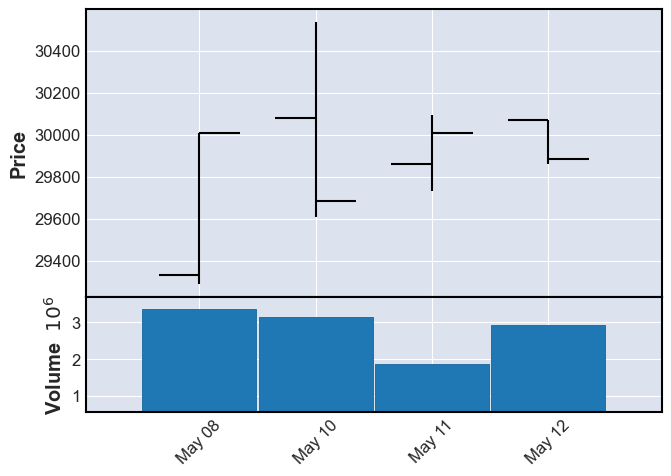

상승?0 횡보?1 하락?21
279 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-05-15  2621887  30070  29930  29840  29980  (2017, 20)
2017-05-16  5259526  30250  30180  29885  30015  (2017, 20)
2017-05-17  3168381  30065  29925  29875  30005  (2017, 20)
2017-05-18  3273820  29945  29710  29645  29940  (2017, 20)
2017-05-19  3176593  29975  29910  29850  29885  (2017, 20)


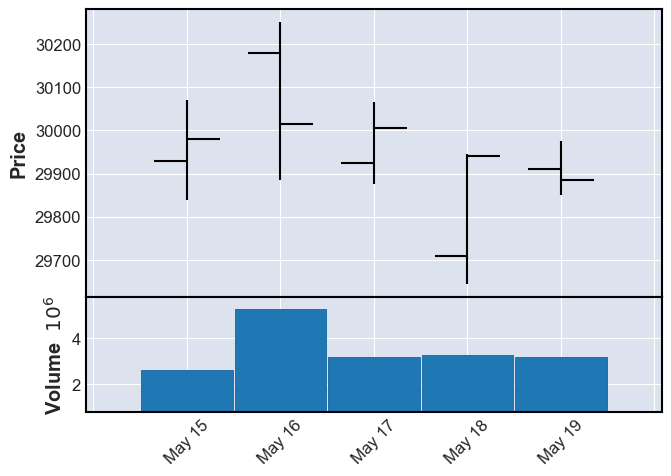

상승?0 횡보?1 하락?21
280 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-05-22  4789531  30140  30080  29965  30125  (2017, 21)
2017-05-23  4084788  30445  30195  30135  30220  (2017, 21)
2017-05-24  3245199  30350  30285  30210  30260  (2017, 21)
2017-05-25  2593709  30620  30405  30310  30590  (2017, 21)
2017-05-26  3221269  30935  30640  30590  30775  (2017, 21)


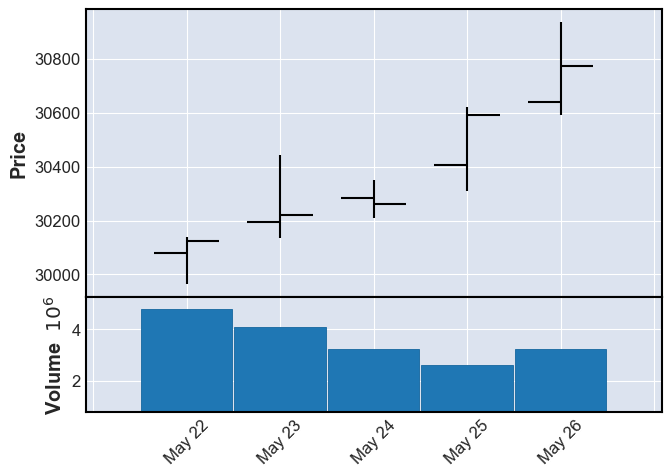

상승?0 횡보?1 하락?20
281 done
              Volume   High   Open    Low  Close         ynw
tdate                                                       
2017-05-29  12677608  31005  30905  30585  30750  (2017, 22)
2017-05-30   4838791  30765  30725  30390  30545  (2017, 22)
2017-05-31   4328933  30695  30470  30445  30545  (2017, 22)
2017-06-01   3670916  30600  30540  30385  30480  (2017, 22)
2017-06-02   3971239  30875  30575  30575  30860  (2017, 22)


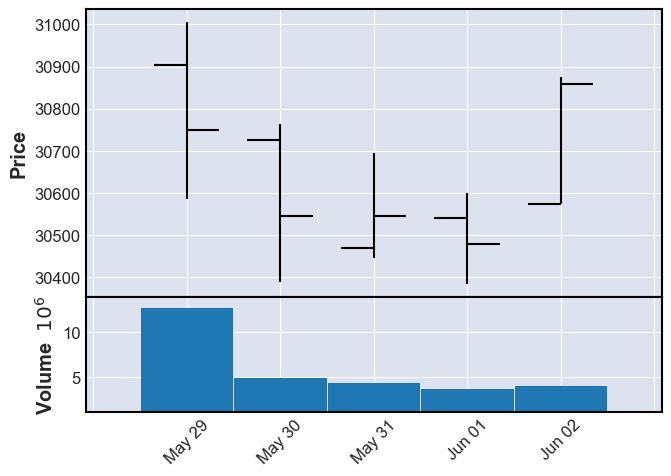

상승?0 횡보?1 하락?21
282 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-06-05  4845698  30930  30900  30765  30825  (2017, 23)
2017-06-07  4180729  30835  30780  30635  30635  (2017, 23)
2017-06-08  1933792  30775  30525  30465  30775  (2017, 23)
2017-06-09  2025873  31075  30790  30780  31015  (2017, 23)


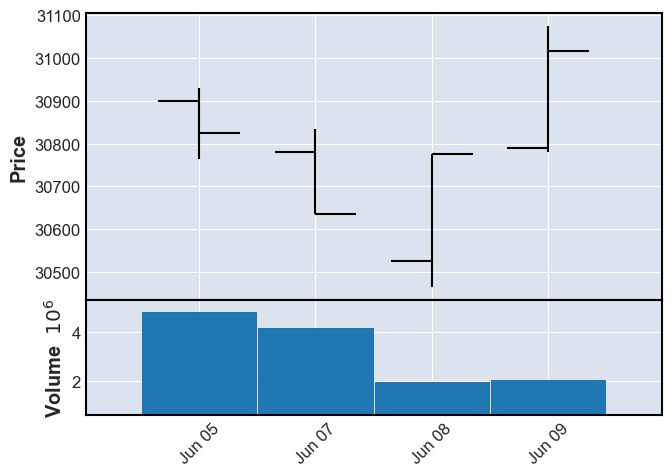

상승?0 횡보?1 하락?20
283 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-06-12  2277067  30890  30825  30655  30705  (2017, 24)
2017-06-13  3022352  30905  30705  30705  30885  (2017, 24)
2017-06-14  2536466  31080  30995  30795  30870  (2017, 24)
2017-06-15  2058837  30950  30830  30580  30740  (2017, 24)
2017-06-16  2238311  30810  30740  30680  30755  (2017, 24)


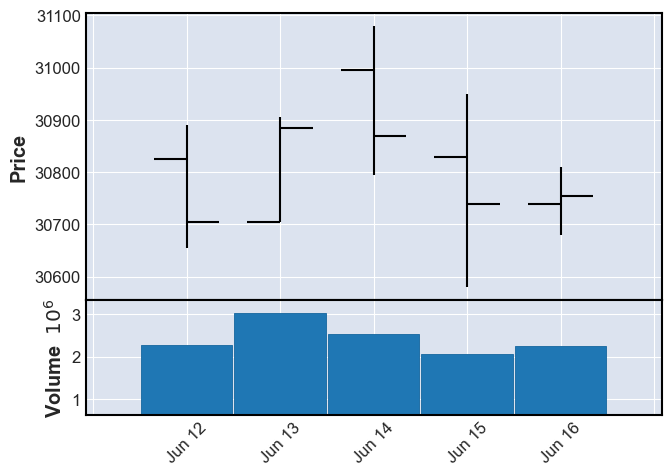

상승?0 횡보?1 하락?21
284 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-06-19  3062088  31000  30750  30690  30925  (2017, 25)
2017-06-20  2909185  31100  31090  30950  31005  (2017, 25)
2017-06-21  2807437  30880  30855  30705  30815  (2017, 25)
2017-06-22  3533547  31025  30890  30820  31025  (2017, 25)
2017-06-23  1983129  31140  31025  30985  31095  (2017, 25)


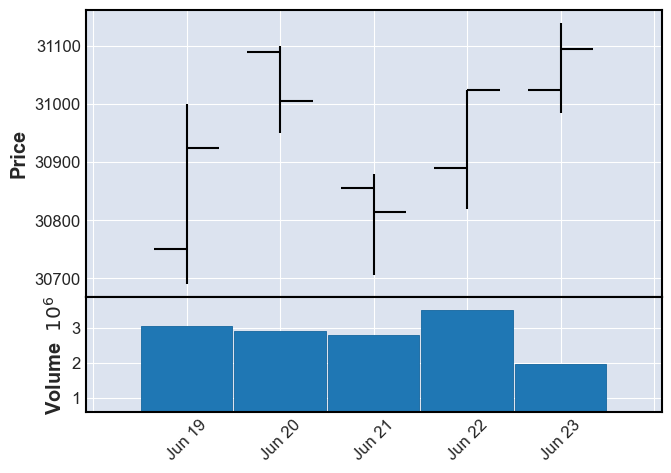

상승?0 횡보?1 하락?20
285 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-06-26  3850390  31300  31110  31110  31265  (2017, 26)
2017-06-27  2030995  31370  31210  31190  31285  (2017, 26)
2017-06-28  4780441  31275  31150  31130  31190  (2017, 26)
2017-06-29  2213875  31490  31345  31345  31390  (2017, 26)
2017-06-30  3818195  31305  31190  31160  31305  (2017, 26)


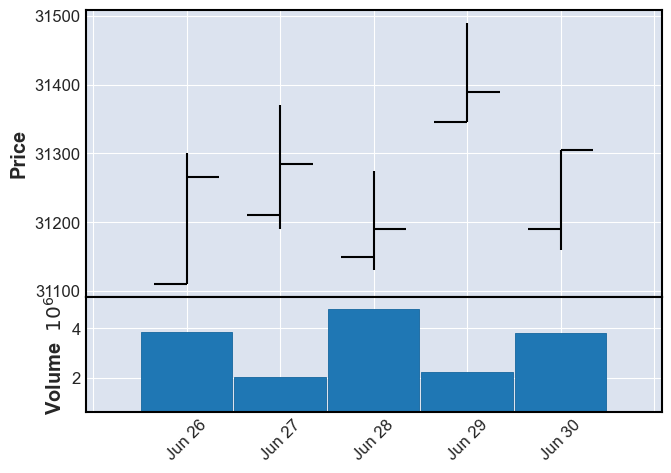

상승?0 횡보?1 하락?21
286 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-07-03  2525774  31400  31375  31230  31360  (2017, 27)
2017-07-04  3637074  31400  31375  31140  31180  (2017, 27)
2017-07-05  1846124  31325  31120  31090  31290  (2017, 27)
2017-07-06  1974616  31365  31355  31210  31310  (2017, 27)
2017-07-07   515632  31255  31180  31085  31175  (2017, 27)


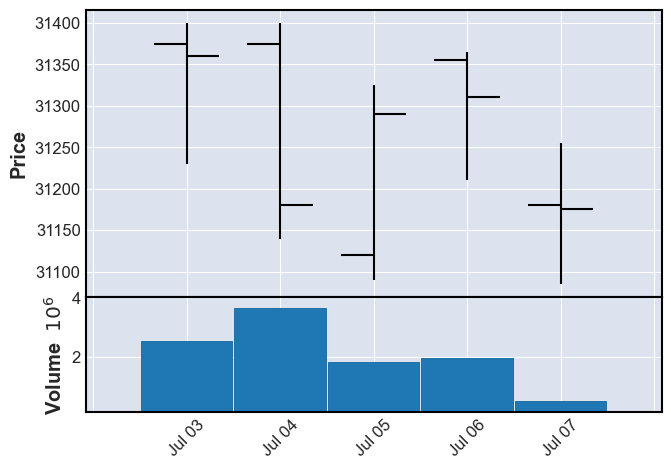

상승?0 횡보?1 하락?22
287 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-07-10   487843  31370  31275  31200  31260  (2017, 28)
2017-07-11  1029285  31480  31310  31280  31475  (2017, 28)
2017-07-12  1663070  31530  31460  31430  31470  (2017, 28)
2017-07-13  1915444  31950  31630  31620  31820  (2017, 28)
2017-07-14  1176174  31925  31850  31810  31835  (2017, 28)


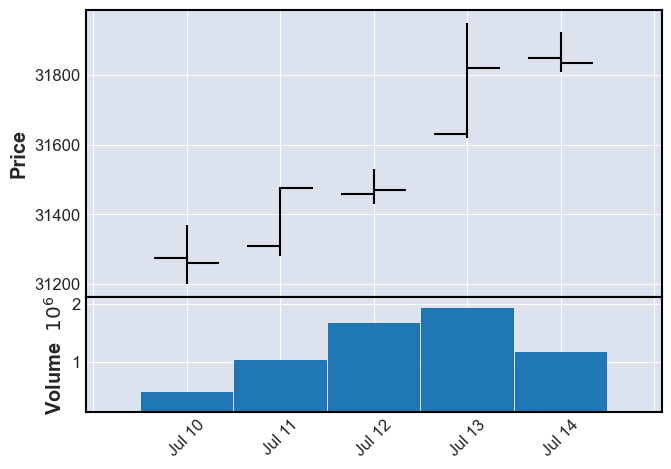

상승?0 횡보?1 하락?20
288 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-07-17   665603  32065  32040  31910  31960  (2017, 29)
2017-07-18   625427  31980  31960  31895  31980  (2017, 29)
2017-07-19   560281  32030  32020  31885  32005  (2017, 29)
2017-07-20   995553  32205  32075  32005  32165  (2017, 29)
2017-07-21  1602076  32315  32130  32125  32290  (2017, 29)


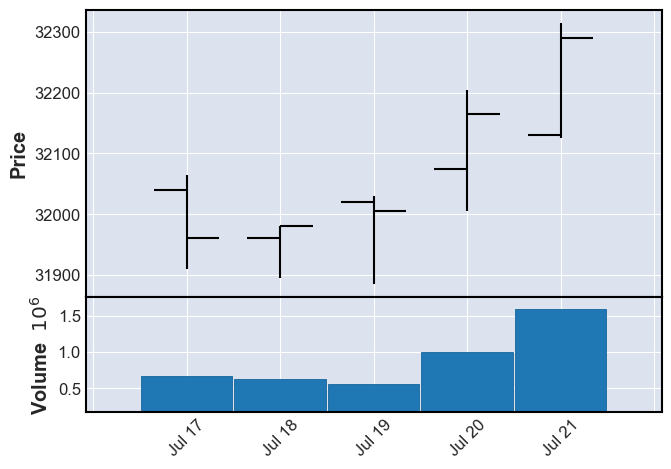

상승?0 횡보?1 하락?20
289 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-07-24   775035  32320  32320  32215  32295  (2017, 30)
2017-07-25   997992  32320  32295  32120  32150  (2017, 30)
2017-07-26  3526484  32200  32175  31995  32070  (2017, 30)
2017-07-27   621958  32255  32160  32085  32155  (2017, 30)
2017-07-28  1866380  32000  31975  31455  31480  (2017, 30)


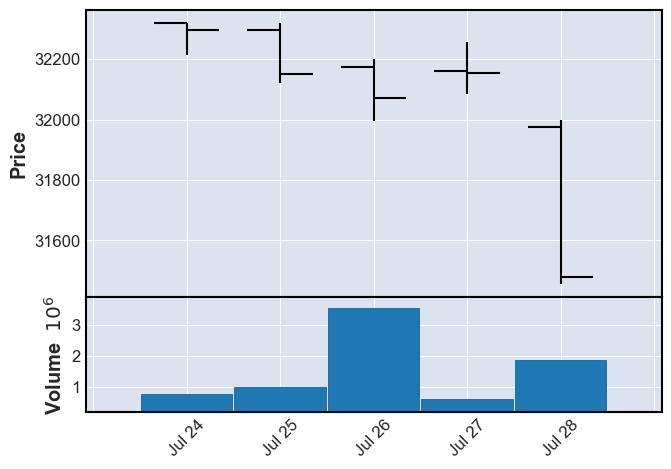

상승?0 횡보?1 하락?22
290 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-07-31   869069  31530  31340  31330  31490  (2017, 31)
2017-08-01  2135865  31920  31390  31380  31770  (2017, 31)
2017-08-02  1242778  31930  31860  31800  31835  (2017, 31)
2017-08-03  3668473  31760  31760  31085  31290  (2017, 31)
2017-08-04   734489  31485  31350  31260  31430  (2017, 31)


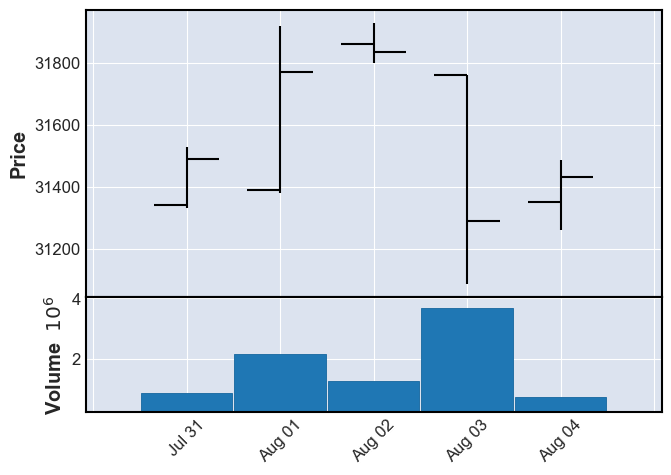

상승?0 횡보?1 하락?21
291 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-08-07  1339919  31625  31465  31410  31460  (2017, 32)
2017-08-08  1648851  31615  31545  31240  31390  (2017, 32)
2017-08-09  2504464  31260  31190  30980  31020  (2017, 32)
2017-08-10  1963595  31040  30920  30645  30855  (2017, 32)
2017-08-11  2090718  30550  30435  30240  30315  (2017, 32)


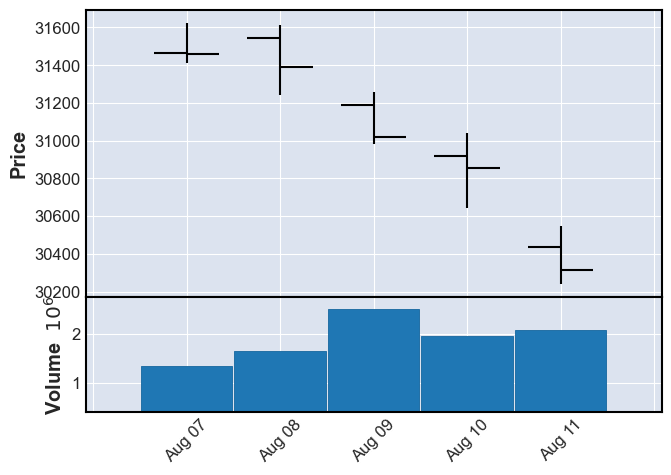

상승?0 횡보?1 하락?22
292 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-08-14  1021770  30630  30540  30450  30565  (2017, 33)
2017-08-16   811087  30920  30875  30725  30770  (2017, 33)
2017-08-17  3020340  31005  30835  30760  30960  (2017, 33)
2017-08-18  1664579  30950  30705  30675  30910  (2017, 33)


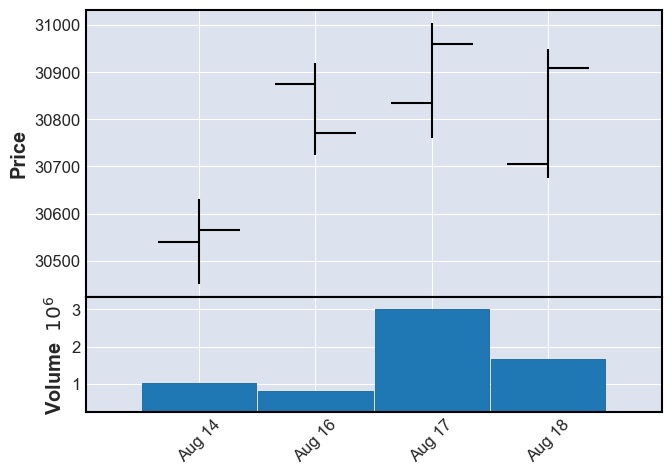

상승?0 횡보?1 하락?20
293 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-08-21  1235296  30990  30985  30815  30880  (2017, 34)
2017-08-22  1178792  31055  30940  30935  31000  (2017, 34)
2017-08-23  2917209  31185  31175  30955  31025  (2017, 34)
2017-08-24  1214583  31230  31030  31030  31145  (2017, 34)
2017-08-25  1275786  31280  31225  31105  31175  (2017, 34)


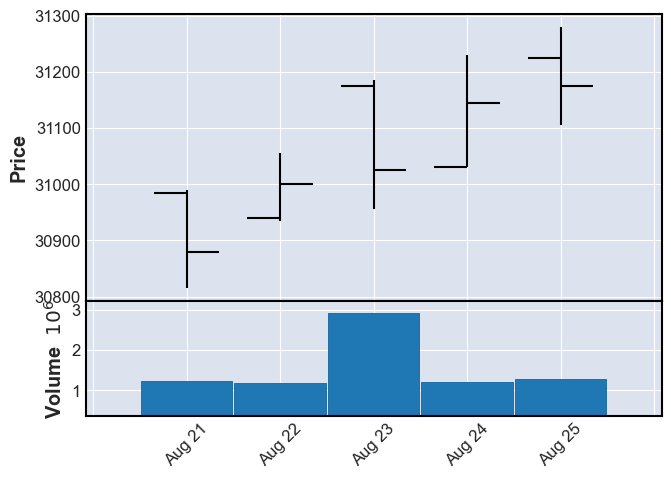

상승?0 횡보?1 하락?20
294 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-08-28   936971  31235  31155  30965  31000  (2017, 35)
2017-08-29  3738571  30915  30825  30480  30915  (2017, 35)
2017-08-30  1068992  31065  31065  30895  31030  (2017, 35)
2017-08-31  1042849  31075  31040  30785  30840  (2017, 35)
2017-09-01  1960362  30980  30935  30725  30825  (2017, 35)


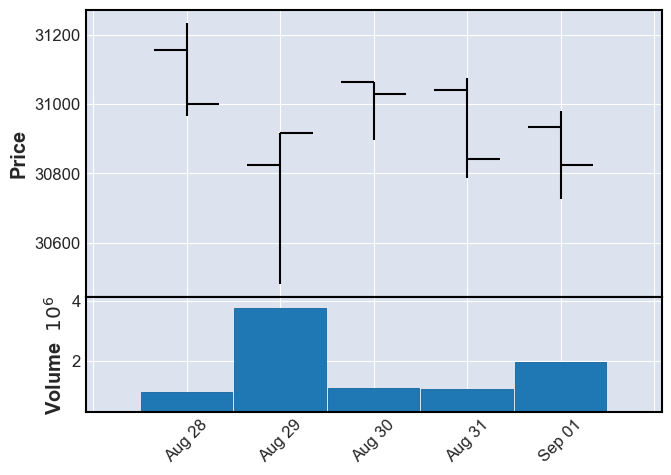

상승?0 횡보?1 하락?22
295 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-09-04  1475731  30695  30375  30375  30500  (2017, 36)
2017-09-05  1074591  30610  30605  30390  30470  (2017, 36)
2017-09-06  6938078  30450  30425  30310  30400  (2017, 36)
2017-09-07  1861989  30800  30495  30470  30775  (2017, 36)
2017-09-08   980281  30850  30825  30730  30795  (2017, 36)


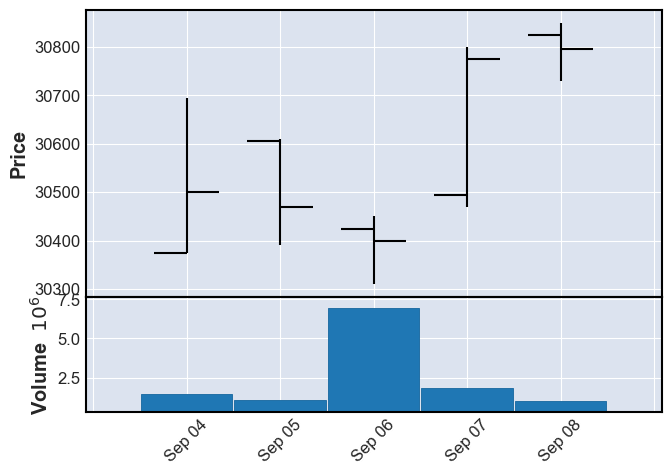

상승?0 횡보?1 하락?20
296 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-09-11   916019  31185  30955  30955  31095  (2017, 37)
2017-09-12  1229185  31220  31215  31035  31095  (2017, 37)
2017-09-13   469968  31280  31150  31035  31070  (2017, 37)
2017-09-14   959793  31405  31120  31050  31405  (2017, 37)
2017-09-15  1437701  31415  31315  31155  31415  (2017, 37)


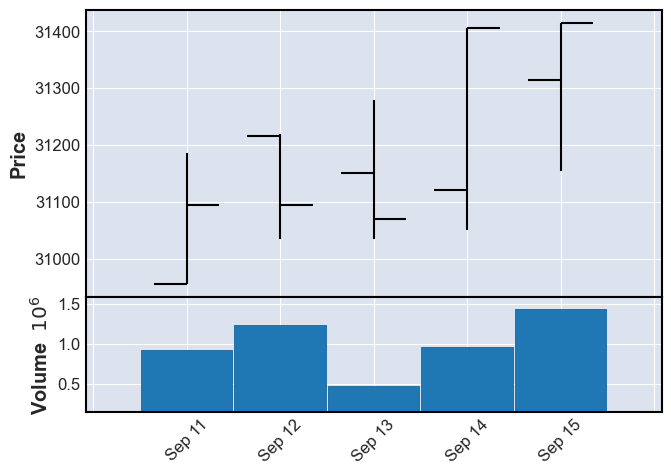

상승?0 횡보?1 하락?20
297 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-09-18  1990319  31940  31465  31455  31940  (2017, 38)
2017-09-19  1324760  31970  31935  31880  31885  (2017, 38)
2017-09-20  2263442  32115  31960  31780  31885  (2017, 38)
2017-09-21  2565477  31965  31850  31815  31910  (2017, 38)
2017-09-22  3385449  31975  31855  31615  31710  (2017, 38)


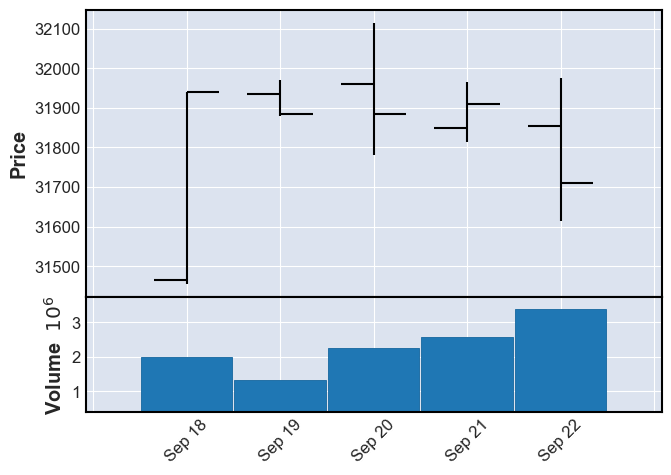

상승?0 횡보?1 하락?22
298 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-09-25  1114129  31770  31725  31600  31680  (2017, 39)
2017-09-26   872329  31630  31570  31455  31515  (2017, 39)
2017-09-27  1519286  31515  31515  31410  31440  (2017, 39)
2017-09-28  4829447  32075  31480  31390  31495  (2017, 39)
2017-09-29  1476221  31740  31515  31515  31740  (2017, 39)


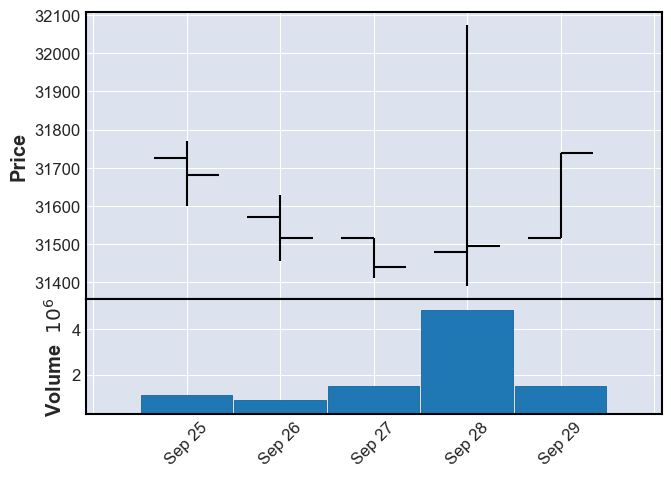

상승?0 횡보?1 하락?21
299 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-10-10  3545467  32480  32250  32145  32300  (2017, 41)
2017-10-11  2761260  32665  32425  32415  32625  (2017, 41)
2017-10-12  2962128  32870  32670  32670  32840  (2017, 41)
2017-10-13  2390520  32920  32835  32780  32820  (2017, 41)


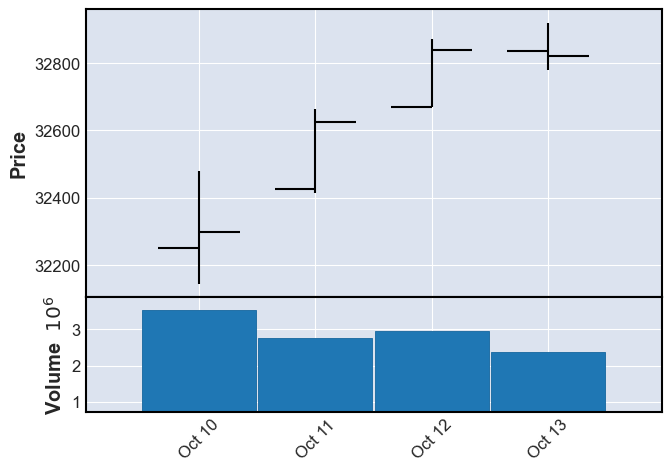

상승?0 횡보?1 하락?20
300 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-10-16  1096323  33005  32890  32800  32860  (2017, 42)
2017-10-17   827083  32970  32870  32855  32930  (2017, 42)
2017-10-18  1343710  32995  32875  32815  32910  (2017, 42)
2017-10-19   766303  33010  32990  32710  32750  (2017, 42)
2017-10-20   731142  32955  32770  32770  32955  (2017, 42)


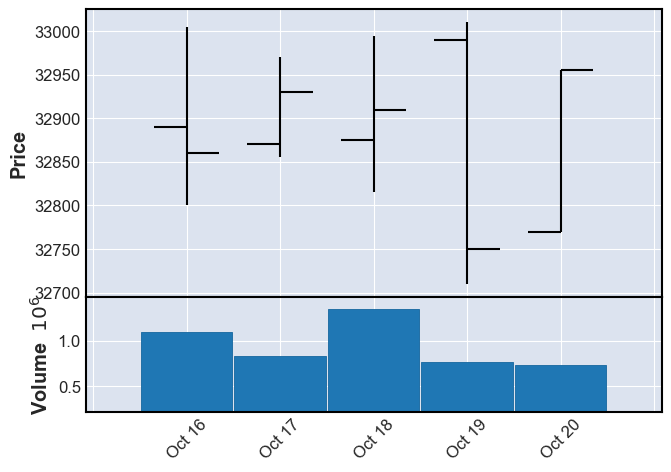

상승?0 횡보?1 하락?21
301 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-10-23  2163966  33110  33075  32945  33050  (2017, 43)
2017-10-24  1730534  33085  33040  33000  33000  (2017, 43)
2017-10-25  1840061  33090  33015  32890  33035  (2017, 43)
2017-10-26   911503  33040  33020  32790  32790  (2017, 43)
2017-10-27  1623727  33055  32815  32770  33010  (2017, 43)


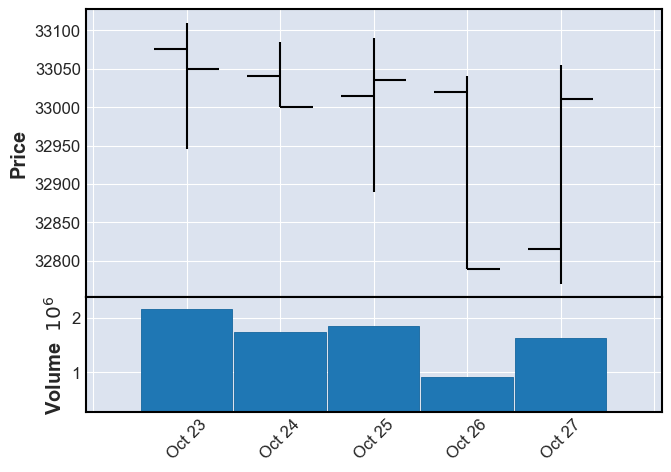

상승?0 횡보?1 하락?21
302 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-10-30   955089  33180  33160  33030  33075  (2017, 44)
2017-10-31  2769356  33485  33065  33025  33430  (2017, 44)
2017-11-01  4092408  33930  33695  33600  33930  (2017, 44)
2017-11-02  1211979  33985  33965  33760  33845  (2017, 44)
2017-11-03  1091571  33985  33950  33675  33930  (2017, 44)


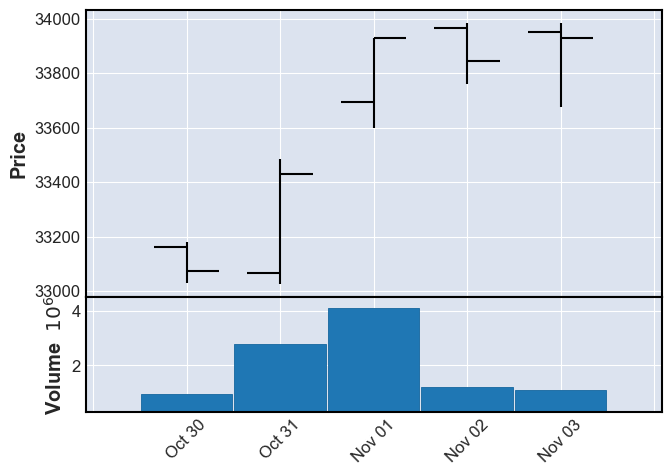

상승?0 횡보?1 하락?20
303 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-11-06  2152691  33945  33890  33515  33780  (2017, 45)
2017-11-07  1304494  33890  33780  33685  33725  (2017, 45)
2017-11-08  3996051  33960  33580  33550  33865  (2017, 45)
2017-11-09  2710937  33930  33915  33570  33770  (2017, 45)
2017-11-10  1161483  33725  33555  33530  33660  (2017, 45)


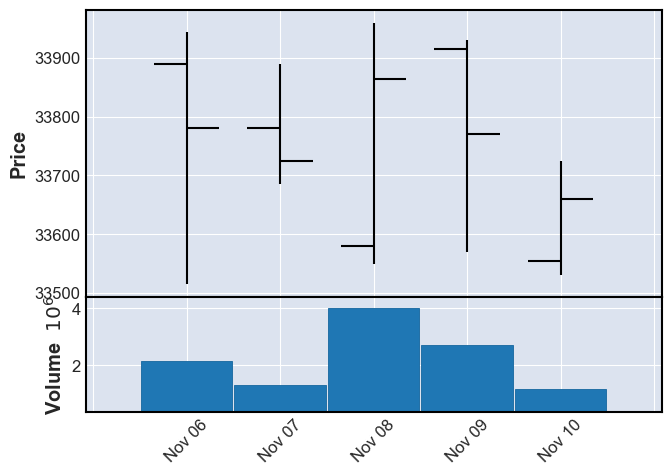

상승?0 횡보?1 하락?22
304 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-11-13   805595  33790  33675  33450  33490  (2017, 46)
2017-11-14   683715  33530  33500  33395  33460  (2017, 46)
2017-11-15  1479192  33420  33405  33210  33270  (2017, 46)
2017-11-16   489411  33525  33320  33255  33485  (2017, 46)
2017-11-17  3728091  33855  33615  33475  33475  (2017, 46)


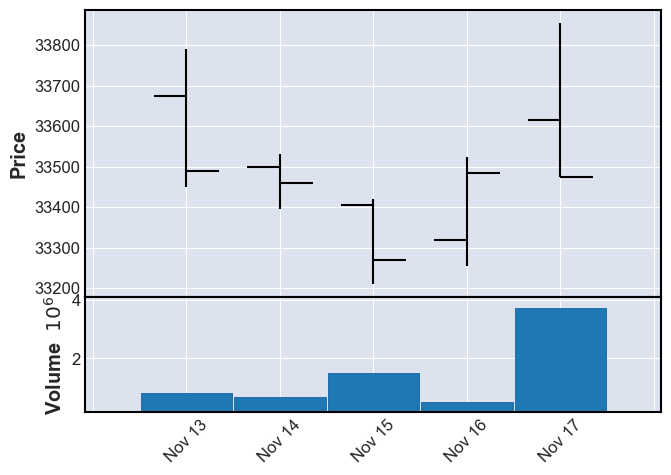

상승?0 횡보?1 하락?21
305 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-11-20  3330764  33570  33515  33280  33320  (2017, 47)
2017-11-21  1074293  33540  33440  33340  33395  (2017, 47)
2017-11-22  5493256  33765  33610  33515  33600  (2017, 47)
2017-11-23  2370807  33645  33635  33480  33545  (2017, 47)
2017-11-24  1054729  33600  33535  33440  33600  (2017, 47)


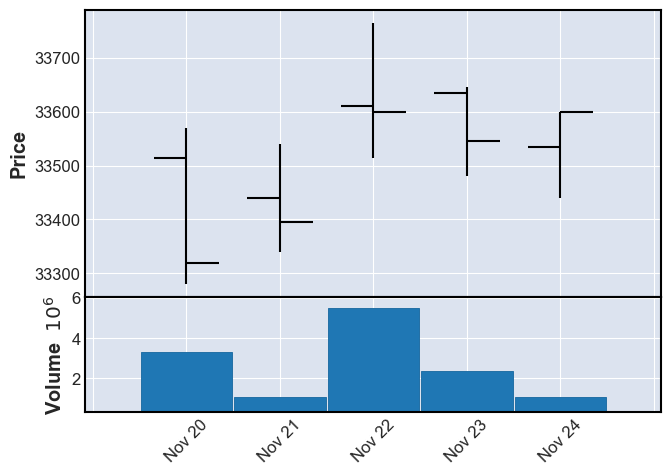

상승?0 횡보?1 하락?20
306 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-11-27  1313949  33630  33615  33010  33040  (2017, 48)
2017-11-28  1571289  33210  33030  32940  33140  (2017, 48)
2017-11-29   503459  33290  33180  33080  33125  (2017, 48)
2017-11-30  1320069  33015  32900  32540  32540  (2017, 48)
2017-12-01  1026819  32750  32750  32505  32565  (2017, 48)


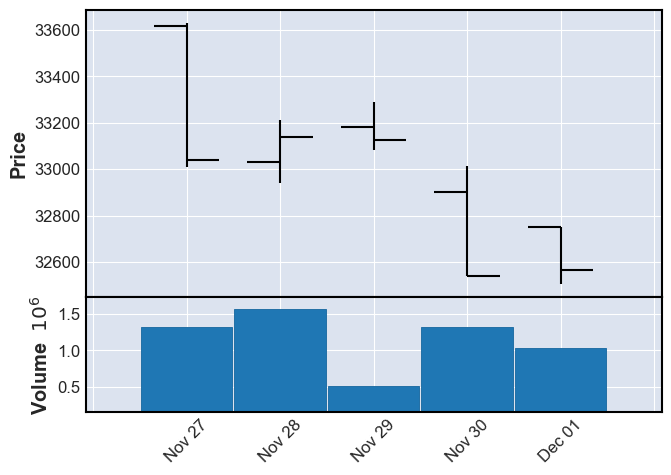

상승?0 횡보?1 하락?22
307 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-12-04  1190973  32900  32710  32555  32900  (2017, 49)
2017-12-05  2373851  33080  32735  32680  33010  (2017, 49)
2017-12-06  1309456  33010  33005  32530  32530  (2017, 49)
2017-12-07  1031120  32625  32610  32310  32425  (2017, 49)
2017-12-08   834611  32610  32585  32410  32515  (2017, 49)


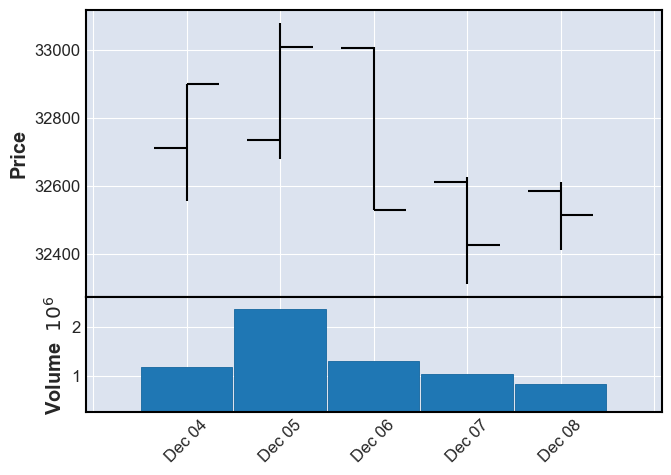

상승?0 횡보?1 하락?22
308 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-12-11  2451443  32590  32555  32410  32555  (2017, 50)
2017-12-12  4493567  32560  32550  32390  32460  (2017, 50)
2017-12-13  4610354  32735  32495  32410  32685  (2017, 50)
2017-12-14  3032709  33180  32795  32655  32655  (2017, 50)
2017-12-15  1582245  32925  32890  32630  32695  (2017, 50)


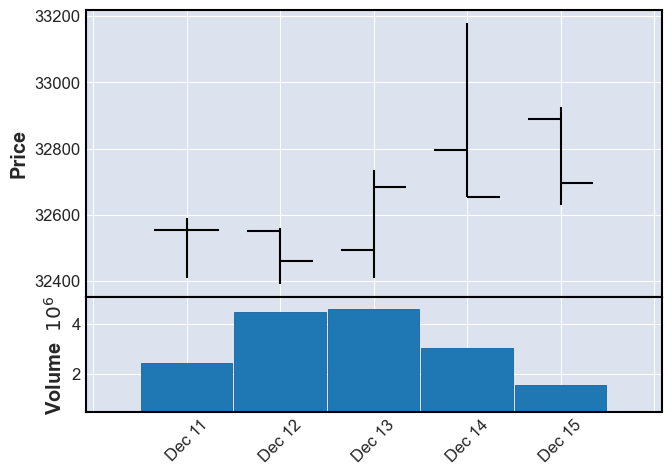

상승?0 횡보?1 하락?21
309 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-12-18  1478233  32795  32740  32660  32735  (2017, 51)
2017-12-19   830607  33015  32840  32670  32755  (2017, 51)
2017-12-20  1964666  32825  32685  32655  32670  (2017, 51)
2017-12-21  2705792  32640  32630  32050  32050  (2017, 51)
2017-12-22  2647339  32265  32125  32035  32185  (2017, 51)


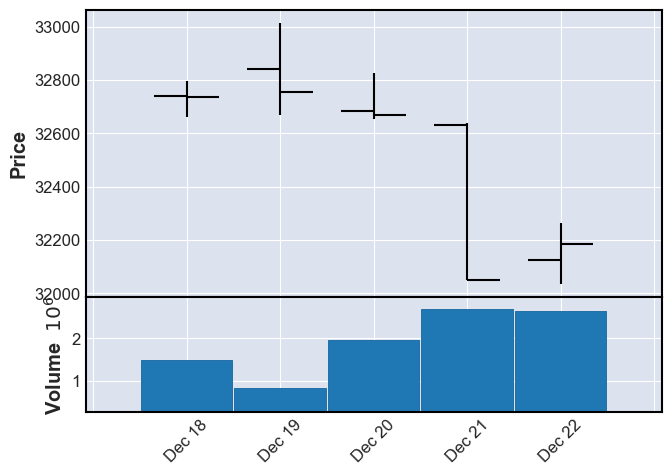

상승?0 횡보?1 하락?22
310 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2017-12-26  3784216  32460  32260  32020  32020  (2017, 52)
2017-12-27  2066690  32405  32120  32100  32405  (2017, 52)
2017-12-28  1937890  32855  32415  32415  32855  (2017, 52)


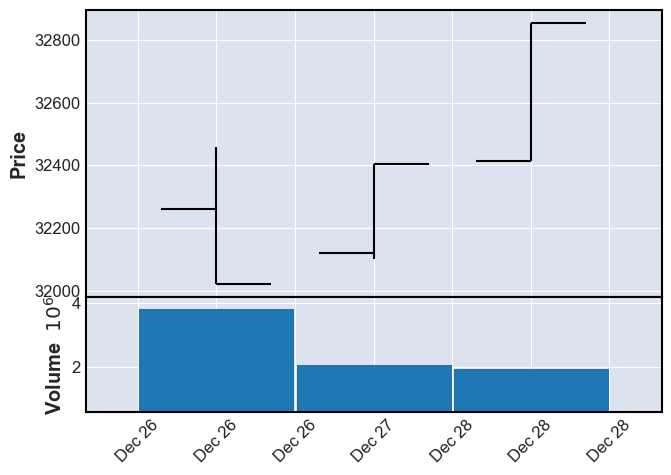

상승?0 횡보?1 하락?20
311 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-01-02   955381  33055  32930  32860  32995  (2018, 1)
2018-01-03  2477620  33220  33155  33045  33130  (2018, 1)
2018-01-04  1864927  33340  33330  32855  32880  (2018, 1)
2018-01-05  1156308  33285  32955  32955  33285  (2018, 1)


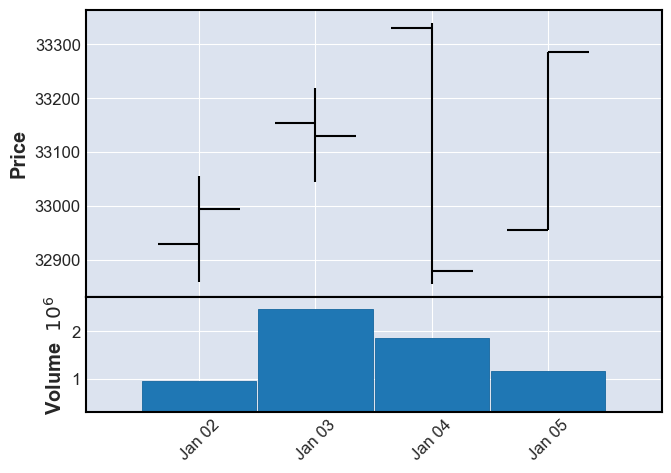

상승?0 횡보?1 하락?20
312 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-01-08   702731  33580  33390  33250  33510  (2018, 2)
2018-01-09  1375380  33675  33510  33270  33395  (2018, 2)
2018-01-10  1829313  33495  33495  33130  33185  (2018, 2)
2018-01-11  1008139  33210  33185  32945  33015  (2018, 2)
2018-01-12  4822536  33190  33190  32850  33085  (2018, 2)


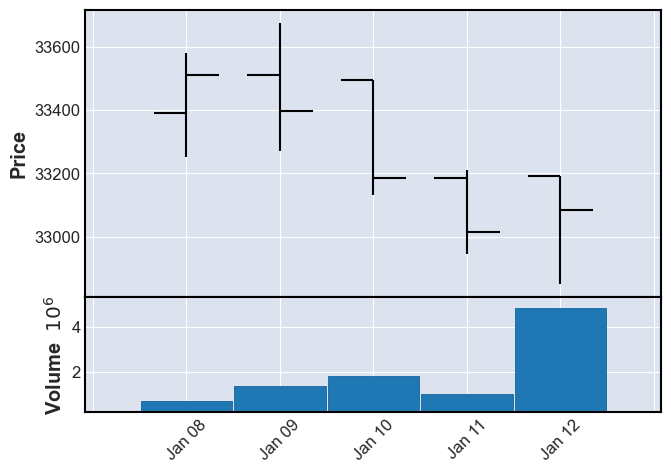

상승?0 횡보?1 하락?22
313 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-01-15   661636  33320  33250  33055  33165  (2018, 3)
2018-01-16   873647  33460  33145  33080  33420  (2018, 3)
2018-01-17  1301467  33415  33355  33235  33325  (2018, 3)
2018-01-18   992067  33610  33500  33290  33325  (2018, 3)
2018-01-19  1232934  33455  33360  33305  33340  (2018, 3)


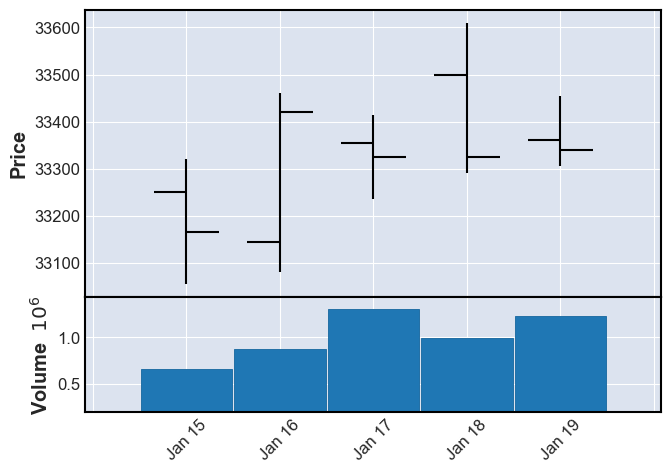

상승?0 횡보?1 하락?20
314 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-01-22  1451707  33345  33345  32890  33030  (2018, 4)
2018-01-23  3779132  33475  33180  33140  33475  (2018, 4)
2018-01-24  1726231  33660  33425  33425  33510  (2018, 4)
2018-01-25  4573601  33850  33445  33440  33795  (2018, 4)
2018-01-26  1463274  33925  33805  33710  33925  (2018, 4)


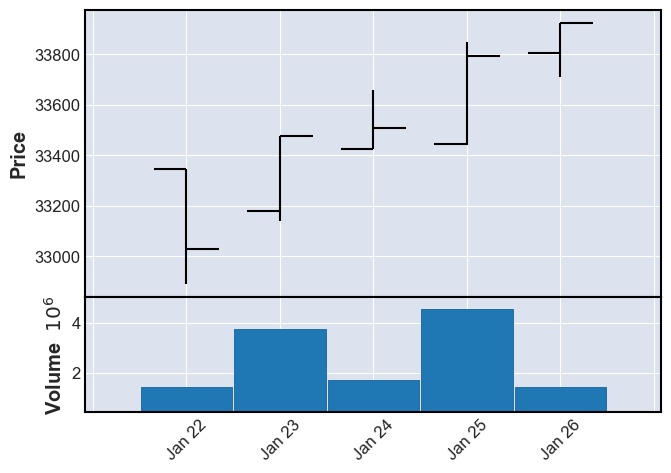

상승?0 횡보?1 하락?20
315 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-01-29  3994345  34335  34100  34100  34170  (2018, 5)
2018-01-30  2209666  34145  34105  33695  33695  (2018, 5)
2018-01-31  9704311  34205  33555  33555  33695  (2018, 5)
2018-02-01  2056179  33915  33830  33640  33700  (2018, 5)
2018-02-02  7485589  33655  33650  33015  33070  (2018, 5)


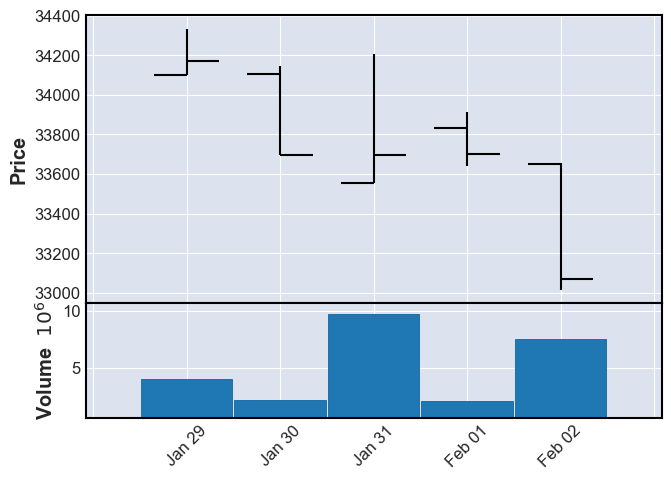

상승?0 횡보?1 하락?22
316 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-02-05  5225756  32795  32650  32460  32730  (2018, 6)
2018-02-06  4912282  32300  32050  31650  32215  (2018, 6)
2018-02-07  2265377  32645  32560  31430  31430  (2018, 6)
2018-02-08  3719244  31800  31440  31350  31650  (2018, 6)
2018-02-09  2978131  30985  30740  30650  30845  (2018, 6)


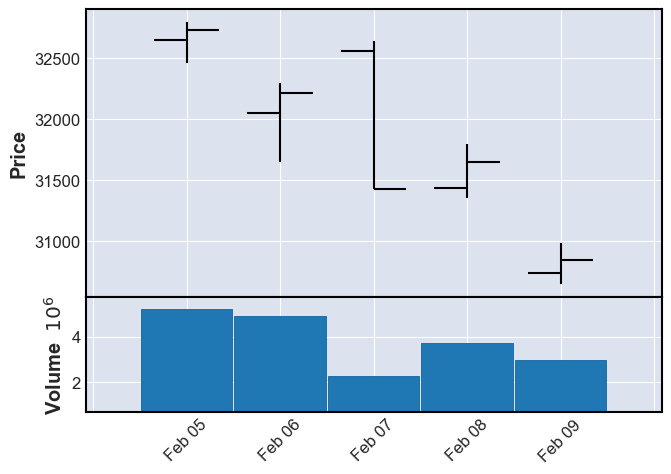

상승?0 횡보?1 하락?22
317 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-02-12  8868297  31340  31005  30885  31185  (2018, 7)
2018-02-13  2007395  31810  31405  31295  31460  (2018, 7)
2018-02-14  1281803  31930  31645  31645  31850  (2018, 7)


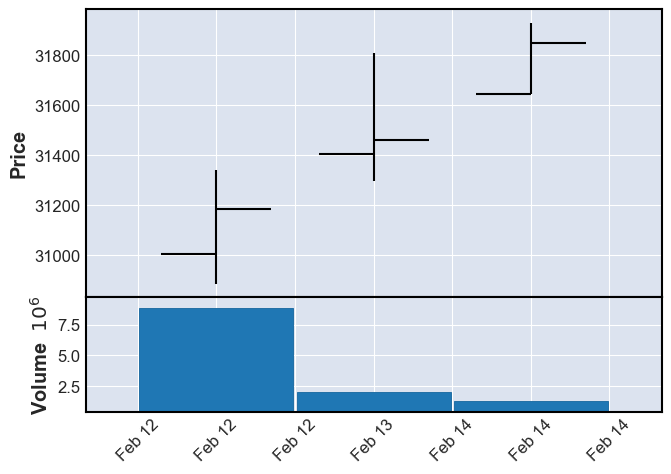

상승?0 횡보?1 하락?20
318 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-02-19  7539248  32280  32230  31825  32040  (2018, 8)
2018-02-20  1242571  31925  31915  31590  31640  (2018, 8)
2018-02-21  1687350  31870  31660  31440  31805  (2018, 8)
2018-02-22  1631080  31705  31615  31475  31625  (2018, 8)
2018-02-23  1446617  32090  31735  31735  32090  (2018, 8)


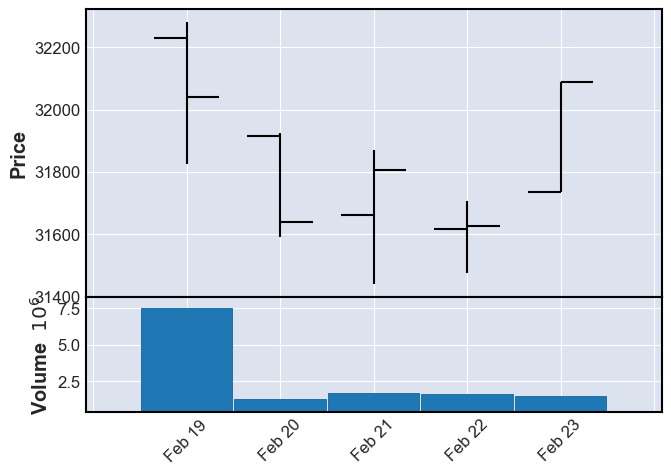

상승?0 횡보?1 하락?21
319 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2018-02-26  1576041  32245  32215  32015  32135  (2018, 9)
2018-02-27  1578884  32475  32340  32065  32075  (2018, 9)
2018-02-28  1750570  32095  31965  31655  31665  (2018, 9)
2018-03-02  1562317  31400  31335  31055  31225  (2018, 9)


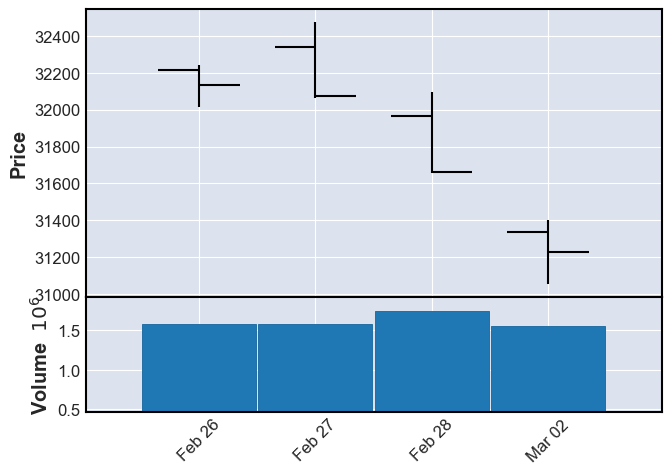

상승?0 횡보?1 하락?22
320 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-03-05  1592852  31245  31200  30810  30815  (2018, 10)
2018-03-06  1535658  31460  31125  31080  31460  (2018, 10)
2018-03-07   971071  31795  31630  31275  31450  (2018, 10)
2018-03-08  1201645  31820  31725  31495  31820  (2018, 10)
2018-03-09  1257879  32430  31940  31860  32150  (2018, 10)


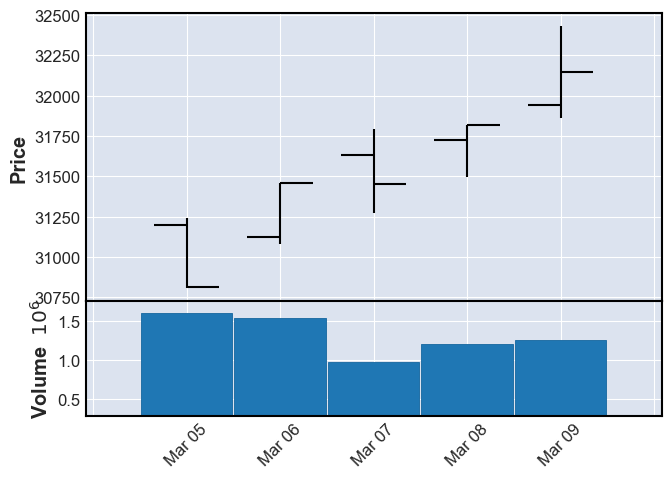

상승?0 횡보?1 하락?20
321 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-03-12   555463  32555  32465  32335  32435  (2018, 11)
2018-03-13   787572  32600  32440  32390  32600  (2018, 11)
2018-03-14  4753101  32575  32365  32365  32565  (2018, 11)
2018-03-15  1004083  32710  32600  32345  32665  (2018, 11)
2018-03-16   708039  32700  32660  32395  32625  (2018, 11)


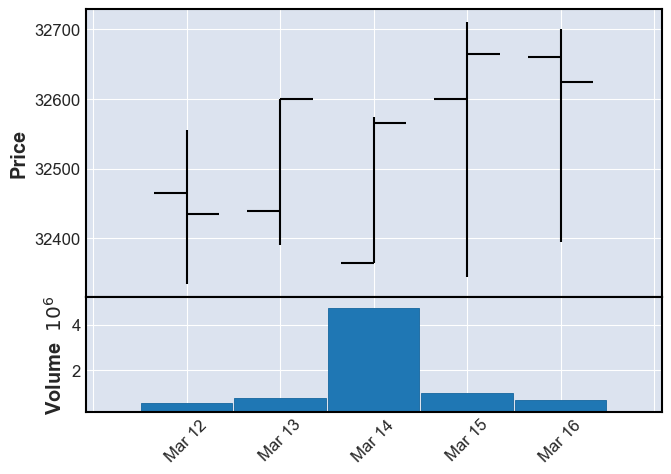

상승?0 횡보?1 하락?20
322 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-03-19   794208  32625  32620  32340  32385  (2018, 12)
2018-03-20  1059755  32555  32200  32175  32555  (2018, 12)
2018-03-21   412271  32650  32535  32510  32570  (2018, 12)
2018-03-22  1050901  32865  32580  32560  32685  (2018, 12)
2018-03-23  3163307  32095  32025  31530  31610  (2018, 12)


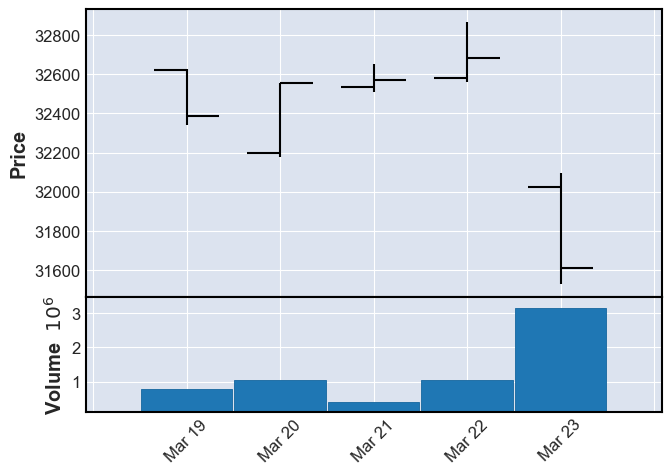

상승?0 횡보?1 하락?22
323 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-03-26  1798577  31880  31590  31360  31880  (2018, 13)
2018-03-27  2907366  32115  32090  31940  32035  (2018, 13)
2018-03-28   833567  31680  31640  31425  31600  (2018, 13)
2018-03-29   914178  31925  31675  31550  31880  (2018, 13)
2018-03-30  2420750  32180  32115  31955  31955  (2018, 13)


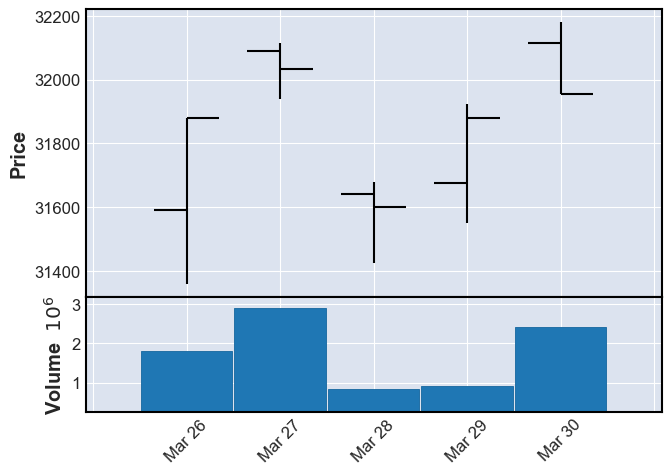

상승?0 횡보?1 하락?20
324 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-04-02   331772  32195  31995  31860  31905  (2018, 14)
2018-04-03   632347  31825  31720  31500  31825  (2018, 14)
2018-04-04  1465577  31875  31870  31290  31325  (2018, 14)
2018-04-05  1166299  31910  31565  31505  31765  (2018, 14)
2018-04-06   683939  31690  31540  31440  31610  (2018, 14)


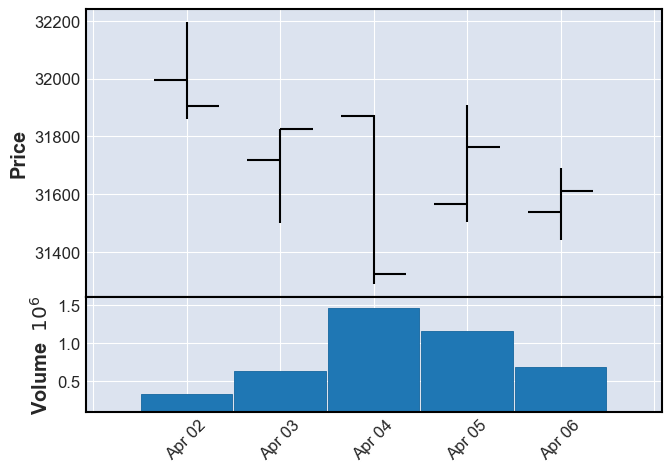

상승?0 횡보?1 하락?22
325 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-04-09  1181717  31875  31565  31545  31805  (2018, 15)
2018-04-10  1619931  31950  31690  31445  31875  (2018, 15)
2018-04-11  5099571  32000  31900  31735  31750  (2018, 15)
2018-04-12  1717825  31945  31870  31760  31760  (2018, 15)
2018-04-13  2576721  32005  31860  31810  31955  (2018, 15)


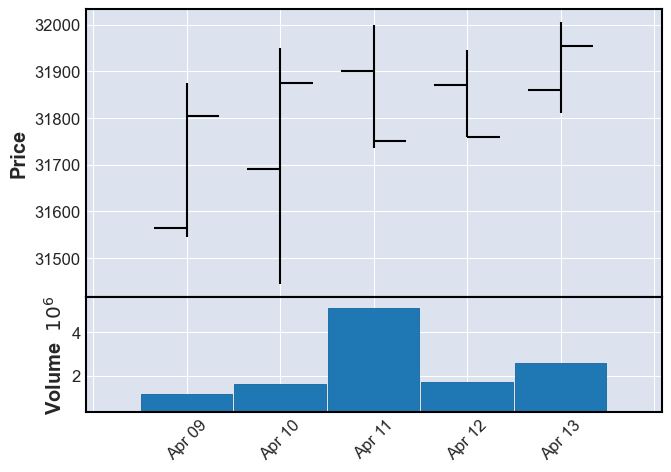

상승?0 횡보?1 하락?20
326 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-04-16  1606655  32165  32165  31895  32000  (2018, 16)
2018-04-17  3067042  32110  32010  31880  31935  (2018, 16)
2018-04-18  1724050  32405  32140  32130  32295  (2018, 16)
2018-04-19  2220034  32535  32395  32335  32450  (2018, 16)
2018-04-20   749008  32400  32300  32225  32255  (2018, 16)


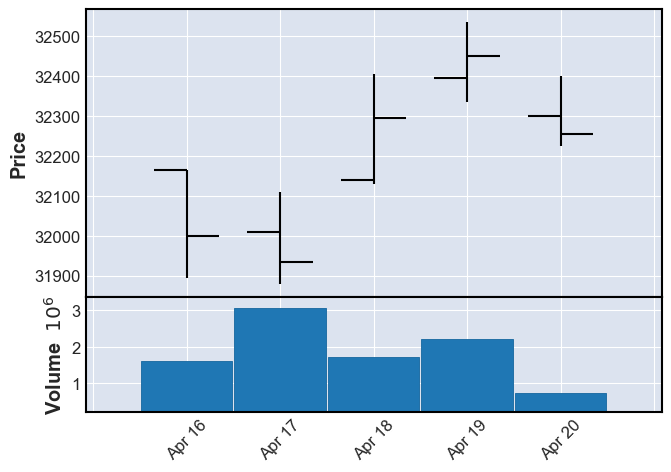

상승?0 횡보?1 하락?20
327 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-04-23   699624  32300  32200  32135  32250  (2018, 17)
2018-04-24  2783326  32300  32275  31915  32070  (2018, 17)
2018-04-25   631334  31900  31820  31690  31875  (2018, 17)
2018-04-26  1046175  32365  31965  31945  32235  (2018, 17)
2018-04-27  1427929  32325  32140  31995  32120  (2018, 17)


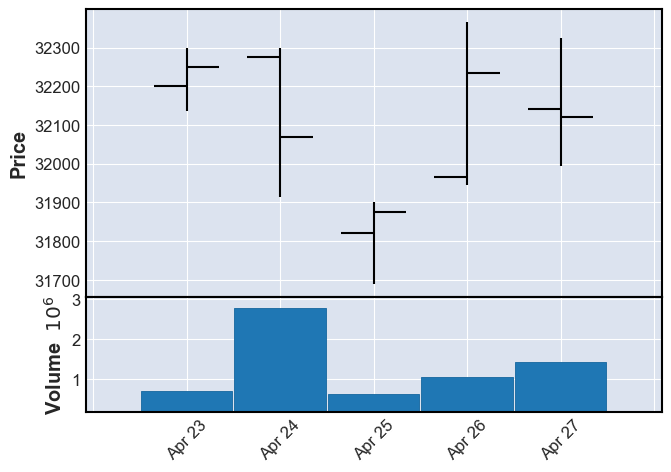

상승?0 횡보?1 하락?22
328 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-04-30  1055907  32320  32320  32140  32265  (2018, 18)
2018-05-02   627933  32300  32300  32030  32085  (2018, 18)
2018-05-03   329226  32080  32005  31870  31955  (2018, 18)
2018-05-04   809975  32025  31990  31730  31735  (2018, 18)


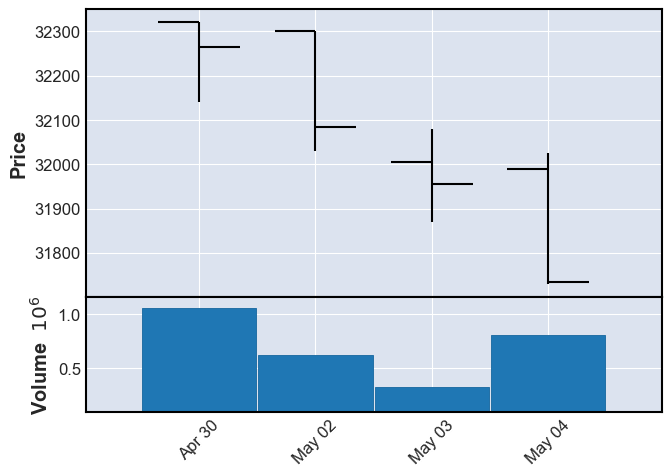

상승?0 횡보?1 하락?22
329 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-05-08   712143  31945  31870  31545  31575  (2018, 19)
2018-05-09  1682892  31670  31670  31300  31490  (2018, 19)
2018-05-10  1626282  31745  31645  31565  31715  (2018, 19)
2018-05-11   623239  32005  31810  31810  31890  (2018, 19)


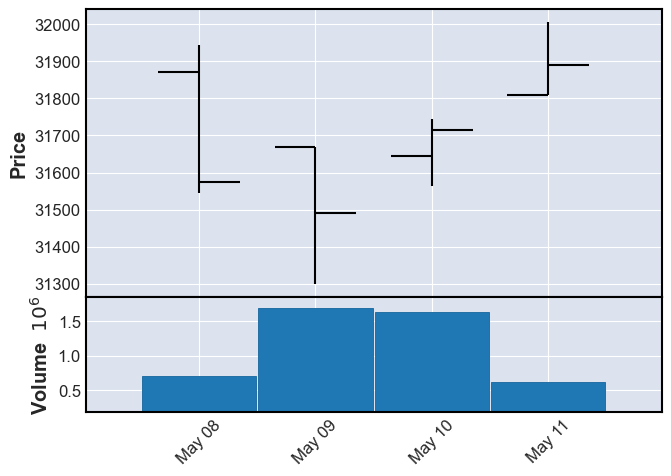

상승?0 횡보?1 하락?20
330 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-05-14   664820  31975  31955  31770  31805  (2018, 20)
2018-05-15   731268  31840  31790  31495  31550  (2018, 20)
2018-05-16   693468  31710  31440  31400  31635  (2018, 20)
2018-05-17  1173680  31830  31745  31500  31505  (2018, 20)
2018-05-18  1451971  31625  31575  31515  31595  (2018, 20)


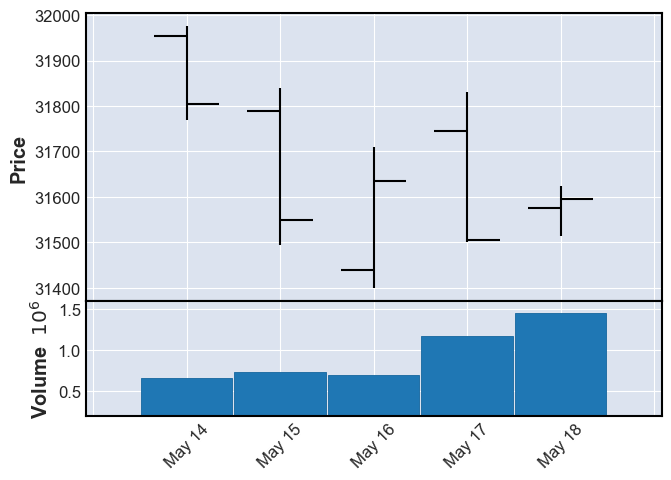

상승?0 횡보?1 하락?22
331 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-05-21   442978  31765  31675  31400  31690  (2018, 21)
2018-05-23  1429478  31905  31635  31625  31865  (2018, 21)
2018-05-24   927387  31950  31945  31695  31800  (2018, 21)
2018-05-25  1210906  31910  31635  31630  31835  (2018, 21)


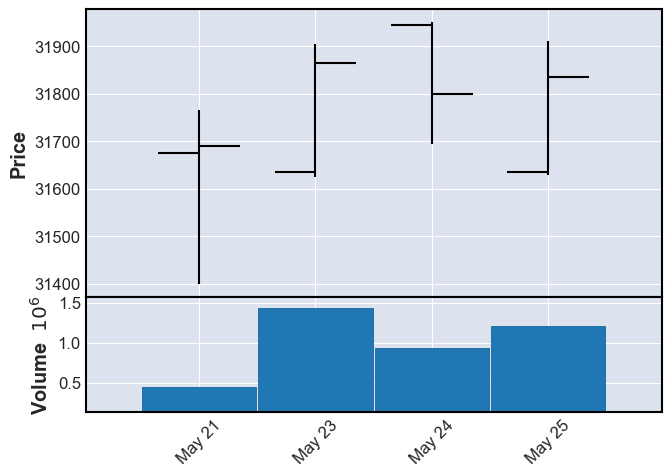

상승?0 횡보?1 하락?20
332 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-05-28   943033  32010  31970  31885  31960  (2018, 22)
2018-05-29  1468878  31965  31925  31665  31695  (2018, 22)
2018-05-30  3101734  31540  31530  30815  30955  (2018, 22)
2018-05-31  1254611  31175  31145  31000  31130  (2018, 22)
2018-06-01  1143547  31415  31130  31020  31305  (2018, 22)


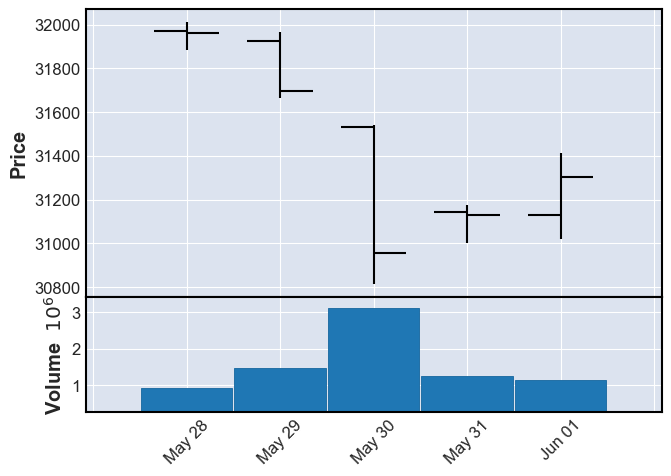

상승?0 횡보?1 하락?22
333 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-06-04   835220  31545  31360  31335  31485  (2018, 23)
2018-06-05  1940447  31580  31515  31285  31580  (2018, 23)
2018-06-07  1348615  31940  31700  31700  31835  (2018, 23)
2018-06-08  3093158  31775  31765  31485  31535  (2018, 23)


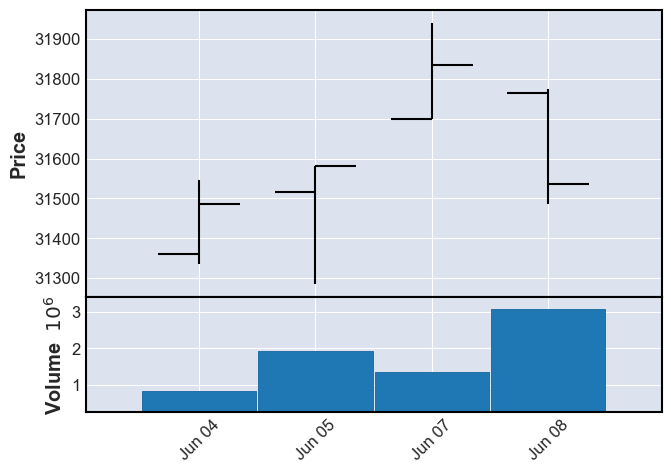

상승?0 횡보?1 하락?21
334 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2018-06-11  665483  31800  31565  31495  31780  (2018, 24)
2018-06-12  996922  31920  31855  31710  31745  (2018, 24)
2018-06-14  911432  31550  31545  31125  31135  (2018, 24)
2018-06-15  991413  31250  31210  30995  30995  (2018, 24)


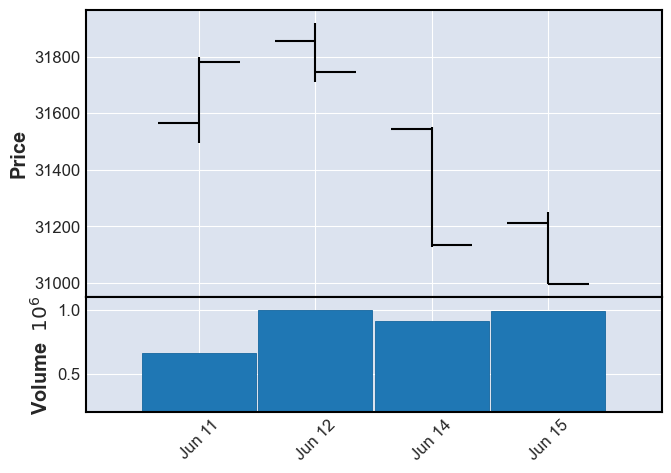

상승?0 횡보?1 하락?22
335 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-06-18  1347631  31015  31015  30500  30635  (2018, 25)
2018-06-19  2179003  30655  30550  30160  30235  (2018, 25)
2018-06-20  2007818  30645  30350  30270  30455  (2018, 25)
2018-06-21  1464430  30565  30440  30190  30210  (2018, 25)
2018-06-22  2533715  30435  29900  29900  30435  (2018, 25)


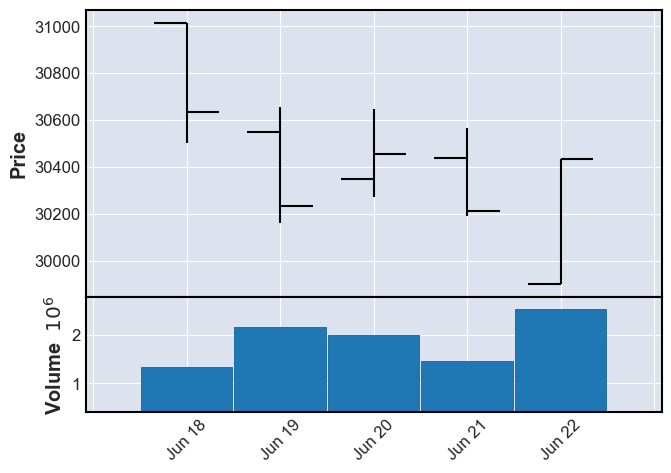

상승?0 횡보?1 하락?22
336 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-06-25  1691665  30480  30435  30125  30445  (2018, 26)
2018-06-26  1104195  30450  30145  30035  30355  (2018, 26)
2018-06-27   396171  30470  30300  30260  30300  (2018, 26)
2018-06-28  1987846  30270  30180  29925  29995  (2018, 26)
2018-06-29  1569856  30150  30040  29725  30065  (2018, 26)


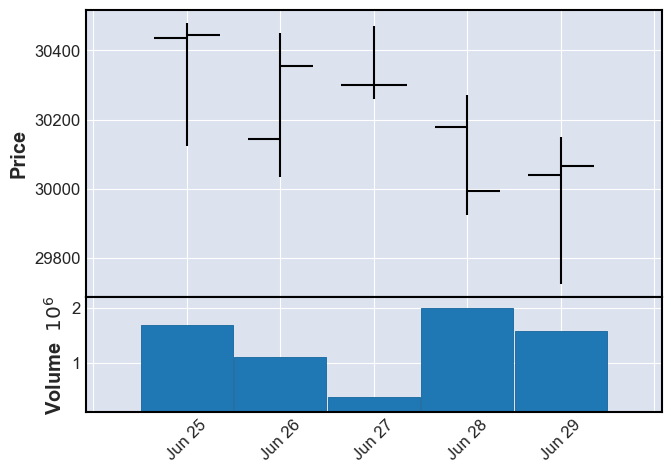

상승?0 횡보?1 하락?22
337 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-07-02  1958163  30110  30065  29410  29415  (2018, 27)
2018-07-03  1676525  29620  29620  29235  29445  (2018, 27)
2018-07-04  1778994  29590  29430  29330  29370  (2018, 27)
2018-07-05  1885272  29490  29370  29125  29300  (2018, 27)
2018-07-06  2216516  29625  29290  29160  29475  (2018, 27)


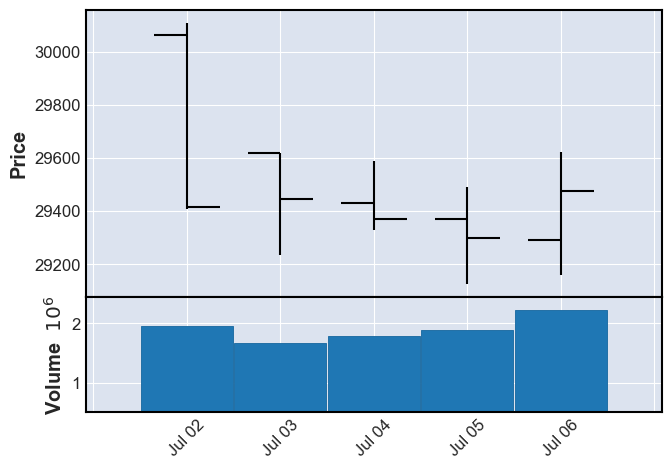

상승?0 횡보?1 하락?21
338 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-07-09  1422476  29820  29515  29420  29715  (2018, 28)
2018-07-10  1557575  29930  29825  29735  29770  (2018, 28)
2018-07-11  3326608  29665  29540  29305  29590  (2018, 28)
2018-07-12  1280228  29830  29650  29535  29685  (2018, 28)
2018-07-13  1343801  30070  29715  29715  30000  (2018, 28)


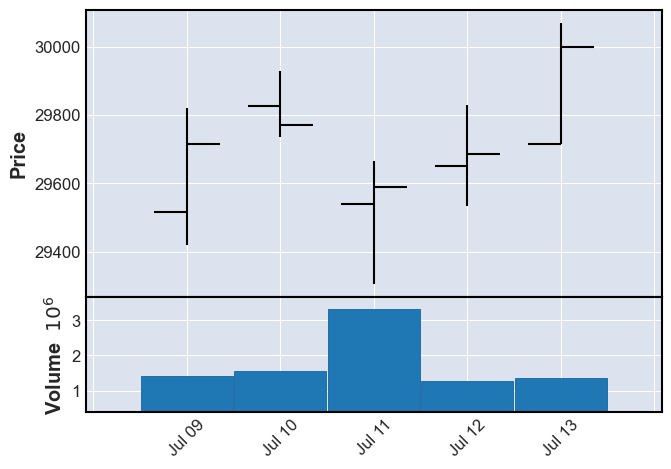

상승?0 횡보?1 하락?20
339 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-07-16   833096  30075  30000  29855  29885  (2018, 29)
2018-07-17  1285275  29955  29890  29710  29845  (2018, 29)
2018-07-18  1382089  30140  30025  29735  29775  (2018, 29)
2018-07-19  1379437  29935  29890  29675  29705  (2018, 29)
2018-07-20  1187911  29885  29725  29535  29840  (2018, 29)


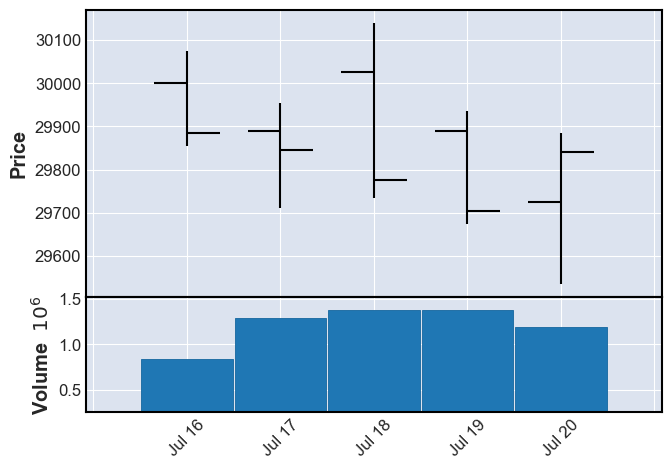

상승?0 횡보?1 하락?21
340 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-07-23  2320295  29830  29830  29550  29605  (2018, 30)
2018-07-24  1285453  29750  29675  29500  29695  (2018, 30)
2018-07-25   880785  29875  29760  29605  29640  (2018, 30)
2018-07-26  1325264  29960  29825  29680  29840  (2018, 30)
2018-07-27   807542  29925  29890  29785  29925  (2018, 30)


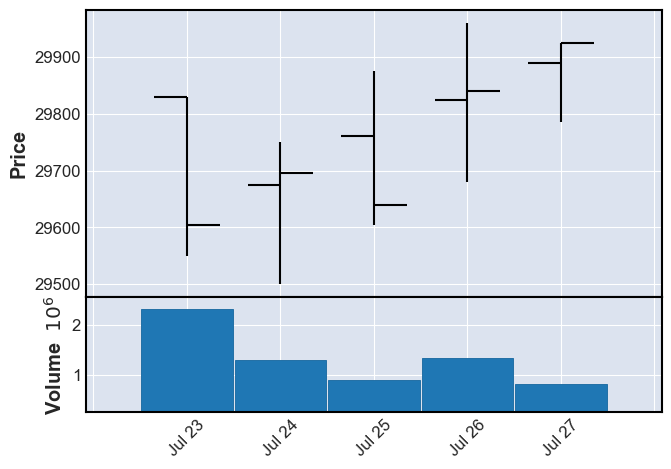

상승?0 횡보?1 하락?20
341 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-07-30  1242887  29840  29745  29640  29755  (2018, 31)
2018-07-31  1039239  29815  29740  29670  29785  (2018, 31)
2018-08-01   830433  30025  29860  29840  29905  (2018, 31)
2018-08-02  1374871  29905  29905  29330  29370  (2018, 31)
2018-08-03  1347103  29610  29465  29370  29590  (2018, 31)


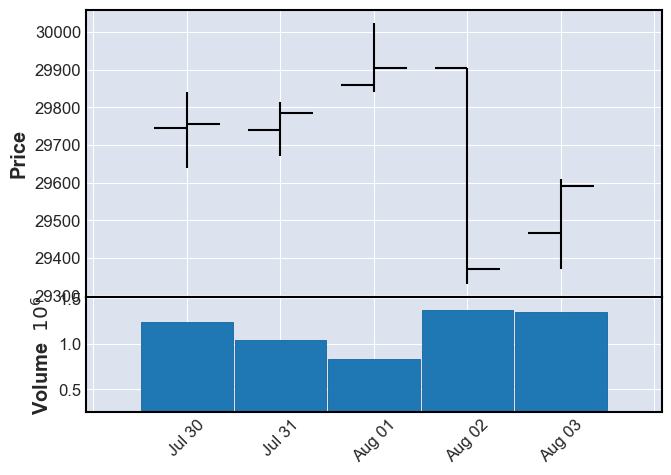

상승?0 횡보?1 하락?22
342 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-08-06  3226872  29775  29625  29550  29560  (2018, 32)
2018-08-07   918715  29780  29630  29475  29780  (2018, 32)
2018-08-08   851382  29875  29875  29730  29765  (2018, 32)
2018-08-09   825231  29785  29760  29625  29750  (2018, 32)
2018-08-10  1076855  29675  29675  29355  29435  (2018, 32)


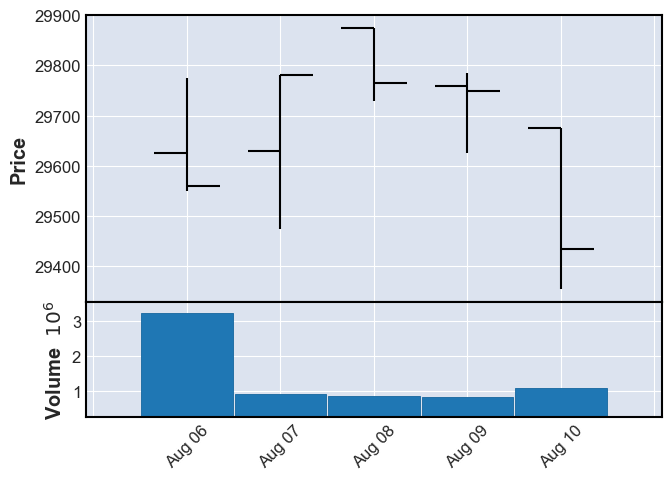

상승?0 횡보?1 하락?21
343 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-08-13   849684  29255  29195  28890  29035  (2018, 33)
2018-08-14  1014531  29210  29050  29035  29165  (2018, 33)
2018-08-16   876405  28965  28800  28615  28880  (2018, 33)
2018-08-17   514014  28970  28855  28820  28885  (2018, 33)


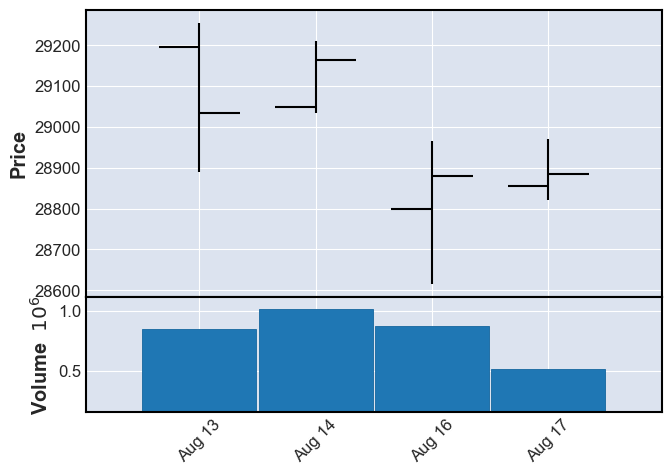

상승?0 횡보?1 하락?21
344 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-08-20   759467  29130  29000  28880  28920  (2018, 34)
2018-08-21  1081256  29270  28915  28850  29230  (2018, 34)
2018-08-22  1092031  29405  29270  29215  29330  (2018, 34)
2018-08-23  3166220  29460  29460  29290  29450  (2018, 34)
2018-08-24  1363686  29635  29380  29295  29575  (2018, 34)


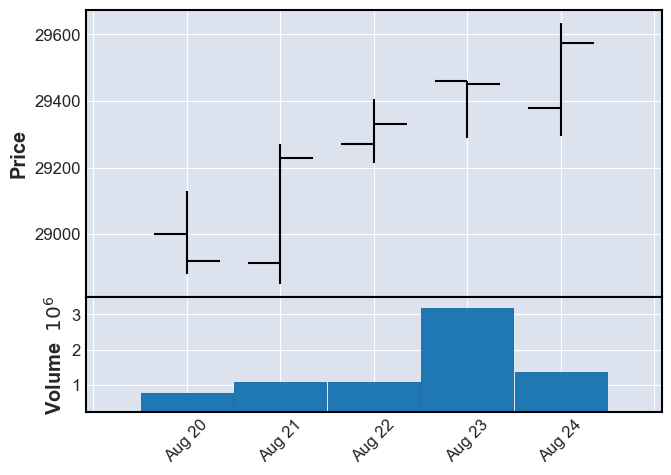

상승?0 횡보?1 하락?20
345 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-08-27  1140952  29770  29670  29580  29720  (2018, 35)
2018-08-28  2083549  29930  29860  29730  29745  (2018, 35)
2018-08-29  1220422  29865  29785  29730  29820  (2018, 35)
2018-08-30  1437165  30020  29855  29770  29845  (2018, 35)
2018-08-31   814629  29975  29730  29655  29955  (2018, 35)


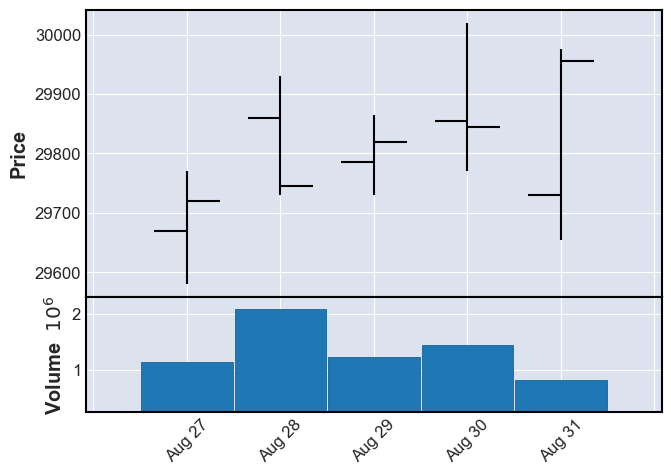

상승?0 횡보?1 하락?20
346 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-09-03   793451  29940  29940  29740  29780  (2018, 36)
2018-09-04  1506514  29940  29800  29725  29920  (2018, 36)
2018-09-05   833150  29870  29815  29485  29545  (2018, 36)
2018-09-06  1209557  29620  29495  29410  29480  (2018, 36)
2018-09-07  1340557  29430  29290  29115  29335  (2018, 36)


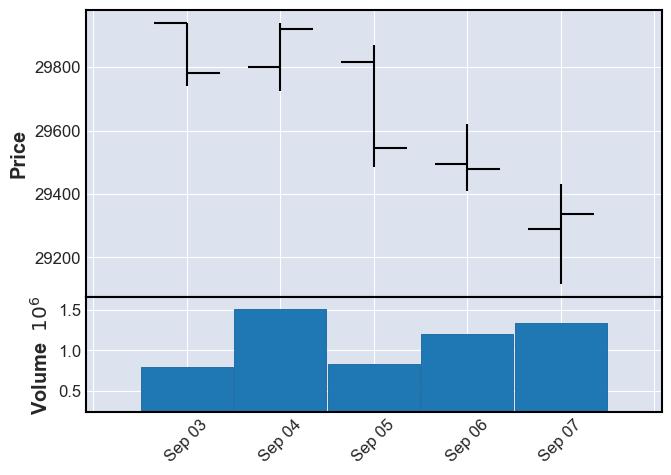

상승?0 횡보?1 하락?22
347 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-09-10   888266  29445  29300  29285  29400  (2018, 37)
2018-09-11  1260073  29500  29370  29200  29290  (2018, 37)
2018-09-12   555545  29355  29305  29140  29285  (2018, 37)
2018-09-13   425373  29370  29190  29190  29300  (2018, 37)
2018-09-14  1441014  29795  29535  29535  29740  (2018, 37)


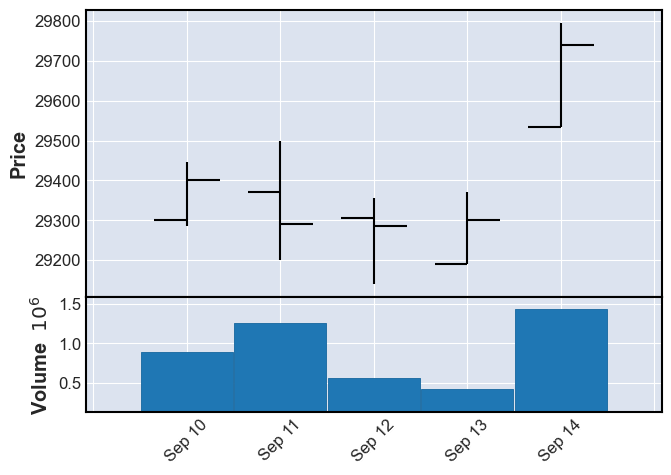

상승?0 횡보?1 하락?20
348 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-09-17   975021  29690  29675  29445  29535  (2018, 38)
2018-09-18  1397780  29680  29335  29320  29670  (2018, 38)
2018-09-19   862794  29790  29780  29575  29705  (2018, 38)
2018-09-20  1835040  30080  29765  29750  29960  (2018, 38)
2018-09-21  1729016  30110  29965  29940  30110  (2018, 38)


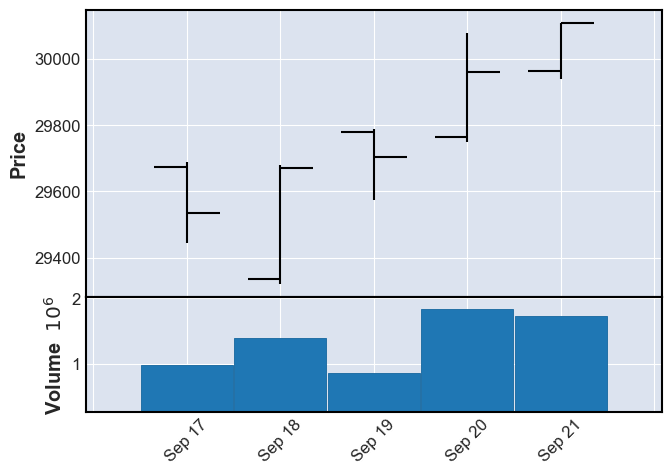

상승?0 횡보?1 하락?20
349 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2018-09-27  934879  30370  30055  30015  30310  (2018, 39)
2018-09-28  861828  30365  30365  30110  30135  (2018, 39)


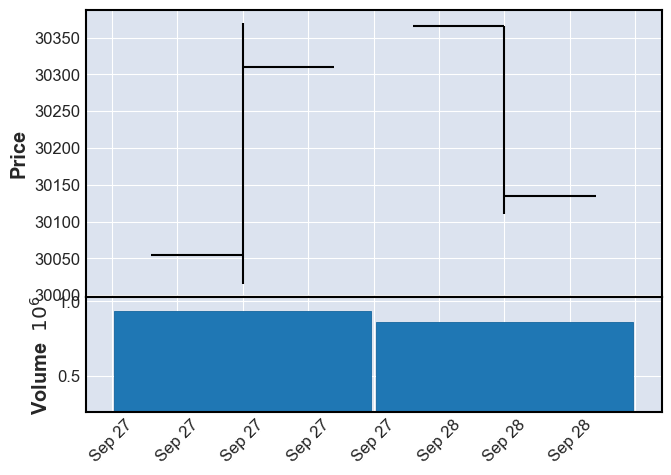

상승?0 횡보?1 하락?22
350 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-10-01   653496  30260  30260  30010  30120  (2018, 40)
2018-10-02  1381645  30185  30100  29735  29770  (2018, 40)
2018-10-04  1559803  29775  29775  29250  29290  (2018, 40)
2018-10-05  1555876  29360  29265  29065  29250  (2018, 40)


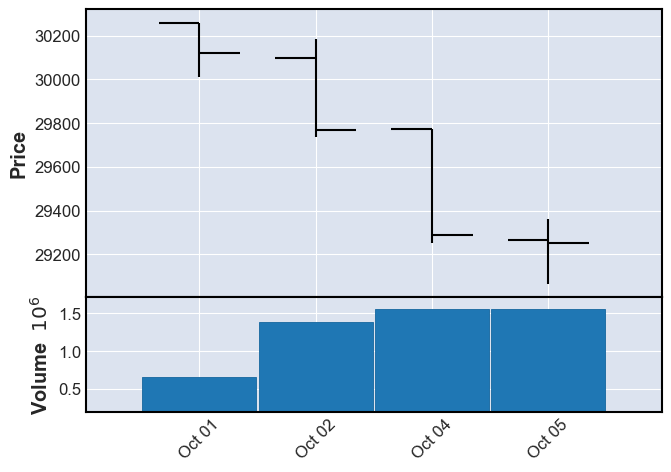

상승?0 횡보?1 하락?22
351 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-10-08   805859  29335  29125  29115  29115  (2018, 41)
2018-10-10  1657451  29165  29165  28820  28920  (2018, 41)
2018-10-11  2500049  28390  28225  27710  27720  (2018, 41)
2018-10-12  2433234  28220  27720  27685  27995  (2018, 41)


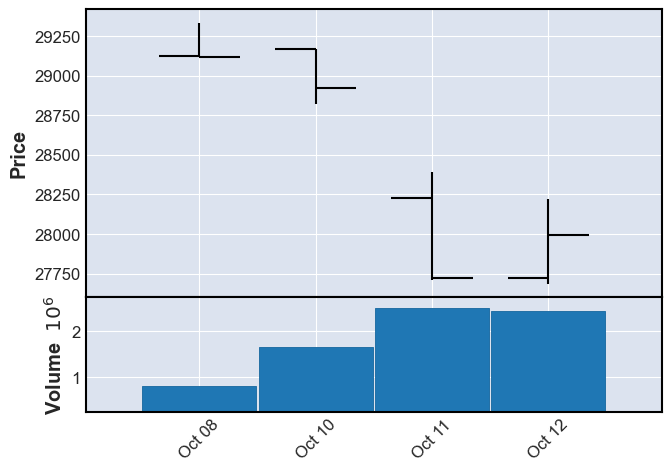

상승?0 횡보?1 하락?22
352 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-10-15  1215407  27990  27955  27765  27840  (2018, 42)
2018-10-16  1519605  28055  27960  27730  27785  (2018, 42)
2018-10-17  1101847  28295  28030  28020  28115  (2018, 42)
2018-10-18  1564628  28110  28020  27855  27880  (2018, 42)
2018-10-19   941548  28020  27675  27510  27985  (2018, 42)


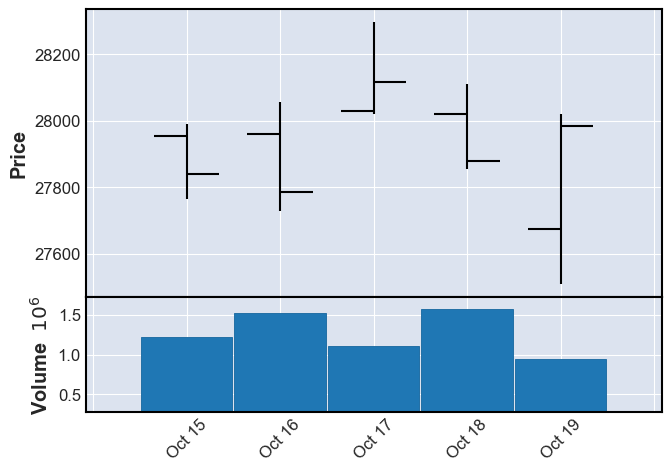

상승?0 횡보?1 하락?21
353 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-10-22  1187278  28125  27795  27725  28035  (2018, 43)
2018-10-23  2073076  27865  27820  27220  27370  (2018, 43)
2018-10-24  1834891  27560  27560  27215  27255  (2018, 43)
2018-10-25  4305285  26840  26650  26440  26840  (2018, 43)
2018-10-26  3351910  26855  26840  26155  26405  (2018, 43)


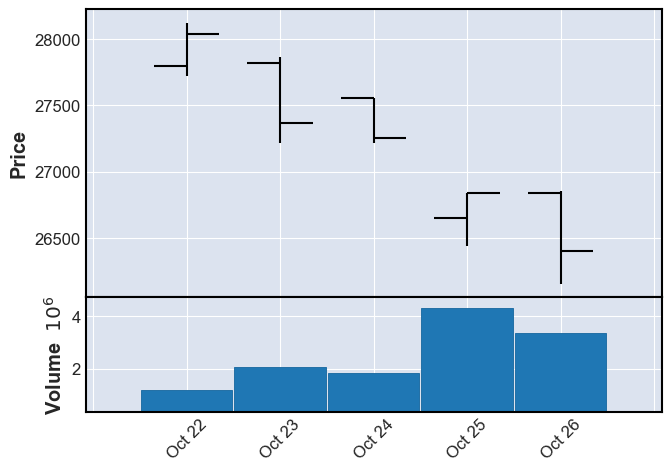

상승?0 횡보?1 하락?22
354 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-10-29  2862286  26665  26510  26135  26170  (2018, 44)
2018-10-30  2230649  26495  25985  25950  26260  (2018, 44)
2018-10-31  1416173  26415  26360  26115  26365  (2018, 44)
2018-11-01  1260449  26715  26420  26265  26265  (2018, 44)
2018-11-02  1461691  27290  26640  26570  27240  (2018, 44)


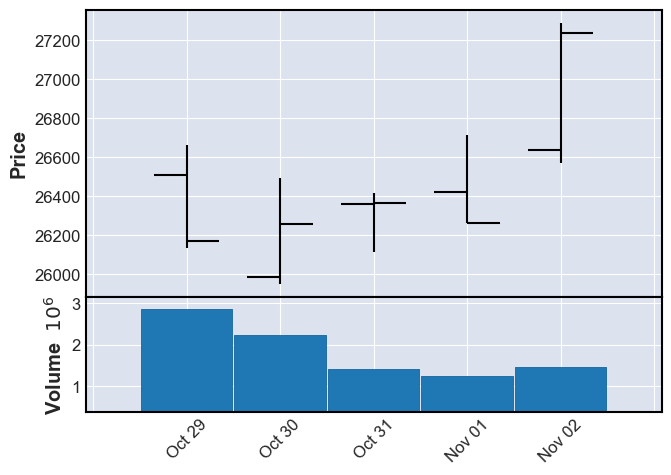

상승?0 횡보?1 하락?20
355 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-11-05  1164702  27055  27055  26655  26975  (2018, 45)
2018-11-06  1308608  27195  27130  26860  27150  (2018, 45)
2018-11-07  2188952  27395  27145  26950  27030  (2018, 45)
2018-11-08  2578899  27615  27470  27250  27250  (2018, 45)
2018-11-09  2448117  27345  27245  27070  27090  (2018, 45)


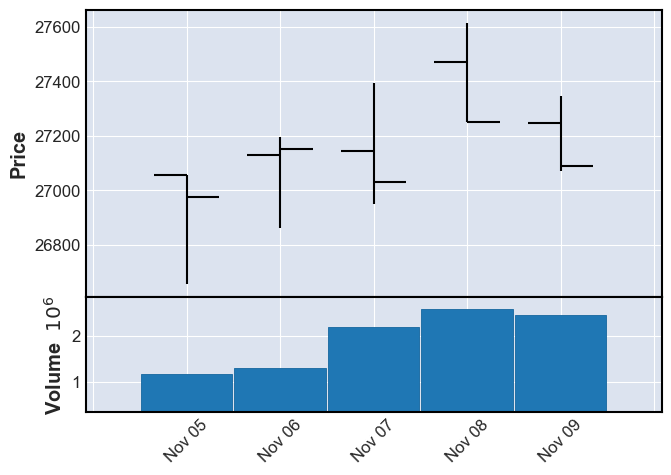

상승?0 횡보?1 하락?21
356 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-11-12  1799879  27220  26865  26840  27170  (2018, 46)
2018-11-13  1842598  26990  26695  26485  26955  (2018, 46)
2018-11-14   525006  27000  26950  26805  26905  (2018, 46)
2018-11-15  2714636  27175  26860  26760  27155  (2018, 46)
2018-11-16  1473162  27330  27265  27090  27140  (2018, 46)


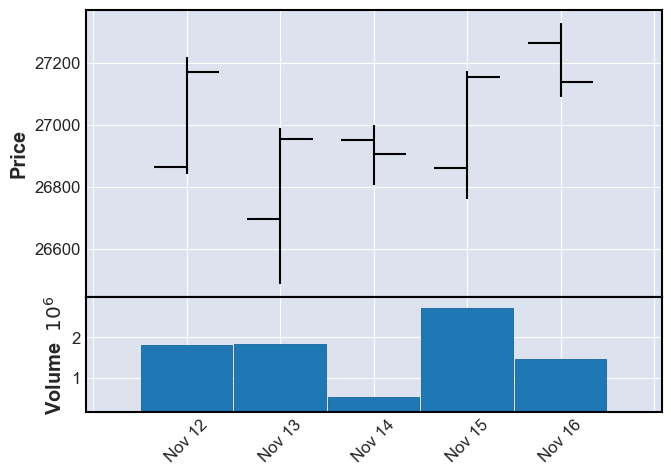

상승?0 횡보?1 하락?21
357 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-11-19  1666057  27400  27185  27095  27240  (2018, 47)
2018-11-20  2704392  27075  26935  26875  26955  (2018, 47)
2018-11-21  1612738  26860  26600  26530  26840  (2018, 47)
2018-11-22  1952232  26920  26840  26750  26820  (2018, 47)
2018-11-23  1903599  26860  26800  26510  26620  (2018, 47)


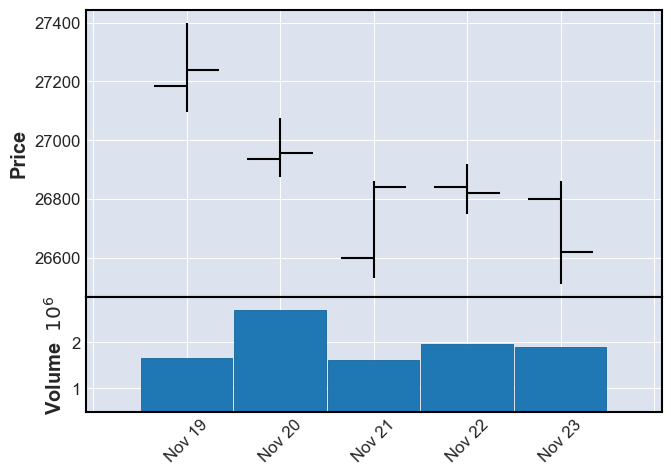

상승?0 횡보?1 하락?22
358 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-11-26  1646714  27005  26715  26685  26995  (2018, 48)
2018-11-27  1185228  27250  27070  26925  27195  (2018, 48)
2018-11-28  1118104  27360  27270  27150  27360  (2018, 48)
2018-11-29  1583738  27775  27745  27350  27415  (2018, 48)
2018-11-30  1851126  27525  27510  27100  27155  (2018, 48)


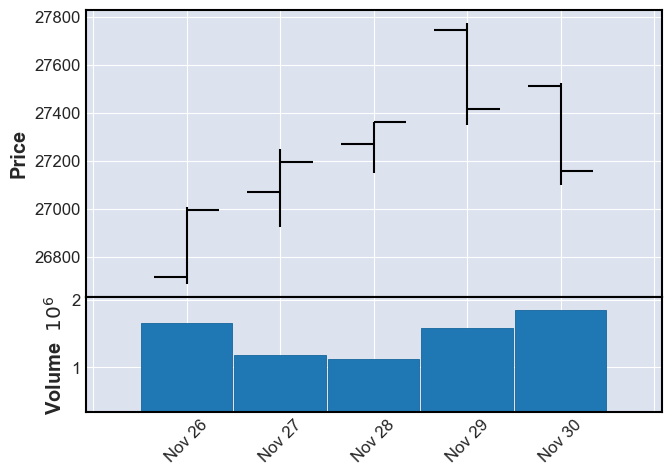

상승?0 횡보?1 하락?20
359 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-12-03  1862740  27700  27600  27375  27610  (2018, 49)
2018-12-04  3470898  27550  27515  27185  27305  (2018, 49)
2018-12-05  2627266  27250  26960  26955  27150  (2018, 49)
2018-12-06  1936048  27105  27105  26700  26745  (2018, 49)
2018-12-07  1171591  26965  26905  26725  26845  (2018, 49)


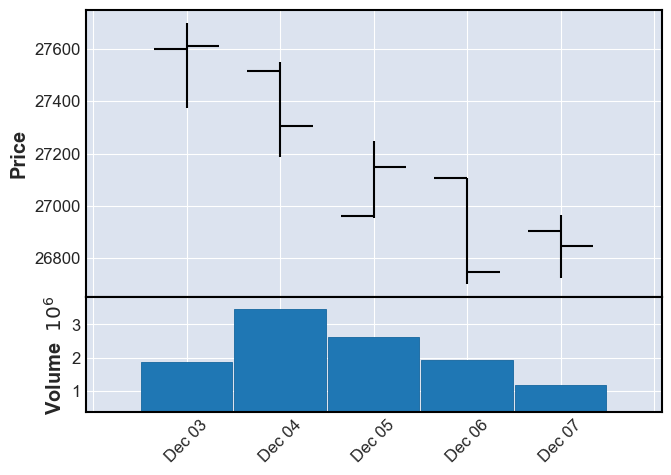

상승?0 횡보?1 하락?22
360 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-12-10  3081456  26640  26470  26400  26585  (2018, 50)
2018-12-11  7507703  26750  26750  26445  26525  (2018, 50)
2018-12-12  4962992  26920  26625  26595  26870  (2018, 50)
2018-12-13  4845690  27130  27000  26845  27045  (2018, 50)
2018-12-14  2074215  27015  27015  26460  26615  (2018, 50)


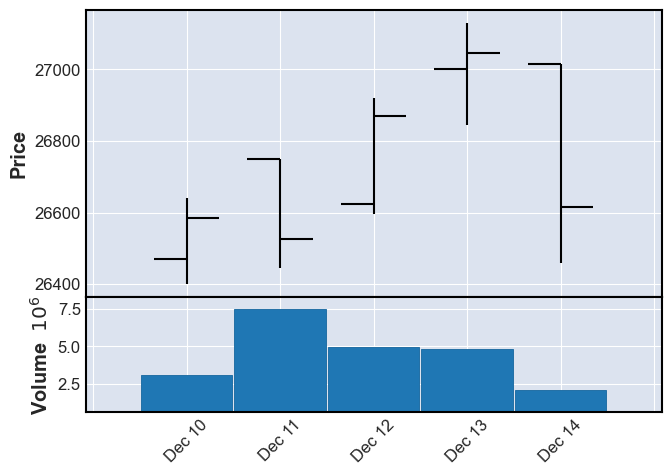

상승?0 횡보?1 하락?21
361 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-12-17  2376933  26760  26660  26625  26665  (2018, 51)
2018-12-18  6645786  26710  26480  26475  26565  (2018, 51)
2018-12-19  1813525  26785  26650  26590  26760  (2018, 51)
2018-12-20  1502106  26650  26580  26345  26490  (2018, 51)
2018-12-21  3367794  26530  26445  26370  26485  (2018, 51)


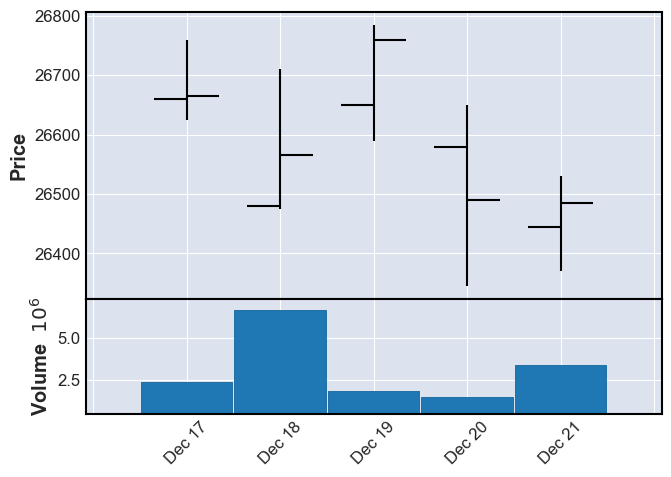

상승?0 횡보?1 하락?22
362 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2018-12-24  5329997  26500  26400  26320  26500  (2018, 52)
2018-12-26  2659561  26300  26130  25985  26120  (2018, 52)
2018-12-27  2435101  26595  26525  26410  26480  (2018, 52)
2018-12-28  1179902  26705  26550  26550  26580  (2018, 52)


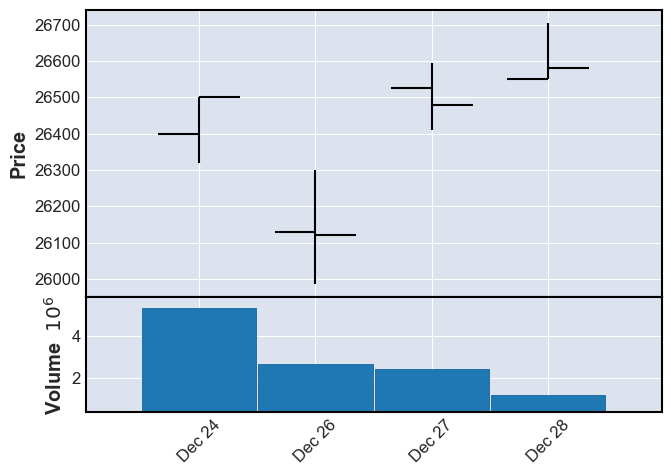

상승?0 횡보?1 하락?21
363 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-01-02  1584037  26820  26790  26190  26270  (2019, 1)
2019-01-03  1534311  26305  26275  25980  26005  (2019, 1)
2019-01-04  5841228  26250  26005  25935  26225  (2019, 1)


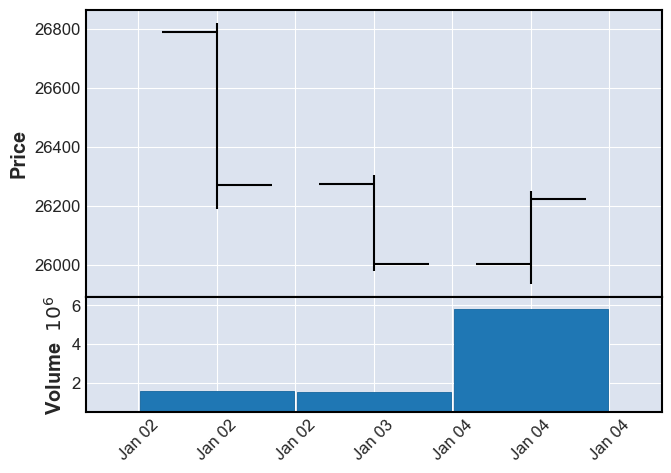

상승?0 횡보?1 하락?21
364 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-01-07  1155997  26785  26550  26530  26605  (2019, 2)
2019-01-08  1786568  26685  26600  26400  26405  (2019, 2)
2019-01-09  1570744  27045  26515  26515  26960  (2019, 2)
2019-01-10  1733154  27105  26985  26885  26955  (2019, 2)
2019-01-11  1030803  27190  27075  26975  27130  (2019, 2)


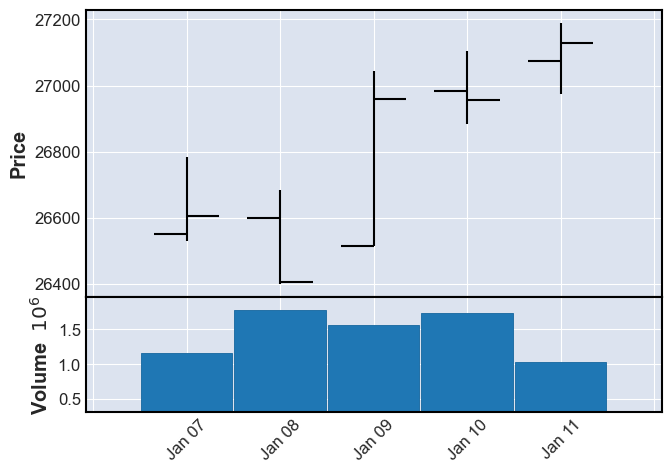

상승?0 횡보?1 하락?20
365 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-01-14   922322  27085  27060  26860  26895  (2019, 3)
2019-01-15  1725461  27440  26990  26965  27425  (2019, 3)
2019-01-16  2172710  27545  27420  27330  27540  (2019, 3)
2019-01-17  2303700  27725  27600  27505  27625  (2019, 3)
2019-01-18  1956055  27835  27760  27695  27825  (2019, 3)


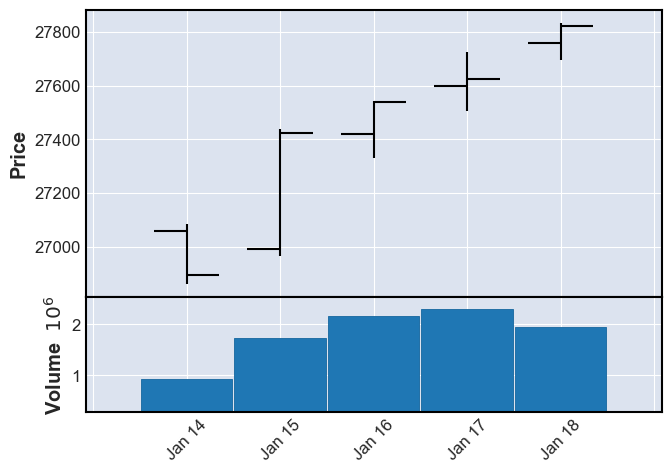

상승?0 횡보?1 하락?20
366 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-01-21  1367356  27990  27970  27675  27850  (2019, 4)
2019-01-22  2010009  27900  27850  27595  27700  (2019, 4)
2019-01-23  1982175  27905  27575  27570  27835  (2019, 4)
2019-01-24  2290574  28070  27850  27810  28065  (2019, 4)
2019-01-25  5921995  28610  28160  28130  28590  (2019, 4)


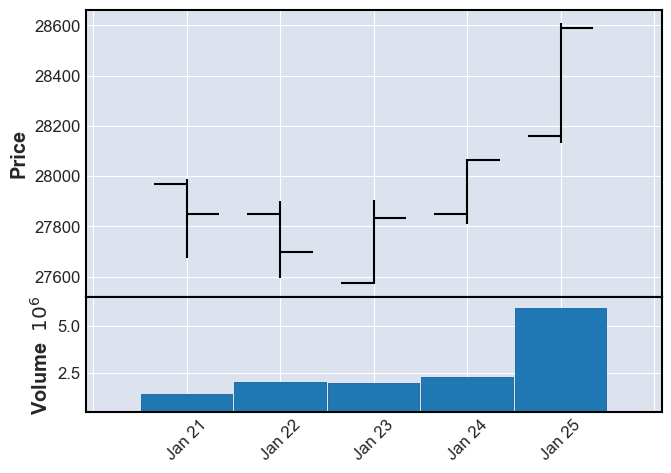

상승?0 횡보?1 하락?20
367 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-01-28  4127093  28775  28635  28480  28580  (2019, 5)
2019-01-29  2640994  28710  28530  28405  28710  (2019, 5)
2019-01-30  2279428  28965  28605  28570  28965  (2019, 5)
2019-01-31  3521477  29240  29145  28930  28940  (2019, 5)
2019-02-01  2373592  29180  29055  28870  28890  (2019, 5)


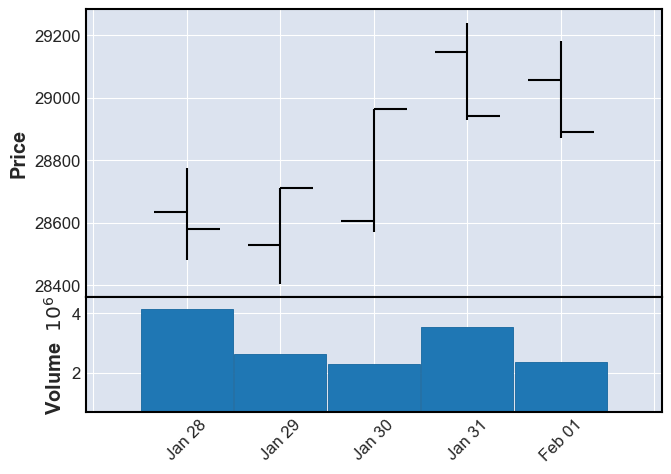

상승?0 횡보?1 하락?20
368 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-02-07  1663175  29100  29090  28825  28895  (2019, 6)
2019-02-08  2888617  28750  28740  28445  28510  (2019, 6)


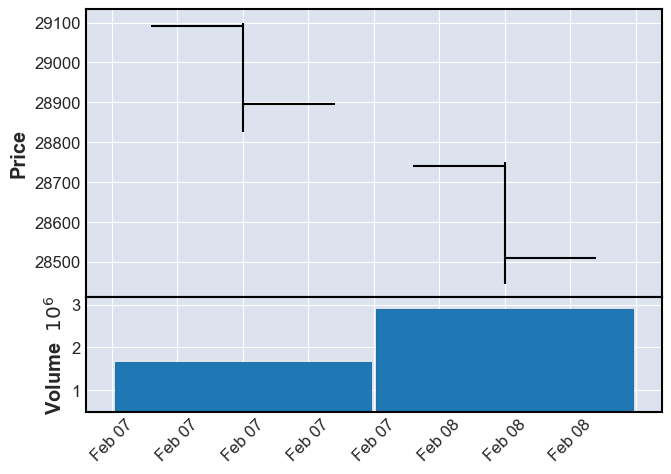

상승?0 횡보?1 하락?22
369 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-02-11  2164580  28535  28510  28365  28535  (2019, 7)
2019-02-12  2548926  28775  28535  28505  28720  (2019, 7)
2019-02-13  2390399  28875  28830  28755  28845  (2019, 7)
2019-02-14  2484258  29105  28860  28620  29105  (2019, 7)
2019-02-15  1125533  29000  29000  28630  28745  (2019, 7)


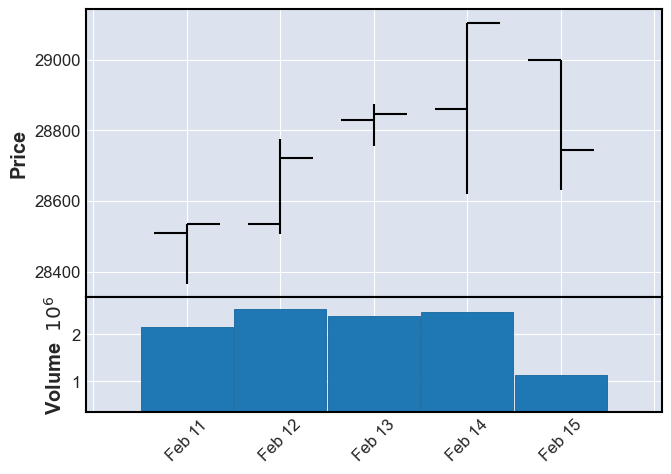

상승?0 횡보?1 하락?20
370 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-02-18  1265208  29055  28950  28835  28955  (2019, 8)
2019-02-19  1674630  28960  28915  28655  28825  (2019, 8)
2019-02-20  2820834  29265  29005  28950  29155  (2019, 8)
2019-02-21  1923769  29265  29055  28945  29160  (2019, 8)
2019-02-22  1158711  29175  29095  29010  29170  (2019, 8)


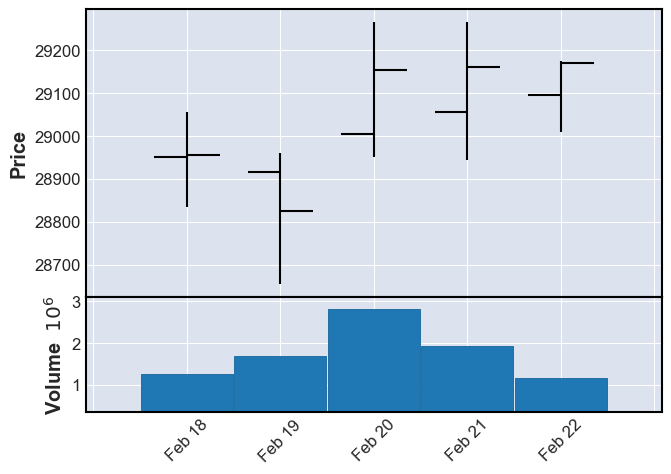

상승?0 횡보?1 하락?20
371 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-02-25  1412391  29380  29330  29130  29235  (2019, 9)
2019-02-26  1373018  29250  29225  29065  29145  (2019, 9)
2019-02-27  1255705  29285  29210  29160  29230  (2019, 9)
2019-02-28  2126823  29220  29175  28780  28780  (2019, 9)


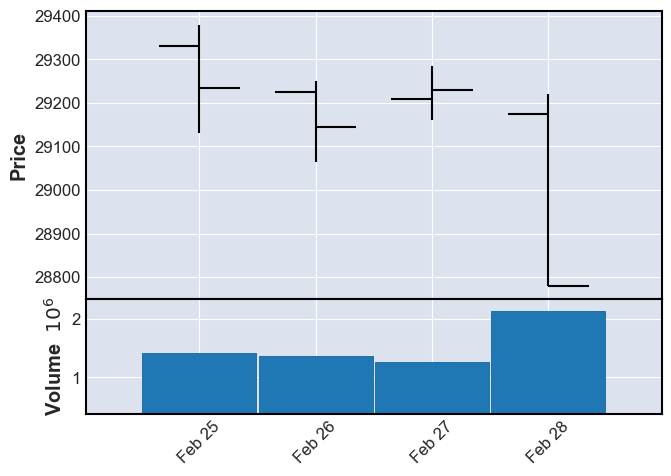

상승?0 횡보?1 하락?22
372 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-03-04  1232390  29030  28940  28580  28590  (2019, 10)
2019-03-05  1618198  28525  28475  28295  28385  (2019, 10)
2019-03-06  5085101  28370  28370  28250  28305  (2019, 10)
2019-03-07  1512896  28430  28295  28115  28210  (2019, 10)
2019-03-08  1931056  28125  28090  27830  27830  (2019, 10)


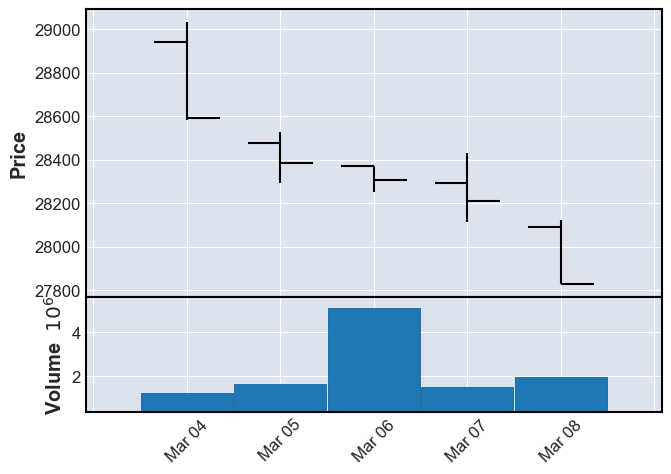

상승?0 횡보?1 하락?22
373 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-03-11  3708783  27925  27885  27750  27850  (2019, 11)
2019-03-12  1476716  28190  28070  28055  28125  (2019, 11)
2019-03-13  2564678  28040  28040  27735  27925  (2019, 11)
2019-03-14  4756750  28105  28015  27840  28030  (2019, 11)
2019-03-15  1242520  28425  27980  27975  28330  (2019, 11)


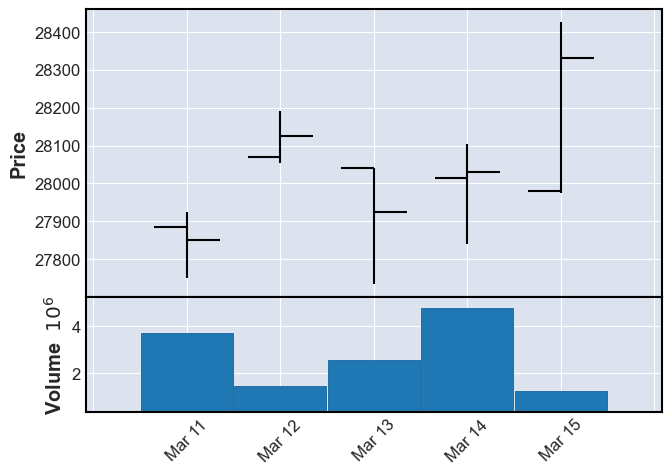

상승?0 횡보?1 하락?20
374 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-03-18   789377  28445  28400  28285  28355  (2019, 12)
2019-03-19  1891754  28400  28400  28230  28325  (2019, 12)
2019-03-20  1665233  28365  28275  28005  28365  (2019, 12)
2019-03-21  3613074  28800  28350  28350  28550  (2019, 12)
2019-03-22  4954637  28775  28700  28565  28630  (2019, 12)


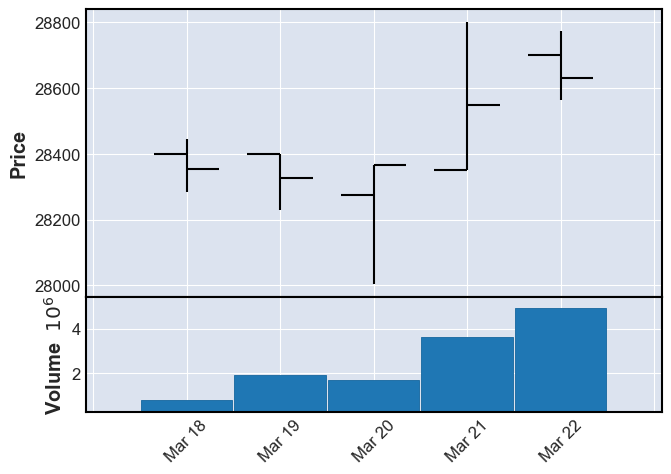

상승?0 횡보?1 하락?20
375 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-03-25  3355048  28290  28205  28065  28065  (2019, 13)
2019-03-26  3282200  28180  28160  28045  28100  (2019, 13)
2019-03-27  3573343  28175  28110  27845  28085  (2019, 13)
2019-03-28  1116830  28030  28030  27800  27905  (2019, 13)
2019-03-29  1509634  28150  27950  27880  28150  (2019, 13)


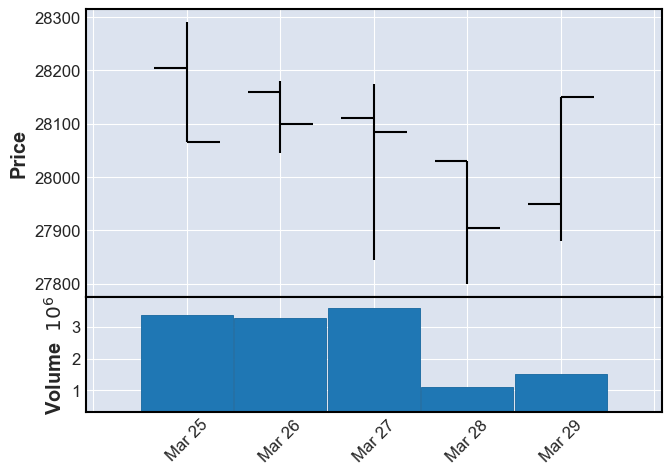

상승?0 횡보?1 하락?21
376 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-04-01  3350239  28500  28215  28215  28450  (2019, 14)
2019-04-02  7927916  28650  28450  28450  28565  (2019, 14)
2019-04-03  1707718  28985  28610  28545  28985  (2019, 14)
2019-04-04  2387402  29205  28980  28940  29025  (2019, 14)
2019-04-05  1392288  29170  29045  29005  29080  (2019, 14)


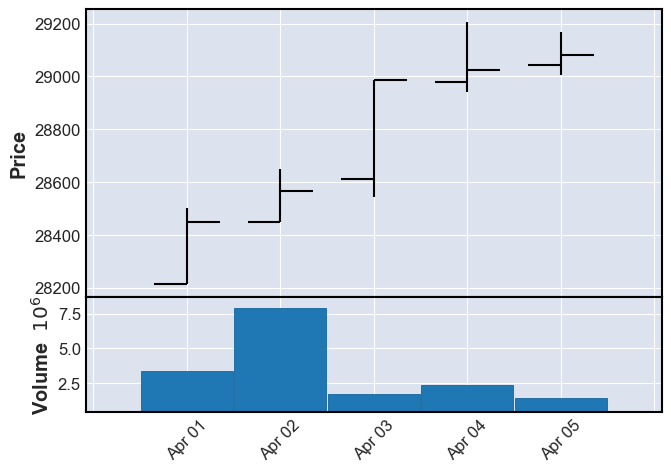

상승?0 횡보?1 하락?20
377 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-04-08  4708083  29215  29090  28935  29015  (2019, 15)
2019-04-09  1692615  29210  29020  28950  29055  (2019, 15)
2019-04-10  1573035  29215  29000  28940  29195  (2019, 15)
2019-04-11  1736815  29275  29240  29050  29140  (2019, 15)
2019-04-12   460374  29280  29100  28990  29210  (2019, 15)


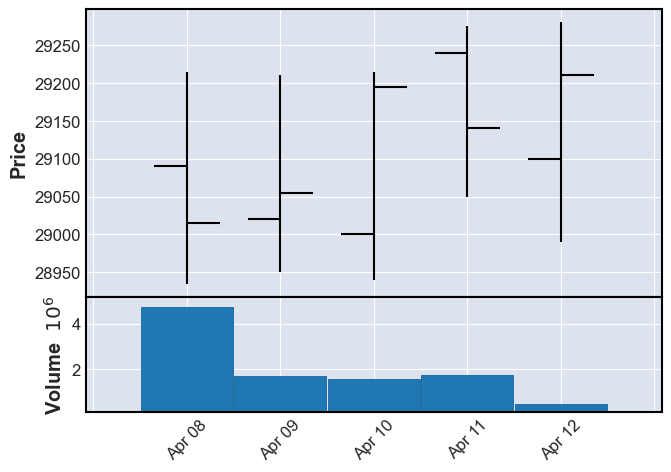

상승?0 횡보?1 하락?20
378 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-04-15  1881387  29485  29335  29320  29350  (2019, 16)
2019-04-16  5568784  29475  29315  29290  29450  (2019, 16)
2019-04-17  1840444  29510  29455  29390  29435  (2019, 16)
2019-04-18  3298158  29485  29455  28925  28955  (2019, 16)
2019-04-19  1981507  29130  29095  28960  28965  (2019, 16)


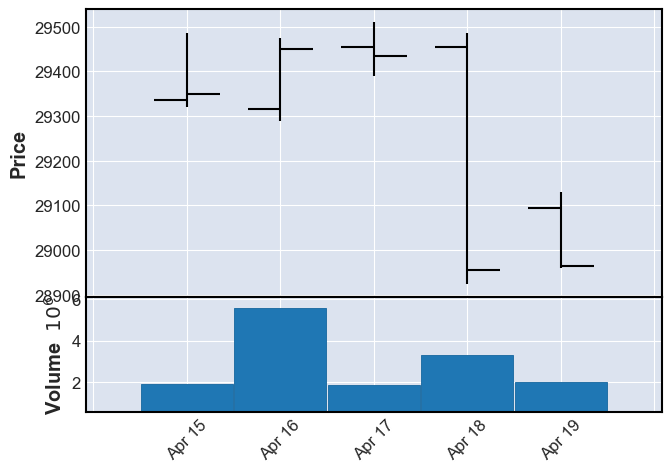

상승?0 횡보?1 하락?22
379 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-04-22  1280478  29150  28995  28845  28975  (2019, 17)
2019-04-23  3261610  29075  28970  28920  29020  (2019, 17)
2019-04-24  3151055  29155  29135  28585  28730  (2019, 17)
2019-04-25  1100169  28800  28660  28600  28670  (2019, 17)
2019-04-26  1690197  28615  28585  28350  28490  (2019, 17)


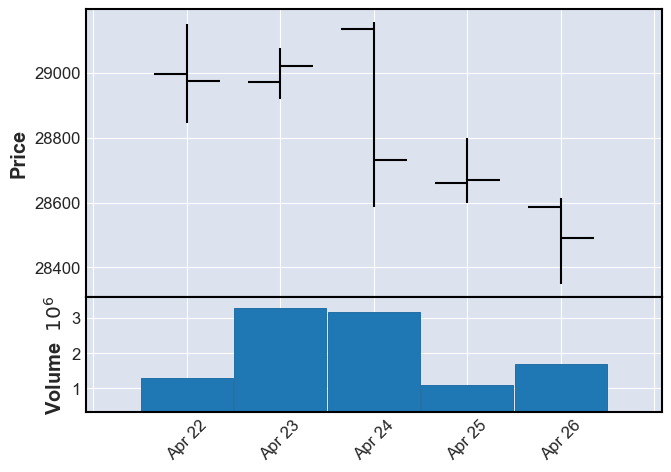

상승?0 횡보?1 하락?22
380 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-04-29  1538809  28680  28305  28180  28680  (2019, 18)
2019-04-30  2551604  28655  28655  28250  28505  (2019, 18)
2019-05-02  3677764  28690  28485  28255  28615  (2019, 18)
2019-05-03  1839069  28595  28595  28305  28355  (2019, 18)


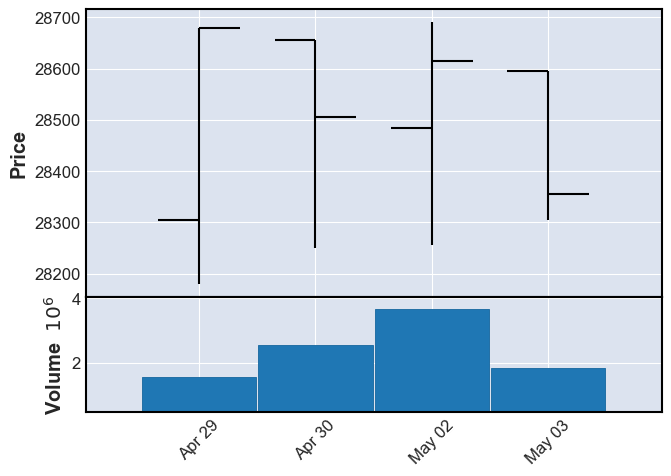

상승?0 횡보?1 하락?22
381 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-05-07  2256748  28165  28135  27870  28150  (2019, 19)
2019-05-08  2274001  28170  27800  27765  28015  (2019, 19)
2019-05-09  2702425  27975  27975  27150  27180  (2019, 19)
2019-05-10  2719364  27435  27300  26980  27230  (2019, 19)


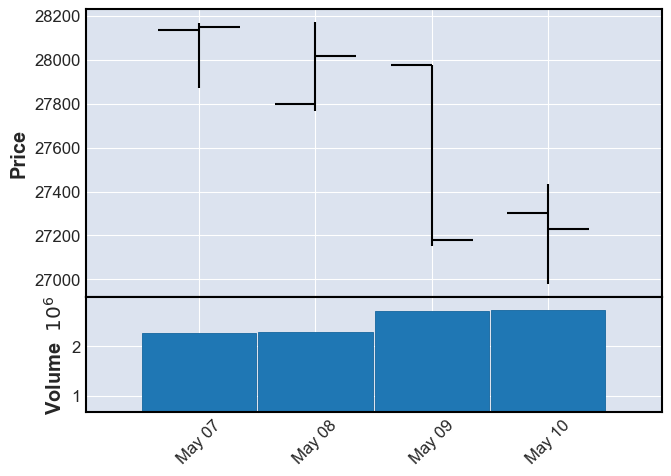

상승?0 횡보?1 하락?22
382 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-05-13  2176803  27200  27050  26870  26915  (2019, 20)
2019-05-14  1745202  27050  26650  26600  26895  (2019, 20)
2019-05-15  2602252  27090  26865  26755  26985  (2019, 20)
2019-05-16  3840011  26960  26880  26550  26615  (2019, 20)
2019-05-17  2420008  26805  26770  26400  26450  (2019, 20)


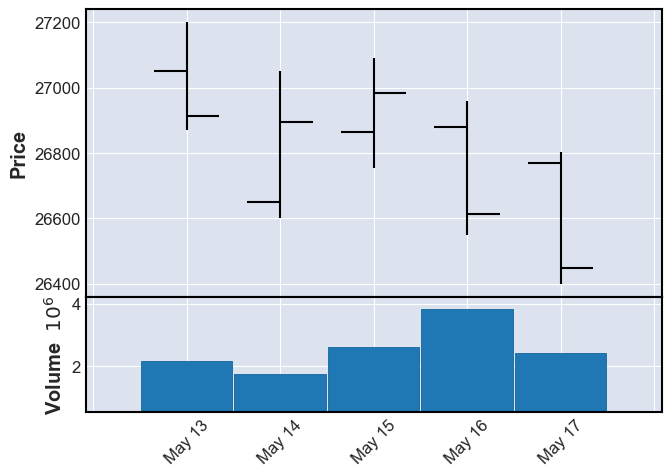

상승?0 횡보?1 하락?22
383 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-05-20  2216655  26760  26605  26450  26500  (2019, 21)
2019-05-21  1975535  26860  26495  26485  26645  (2019, 21)
2019-05-22  2165387  26765  26720  26405  26695  (2019, 21)
2019-05-23  1614040  26715  26675  26465  26655  (2019, 21)
2019-05-24  2109164  26630  26550  26335  26465  (2019, 21)


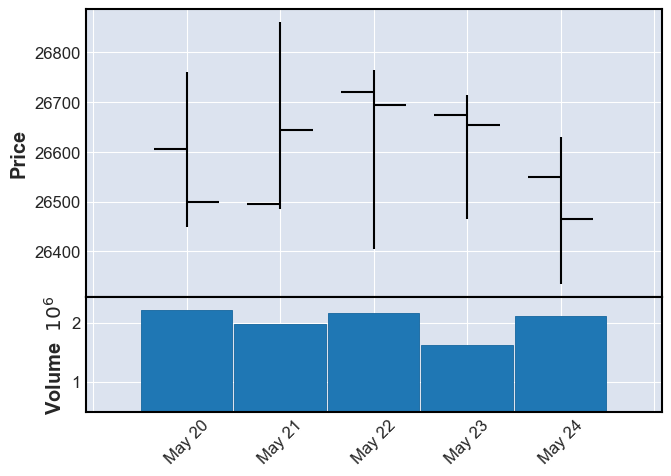

상승?0 횡보?1 하락?21
384 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-05-27  1111849  26600  26440  26350  26490  (2019, 22)
2019-05-28  1955849  26615  26485  26370  26525  (2019, 22)
2019-05-29  2679396  26525  26525  26050  26165  (2019, 22)
2019-05-30  1288711  26425  26165  26155  26415  (2019, 22)
2019-05-31  1784238  26525  26320  26190  26355  (2019, 22)


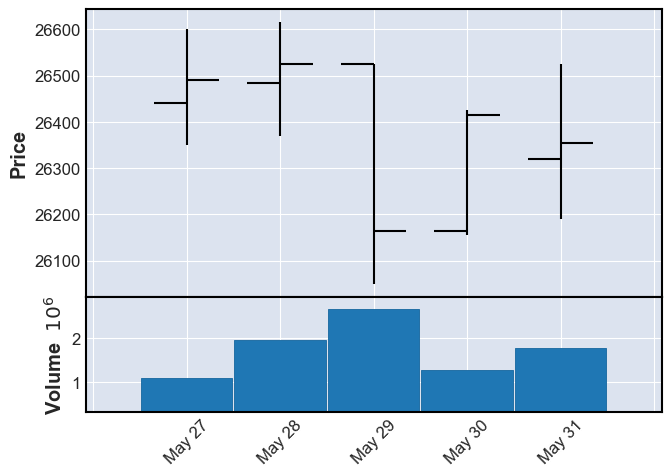

상승?0 횡보?1 하락?21
385 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-06-03  1915947  26835  26260  26215  26815  (2019, 23)
2019-06-04  1839841  26840  26760  26685  26765  (2019, 23)
2019-06-05  2606238  27060  26970  26750  26785  (2019, 23)
2019-06-07  2568822  26995  26785  26615  26790  (2019, 23)


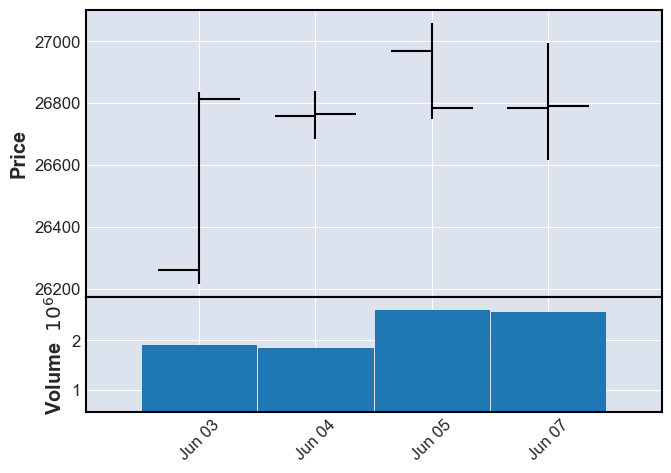

상승?0 횡보?1 하락?21
386 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-06-10  2541169  27245  26900  26870  27170  (2019, 24)
2019-06-11  1281706  27380  27145  27115  27345  (2019, 24)
2019-06-12  1350368  27425  27345  27220  27255  (2019, 24)
2019-06-13  1056138  27245  27090  26825  27015  (2019, 24)
2019-06-14  1824112  27155  27015  26875  27010  (2019, 24)


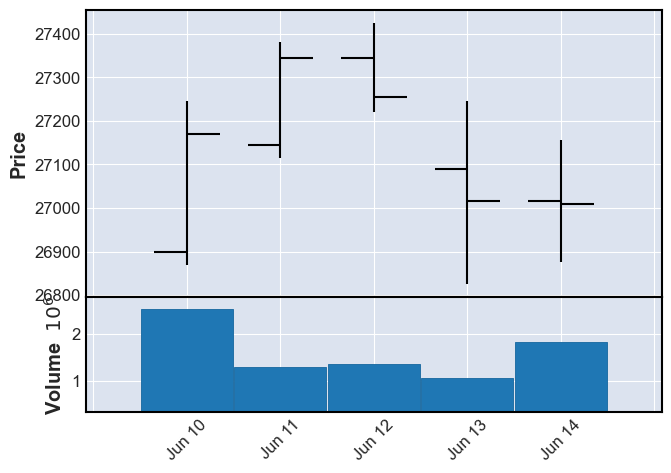

상승?0 횡보?1 하락?21
387 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-06-17  1811576  27160  26990  26935  27020  (2019, 25)
2019-06-18  1597571  27200  27010  26985  27165  (2019, 25)
2019-06-19  3076252  27570  27440  27415  27500  (2019, 25)
2019-06-20  2332483  27610  27485  27455  27595  (2019, 25)
2019-06-21  1132437  27630  27610  27465  27520  (2019, 25)


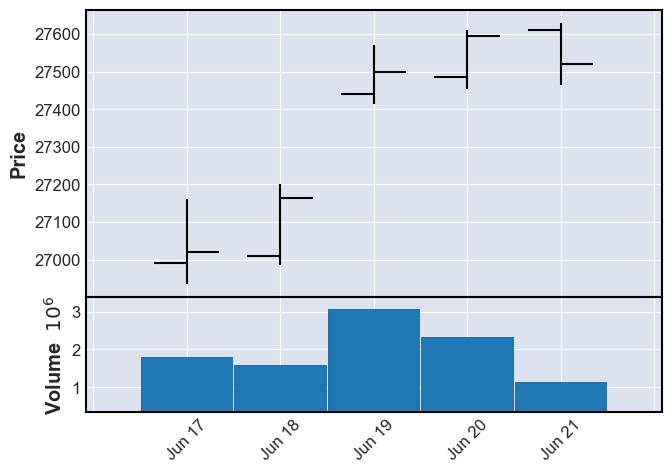

상승?0 횡보?1 하락?20
388 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-06-24  1814122  27675  27595  27530  27570  (2019, 26)
2019-06-25  1659325  27705  27530  27430  27530  (2019, 26)
2019-06-26  1997795  27625  27495  27475  27545  (2019, 26)
2019-06-27  2037274  27940  27615  27580  27880  (2019, 26)
2019-06-28  1958471  27935  27880  27760  27850  (2019, 26)


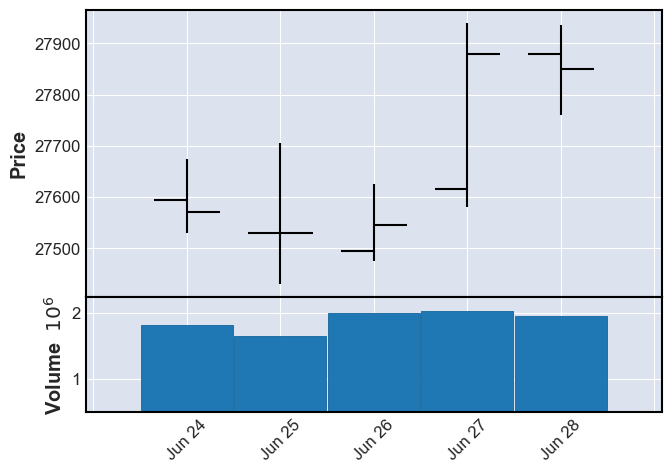

상승?0 횡보?1 하락?20
389 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-07-01  1745919  28100  27970  27795  27835  (2019, 27)
2019-07-02  1543158  27835  27670  27555  27675  (2019, 27)
2019-07-03  1508258  27745  27655  27280  27330  (2019, 27)
2019-07-04  1668596  27555  27350  27290  27550  (2019, 27)
2019-07-05  1291686  27615  27570  27350  27515  (2019, 27)


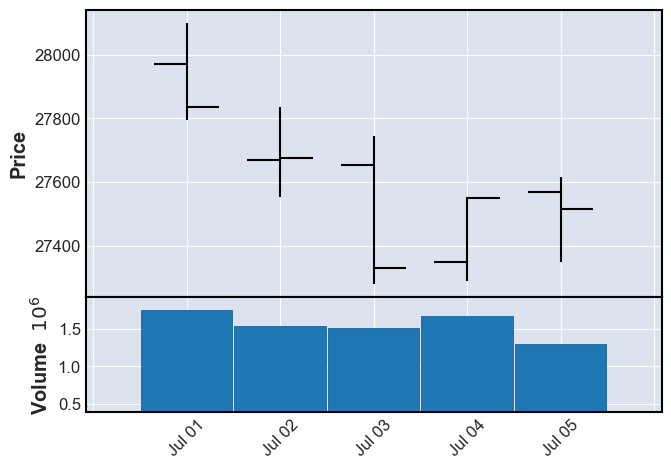

상승?0 횡보?1 하락?22
390 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-07-08  2776500  27375  27375  26930  26960  (2019, 28)
2019-07-09  2293982  27110  27020  26875  26875  (2019, 28)
2019-07-10  2120135  27115  27000  26975  26985  (2019, 28)
2019-07-11  2888816  27390  27150  27135  27320  (2019, 28)
2019-07-12  1970988  27410  27295  27225  27375  (2019, 28)


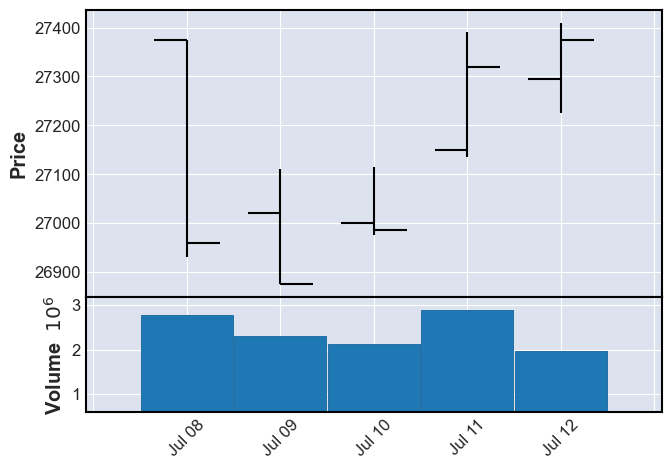

상승?0 횡보?1 하락?20
391 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-07-15   784274  27420  27290  27195  27360  (2019, 29)
2019-07-16  1605490  27540  27385  27315  27490  (2019, 29)
2019-07-17   985509  27340  27315  27140  27235  (2019, 29)
2019-07-18   908825  27260  27195  27070  27175  (2019, 29)
2019-07-19  1682694  27615  27310  27310  27570  (2019, 29)


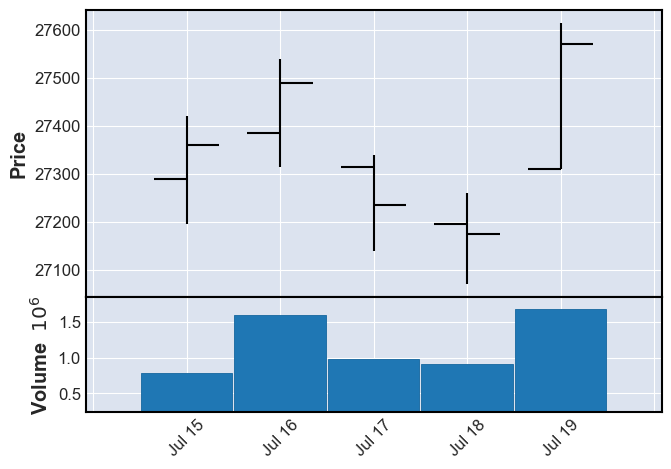

상승?0 횡보?1 하락?20
392 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-07-22  1449652  27625  27480  27440  27550  (2019, 30)
2019-07-23  2177028  27755  27575  27565  27680  (2019, 30)
2019-07-24  1669699  27740  27620  27375  27410  (2019, 30)
2019-07-25  1407117  27540  27485  27225  27370  (2019, 30)
2019-07-26  2151217  27345  27260  27170  27315  (2019, 30)


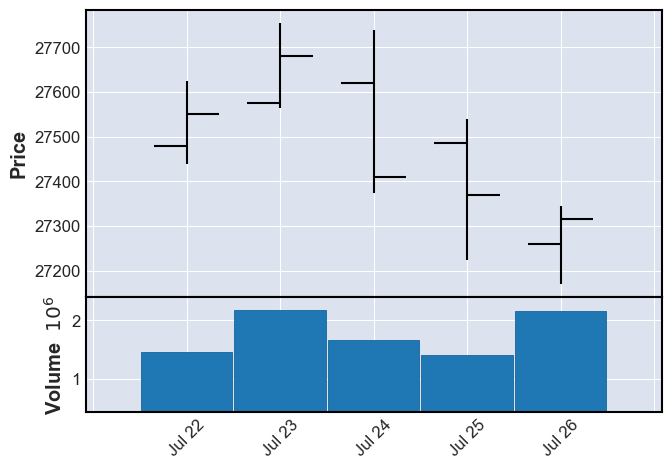

상승?0 횡보?1 하락?22
393 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-07-29  4283700  27290  27290  26840  26925  (2019, 31)
2019-07-30  1372456  27025  26865  26865  26935  (2019, 31)
2019-07-31  2070388  26965  26935  26575  26680  (2019, 31)
2019-08-01  2366634  26780  26545  26485  26615  (2019, 31)
2019-08-02  2076998  26410  26340  26215  26340  (2019, 31)


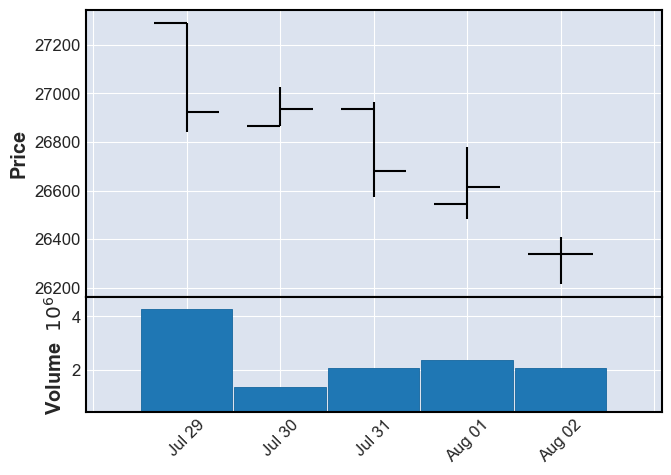

상승?0 횡보?1 하락?22
394 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-08-05  4679464  26255  26255  25735  25780  (2019, 32)
2019-08-06  4988736  25740  25205  25120  25405  (2019, 32)
2019-08-07  2673964  25520  25415  25155  25260  (2019, 32)
2019-08-08  1290820  25570  25485  25275  25360  (2019, 32)
2019-08-09  2554944  25650  25520  25485  25530  (2019, 32)


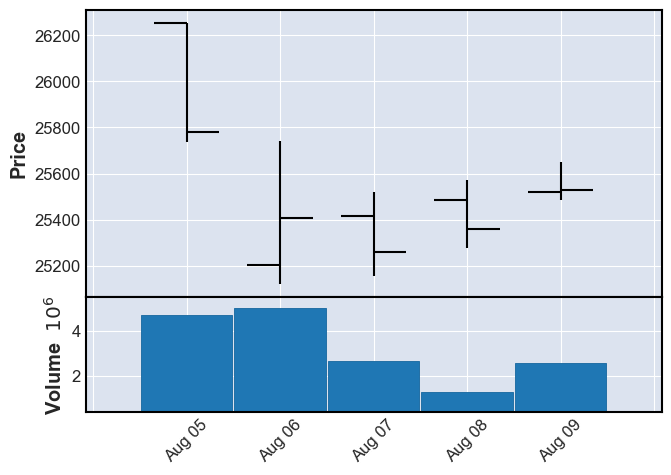

상승?0 횡보?1 하락?22
395 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-08-12  1324571  25665  25595  25475  25590  (2019, 33)
2019-08-13  1789356  25480  25475  25305  25320  (2019, 33)
2019-08-14  2803267  25710  25580  25480  25495  (2019, 33)
2019-08-16  1523799  25405  25330  25175  25405  (2019, 33)


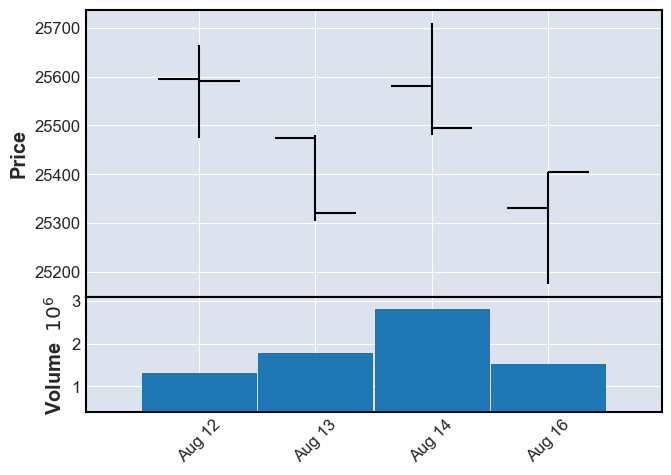

상승?0 횡보?1 하락?22
396 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-08-19  1408199  25610  25580  25465  25575  (2019, 34)
2019-08-20  2764813  25865  25575  25525  25810  (2019, 34)
2019-08-21  2144107  25960  25755  25755  25875  (2019, 34)
2019-08-22  1965781  25885  25885  25640  25680  (2019, 34)
2019-08-23  1325458  25700  25555  25525  25650  (2019, 34)


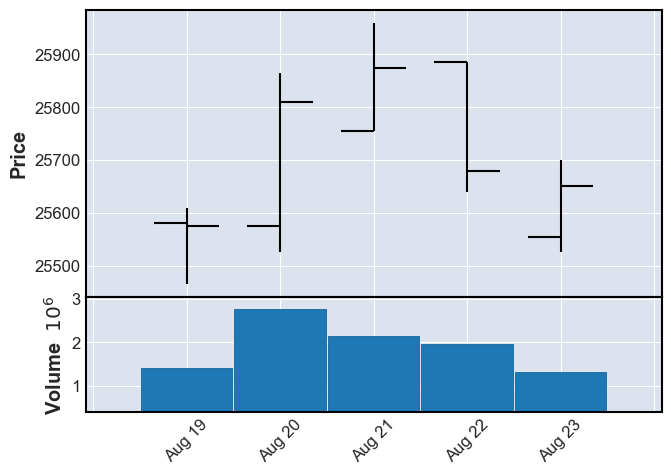

상승?0 횡보?1 하락?21
397 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-08-26  2771732  25335  25070  25070  25265  (2019, 35)
2019-08-27  1829195  25505  25390  25290  25355  (2019, 35)
2019-08-28  1649189  25610  25425  25385  25580  (2019, 35)
2019-08-29  1214320  25625  25600  25395  25460  (2019, 35)
2019-08-30  2206538  25980  25610  25610  25905  (2019, 35)


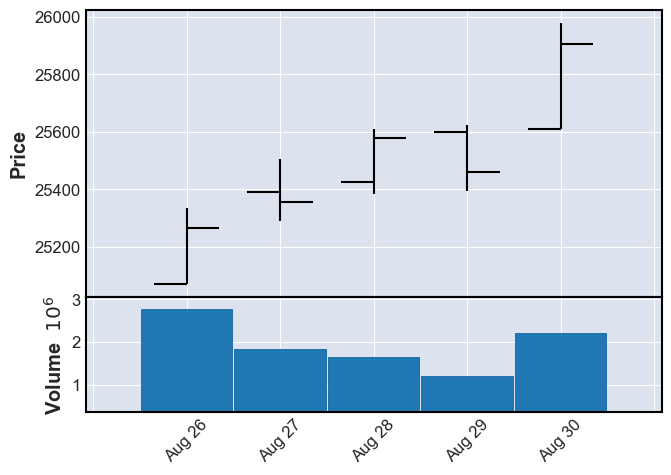

상승?0 횡보?1 하락?20
398 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-09-02  1321229  25985  25815  25805  25915  (2019, 36)
2019-09-03  1632642  25985  25850  25775  25820  (2019, 36)
2019-09-04  1996036  26195  25770  25770  26195  (2019, 36)
2019-09-05  2055874  26620  26240  26235  26430  (2019, 36)
2019-09-06   952993  26625  26580  26490  26560  (2019, 36)


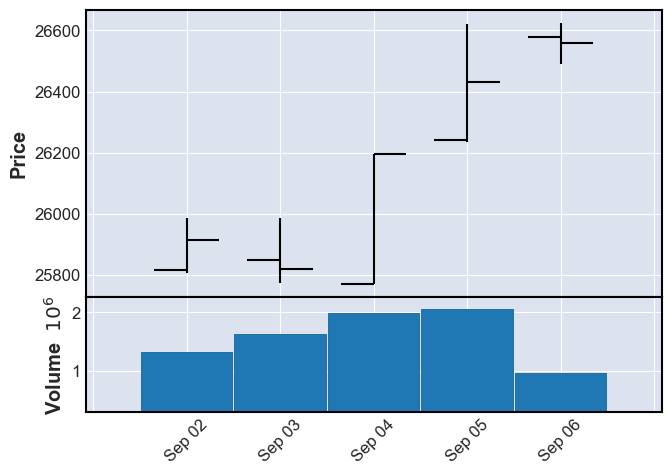

상승?0 횡보?1 하락?20
399 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-09-09   992793  26875  26630  26610  26750  (2019, 37)
2019-09-10  1450583  26910  26765  26750  26885  (2019, 37)
2019-09-11  1174790  27135  27050  26960  27100  (2019, 37)


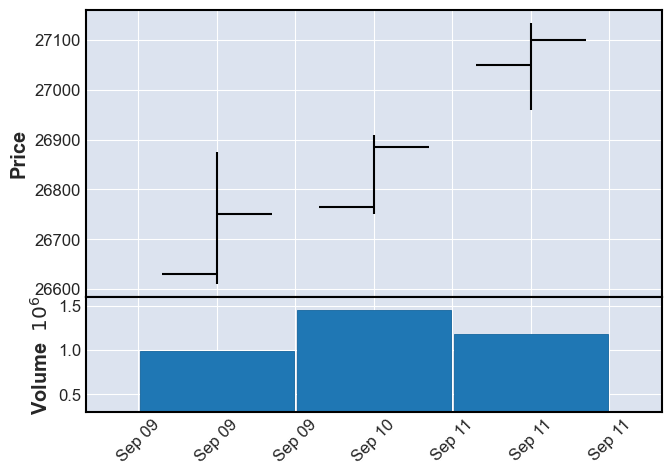

상승?0 횡보?1 하락?20
400 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-09-16  1896664  27190  27100  26975  27190  (2019, 38)
2019-09-17  2184514  27235  27185  27090  27165  (2019, 38)
2019-09-18  2306718  27370  27220  27115  27305  (2019, 38)
2019-09-19  2263244  27605  27305  27285  27495  (2019, 38)
2019-09-20  1487335  27675  27465  27440  27655  (2019, 38)


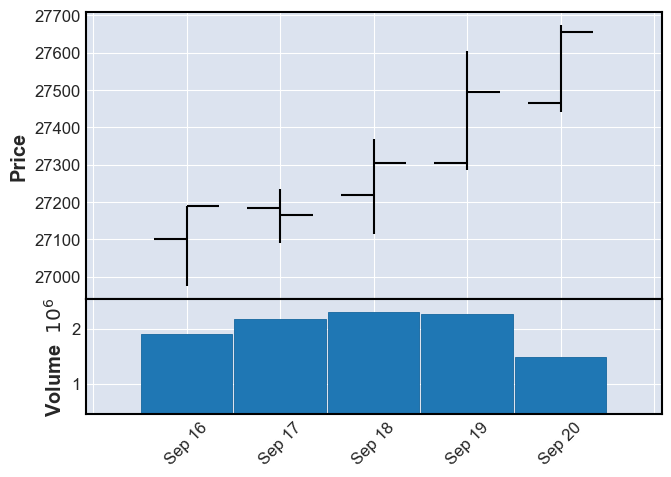

상승?0 횡보?1 하락?20
401 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-09-23  1945389  27700  27580  27570  27665  (2019, 39)
2019-09-24  1802688  27820  27670  27575  27815  (2019, 39)
2019-09-25  1488283  27715  27690  27435  27450  (2019, 39)
2019-09-26  1860979  27650  27530  27355  27490  (2019, 39)
2019-09-27  1139922  27395  27395  27120  27205  (2019, 39)


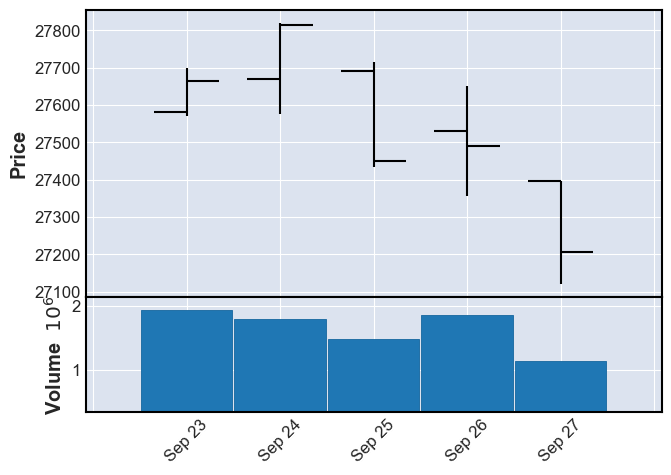

상승?0 횡보?1 하락?22
402 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-09-30  1957466  27450  27140  27090  27430  (2019, 40)
2019-10-01  1357441  27620  27385  27360  27495  (2019, 40)
2019-10-02  1631185  27315  27220  26925  26925  (2019, 40)
2019-10-04  1246638  27090  26830  26815  26815  (2019, 40)


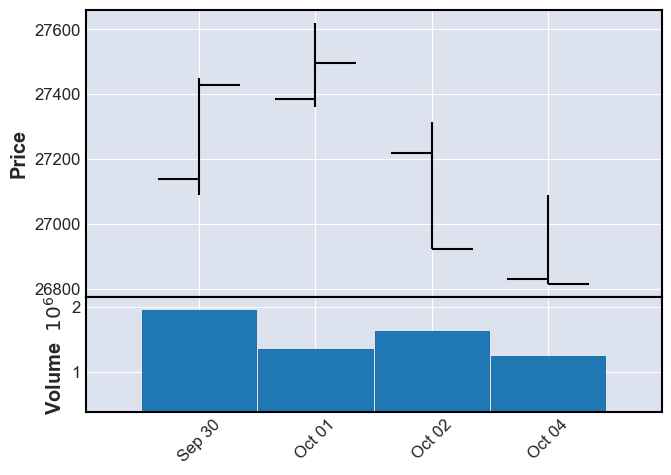

상승?0 횡보?1 하락?22
403 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-10-07  2024915  27040  26970  26775  26865  (2019, 41)
2019-10-08  2222599  27250  26915  26905  27240  (2019, 41)
2019-10-10  2798907  27155  27015  26690  27040  (2019, 41)
2019-10-11  2651315  27335  27280  27150  27230  (2019, 41)


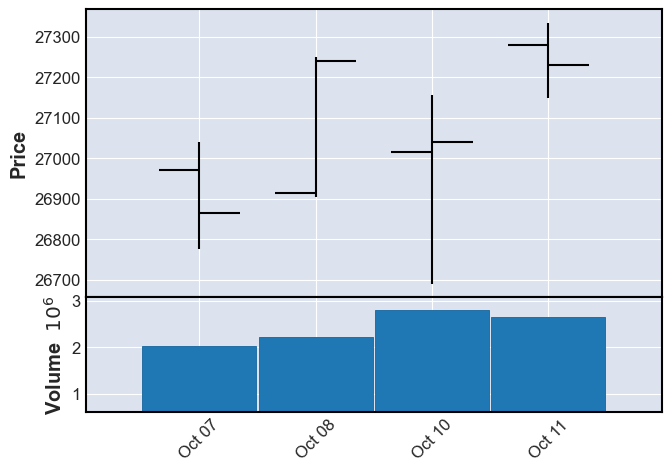

상승?0 횡보?1 하락?20
404 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-10-14  1579825  27690  27690  27490  27515  (2019, 42)
2019-10-15  1775477  27595  27485  27480  27550  (2019, 42)
2019-10-16  1265188  27840  27700  27615  27715  (2019, 42)
2019-10-17  1465587  27755  27740  27555  27615  (2019, 42)
2019-10-18  1716140  27785  27680  27320  27350  (2019, 42)


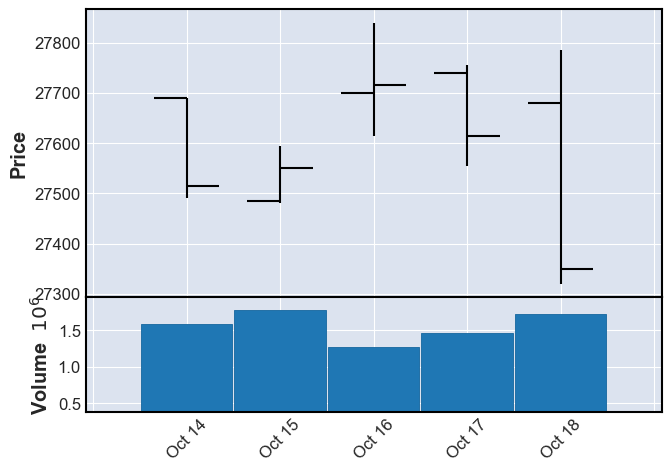

상승?0 횡보?1 하락?21
405 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-10-21  1513954  27500  27415  27375  27480  (2019, 43)
2019-10-22  2462457  27895  27645  27605  27850  (2019, 43)
2019-10-23  2019932  27830  27795  27630  27695  (2019, 43)
2019-10-24  2314126  27900  27900  27525  27760  (2019, 43)
2019-10-25  5027740  27855  27855  27665  27805  (2019, 43)


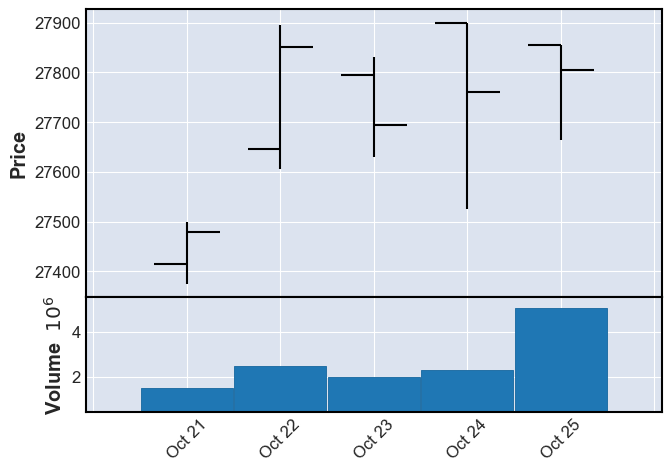

상승?0 횡보?1 하락?20
406 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-10-28  1738823  28030  27940  27835  27895  (2019, 44)
2019-10-29  2979429  28035  28000  27795  27835  (2019, 44)
2019-10-30  1933140  27805  27800  27545  27575  (2019, 44)
2019-10-31  2803543  27935  27770  27620  27660  (2019, 44)
2019-11-01  2148846  27870  27655  27595  27855  (2019, 44)


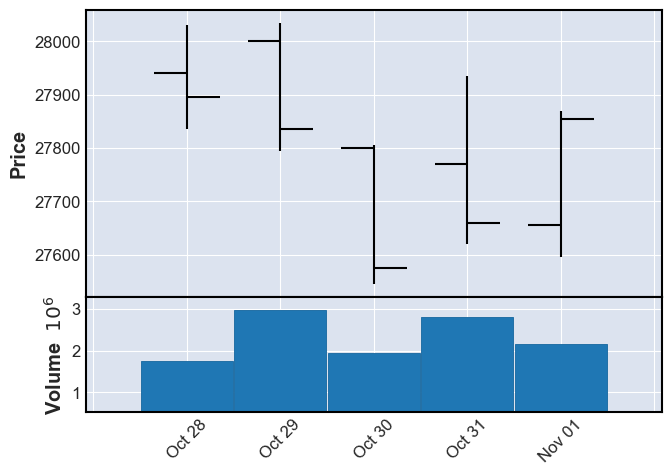

상승?0 횡보?1 하락?21
407 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-11-04  2681220  28300  28000  28000  28285  (2019, 45)
2019-11-05  2034807  28480  28300  28270  28465  (2019, 45)
2019-11-06  4102280  28665  28465  28425  28495  (2019, 45)
2019-11-07  4022304  28520  28445  28350  28440  (2019, 45)
2019-11-08  1798357  28645  28610  28325  28365  (2019, 45)


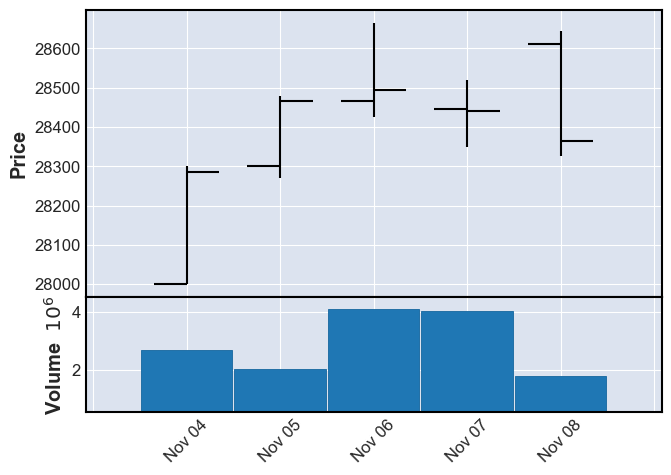

상승?0 횡보?1 하락?21
408 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-11-11  5087191  28365  28365  28080  28120  (2019, 46)
2019-11-12  4155211  28385  28120  28120  28385  (2019, 46)
2019-11-13  3885865  28295  28295  28095  28140  (2019, 46)
2019-11-14  4310895  28390  28215  28150  28390  (2019, 46)
2019-11-15  2414629  28810  28445  28375  28770  (2019, 46)


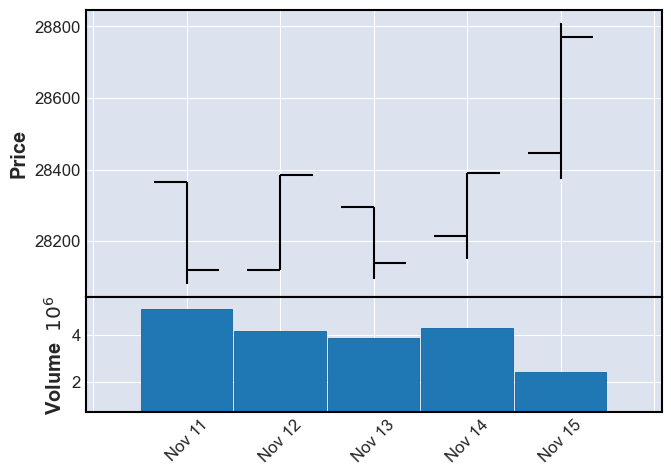

상승?0 횡보?1 하락?20
409 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-11-18  1690678  28785  28765  28655  28755  (2019, 47)
2019-11-19  2357282  28660  28605  28415  28625  (2019, 47)
2019-11-20  2494968  28580  28580  28245  28275  (2019, 47)
2019-11-21  1842509  28245  28095  27770  27860  (2019, 47)
2019-11-22  1863131  28025  27870  27865  27975  (2019, 47)


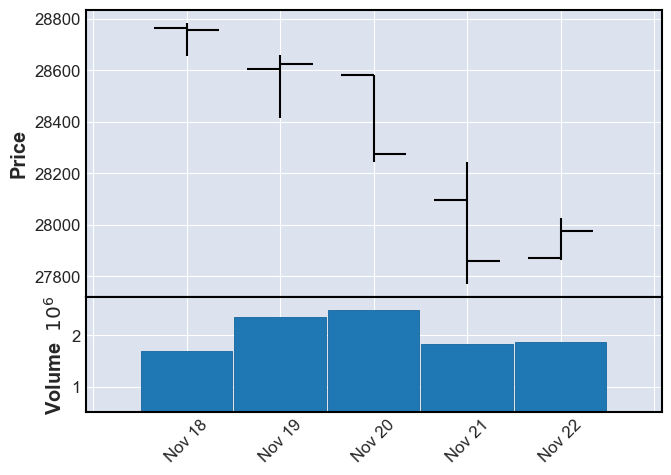

상승?0 횡보?1 하락?22
410 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-11-25  1786385  28380  28140  28140  28270  (2019, 48)
2019-11-26  2027268  28525  28330  28290  28290  (2019, 48)
2019-11-27  1602300  28475  28380  28180  28335  (2019, 48)
2019-11-28  1253840  28310  28310  28145  28215  (2019, 48)
2019-11-29  2140787  28275  28260  27690  27730  (2019, 48)


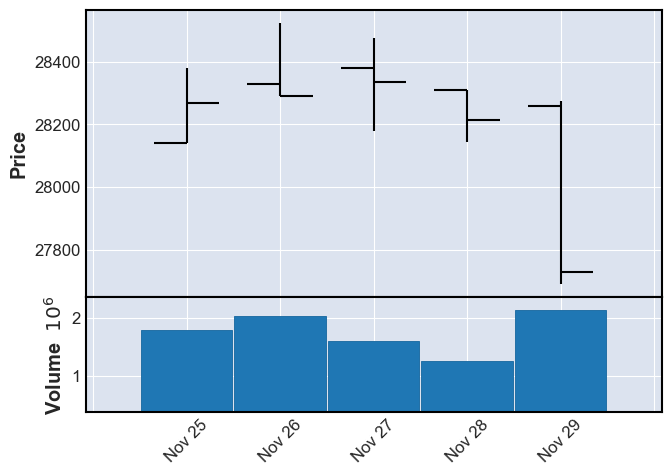

상승?0 횡보?1 하락?22
411 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-12-02  1416397  28005  28005  27775  27810  (2019, 49)
2019-12-03  1426685  27710  27585  27445  27665  (2019, 49)
2019-12-04  1422635  27525  27480  27335  27490  (2019, 49)
2019-12-05  2904786  27700  27615  27300  27420  (2019, 49)
2019-12-06  1788732  27760  27520  27520  27720  (2019, 49)


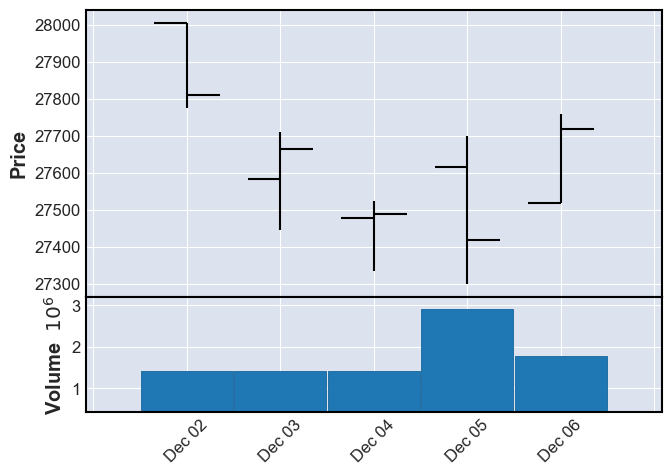

상승?0 횡보?1 하락?21
412 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-12-09  1036660  27940  27870  27765  27850  (2019, 50)
2019-12-10  1151943  28020  27850  27745  28000  (2019, 50)
2019-12-11  1184019  28145  27990  27920  28130  (2019, 50)
2019-12-12  1570671  28635  28280  28280  28635  (2019, 50)
2019-12-13  1233556  29085  28980  28940  29055  (2019, 50)


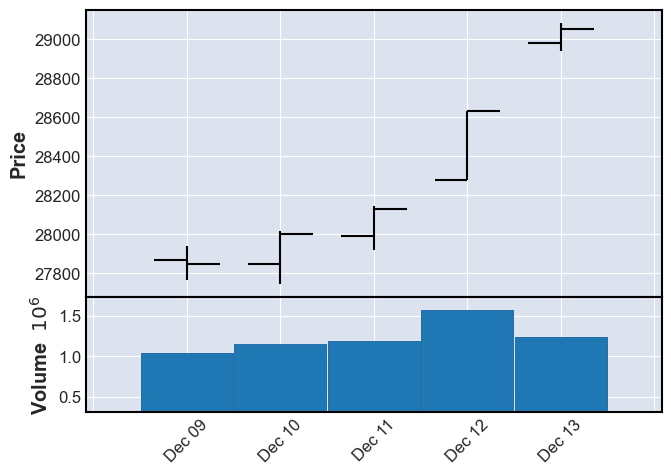

상승?0 횡보?1 하락?20
413 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-12-16  1530710  29155  29060  29030  29045  (2019, 51)
2019-12-17  1449776  29500  29165  29120  29455  (2019, 51)
2019-12-18  1198695  29630  29480  29380  29440  (2019, 51)
2019-12-19  1273022  29625  29545  29340  29470  (2019, 51)
2019-12-20   750667  29615  29590  29440  29525  (2019, 51)


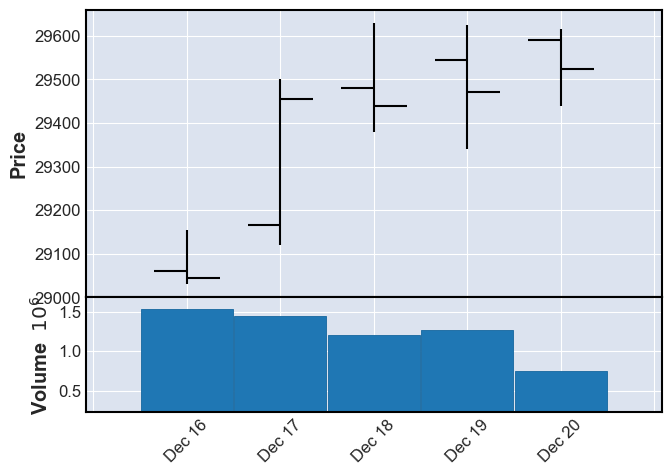

상승?0 횡보?1 하락?20
414 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2019-12-23  1055856  29670  29625  29450  29545  (2019, 52)
2019-12-24  2950494  29600  29600  29320  29355  (2019, 52)
2019-12-26  1895375  29450  29365  29250  29450  (2019, 52)
2019-12-27  1770965  30150  29655  29555  29930  (2019, 52)


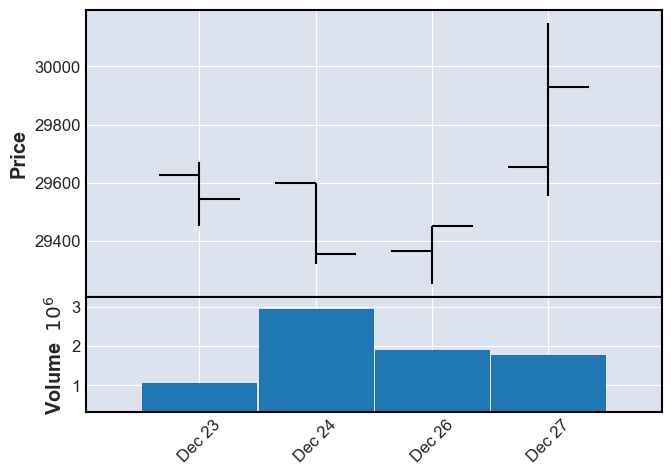

상승?0 횡보?1 하락?20
415 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2019-12-30  1756221  29995  29930  29820  29820  (2020, 1)
2020-01-02  9817238  29995  29995  29435  29475  (2020, 1)
2020-01-03  4539054  29905  29660  29330  29480  (2020, 1)


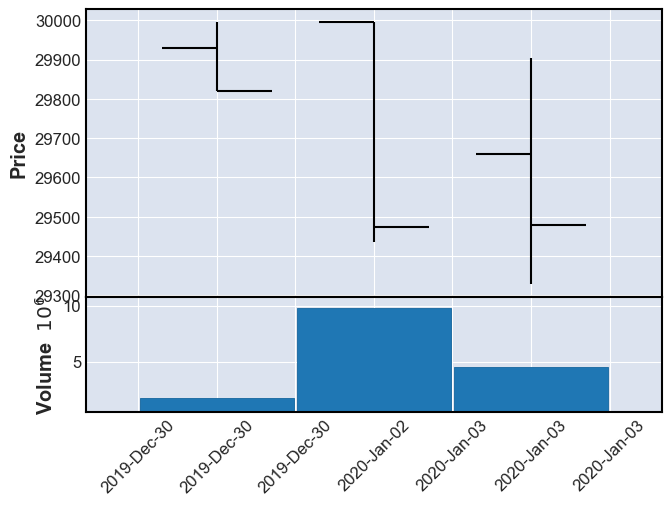

상승?0 횡보?1 하락?22
416 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-01-06   886193  29365  29160  29160  29280  (2020, 2)
2020-01-07  7663360  29665  29420  29385  29555  (2020, 2)
2020-01-08  1403483  29520  29480  29175  29365  (2020, 2)
2020-01-09   969909  29850  29685  29660  29850  (2020, 2)
2020-01-10   695589  30130  29965  29850  30090  (2020, 2)


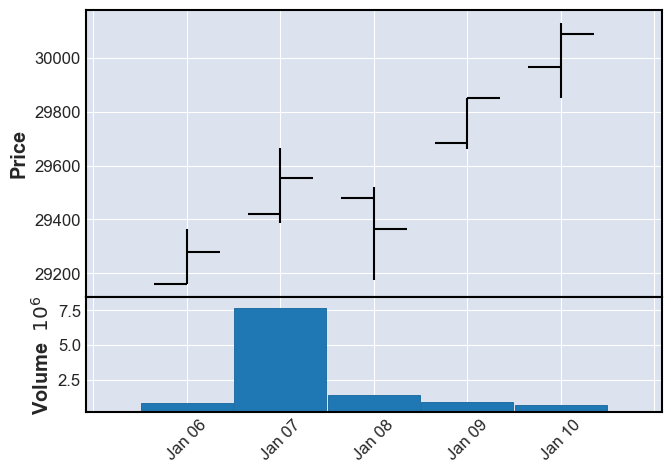

상승?0 횡보?1 하락?20
417 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-01-13  1936538  30425  30180  30080  30425  (2020, 3)
2020-01-14  8293335  30755  30515  30515  30555  (2020, 3)
2020-01-15   659181  30520  30475  30320  30360  (2020, 3)
2020-01-16  1295717  30700  30360  30345  30700  (2020, 3)
2020-01-17  1793865  31010  30885  30680  30770  (2020, 3)


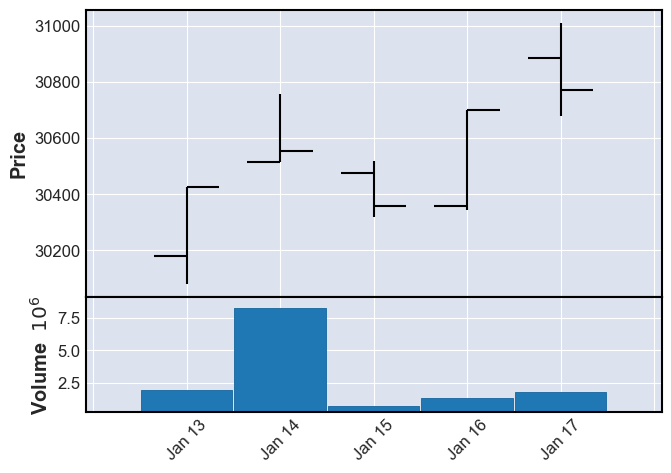

상승?0 횡보?1 하락?20
418 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-01-20  2512473  31155  30875  30875  30995  (2020, 4)
2020-01-21   858424  31120  31120  30615  30615  (2020, 4)
2020-01-22  7407967  31065  30540  30540  31040  (2020, 4)
2020-01-23   605016  30875  30850  30605  30635  (2020, 4)


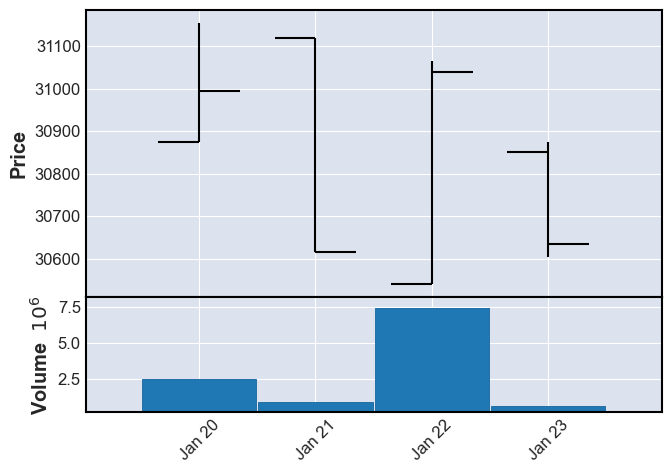

상승?0 횡보?1 하락?22
419 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-01-28  2624777  30075  29930  29560  29725  (2020, 5)
2020-01-29   673669  29965  29820  29660  29835  (2020, 5)
2020-01-30  1320353  29800  29800  29105  29210  (2020, 5)
2020-01-31   609383  29490  29380  28880  28885  (2020, 5)


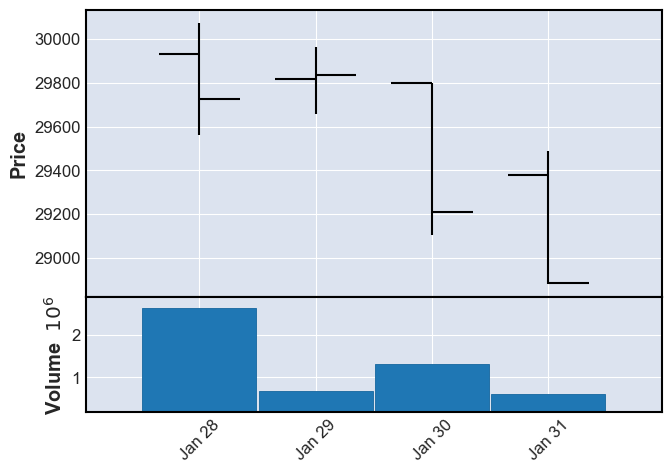

상승?0 횡보?1 하락?22
420 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-02-03  1883118  29005  28520  28415  28895  (2020, 6)
2020-02-04  2564195  29475  28900  28885  29405  (2020, 6)
2020-02-05  1746151  29765  29720  29390  29540  (2020, 6)
2020-02-06  1232895  30470  29845  29835  30420  (2020, 6)
2020-02-07  1290556  30350  30350  29990  30185  (2020, 6)


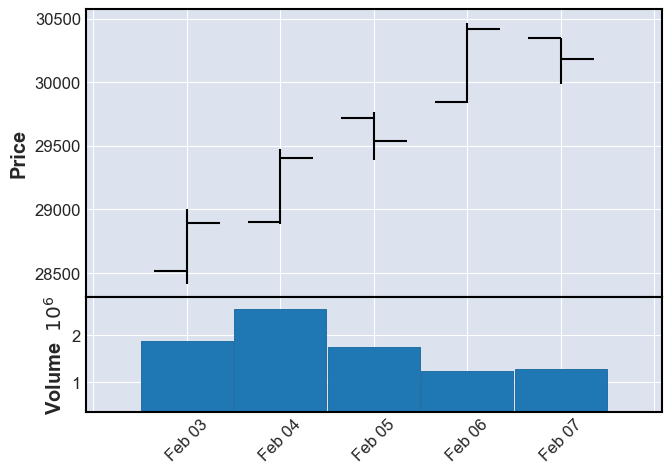

상승?0 횡보?1 하락?20
421 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-02-10   786534  30035  29800  29705  30015  (2020, 7)
2020-02-11  1269514  30480  30090  30065  30300  (2020, 7)
2020-02-12   817319  30600  30270  30180  30550  (2020, 7)
2020-02-13  1513386  30790  30620  30405  30465  (2020, 7)
2020-02-14  1789171  30775  30445  30270  30655  (2020, 7)


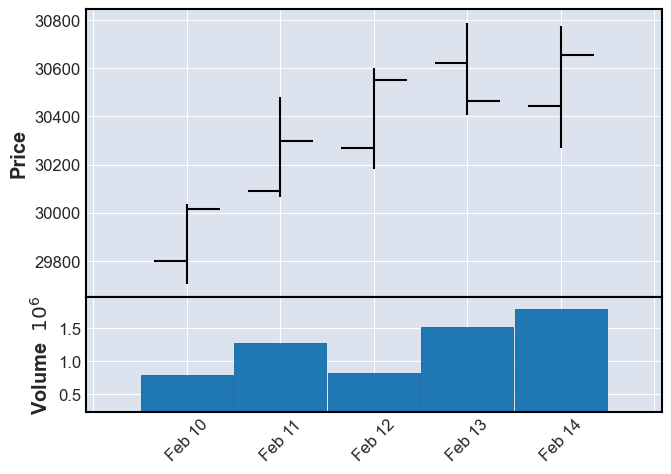

상승?0 횡보?1 하락?20
422 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-02-17   769744  30760  30640  30475  30650  (2020, 8)
2020-02-18  1557780  30475  30390  30105  30160  (2020, 8)
2020-02-19  1998519  30370  30305  29920  30200  (2020, 8)
2020-02-20  2223861  30480  30390  29870  30045  (2020, 8)
2020-02-21  2093872  29880  29595  29540  29605  (2020, 8)


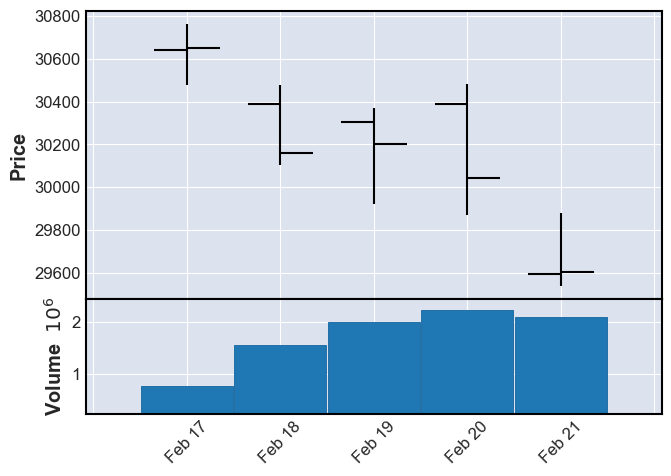

상승?0 횡보?1 하락?22
423 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2020-02-24  6869467  29085  28985  28485  28510  (2020, 9)
2020-02-25  2526242  28825  28400  28375  28810  (2020, 9)
2020-02-26  3552372  28575  28355  28185  28405  (2020, 9)
2020-02-27  5289466  28475  28295  28010  28095  (2020, 9)
2020-02-28  6252986  27780  27640  27140  27210  (2020, 9)


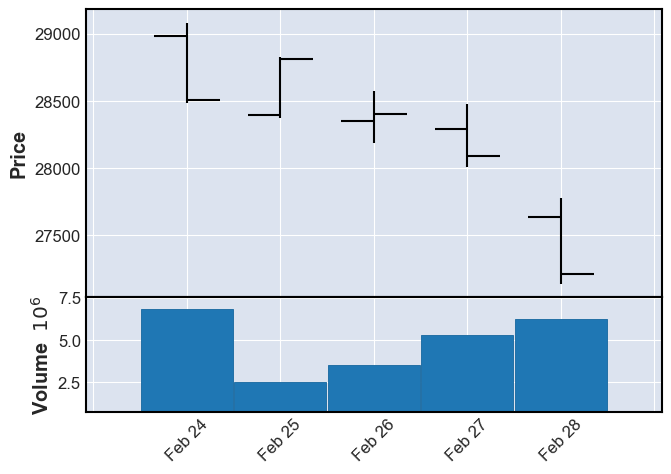

상승?0 횡보?1 하락?22
424 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-03-02  4100838  27615  27310  26990  27455  (2020, 10)
2020-03-03  4015521  28140  28075  27455  27590  (2020, 10)
2020-03-04  1170349  28260  27390  27390  28175  (2020, 10)
2020-03-05  1314269  28585  28370  28145  28475  (2020, 10)
2020-03-06  2550050  28205  28205  27755  27900  (2020, 10)


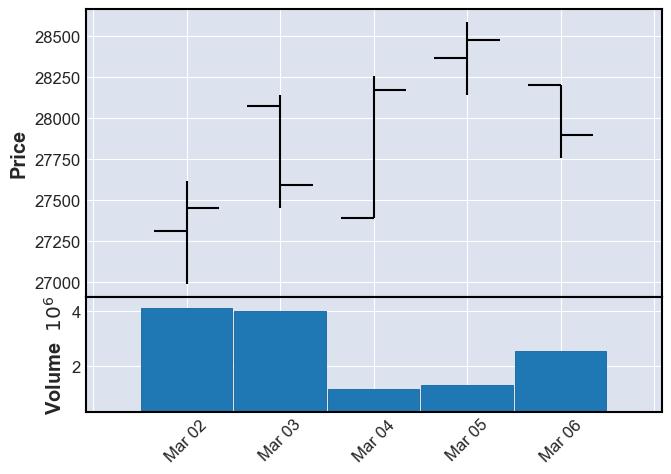

상승?0 횡보?1 하락?20
425 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-03-09  3631544  27130  27050  26535  26720  (2020, 11)
2020-03-10  2321726  26950  26535  26505  26850  (2020, 11)
2020-03-11  3532878  26880  26830  25955  26075  (2020, 11)
2020-03-12  8874575  25915  25915  24730  25130  (2020, 11)
2020-03-13  9031322  25055  23700  23100  24515  (2020, 11)


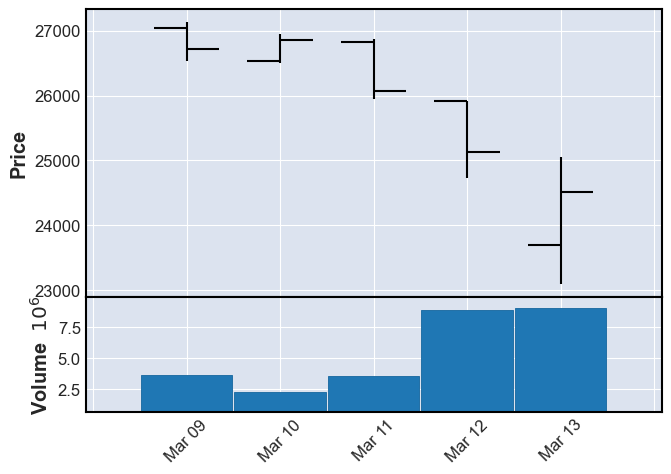

상승?0 횡보?1 하락?22
426 done
              Volume   High   Open    Low  Close         ynw
tdate                                                       
2020-03-16   7639736  25000  24900  23590  23645  (2020, 12)
2020-03-17   5883763  23835  22600  22505  23090  (2020, 12)
2020-03-18   6252936  23310  23160  21775  21775  (2020, 12)
2020-03-19  10104416  22500  22315  19965  20265  (2020, 12)
2020-03-20   8407183  21800  20955  20410  21770  (2020, 12)


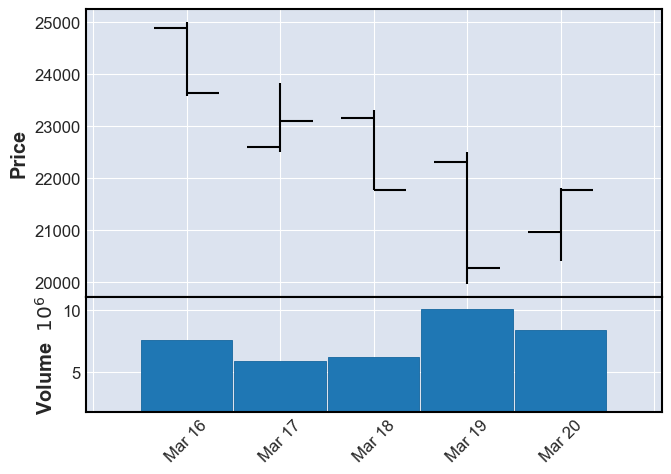

상승?0 횡보?1 하락?22
427 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-03-23  7835339  21035  20635  20175  20555  (2020, 13)
2020-03-24  7093950  22445  21095  20815  22445  (2020, 13)
2020-03-25  7160876  23765  23125  22785  23730  (2020, 13)
2020-03-26  3300896  24055  23870  23275  23275  (2020, 13)
2020-03-27  3698772  24370  24230  23030  23815  (2020, 13)


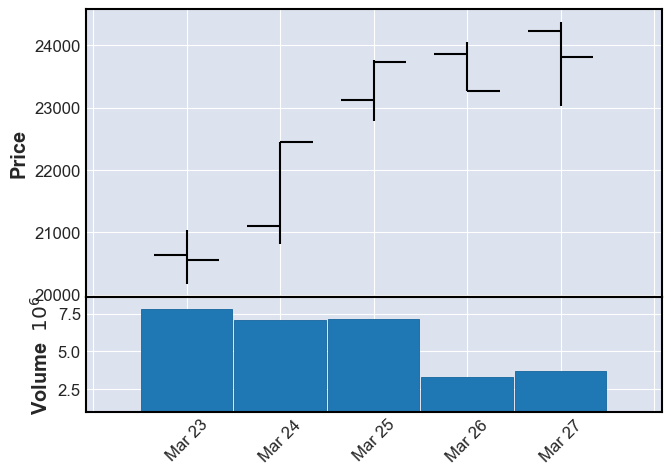

상승?0 횡보?1 하락?20
428 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-03-30  3459835  23925  23090  22935  23685  (2020, 14)
2020-03-31  2418460  24170  23920  23675  24160  (2020, 14)
2020-04-01  3564858  24155  23825  22990  22990  (2020, 14)
2020-04-02  2323469  23685  23080  22760  23640  (2020, 14)
2020-04-03  2440876  23860  23645  23335  23610  (2020, 14)


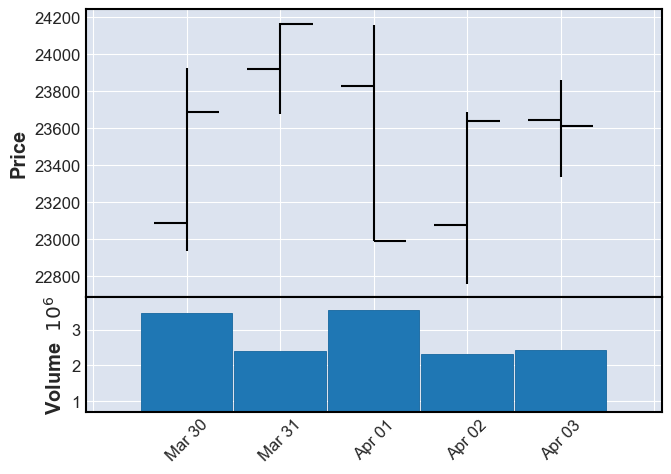

상승?0 횡보?1 하락?21
429 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-04-06  3024665  24600  23840  23815  24525  (2020, 15)
2020-04-07  2311328  25205  25000  24505  24965  (2020, 15)
2020-04-08  1399233  25125  24850  24590  24590  (2020, 15)
2020-04-09  2317493  25045  25030  24705  24955  (2020, 15)
2020-04-10  2737563  25215  24930  24825  25190  (2020, 15)


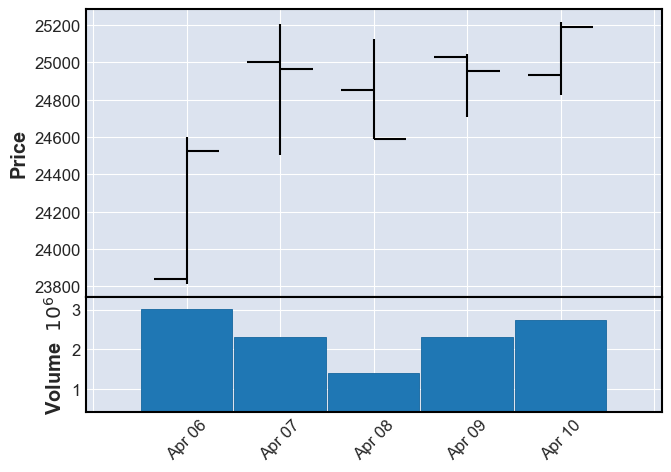

상승?0 횡보?1 하락?20
430 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-04-13  5698455  25085  25080  24715  24755  (2020, 16)
2020-04-14  5490836  25310  24970  24870  25160  (2020, 16)
2020-04-16  1336920  25215  24940  24765  25185  (2020, 16)
2020-04-17  8767087  26155  25650  25650  25950  (2020, 16)


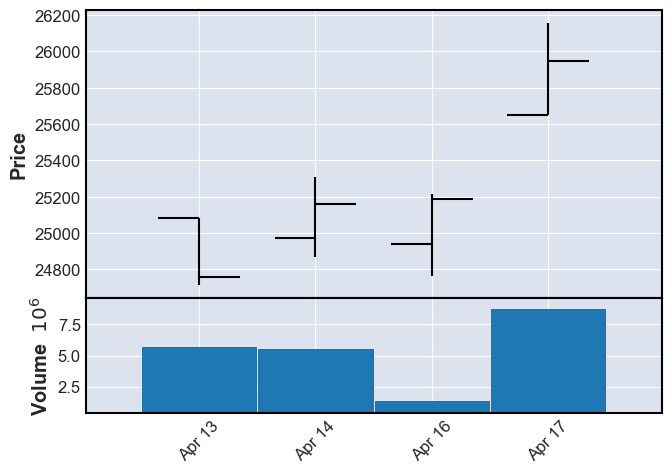

상승?0 횡보?1 하락?20
431 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-04-20  2391626  25990  25900  25555  25640  (2020, 17)
2020-04-21  3612344  25600  25435  24925  25370  (2020, 17)
2020-04-22  1225985  25675  25025  24875  25610  (2020, 17)
2020-04-23  2254966  25960  25685  25565  25840  (2020, 17)
2020-04-24   615248  25770  25770  25315  25445  (2020, 17)


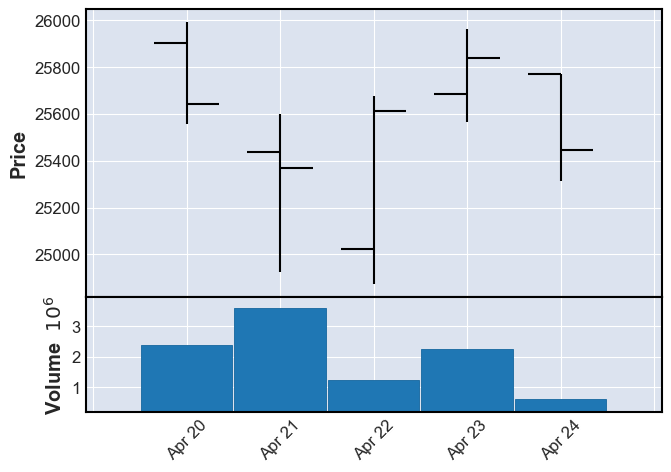

상승?0 횡보?1 하락?22
432 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-04-27  1093434  26035  25545  25465  25950  (2020, 18)
2020-04-28   804312  25730  25600  25335  25650  (2020, 18)
2020-04-29  1560526  25990  25655  25600  25820  (2020, 18)


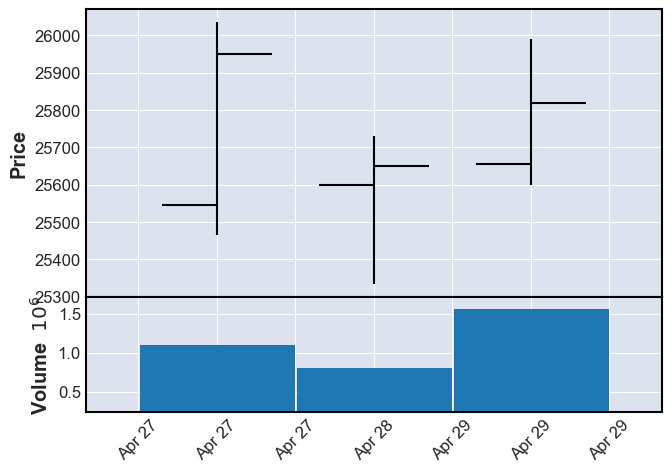

상승?0 횡보?1 하락?21
433 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-05-04  5250682  25425  25425  25000  25035  (2020, 19)
2020-05-06   744545  25510  25375  25115  25510  (2020, 19)
2020-05-07   561750  25630  25385  25315  25460  (2020, 19)
2020-05-08   867120  25835  25575  25575  25675  (2020, 19)


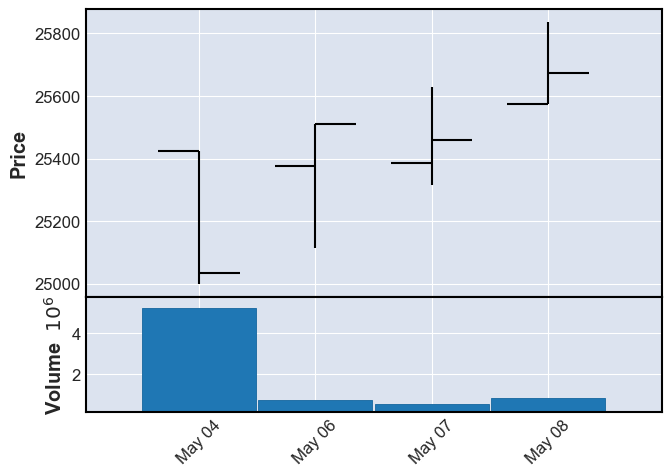

상승?0 횡보?1 하락?20
434 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-05-11   695190  25880  25735  25440  25475  (2020, 20)
2020-05-12  1177650  25525  25480  25075  25310  (2020, 20)
2020-05-13   596543  25565  24990  24965  25565  (2020, 20)
2020-05-14   846114  25420  25365  25170  25310  (2020, 20)
2020-05-15   590991  25515  25450  25190  25375  (2020, 20)


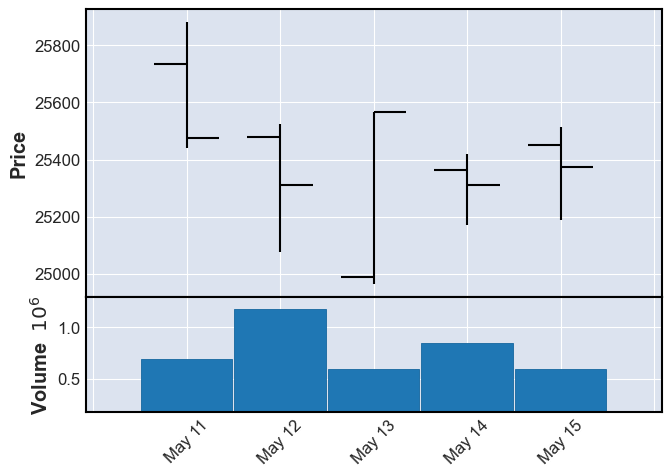

상승?0 횡보?1 하락?21
435 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-05-18   739801  25620  25500  25290  25550  (2020, 21)
2020-05-19  2118117  26265  26100  26030  26200  (2020, 21)
2020-05-20   581008  26335  26080  26080  26260  (2020, 21)
2020-05-21   698544  26460  26400  26295  26360  (2020, 21)
2020-05-22  1071556  26400  26375  25820  25935  (2020, 21)


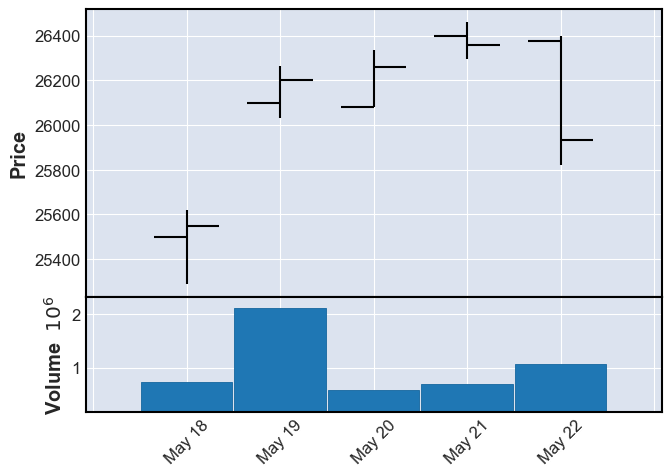

상승?0 횡보?1 하락?20
436 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-05-25  1306260  26265  26100  25880  26265  (2020, 22)
2020-05-26  2286985  26725  26285  26275  26705  (2020, 22)
2020-05-27   813581  26880  26610  26565  26760  (2020, 22)
2020-05-28  1133544  27110  26970  26515  26825  (2020, 22)
2020-05-29   946816  26940  26680  26520  26770  (2020, 22)


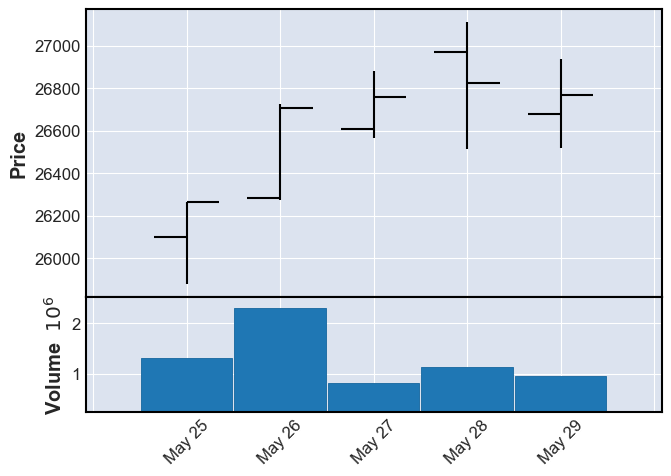

상승?0 횡보?1 하락?20
437 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-06-01  2015008  27310  26805  26805  27310  (2020, 23)
2020-06-02  1117204  27635  27290  27245  27595  (2020, 23)
2020-06-03  2787381  28770  27790  27790  28590  (2020, 23)
2020-06-04  4027248  29280  29130  28535  28620  (2020, 23)
2020-06-05  3084024  29140  28595  28475  29105  (2020, 23)


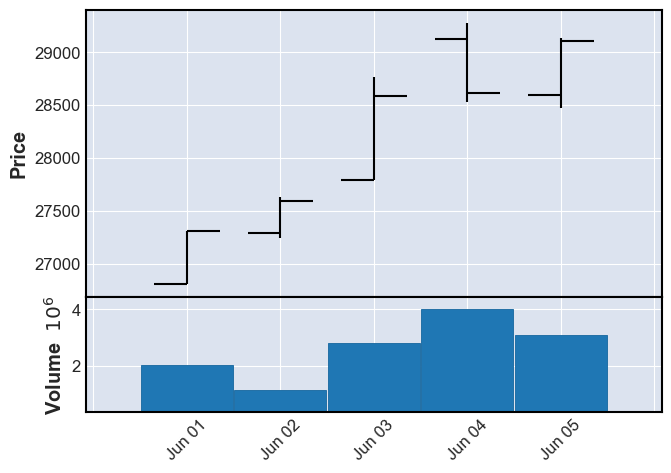

상승?0 횡보?1 하락?20
438 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-06-08  1728757  29650  29620  28960  29065  (2020, 24)
2020-06-09  3097737  29480  29290  28785  29085  (2020, 24)
2020-06-10  1793852  29285  29035  28965  29165  (2020, 24)
2020-06-11  1767441  29180  28950  28385  28715  (2020, 24)
2020-06-12  4170673  28180  27965  27600  28090  (2020, 24)


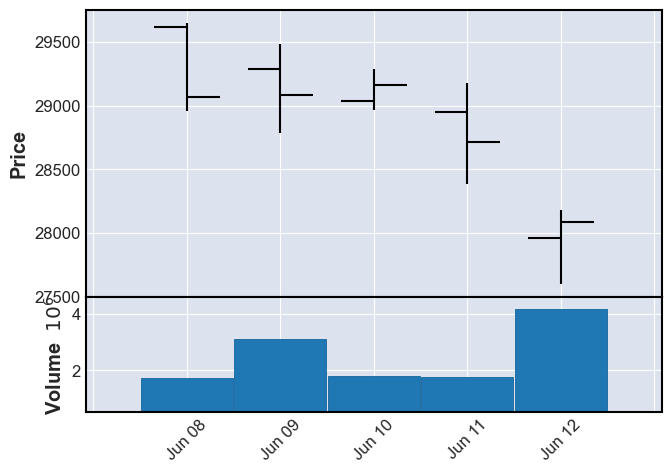

상승?0 횡보?1 하락?22
439 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-06-15  3034165  28020  27625  26720  26720  (2020, 25)
2020-06-16  2262732  28300  27335  27335  28300  (2020, 25)
2020-06-17  3241447  28465  28230  27800  28255  (2020, 25)
2020-06-18  2251916  28305  28155  27955  28170  (2020, 25)
2020-06-19  1834376  28470  28470  27810  28285  (2020, 25)


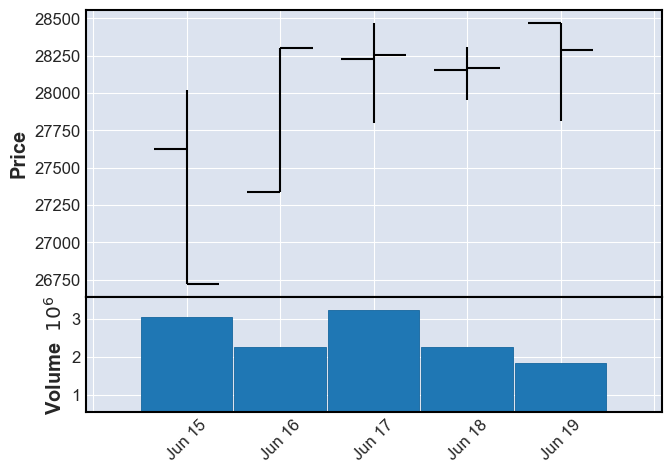

상승?0 횡보?1 하락?20
440 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-06-22   915552  28320  28060  27990  28090  (2020, 26)
2020-06-23  2709525  28550  28330  27890  28165  (2020, 26)
2020-06-24  1153283  28785  28360  28285  28630  (2020, 26)
2020-06-25  4621149  28380  28160  27890  27890  (2020, 26)
2020-06-26  3785663  28420  28150  28005  28280  (2020, 26)


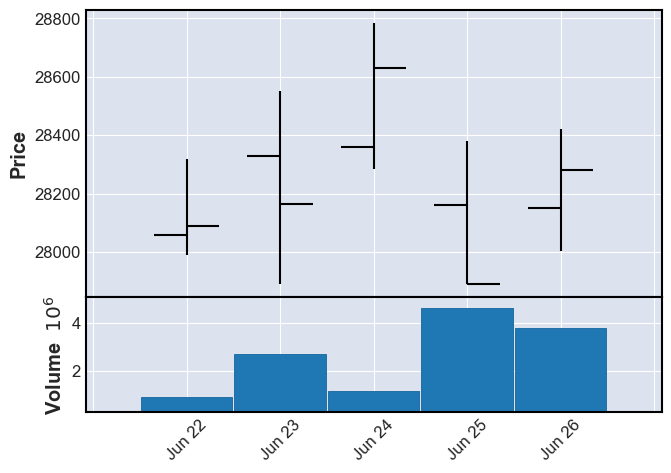

상승?0 횡보?1 하락?20
441 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-06-29  6200167  28195  27935  27720  27820  (2020, 27)
2020-06-30  4420791  28425  28220  28070  28070  (2020, 27)
2020-07-01  2315373  28425  28350  28015  28085  (2020, 27)
2020-07-02  2699486  28405  28190  28145  28405  (2020, 27)
2020-07-03   842344  28695  28540  28400  28665  (2020, 27)


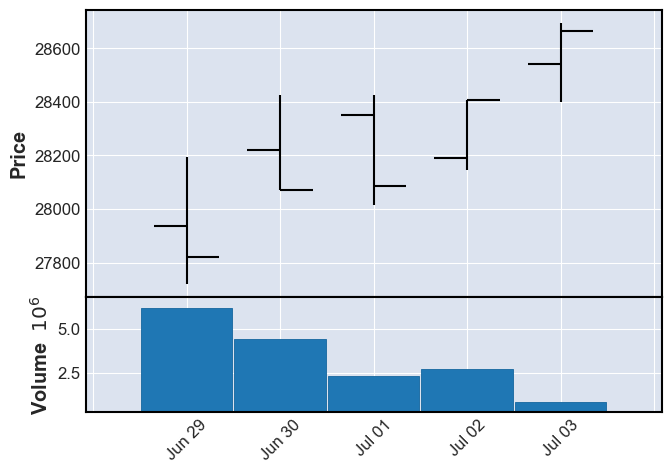

상승?0 횡보?1 하락?20
442 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-07-06  2945701  29175  28710  28695  29120  (2020, 28)
2020-07-07   836916  29360  29330  28750  28765  (2020, 28)
2020-07-08   620701  28895  28765  28605  28695  (2020, 28)
2020-07-09  1863162  29040  28825  28790  28815  (2020, 28)
2020-07-10  1283605  28890  28850  28400  28525  (2020, 28)


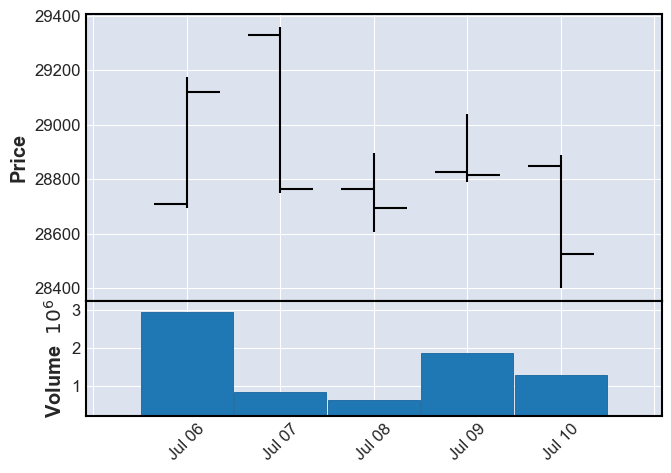

상승?0 횡보?1 하락?22
443 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-07-13   975676  29105  28815  28725  29090  (2020, 29)
2020-07-14   899871  29040  28860  28755  29040  (2020, 29)
2020-07-15  1694926  29535  29350  29180  29320  (2020, 29)
2020-07-16  1286650  29335  29285  28925  29015  (2020, 29)
2020-07-17  1555070  29265  29050  29050  29230  (2020, 29)


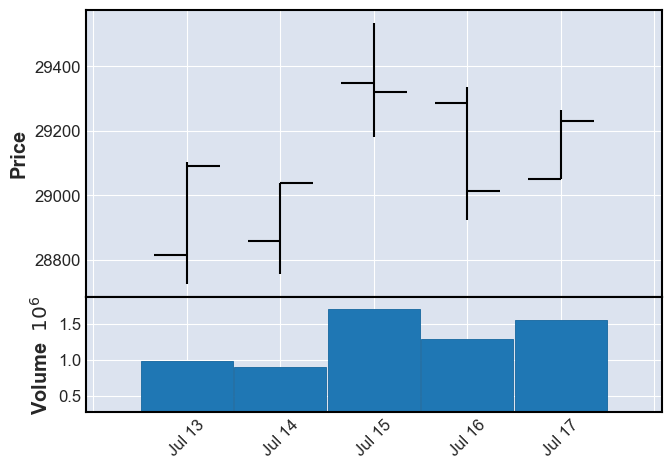

상승?0 횡보?1 하락?20
444 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-07-20  1140434  29350  29325  28965  29160  (2020, 30)
2020-07-21  1753798  29690  29425  29400  29580  (2020, 30)
2020-07-22   834371  29675  29580  29425  29470  (2020, 30)
2020-07-23  1287062  29470  29470  29095  29305  (2020, 30)
2020-07-24   647466  29320  29030  29000  29160  (2020, 30)


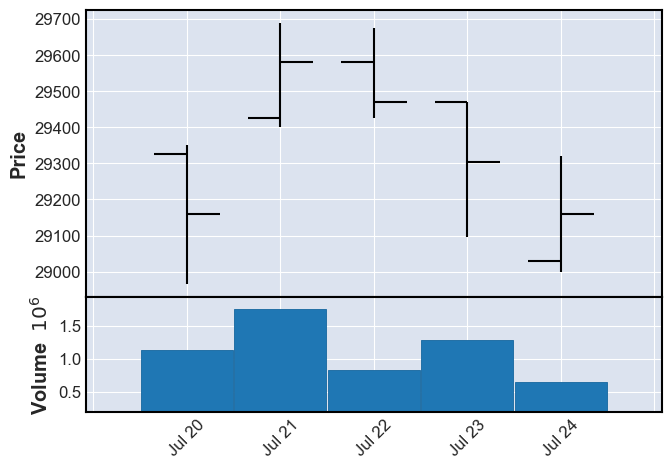

상승?0 횡보?1 하락?21
445 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-07-27  2077842  29580  29085  29085  29430  (2020, 31)
2020-07-28  1234504  30200  29635  29635  30030  (2020, 31)
2020-07-29  1290908  30380  30020  30010  30200  (2020, 31)
2020-07-30  1735321  30410  30295  30170  30170  (2020, 31)
2020-07-31  1377681  30415  30240  29880  29940  (2020, 31)


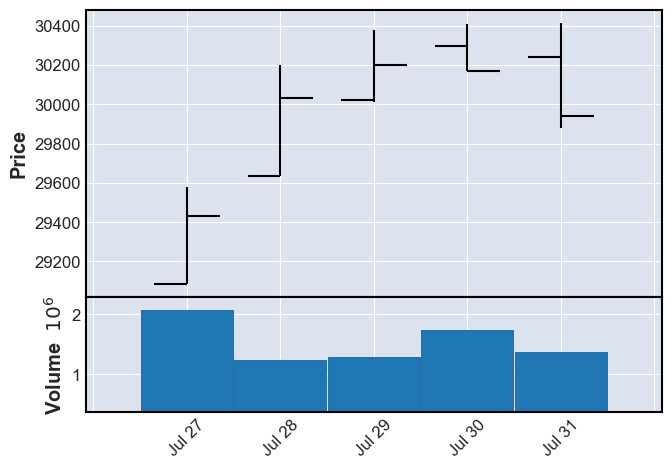

상승?0 횡보?1 하락?20
446 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-08-03   833446  30020  29920  29740  29930  (2020, 32)
2020-08-04  1077112  30405  30090  30075  30280  (2020, 32)
2020-08-05  2009679  30630  30365  30270  30620  (2020, 32)
2020-08-06  2019729  31275  30740  30725  31110  (2020, 32)
2020-08-07  1706961  31400  31185  30965  31235  (2020, 32)


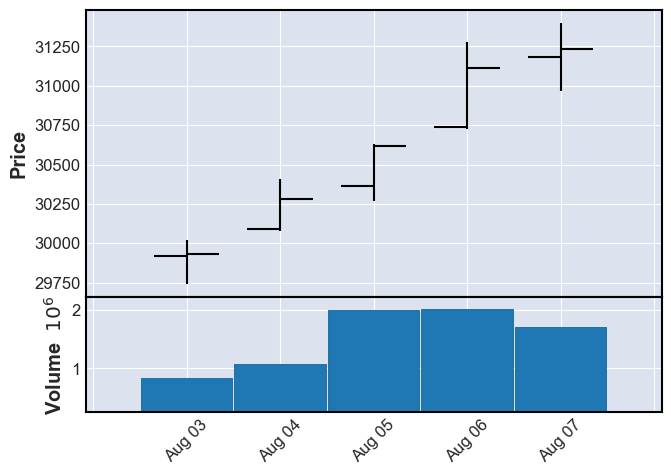

상승?0 횡보?1 하락?20
447 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-08-10  2832794  31760  31160  31150  31685  (2020, 33)
2020-08-11  2500351  32275  31685  31685  32115  (2020, 33)
2020-08-12  1868243  32260  31980  31730  32260  (2020, 33)
2020-08-13  2398358  32610  32535  31915  32320  (2020, 33)
2020-08-14  2316340  32250  32205  31635  31905  (2020, 33)


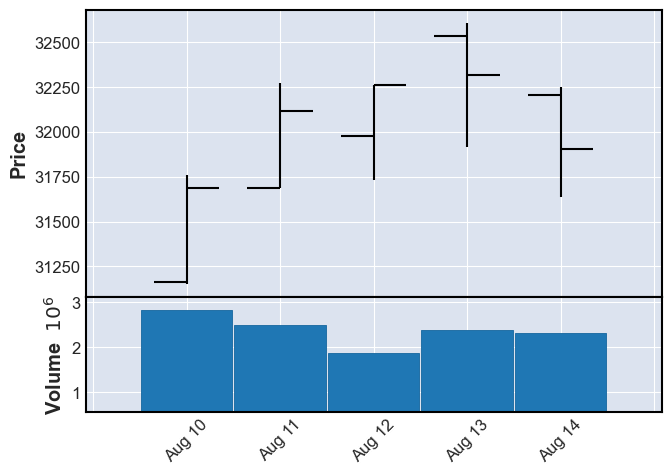

상승?0 횡보?1 하락?20
448 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-08-18  1179956  32160  32025  31165  31265  (2020, 34)
2020-08-19  2047725  31680  31520  31330  31365  (2020, 34)
2020-08-20  2545163  31250  31130  30115  30155  (2020, 34)
2020-08-21  1525776  30975  30505  30305  30605  (2020, 34)


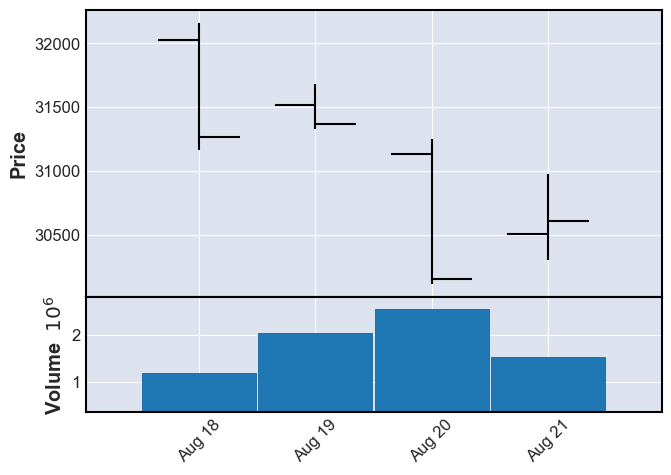

상승?0 횡보?1 하락?22
449 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-08-24  1641755  31005  30680  30355  30965  (2020, 35)
2020-08-25  2689701  31410  31195  31035  31350  (2020, 35)
2020-08-26  3125400  31480  31350  30965  31380  (2020, 35)
2020-08-27  1338141  31480  31450  31100  31100  (2020, 35)
2020-08-28  1724907  31590  31290  31075  31235  (2020, 35)


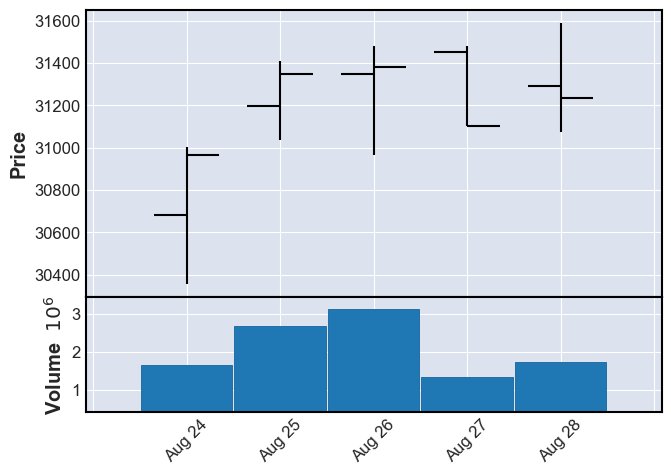

상승?0 횡보?1 하락?20
450 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-08-31  1243524  31605  31465  30725  30725  (2020, 36)
2020-09-01  1380704  31100  30790  30755  30985  (2020, 36)
2020-09-02  1464985  31285  31175  30845  31145  (2020, 36)
2020-09-03  1871206  31735  31425  31420  31615  (2020, 36)
2020-09-04  1398479  31225  30800  30760  31175  (2020, 36)


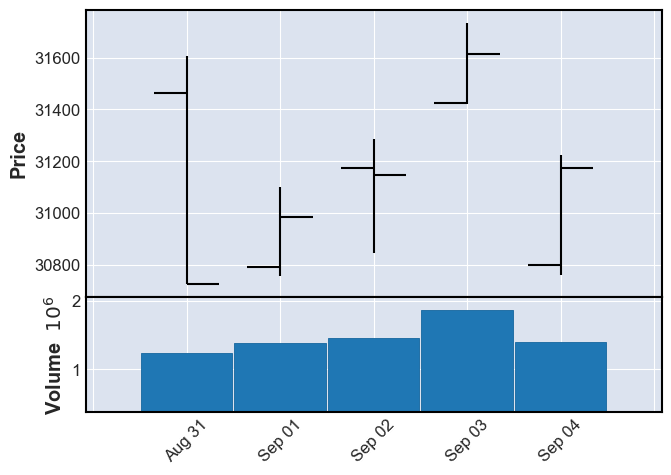

상승?0 횡보?1 하락?20
451 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-09-07   997266  31400  31175  31050  31320  (2020, 37)
2020-09-08  1544296  31720  31580  31450  31720  (2020, 37)
2020-09-09   860903  31555  31310  31270  31340  (2020, 37)
2020-09-10  3865904  31755  31645  31535  31600  (2020, 37)
2020-09-11  1617288  31635  31450  31290  31595  (2020, 37)


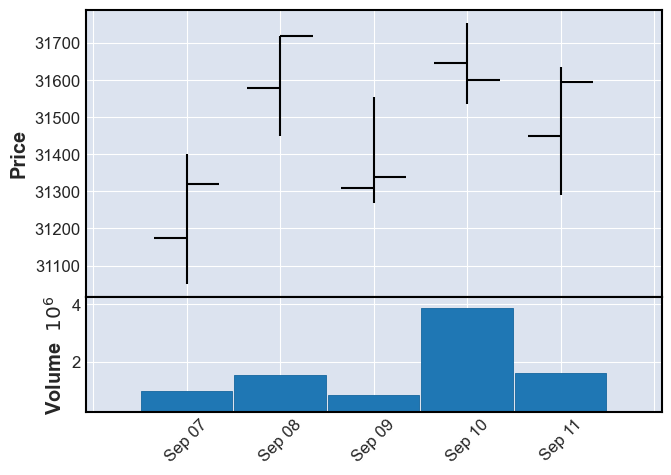

상승?0 횡보?1 하락?20
452 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-09-14  2564220  32080  31885  31825  32040  (2020, 38)
2020-09-15  3232365  32305  32125  32000  32295  (2020, 38)
2020-09-16  1585057  32385  32255  32135  32185  (2020, 38)
2020-09-17  2476237  32150  32095  31660  31730  (2020, 38)
2020-09-18  1979130  31965  31965  31630  31825  (2020, 38)


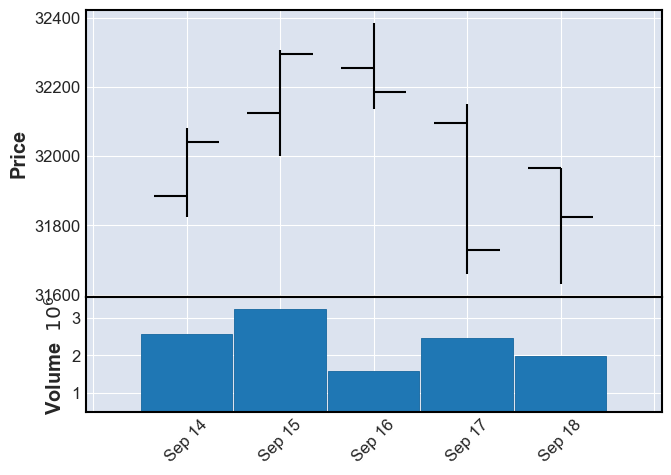

상승?0 횡보?1 하락?22
453 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-09-21  2277136  32070  31790  31465  31540  (2020, 39)
2020-09-22  3401862  31555  31495  30675  30825  (2020, 39)
2020-09-23  7100186  31080  31030  30330  30935  (2020, 39)
2020-09-24  4408781  30655  30520  30200  30210  (2020, 39)
2020-09-25  3186184  30500  30425  30210  30390  (2020, 39)


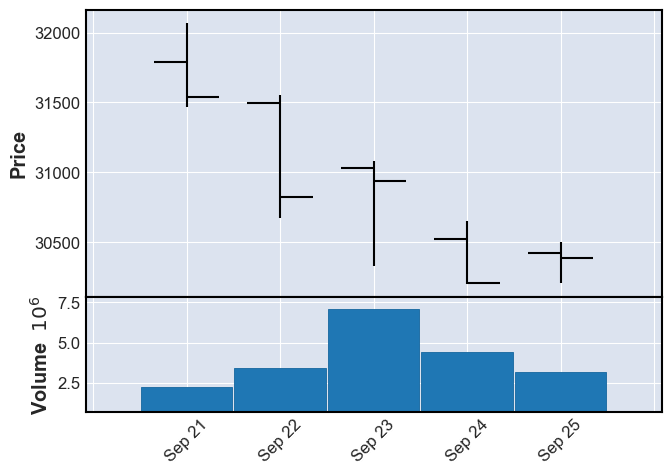

상승?0 횡보?1 하락?22
454 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-09-28   961847  30880  30640  30525  30790  (2020, 40)
2020-09-29  1625619  31195  31055  30935  31030  (2020, 40)


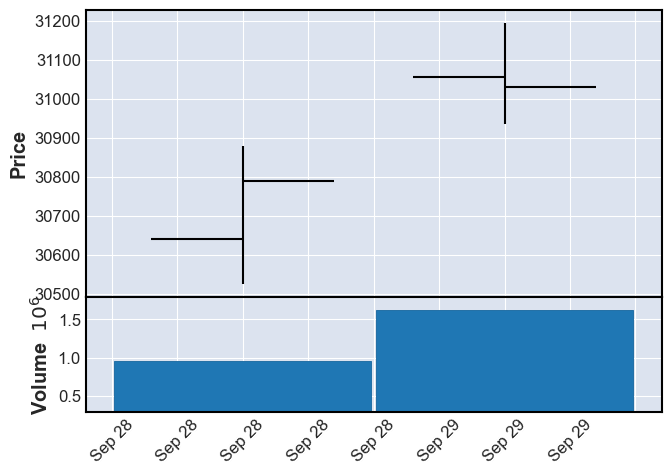

상승?0 횡보?1 하락?20
455 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-10-05  1321634  31545  31050  31015  31435  (2020, 41)
2020-10-06  1184830  31710  31540  31405  31505  (2020, 41)
2020-10-07  1463770  31815  31310  31260  31800  (2020, 41)
2020-10-08  2191187  32080  32030  31715  31820  (2020, 41)


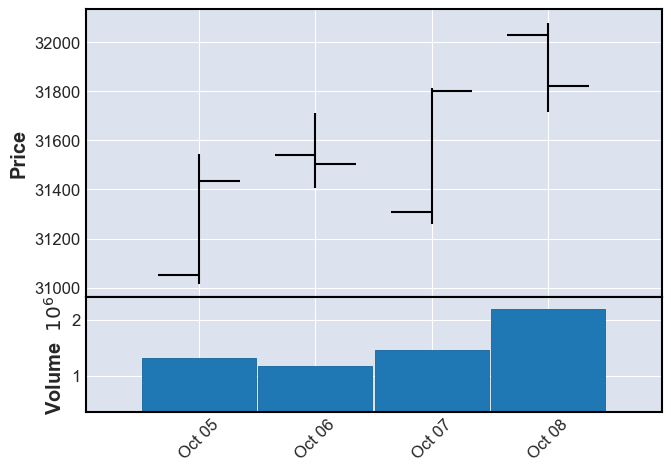

상승?0 횡보?1 하락?20
456 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-10-12  1432717  32065  31990  31845  31955  (2020, 42)
2020-10-13  1348178  32165  32105  31735  31965  (2020, 42)
2020-10-14  2302552  32020  31975  31590  31675  (2020, 42)
2020-10-15   922732  31630  31600  31280  31420  (2020, 42)
2020-10-16  1607945  31560  31475  31025  31240  (2020, 42)


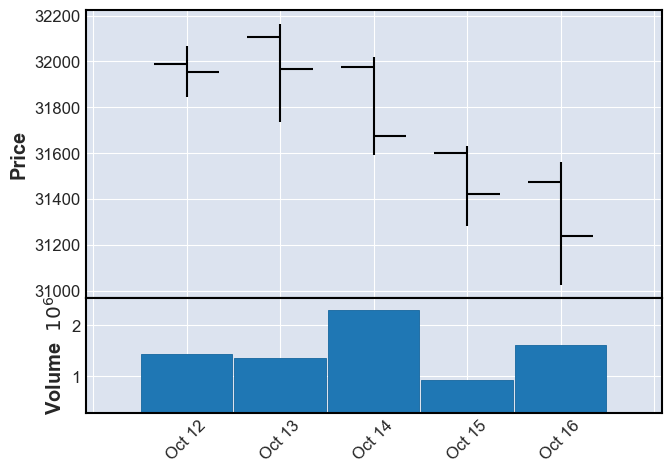

상승?0 횡보?1 하락?22
457 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-10-19  1785817  31555  31335  31285  31295  (2020, 43)
2020-10-20  2575440  31540  31185  31060  31540  (2020, 43)
2020-10-21  2235735  31710  31560  31480  31640  (2020, 43)
2020-10-22  1843132  31480  31475  31225  31415  (2020, 43)
2020-10-23  2735703  31630  31530  31290  31530  (2020, 43)


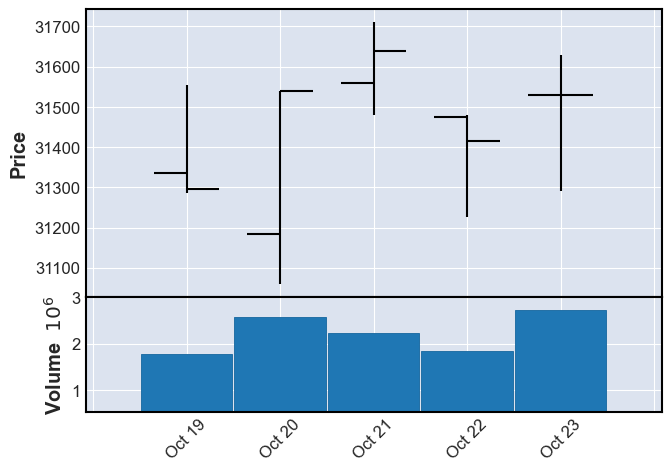

상승?0 횡보?1 하락?20
458 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-10-26  2485701  31730  31545  31435  31445  (2020, 44)
2020-10-27  1940502  31430  31240  31125  31210  (2020, 44)
2020-10-28  1391786  31375  31060  30990  31375  (2020, 44)
2020-10-29  1714693  30985  30870  30605  30955  (2020, 44)
2020-10-30  3199672  30850  30840  30125  30175  (2020, 44)


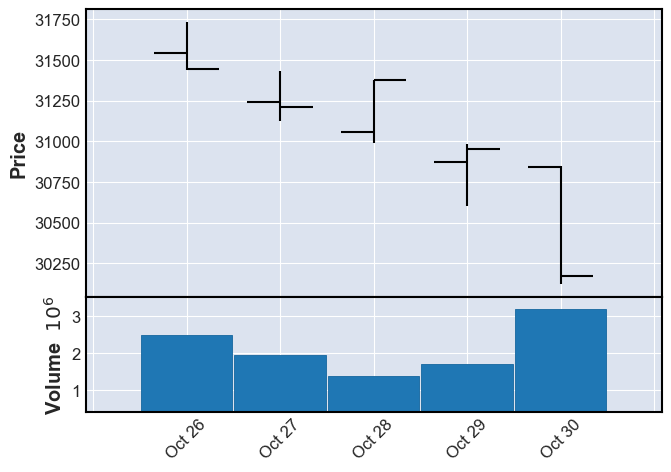

상승?0 횡보?1 하락?22
459 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-11-02  2979656  30605  30175  30160  30585  (2020, 45)
2020-11-03  1406262  31220  30690  30685  31185  (2020, 45)
2020-11-04  4636567  31555  31445  31135  31375  (2020, 45)
2020-11-05  2139343  32100  31585  31520  32100  (2020, 45)
2020-11-06  2642184  32400  32200  32070  32165  (2020, 45)


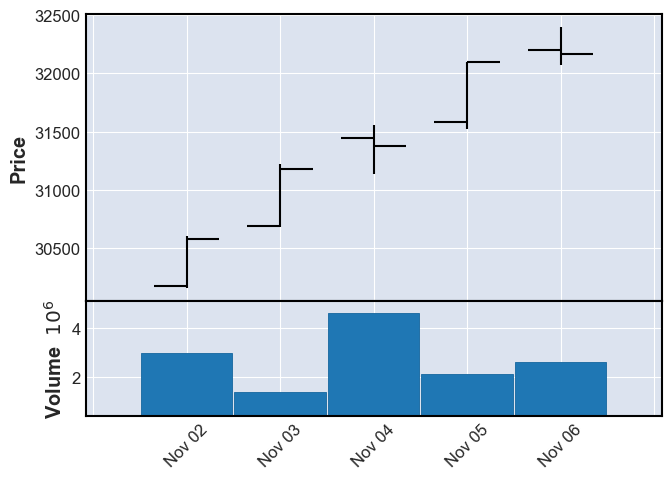

상승?0 횡보?1 하락?20
460 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-11-09  3915294  32800  32475  32445  32545  (2020, 46)
2020-11-10  2357376  32725  32725  32325  32560  (2020, 46)
2020-11-11  2369007  33130  32605  32605  33070  (2020, 46)
2020-11-12  3474662  33110  33055  32815  32910  (2020, 46)
2020-11-13  1862905  33270  32855  32750  33270  (2020, 46)


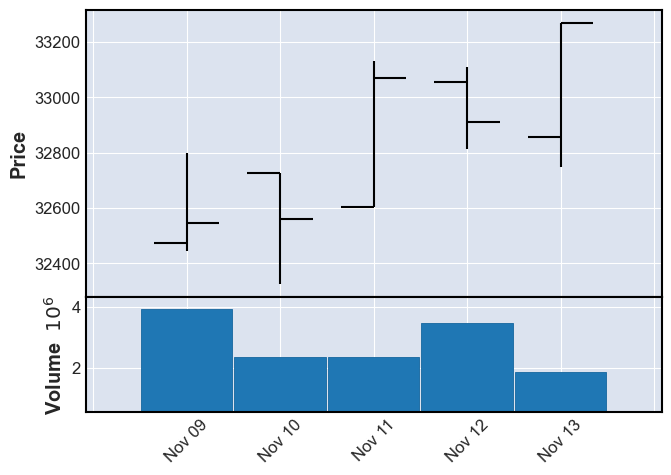

상승?0 횡보?1 하락?20
461 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-11-16  1899781  34070  33485  33390  33970  (2020, 47)
2020-11-17  2876552  34185  34045  33890  33965  (2020, 47)
2020-11-18  4962811  34130  33970  33850  33940  (2020, 47)
2020-11-19  1314895  33960  33830  33705  33950  (2020, 47)
2020-11-20  2278846  34120  33890  33825  34020  (2020, 47)


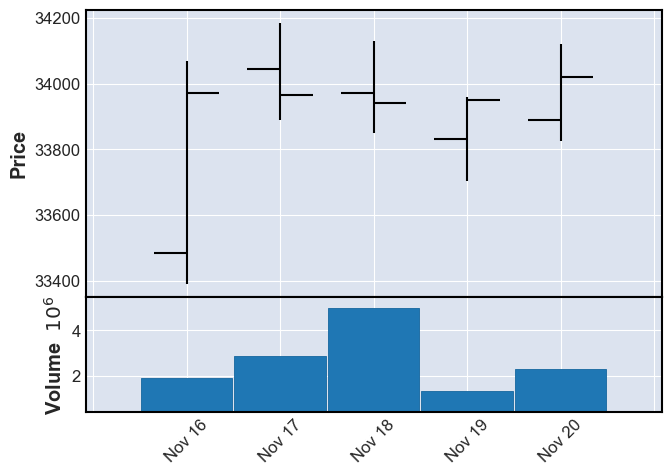

상승?0 횡보?1 하락?21
462 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-11-23  3201097  34825  34095  34040  34775  (2020, 48)
2020-11-24  2110474  35185  34960  34795  34990  (2020, 48)
2020-11-25  4756670  35320  35175  34585  34765  (2020, 48)
2020-11-26  1374685  35125  34750  34670  35125  (2020, 48)
2020-11-27  1722357  35240  35115  34995  35195  (2020, 48)


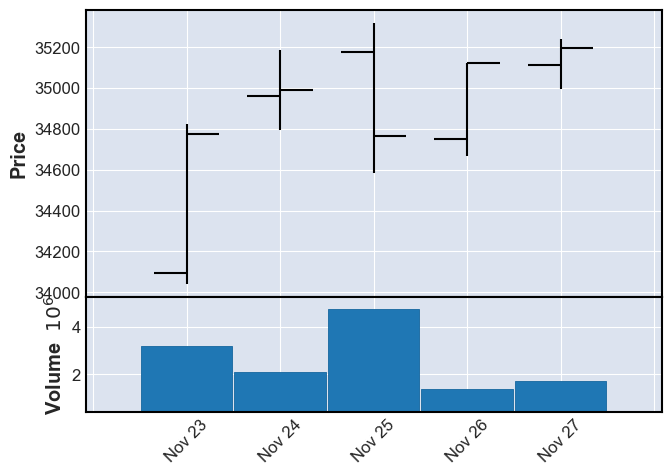

상승?0 횡보?1 하락?20
463 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-11-30  1539640  35440  35295  34665  34665  (2020, 49)
2020-12-01  1577073  35315  34820  34820  35220  (2020, 49)
2020-12-02  2435594  35875  35400  35340  35830  (2020, 49)
2020-12-03  2373260  36120  35955  35800  36075  (2020, 49)
2020-12-04  1682299  36935  36265  36225  36720  (2020, 49)


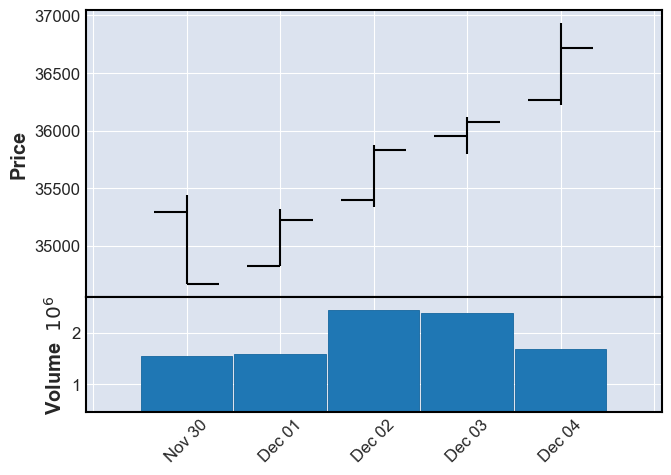

상승?0 횡보?1 하락?20
464 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-12-07  2674632  37080  37000  36485  36935  (2020, 50)
2020-12-08  2423443  36920  36880  36315  36315  (2020, 50)
2020-12-09  3324373  37160  36490  36490  37110  (2020, 50)
2020-12-10  2518387  37200  36740  36535  36865  (2020, 50)
2020-12-11  2949683  37370  37080  37080  37210  (2020, 50)


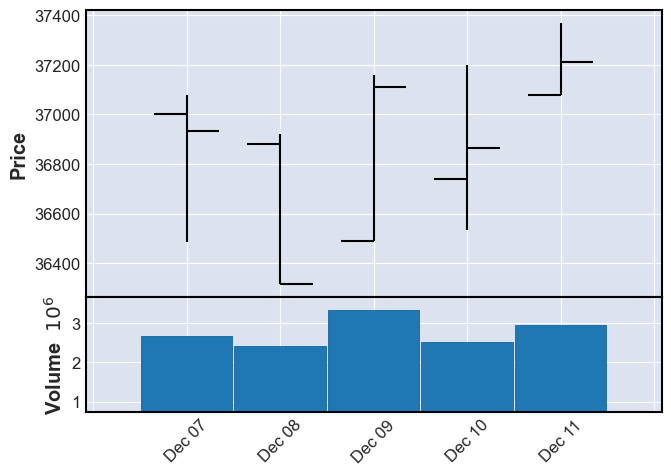

상승?0 횡보?1 하락?20
465 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-12-14  1532739  37400  37310  37010  37075  (2020, 51)
2020-12-15  1892103  37155  37075  36700  37080  (2020, 51)
2020-12-16  1121578  37435  37320  37105  37230  (2020, 51)
2020-12-17  1704622  37235  37205  36785  37180  (2020, 51)
2020-12-18  1261393  37295  37230  37045  37140  (2020, 51)


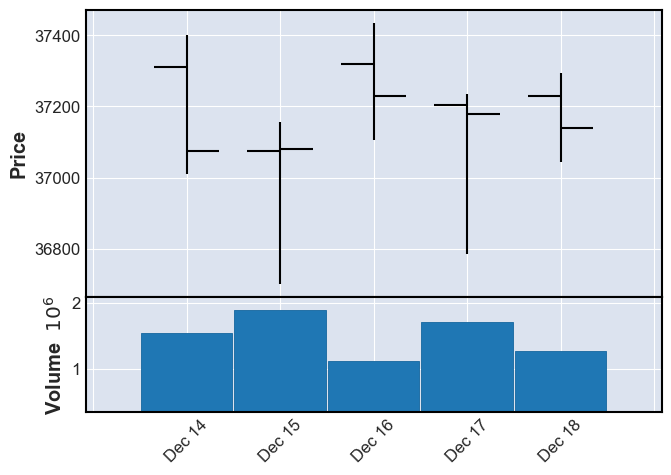

상승?0 횡보?1 하락?21
466 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-12-21  1035078  37205  37200  36720  37170  (2020, 52)
2020-12-22  1949859  37130  37035  36590  36605  (2020, 52)
2020-12-23  1264797  37140  36730  36445  37075  (2020, 52)
2020-12-24  1369299  37970  37175  37175  37845  (2020, 52)


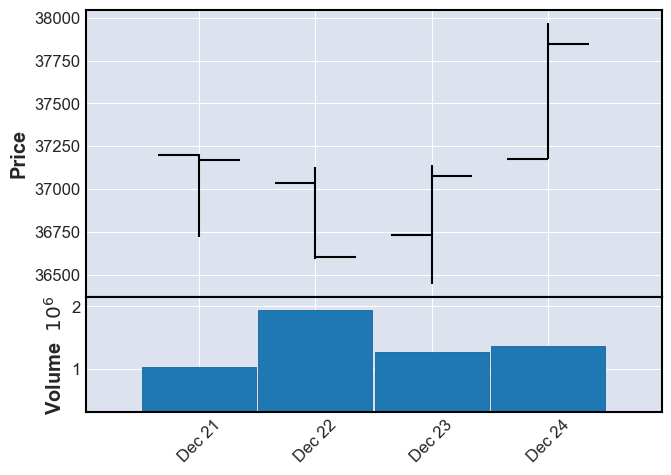

상승?0 횡보?1 하락?20
467 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2020-12-28  2022072  38360  38125  37870  38020  (2020, 53)
2020-12-29  1757122  38700  38255  38185  38655  (2020, 53)
2020-12-30  1866398  39590  38535  38405  39525  (2020, 53)


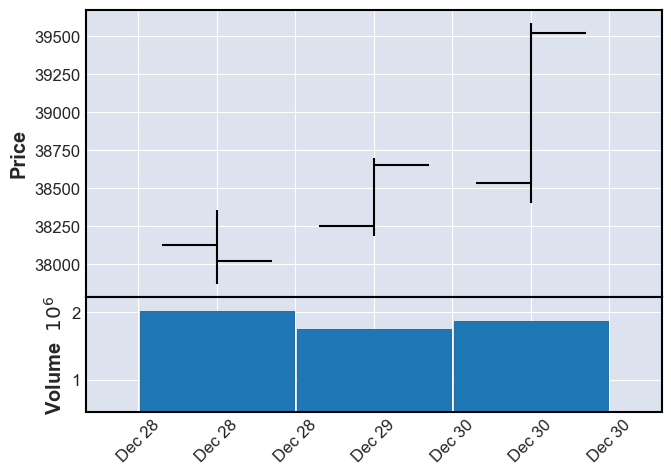

상승?0 횡보?1 하락?20
468 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-01-04  2997272  40590  39630  39400  40500  (2021, 1)
2021-01-05  2136588  41120  40365  40200  41120  (2021, 1)
2021-01-06  2322989  41650  41265  40580  40710  (2021, 1)
2021-01-07  1616976  42020  41140  41140  41640  (2021, 1)
2021-01-08  1804424  43750  42185  42025  43505  (2021, 1)


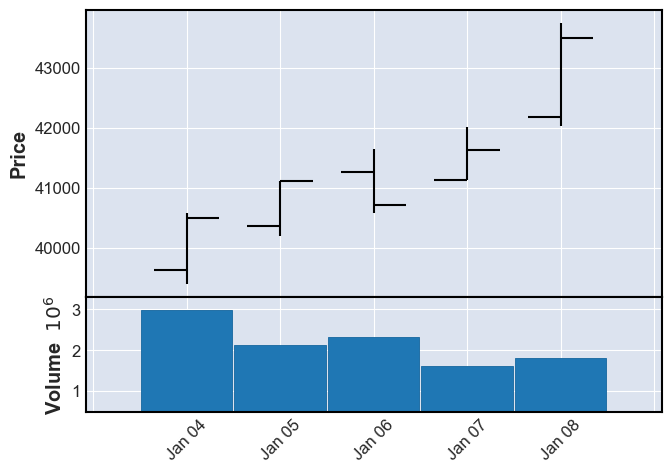

상승?0 횡보?1 하락?20
469 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-01-11  4042799  45350  44095  42890  43605  (2021, 2)
2021-01-12  2841708  43685  43175  42090  43275  (2021, 2)
2021-01-13  1530738  43865  43300  43000  43485  (2021, 2)
2021-01-14  1405436  43675  43280  43220  43480  (2021, 2)
2021-01-15  1909883  44185  43690  42520  42560  (2021, 2)


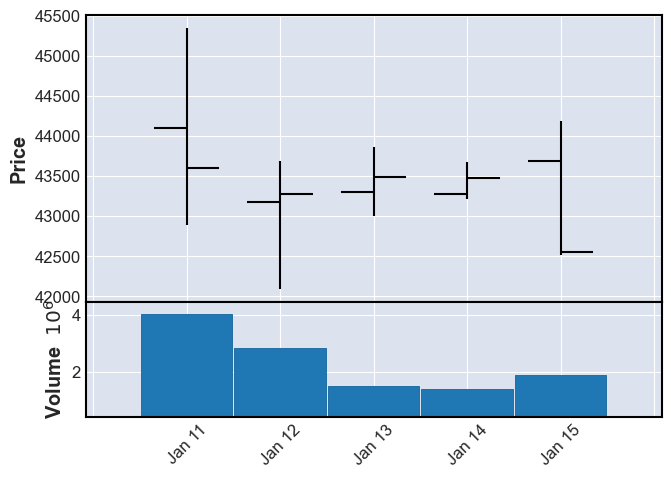

상승?0 횡보?1 하락?22
470 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-01-18  4071117  42485  42085  41435  41570  (2021, 3)
2021-01-19  1725787  42930  41740  41565  42630  (2021, 3)
2021-01-20  1479132  43465  43420  42420  42890  (2021, 3)
2021-01-21  1289211  43560  43240  42990  43495  (2021, 3)
2021-01-22  2829614  43910  43565  43205  43210  (2021, 3)


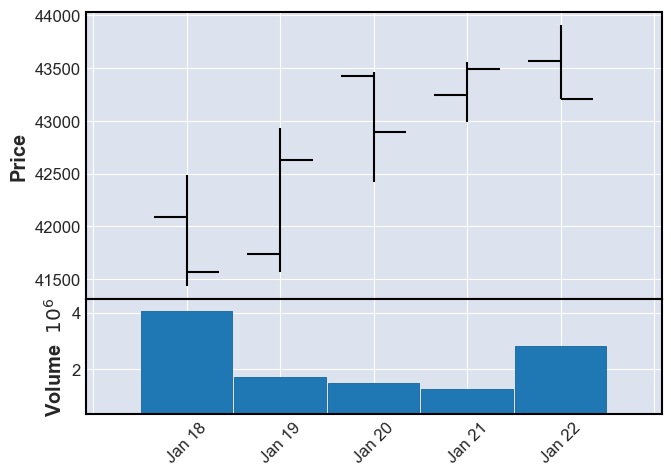

상승?0 횡보?1 하락?20
471 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-01-25  1569049  44300  43400  43245  44250  (2021, 4)
2021-01-26  2583806  44255  44255  42840  43025  (2021, 4)
2021-01-27  1315818  43790  43215  42760  42880  (2021, 4)
2021-01-28  1201564  42475  41840  41650  41955  (2021, 4)
2021-01-29  2857508  42470  42400  40760  40975  (2021, 4)


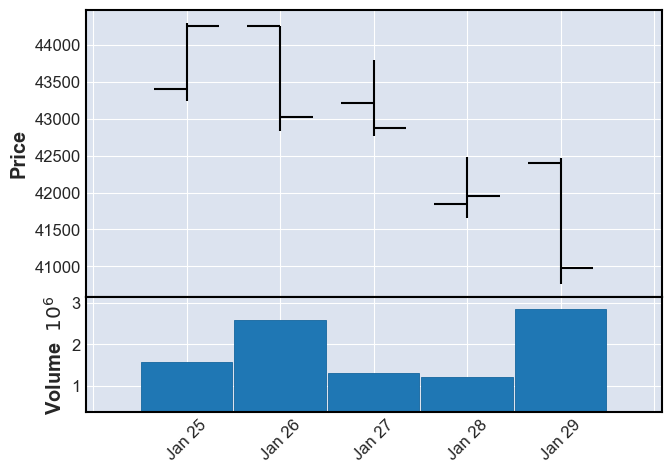

상승?0 횡보?1 하락?22
472 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-02-01  1765811  41990  40970  40545  41965  (2021, 5)
2021-02-02  1653014  43230  42410  42160  42610  (2021, 5)
2021-02-03  1650830  43210  42895  42415  42970  (2021, 5)
2021-02-04  2526184  42850  42850  41955  42275  (2021, 5)
2021-02-05  1061181  42860  42545  42220  42790  (2021, 5)


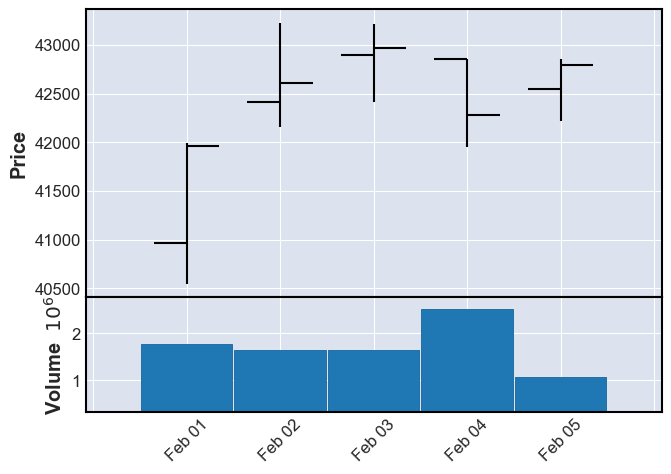

상승?0 횡보?1 하락?20
473 done
            Volume   High   Open    Low  Close        ynw
tdate                                                    
2021-02-08  561082  42925  42780  42310  42365  (2021, 6)
2021-02-09  585566  42975  42645  42240  42240  (2021, 6)
2021-02-10  656866  42645  42440  41940  42515  (2021, 6)


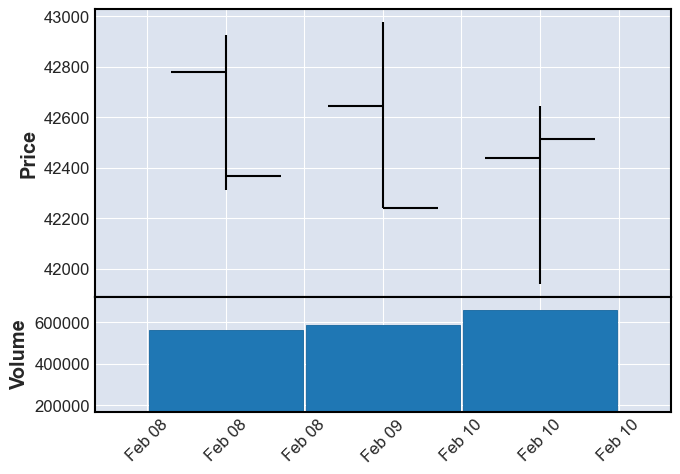

상승?0 횡보?1 하락?20
474 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-02-15  1996508  43345  43090  42975  43160  (2021, 7)
2021-02-16   931023  43705  43250  43110  43335  (2021, 7)
2021-02-17  4093591  43180  43180  42565  42885  (2021, 7)
2021-02-18  1101011  42950  42705  42215  42215  (2021, 7)
2021-02-19  1513182  42635  42235  41570  42605  (2021, 7)


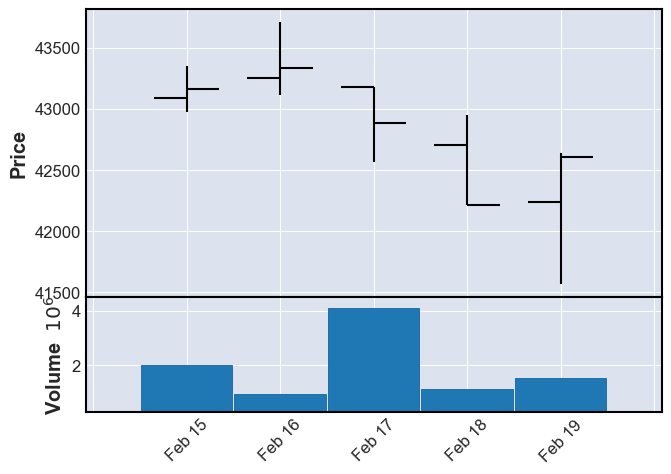

상승?0 횡보?1 하락?22
475 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-02-22  1353003  43095  42905  42120  42170  (2021, 8)
2021-02-23   692677  42455  41850  41575  42110  (2021, 8)
2021-02-24   911535  42505  42200  41180  41210  (2021, 8)
2021-02-25  1069401  42750  41775  41775  42725  (2021, 8)
2021-02-26  1256046  41830  41700  41165  41540  (2021, 8)


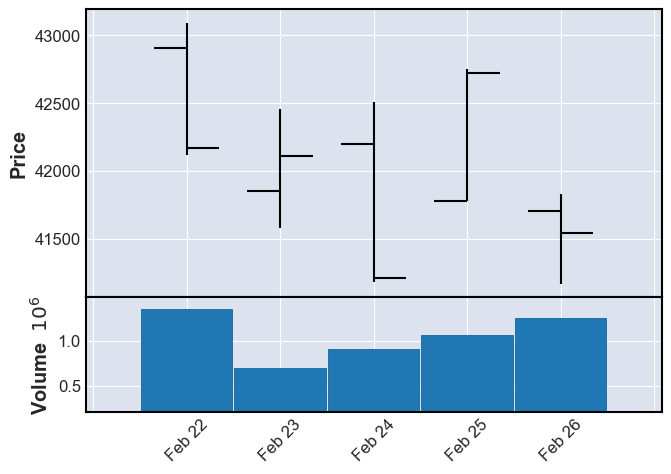

상승?0 횡보?1 하락?22
476 done
             Volume   High   Open    Low  Close        ynw
tdate                                                     
2021-03-02  1044924  42755  42495  41670  42020  (2021, 9)
2021-03-03   706011  42480  41960  41770  42480  (2021, 9)
2021-03-04   732114  42270  42020  41630  41935  (2021, 9)
2021-03-05  1024274  41850  41335  41085  41680  (2021, 9)


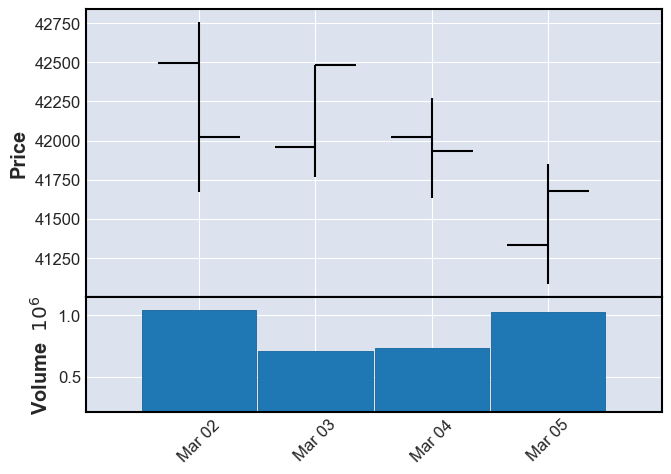

상승?0 횡보?1 하락?22
477 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-03-08   609047  42110  42080  41235  41335  (2021, 10)
2021-03-09  1126957  41380  41360  40415  41040  (2021, 10)
2021-03-10   699493  41635  41615  40720  40820  (2021, 10)
2021-03-11   841972  41780  40985  40985  41705  (2021, 10)
2021-03-12   867890  42260  42055  41850  42035  (2021, 10)


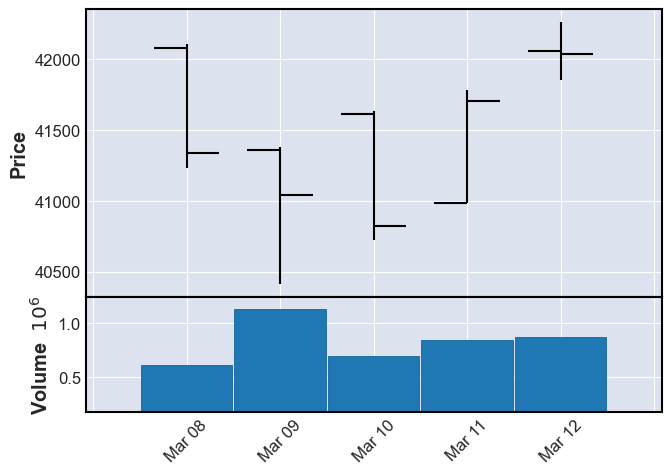

상승?0 횡보?1 하락?20
478 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-03-15  2168814  42160  42035  41780  41815  (2021, 11)
2021-03-16   602584  42270  41985  41930  42190  (2021, 11)
2021-03-17  1130146  42205  42200  41570  41845  (2021, 11)
2021-03-18   612728  42555  42070  42070  42160  (2021, 11)
2021-03-19  1351202  41920  41560  41495  41715  (2021, 11)


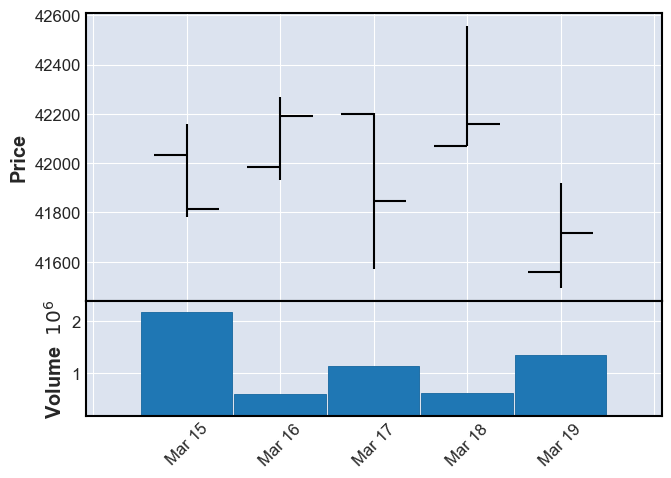

상승?0 횡보?1 하락?21
479 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-03-22   863515  41940  41825  41460  41760  (2021, 12)
2021-03-23  1242460  42110  42005  41335  41395  (2021, 12)
2021-03-24   954918  41350  41125  40860  41195  (2021, 12)
2021-03-25   837531  41640  41150  41050  41355  (2021, 12)
2021-03-26   591683  41800  41530  41420  41775  (2021, 12)


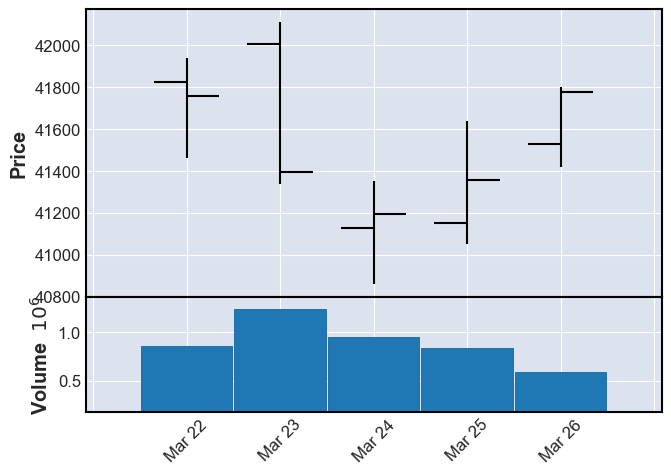

상승?0 횡보?1 하락?21
480 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-03-29   614504  41905  41855  41515  41675  (2021, 13)
2021-03-30   664087  42310  41740  41740  42175  (2021, 13)
2021-03-31  1306437  42550  42265  42020  42035  (2021, 13)
2021-04-01  1146159  42500  42325  42175  42420  (2021, 13)
2021-04-02  1175216  43035  42750  42735  42900  (2021, 13)


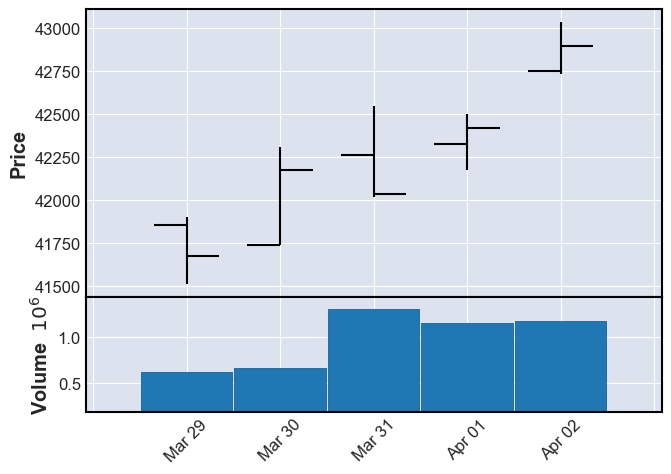

상승?0 횡보?1 하락?20
481 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-04-05  1123421  43100  43050  42735  42975  (2021, 14)
2021-04-06   597301  43265  43260  42820  43050  (2021, 14)
2021-04-07  1053606  43310  43140  43000  43125  (2021, 14)
2021-04-08  2064897  43215  43120  42930  43115  (2021, 14)
2021-04-09  1609696  43320  43125  42810  42925  (2021, 14)


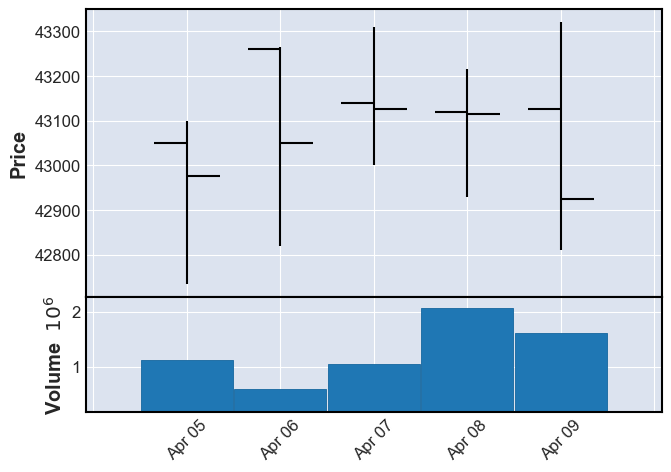

상승?0 횡보?1 하락?21
482 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-04-12  2370535  43120  43100  42805  42940  (2021, 15)
2021-04-13   662882  43555  42940  42910  43420  (2021, 15)
2021-04-14   429287  43755  43510  43335  43695  (2021, 15)
2021-04-15  1347821  43985  43600  43575  43750  (2021, 15)
2021-04-16   650780  43890  43835  43575  43720  (2021, 15)


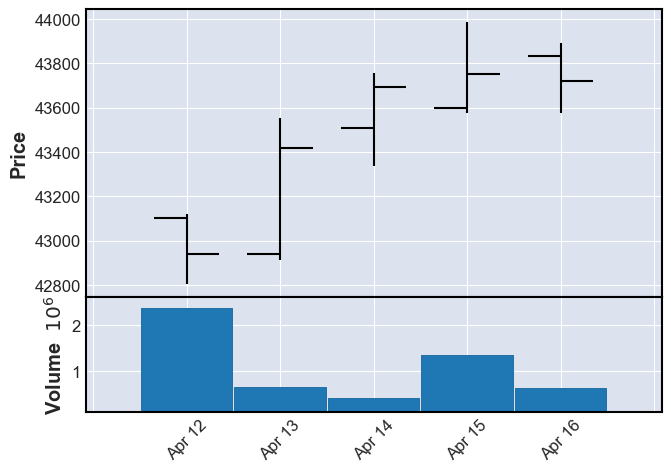

상승?0 횡보?1 하락?20
483 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-04-19   684124  43970  43705  43595  43730  (2021, 16)
2021-04-20   440883  44025  43660  43620  43960  (2021, 16)
2021-04-21  1787372  43740  43740  43060  43215  (2021, 16)
2021-04-22  1011159  43555  43385  43215  43285  (2021, 16)
2021-04-23   770037  43420  43045  42785  43290  (2021, 16)


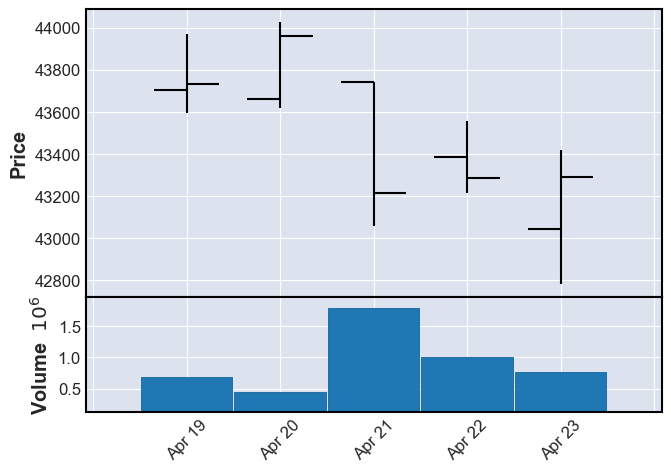

상승?0 횡보?1 하락?22
484 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-04-26  1085650  43690  43425  43355  43685  (2021, 17)
2021-04-27   558681  43770  43700  43545  43745  (2021, 17)
2021-04-28   519676  43690  43690  43190  43270  (2021, 17)
2021-04-29  1665111  43060  42875  42545  42625  (2021, 17)
2021-04-30  1547447  42700  42575  42165  42295  (2021, 17)


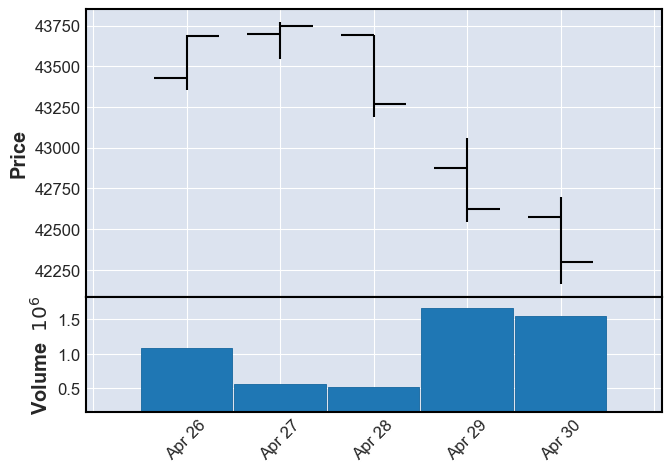

상승?0 횡보?1 하락?22
485 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2021-05-03  741438  42665  42280  42020  42065  (2021, 18)
2021-05-04  411995  42415  42135  41960  42395  (2021, 18)
2021-05-06  378807  42695  42250  42190  42655  (2021, 18)
2021-05-07  421790  43090  42685  42675  42945  (2021, 18)


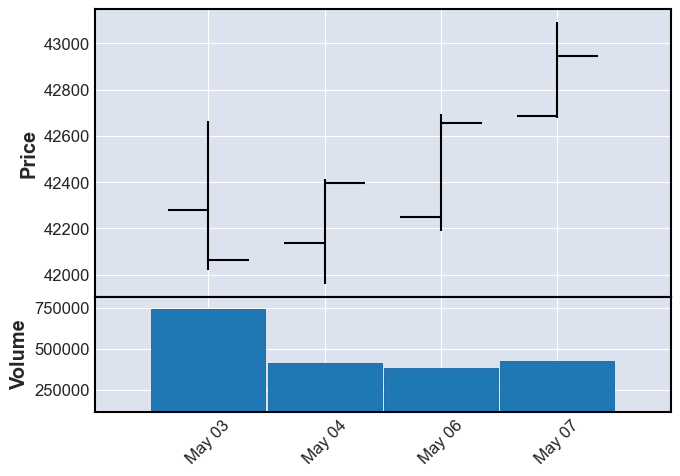

상승?0 횡보?1 하락?20
486 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-05-10   720620  43765  43245  43090  43640  (2021, 19)
2021-05-11   501491  43455  43350  42730  42915  (2021, 19)
2021-05-12   880224  42950  42915  41900  42210  (2021, 19)
2021-05-13   614380  42125  41680  41530  41700  (2021, 19)
2021-05-14  1943197  42250  41905  41810  42095  (2021, 19)


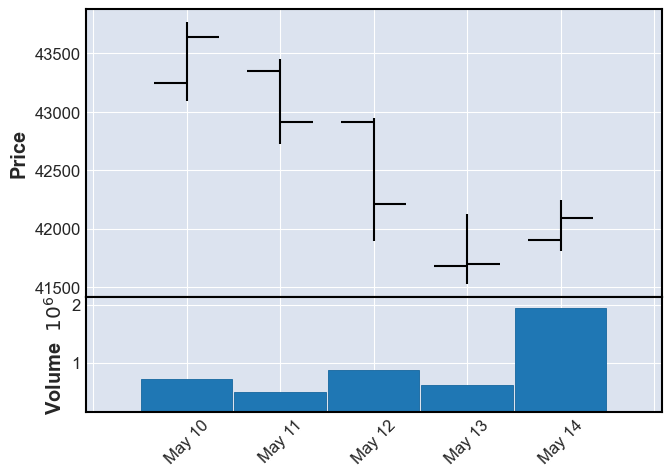

상승?0 횡보?1 하락?22
487 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2021-05-17  471934  42350  42275  41670  41925  (2021, 20)
2021-05-18  392604  42485  42000  41995  42415  (2021, 20)
2021-05-20  329393  42380  42135  42000  42280  (2021, 20)
2021-05-21  477251  42875  42485  42170  42275  (2021, 20)


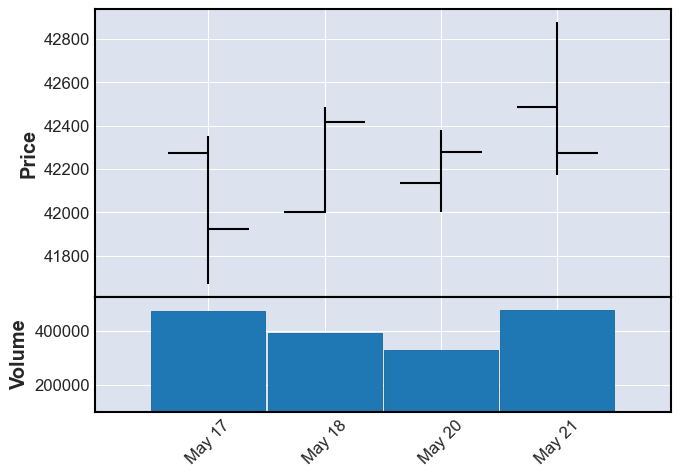

상승?0 횡보?1 하락?20
488 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2021-05-24  459819  42385  42295  42040  42150  (2021, 21)
2021-05-25  682697  42595  42320  42240  42535  (2021, 21)
2021-05-26  459007  42715  42605  42370  42445  (2021, 21)
2021-05-27  797992  42525  42455  42075  42315  (2021, 21)
2021-05-28  956442  42790  42360  42360  42620  (2021, 21)


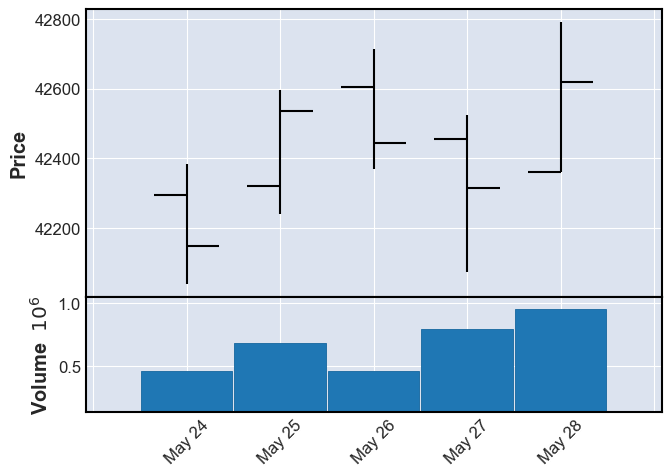

상승?0 횡보?1 하락?20
489 done
             Volume   High   Open    Low  Close         ynw
tdate                                                      
2021-05-31  1115550  42800  42710  42460  42780  (2021, 22)
2021-06-01   406661  43260  42785  42730  43035  (2021, 22)
2021-06-02  1191543  43290  43010  42950  43000  (2021, 22)
2021-06-03  2070478  43570  43085  43085  43395  (2021, 22)
2021-06-04   552166  43330  43215  42965  43230  (2021, 22)


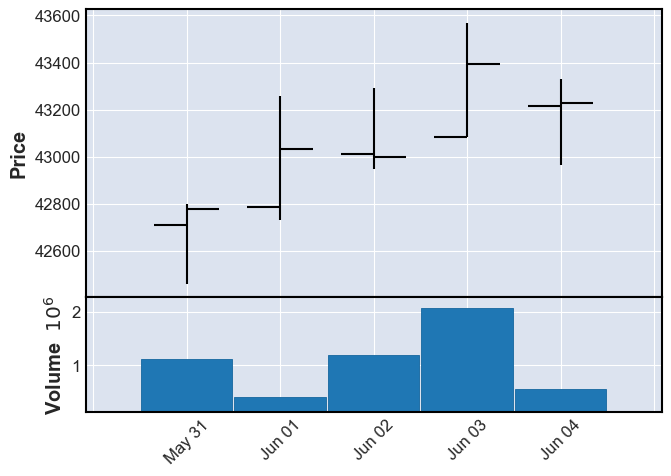

상승?0 횡보?1 하락?20
490 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2021-06-07  340791  43600  43590  43105  43395  (2021, 23)
2021-06-08  290037  43525  43395  43250  43310  (2021, 23)
2021-06-09  644153  43265  43250  42825  42825  (2021, 23)
2021-06-10  721576  43100  42835  42770  42970  (2021, 23)
2021-06-11  616507  43380  43155  43070  43260  (2021, 23)


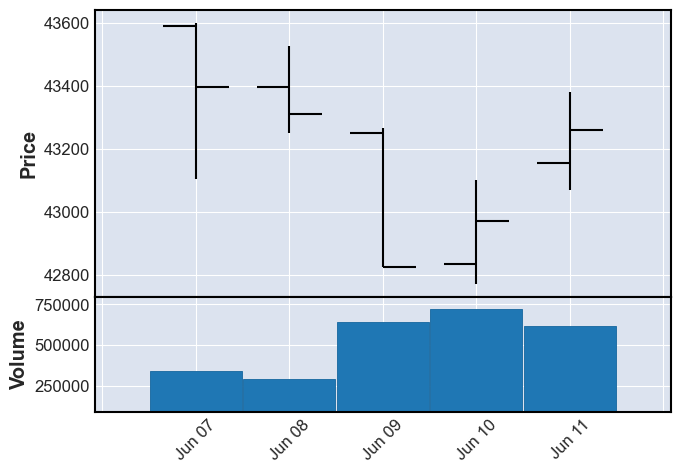

상승?0 횡보?1 하락?21
491 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2021-06-14  773303  43330  43285  43105  43255  (2021, 24)
2021-06-15  187287  43420  43265  43205  43365  (2021, 24)
2021-06-16  457993  43685  43305  43300  43625  (2021, 24)
2021-06-17  713778  43565  43500  43215  43400  (2021, 24)
2021-06-18  303514  43620  43450  43380  43495  (2021, 24)


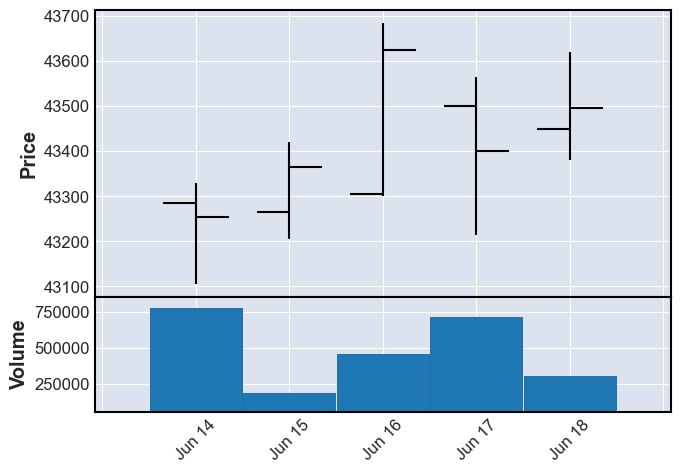

상승?0 횡보?1 하락?20
492 done
            Volume   High   Open    Low  Close         ynw
tdate                                                     
2021-06-21  780890  43240  43045  42900  43085  (2021, 25)
2021-06-22  235538  43440  43295  43260  43375  (2021, 25)
2021-06-23  767302  43670  43505  43415  43620  (2021, 25)


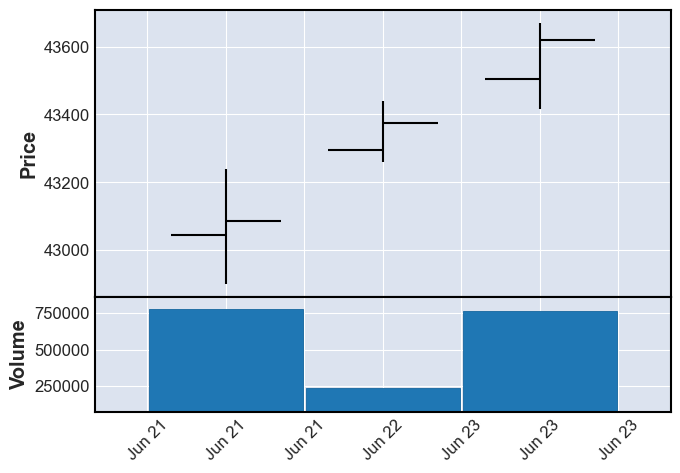

상승?0 횡보?1 하락?20
493 done


In [82]:
for i in range(234, len(weeks)):
    temp_data = tiger200_ohlcv[tiger200_ohlcv['ynw'].isin([weeks[i]])]
    print(temp_data)
    temp_graph = temp_data.iloc[:, 0:5]
    mpf.plot(temp_graph, volume=True)
    temp_val = int(input('상승?0 횡보?1 하락?2'))
    if temp_val == 4:
        break
    else:
        label.iloc[i, 2] = temp_val
        print(i, 'done')

In [84]:
label.to_csv("data label.csv", mode='w')

In [85]:
label

,0,1,012
0,2012,1,1
1,2012,2,0
2,2012,3,0
3,2012,4,0
4,2012,5,0
...,...,...,...
489,2021,21,0
490,2021,22,0
491,2021,23,1
492,2021,24,0
